# To enable GPU on Google Colab, on the top left Click Edit=>Notebook Settings and get the GPU

In [5]:
!ls

ckpt		    main.py		__pycache__
data		    metrics_manager.py	README.md
data.zip	    model		rhythm_can
drum_dataloader.py  Play&SaveWAV.ipynb	TransformerRhythm_GAN_pytorch.ipynb
img		    pretrain		weight_init.py


In [6]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '1' # only relevant to my own environment


In [2]:
!git clone https://github.com/naotokui/CreativeGAN-Rhythm.git

Cloning into 'CreativeGAN-Rhythm'...
remote: Enumerating objects: 358, done.
^Cceiving objects:  44% (158/358), 29.42 MiB | 3.92 MiB/s   


In [3]:
%cd CreativeGAN-Rhythm

[Errno 2] No such file or directory: 'CreativeGAN-Rhythm'
/home/malcolm/Desktop/RhythmGAN_pytorch


In [4]:
!wget https://www.dropbox.com/s/a8mwk8rdv08cu2l/data.zip



--2021-02-07 07:23:47--  https://www.dropbox.com/s/a8mwk8rdv08cu2l/data.zip
Resolving www.dropbox.com (www.dropbox.com)... 162.125.4.18, 2620:100:6019:18::a27d:412
Connecting to www.dropbox.com (www.dropbox.com)|162.125.4.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/a8mwk8rdv08cu2l/data.zip [following]
--2021-02-07 07:23:48--  https://www.dropbox.com/s/raw/a8mwk8rdv08cu2l/data.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uca4be492aa218f26419a05d646d.dl.dropboxusercontent.com/cd/0/inline/BIcoZOe9Z_Md4yULsdoKVgVNcrGwj9DoUm-YuRrsCkTIzM_oDO7CyAsEouxng7_KTpTYQf1h0cFrExoeTlQUPrA0SmYAV4H9SJg7CrqPsP0qNnMu4e1RO4V9ox6vHJAAzSI/file# [following]
--2021-02-07 07:23:48--  https://uca4be492aa218f26419a05d646d.dl.dropboxusercontent.com/cd/0/inline/BIcoZOe9Z_Md4yULsdoKVgVNcrGwj9DoUm-YuRrsCkTIzM_oDO7CyAsEouxng7_KTpTYQf1h0cFrExoeTlQUPrA0SmYAV4H9SJg7CrqPsP0qNnMu4e1RO4V9ox6

In [5]:
!unzip data.zip

Archive:  data.zip
   creating: data/
  inflating: data/matrices_drum_gm_clean.npz  
  inflating: data/matrices_drum_gm_clean_no_fill.npz  


In [6]:
!pip install pretty_midi


     |████████████████████████████████| 5.6MB 16.5MB/s 
     |████████████████████████████████| 61kB 10.7MB/s 
  Created wheel for pretty-midi: filename=pretty_midi-0.2.9-cp36-none-any.whl size=5591954 sha256=f5261c93ef08cff8cdfe7cd14c094f83205b0642f41fb7ac11ed54802abd38b2
  Stored in directory: /root/.cache/pip/wheels/4c/a1/c6/b5697841db1112c6e5866d75a6b6bf1bef73b874782556ba66
Successfully built pretty-midi


In [7]:
!pip install tensorboard_logger

# Testing Data

In [7]:
from tqdm import tqdm
import numpy as np
import torch
import torch.nn
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data
from torch.utils.data import SubsetRandomSampler
from torch.autograd import Variable


In [8]:
import numpy as np

matrices_onsets = np.load("./data/matrices_drum_gm_clean_no_fill.npz")['onsets']
matrices_velos = np.load("./data/matrices_drum_gm_clean_no_fill.npz")['velocities']
matrices_offsets = np.load("./data/matrices_drum_gm_clean_no_fill.npz")['offsets']
matrices_genres = np.load("./data/matrices_drum_gm_clean_no_fill.npz")['genre_ids']
matrices_drums = matrices_velos
GENRES           = np.load("./data/matrices_drum_gm_clean_no_fill.npz")['genres']
NB_GENRES = len(GENRES)

print("Genres", GENRES)
print("# of Genres", NB_GENRES)
print(matrices_onsets.shape)

Genres ['techno' 'house' 'dnb' 'jungle' 'downtempo' 'trance' 'garage' 'old_skool'
 'breakbeat']
# of Genres 9
(1686, 32, 9)


In [9]:
from rhythm_can.constants import *
from rhythm_can.utils import *
%matplotlib inline

print("DRUM_CLASSES:", DRUM_CLASSES)
print("# of drum instruments:", nb_notes)

print("dimentionality of random input z:", len_input)
print("resolution of one bar:", resolution*4) # how many grids in one bar
print("length of rhythm pattern to be generated:", len_seq, "beats" )

DRUM_CLASSES: ['Kick', 'Snare', 'Hi-hat closed', 'Hi-hat open', 'Low Tom', 'High Tom', 'Cymbal', 'Clap/Cowbell', 'Rim']
# of drum instruments: 9
dimentionality of random input z: 100
resolution of one bar: 16
length of rhythm pattern to be generated: 32 beats


#Data Loader

In [10]:
class drum_dataloader():
    def __init__(self,
                 root,
                 ):
        print("Loading post_preccessed data....")
        self.matrices_onsets = np.load(root)['onsets']
        self.matrices_velos = np.load(root)['velocities']
        self.matrices_offsets = np.load(root)['offsets']
        self.matrices_genres = np.load(root)['genre_ids'].reshape(-1,1)
        self.GENRES = np.load(root)['genres']
        print("Loading successful")
        print("X shape: ",self.matrices_velos.shape)
        print("Label shape: ",self.matrices_genres.shape)

    def __getitem__(self, index):
        drum = self.matrices_velos[index, :, :]
        label = self.matrices_genres[index,:]

        drum = torch.FloatTensor(drum)
        label = torch.LongTensor(label)

        return(drum,label) 

    def __len__(self):
        return len(self.matrices_velos)

In [11]:
drum_dataset = drum_dataloader(
        root = "./data/matrices_drum_gm_clean_no_fill.npz"
        )


Loading post_preccessed data....
Loading successful
X shape:  (1686, 32, 9)
Label shape:  (1686, 1)


# Transformer

In [12]:
from torch.nn import TransformerEncoder, TransformerEncoderLayer
import math
class PositionalEncoding(nn.Module):
    r"""Inject some information about the relative or absolute position of the tokens
        in the sequence. The positional encodings have the same dimension as
        the embeddings, so that the two can be summed. Here, we use sine and cosine
        functions of different frequencies.
    .. math::
        \text{PosEncoder}(pos, 2i) = sin(pos/10000^(2i/d_model))
        \text{PosEncoder}(pos, 2i+1) = cos(pos/10000^(2i/d_model))
        \text{where pos is the word position and i is the embed idx)
    Args:
        d_model: the embed dim (required).
        dropout: the dropout value (default=0.1).
        max_len: the max. length of the incoming sequence (default=5000).
    Examples:
        >>> pos_encoder = PositionalEncoding(d_model)
    """

    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))

        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x):
        r"""Inputs of forward function
        Args:
            x: the sequence fed to the positional encoder model (required).
        Shape:
            x: [sequence length, batch size, embed dim]
            output: [sequence length, batch size, embed dim]
        Examples:
            >>> output = pos_encoder(x)
        """
        x = x + self.pe[:x.size(0), :]
        return self.dropout(x)


class TransformerModel(nn.Module):

    def __init__(self, input_channels = 128, nhead = 4, nhid = 2048, nlayers = 3, dropout=0.5):
        super(TransformerModel, self).__init__()
        self.model_type = 'Transformer'

        self.pos_encoder = PositionalEncoding(input_channels, dropout)
        encoder_layers = TransformerEncoderLayer(input_channels, nhead, nhid, dropout)
        self.transformer_encoder = TransformerEncoder(encoder_layers, nlayers)
        self.input_channels = input_channels

        self.init_weights()

    def generate_square_subsequent_mask(self, sz):
        #sz should be length of sequence
        mask = (torch.triu(torch.ones(sz, sz)) == 1).transpose(0, 1)
        mask = mask.float().masked_fill(mask == 0, float('-inf')).masked_fill(mask == 1, float(0.0))
        return mask

    def init_weights(self):
        initrange = 0.1
        # self.decoder.bias.data.zero_()
        # self.decoder.weight.data.uniform_(-initrange, initrange)

    def forward(self, src, src_mask = None):
        #src should be [sequence length, batch size, embed dim]
        src = src * math.sqrt(self.input_channels)
        src = self.pos_encoder(src)
        output = self.transformer_encoder(src, src_mask)
        # output = self.decoder(output)
        return output

# Discriminator

In [13]:
class discriminator_good(nn.Module):
    def __init__(self,NB_GENRES = 9,len_input= 100,len_seq= 32,nb_notes=9,device = 'cuda'):
        super(discriminator, self).__init__()
        self.NB_GENRES = NB_GENRES
        self.len_input = len_input
        self.len_seq = len_seq
        self.nb_notes = nb_notes
        self.device = device

        self.embedding1 = torch.nn.Embedding(NB_GENRES,np.prod((len_seq, nb_notes)))



        self.l1 = torch.nn.Linear(18, 64)
        self.drop1 = torch.nn.Dropout(0.3)
        self.LeakyReLU1 = torch.nn.LeakyReLU(0.01)
        
        self.l2 = torch.nn.Linear(64, 128)
        self.drop2 = torch.nn.Dropout(0.3)
        self.LeakyReLU2 = torch.nn.LeakyReLU(0.01)


        # #Transformer block
        #=========================================
        self.transformer_block = TransformerModel(input_channels = 128,
                                                  nhead = 32,
                                                  nlayers = 2,dropout=0.3)
        self.transformer_out = torch.nn.Linear(128, 1)
        #=========================================

        self.l3 = torch.nn.Linear(128, 32)
        self.drop3 = torch.nn.Dropout(0.3)
        self.LeakyReLU3 = torch.nn.LeakyReLU(0.01)

        self.last = torch.nn.Linear(32, 1)


        self.sg = torch.nn.Sigmoid()


    def forward(self, x,label,has_mask = True):

        B = x.shape[0]
        label = self.embedding1(label)#(B,1)->(B,1,288)
        label = label.squeeze(1) #(B,1,288)->(B,288)
        label = label.view(B,self.len_seq, self.nb_notes)#(B,288)->(B,32,9)
        x = torch.cat([x,label],axis = 2)#(B,32,9),(B,32,9)->(B,32,18)


        x = self.l1(x)# (B,32,18) -> (B,32,64)
        x = self.LeakyReLU1(x)
        x = self.drop1(x)
        
        x = self.l2(x)#(B,32,64)->(B,32,128)
        x = self.LeakyReLU2(x)
        x = self.drop2(x)


        #Transformer block
        #=========================================
        x = x.permute(1,0,2)#(B,32,18)->(32,B,18)
        x = self.transformer_block(x)#(32,B,128)->(32,B,128)
        x = x.permute(1,0,2)#(32,B,128)->(B,32,128)
        x = x[:,-1,:].view(B,-1)#Take the last output: (B,32,128)->(B,1,128)->(B,128)
        x = self.transformer_out(x)#(32,B,128)->(32,B,1)
        #=========================================
        # x = self.l3(x)#(B,32,64)->(B,32,128)
        # x = self.LeakyReLU3(x)
        # x = self.drop3(x)
        # x = self.last(x)


        x = self.sg(x)
        return x


In [59]:
class discriminator(nn.Module):
    def __init__(self,NB_GENRES = 9,len_input= 100,len_seq= 32,nb_notes=9,device = 'cuda'):
        super(discriminator, self).__init__()
        self.NB_GENRES = NB_GENRES
        self.len_input = len_input
        self.len_seq = len_seq
        self.nb_notes = nb_notes
        self.device = device

        self.embedding_block = nn.Sequential(
        torch.nn.Embedding(NB_GENRES,np.prod((len_seq, nb_notes))))

        self.kernal_block = nn.Sequential(
        TransformerModel(input_channels = 18,nhead = 6,nlayers = 2,dropout=0.3),
        torch.nn.Linear(18, 128)
        )

        self.MLP_block = nn.Sequential(
        torch.nn.Dropout(0.3),
        torch.nn.Linear(128, 512),
        torch.nn.LeakyReLU(0.01),
        torch.nn.Dropout(0.3),
        torch.nn.Linear(512, 256),
        torch.nn.LeakyReLU(0.01),
        torch.nn.Linear(256, 1)
        )
        
        self.sg = torch.nn.Sigmoid()


    def forward(self, x,label,has_mask = True):

        B = x.shape[0]
        label = self.embedding_block(label)#(B,1)->(B,1,288)
        label = label.squeeze(1) #(B,1,288)->(B,288)
        label = label.view(B,self.len_seq, self.nb_notes)#(B,288)->(B,32,9)
        x = torch.cat([x,label],axis = 2)#(B,32,9),(B,32,9)->(B,32,18)

        
        #Transformer block
        #=========================================
        x = x.permute(1,0,2)#(B,32,18)->(32,B,18)
        x = self.kernal_block(x)#(32,B,128)->(32,B,128)
        x = x.permute(1,0,2)#(32,B,128)->(B,32,128)
        x = x[:,-1,:].view(B,-1)#Take the last output: (B,32,128)->(B,1,128)->(B,128)
        #=========================================
        x = self.MLP_block(x)

        x = self.sg(x)
        return x


# Generator

In [60]:
class generator(nn.Module):
    def __init__(self,NB_GENRES = 9,len_input= 100,len_seq= 32,nb_notes=9,batch_size = 32,device = 'cuda'):
        super(generator, self).__init__()
        self.NB_GENRES = NB_GENRES
        self.len_input = len_input
        self.len_seq = len_seq
        self.nb_notes = nb_notes
        self.device = device

        self.embedding1 = torch.nn.Embedding(NB_GENRES,len_input)        
        self.l1 = torch.nn.Linear(len_input, 512)
        self.LeakyReLU1 = torch.nn.LeakyReLU(0.2)

        self.bn1 = torch.nn.BatchNorm1d(512, momentum=0.9)
        self.l2 = torch.nn.Linear(512, 1024)
        self.bn2 = torch.nn.BatchNorm1d(1024, momentum=0.9)

        self.LeakyReLU2 = torch.nn.LeakyReLU(0.2)

        self.drop1 = torch.nn.Dropout(0.3)


        # #Transformer block
        #=========================================
        self.transformer_block = TransformerModel(input_channels = 32,
                                                  nhead = 8,
                                                  nlayers = 3,
                                                  dropout=0.3)
        self.transformer_out = torch.nn.Linear(32, 9)
        #=====================

        self.sg = torch.nn.Sigmoid() 

    def forward(self, x,label):

        B = x.shape[0]


        label = self.embedding1(label)#(B,1)->(B,1,100)

        label = label.squeeze(1)#(B,1,100)->(B,100)

        x = torch.mul(x,label)#(B,100),(B,100)->(B,100)


        x = self.l1(x) #(B,100)->(B,512)
        x = self.LeakyReLU1(x) 
        x = self.bn1(x)
        x =self.l2(x)  #(B,512) ->(B,1024)
        x =self.LeakyReLU2(x) 
        x =self.bn2(x) 
        
        x = x.view(B,32,32)#(B,1024) ->(B,32,32)
        
        x = self.drop1(x) 

        #Transformer block
        # #=========================================
        x = x.permute(1,0,2)#(B,32,32)->(32,B,32)
        # src_mask = self.transformer_block.generate_square_subsequent_mask(len(x)).to(self.device)
        x = self.transformer_block(x)#(32,B,32)->(32,B,32)
        x = x.permute(1,0,2)#(32,B,32)->(B,32,32)
        x = self.transformer_out(x)
        # #=========================================
        x = self.sg(x) 

        return x

# Utility




In [61]:
from math import log10

class metrics_manager(object):
	def __init__(self,name_list = ['miou']):
		self.metrics_dict={}
		for name in name_list:
			self.metrics_dict[name] = AverageMeter()
	def add_metrics(self,name_list):
		for name in name_list:
			self.metrics_dict[name] = AverageMeter()
	def update(self,name,value):
		self.metrics_dict[name].update(value)
	def reset(self):
		for name in self.metrics_dict:
			self.metrics_dict[name].reset()
	def return_metrics(self):
		return(self.metrics_dict)
	def summary(self):
		summery_dict={}
		for name in self.metrics_dict: 
			summery_dict[name]=self.metrics_dict[name].avg
		return(summery_dict)

def PSNR(mse, peak=1.):
	return 10 * log10((peak ** 2) / mse)

class AverageMeter(object):
	"""Computes and stores the average and current value"""

	def __init__(self):
		self.reset()

	def reset(self):
		self.val = 0
		self.avg = 0
		self.sum = 0
		self.count = 0

	def update(self, val, n=1):
		self.val = val
		self.sum += val * n
		self.count += n
		self.avg = self.sum / self.count

In [62]:
metrics_list = ['discriminator_loss','generator_loss']
manager_train = metrics_manager(metrics_list)

# Training

In [63]:
train_d = True
train_g = True
opt = {}
device = 'cuda'
# device = 'cpu'
K_unrolled_d = 5
K_unrolled_g = 1
batch_size = 50
MAX_LOSS_RATIO = 2
MAX_EPOCH = 1000

In [64]:


train_loader = torch.utils.data.DataLoader(
        drum_dataset,
        batch_size=batch_size,
        pin_memory=True,
        drop_last=True,
        num_workers=32)


# train_sampler = SubsetRandomSampler(range(1686))
# train_loader = torch.utils.data.DataLoader(
#         drum_dataset,
#         batch_size=batch_size,
#         sampler=train_sampler,
#         pin_memory=True,
#         drop_last=True,
#         num_workers=32)

In [65]:
f_loss = torch.nn.BCELoss().to(device)
# f_loss = torch.nn.CrossEntropyLoss().to(device)


epoch: 0
m_d_loss: 0.6136527513082212     m_g_loss: 1.1140699350472651


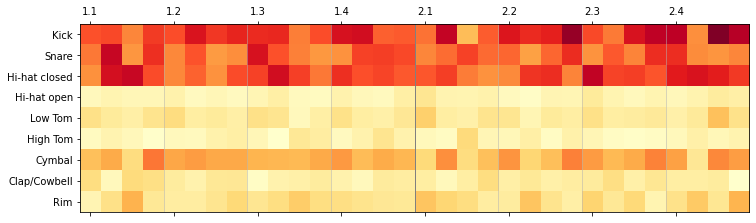

epoch: 1
m_d_loss: 0.6190825269772456     m_g_loss: 1.2159403165181477


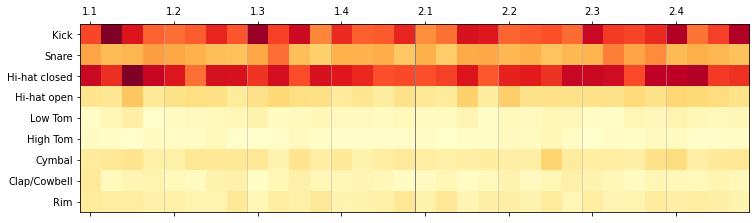

epoch: 2
m_d_loss: 0.6638072920568061     m_g_loss: 0.9250982277321093


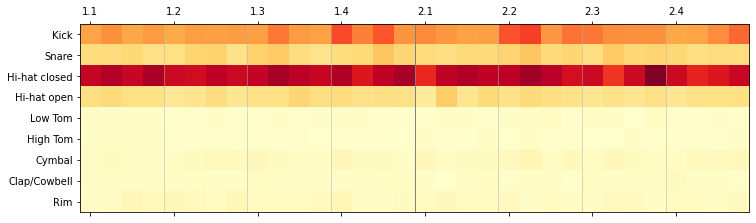

epoch: 3
m_d_loss: 0.6613762469002696     m_g_loss: 0.9192688392870354


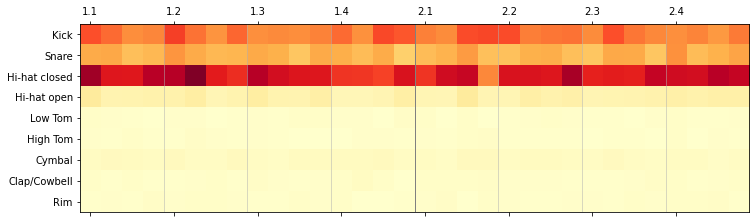

epoch: 4
m_d_loss: 0.649737018888647     m_g_loss: 0.9506095629749876


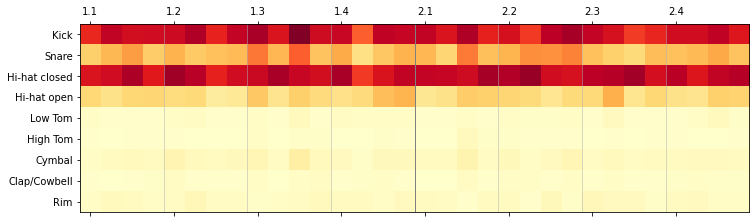

epoch: 5
m_d_loss: 0.6417910164052791     m_g_loss: 0.990982964183345


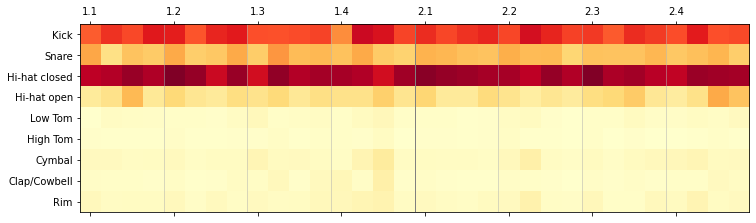

epoch: 6
m_d_loss: 0.6311748974251026     m_g_loss: 1.011885946447199


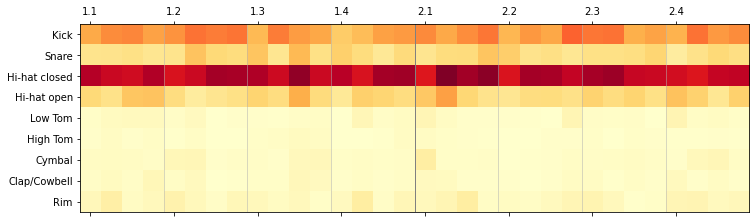

epoch: 7
m_d_loss: 0.6090582864625114     m_g_loss: 1.0939437638629566


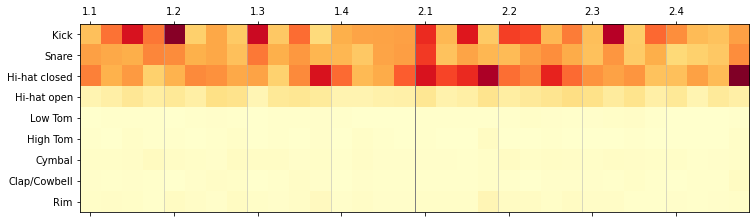

epoch: 8
m_d_loss: 0.5847227218747139     m_g_loss: 1.3193589485052861


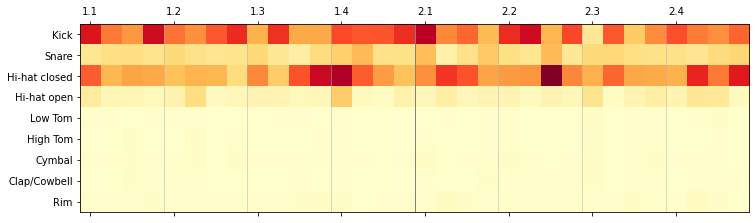

epoch: 9
m_d_loss: 0.5715411267497323     m_g_loss: 1.329845509745858


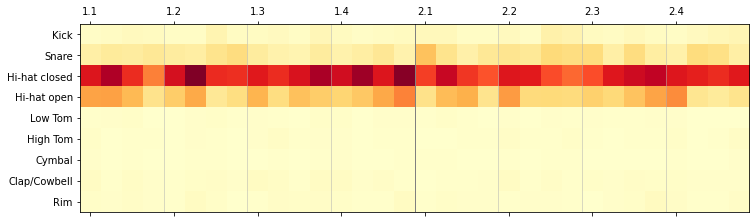

epoch: 10
m_d_loss: 0.5322022949394427     m_g_loss: 1.4966551480871257


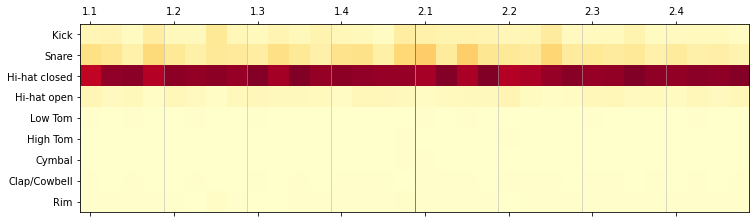

epoch: 11
m_d_loss: 0.508172937000499     m_g_loss: 1.7111719304865056


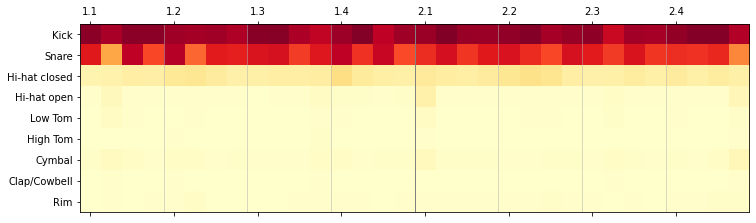

epoch: 12
m_d_loss: 0.5736586221626826     m_g_loss: 1.6719782731749795


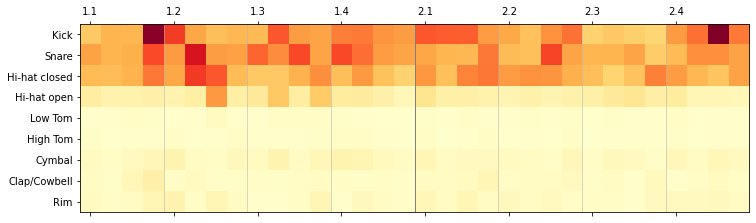

epoch: 13
m_d_loss: 0.5447305939414284     m_g_loss: 1.3532216892097935


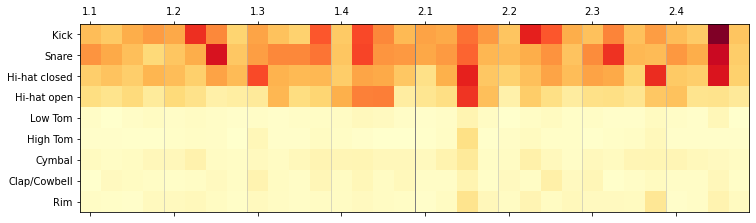

epoch: 14
m_d_loss: 0.47670968472957614     m_g_loss: 1.9445953983249087


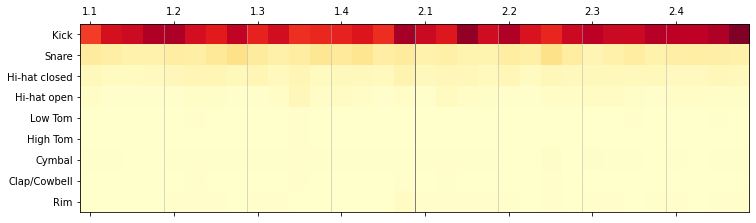

epoch: 15
m_d_loss: 0.47623481960857617     m_g_loss: 1.8826598543109316


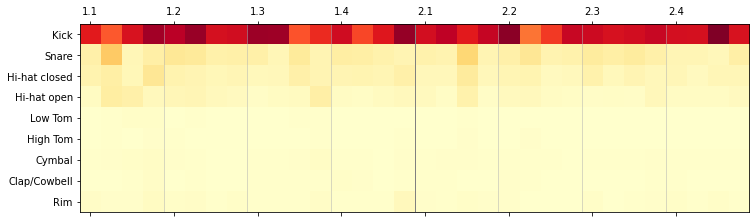

epoch: 16
m_d_loss: 0.4594553932547569     m_g_loss: 1.8830587213689631


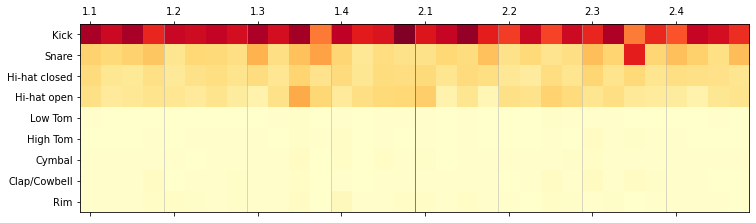

epoch: 17
m_d_loss: 0.45110350952428935     m_g_loss: 2.0061647603006074


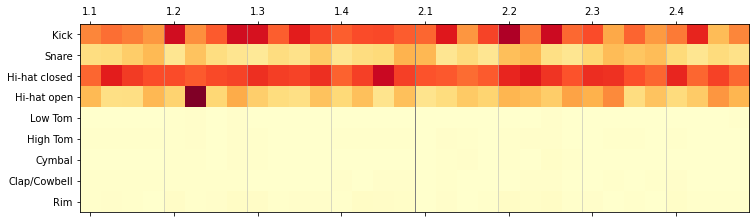

epoch: 18
m_d_loss: 0.4746362410485745     m_g_loss: 1.830121484669772


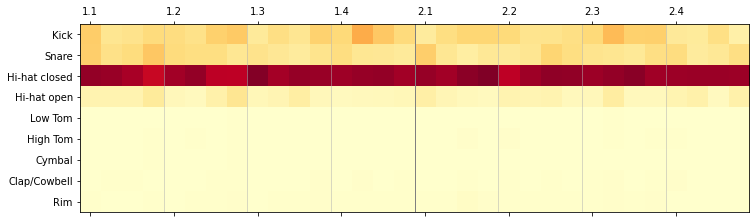

epoch: 19
m_d_loss: 0.3873886409927817     m_g_loss: 2.4051537441484854


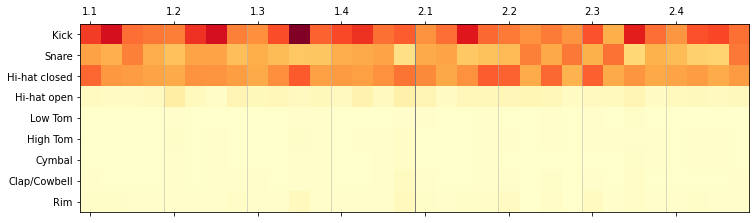

epoch: 20
m_d_loss: 0.41687665916979316     m_g_loss: 2.1428553624586626


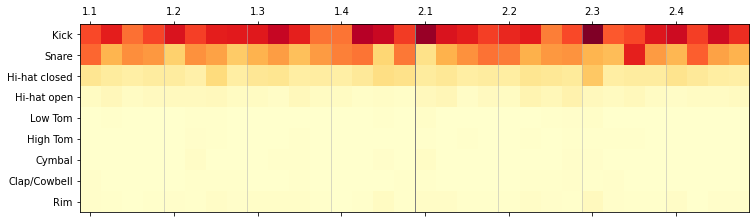

epoch: 21
m_d_loss: 0.3549515920526841     m_g_loss: 2.811153036175352


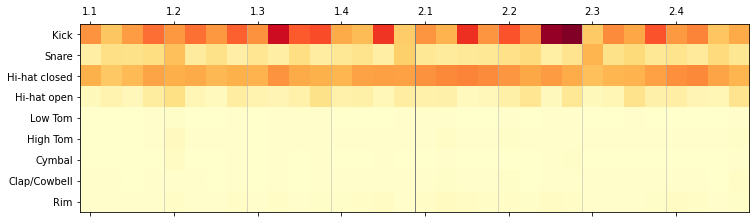

epoch: 22
m_d_loss: 0.3561497531831265     m_g_loss: 2.8434693668827866


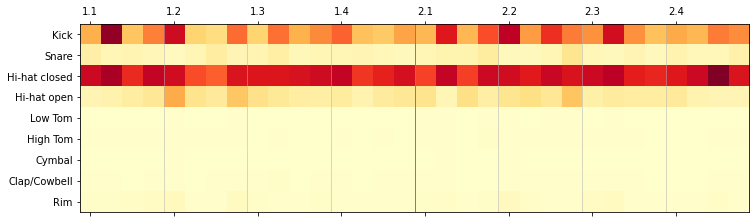

epoch: 23
m_d_loss: 0.34550251329646386     m_g_loss: 2.884749853249752


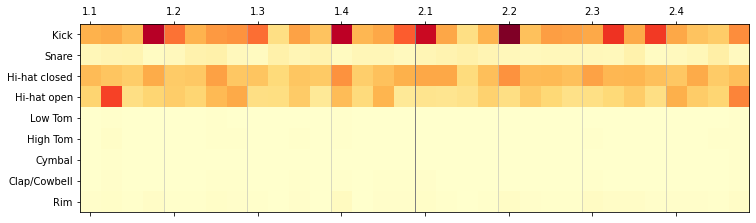

epoch: 24
m_d_loss: 0.33237069994211194     m_g_loss: 3.1187864072395093


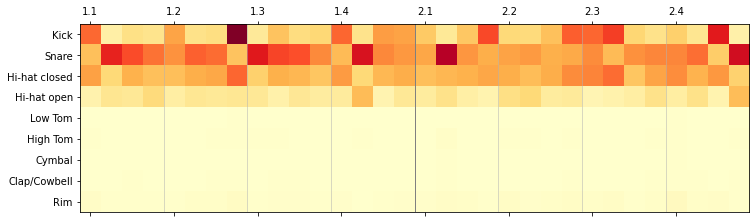

epoch: 25
m_d_loss: 0.376897162549636     m_g_loss: 2.749452424771858


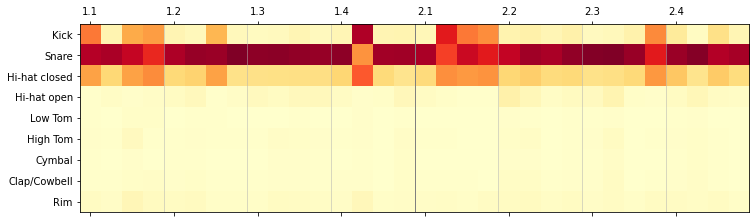

epoch: 26
m_d_loss: 0.45499013625085355     m_g_loss: 2.4265935890602344


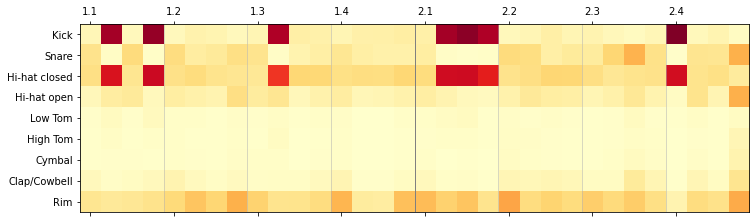

epoch: 27
m_d_loss: 0.5734773067867055     m_g_loss: 1.4765108679280137


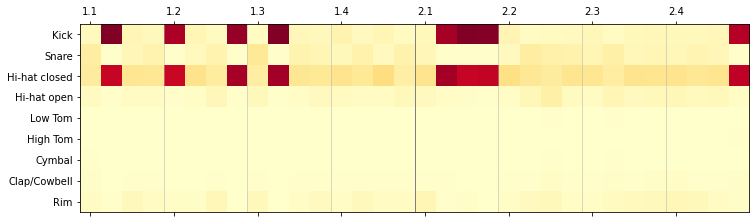

epoch: 28
m_d_loss: 0.5551742527633906     m_g_loss: 1.4009513565988252


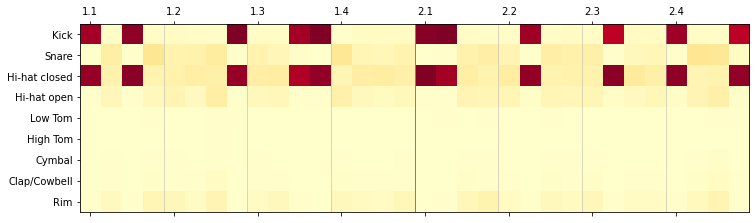

epoch: 29
m_d_loss: 0.5579642302849713     m_g_loss: 1.4312418229652173


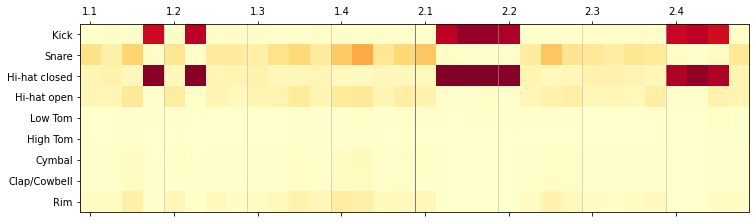

epoch: 30
m_d_loss: 0.541485795751214     m_g_loss: 1.4584944320447517


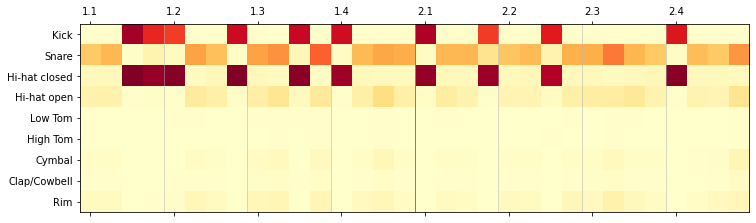

epoch: 31
m_d_loss: 0.5569848390186534     m_g_loss: 1.4209697860659976


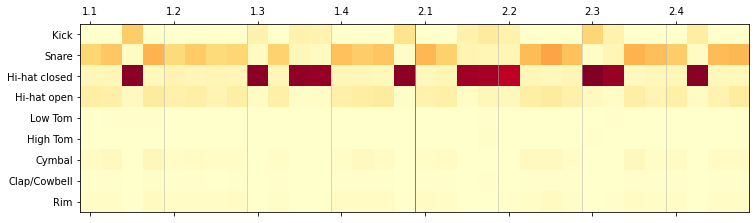

epoch: 32
m_d_loss: 0.48571382947266106     m_g_loss: 1.7865333412632798


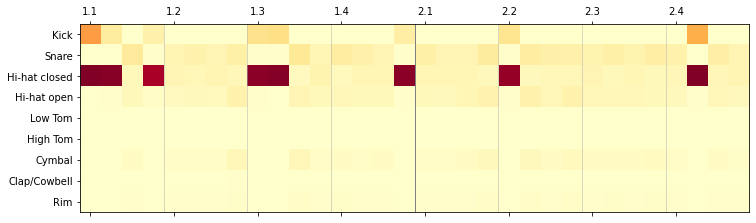

epoch: 33
m_d_loss: 0.5311712818987229     m_g_loss: 1.6177775498592493


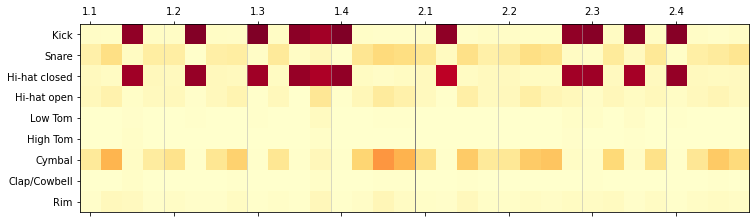

epoch: 34
m_d_loss: 0.5040358014404774     m_g_loss: 1.6670358686736135


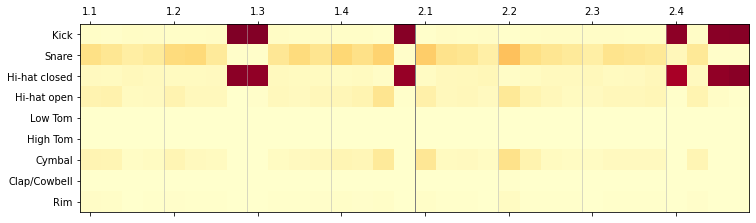

epoch: 35
m_d_loss: 0.4865883679950938     m_g_loss: 1.8227684461709224


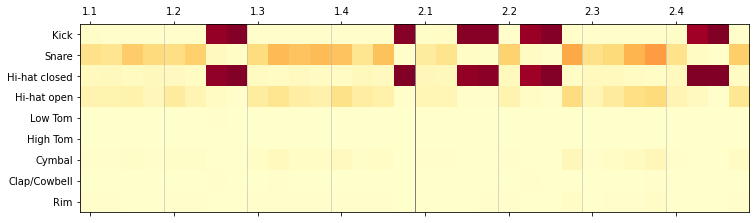

epoch: 36
m_d_loss: 0.4587952423840761     m_g_loss: 1.9721897226391416


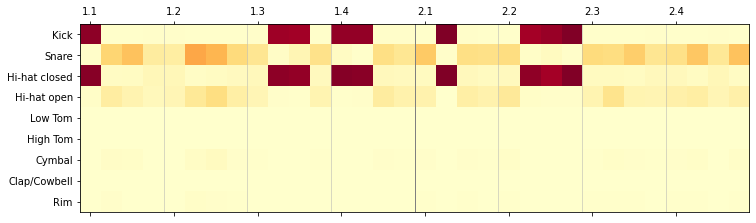

epoch: 37
m_d_loss: 0.4332233001204098     m_g_loss: 2.132327105059768


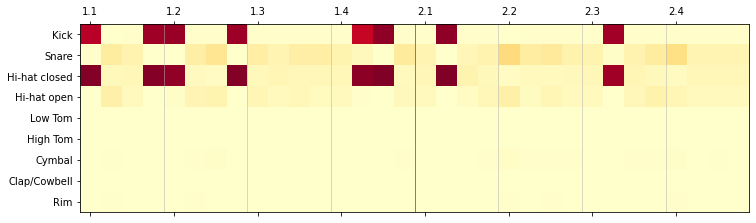

epoch: 38
m_d_loss: 0.42023298777639867     m_g_loss: 2.2088832457860312


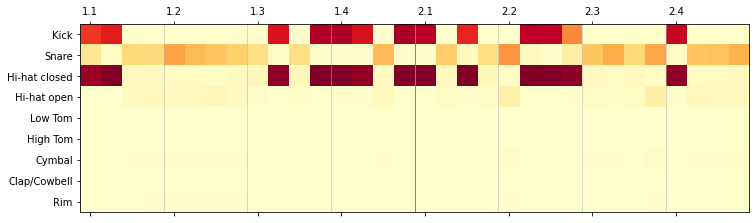

epoch: 39
m_d_loss: 0.42390948113273175     m_g_loss: 2.333063822804075


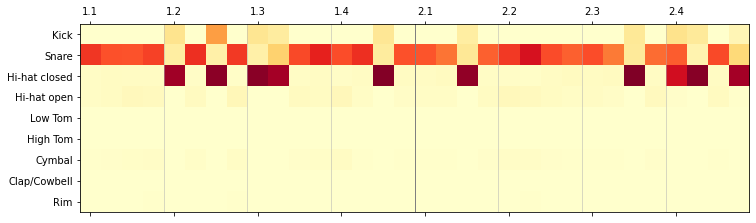

epoch: 40
m_d_loss: 0.38143112324178224     m_g_loss: 2.6118599573771157


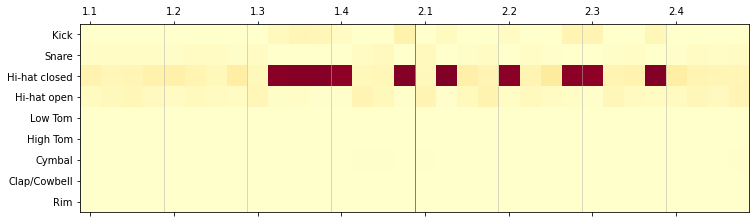

epoch: 41
m_d_loss: 0.28337899358833535     m_g_loss: 3.5287655917080967


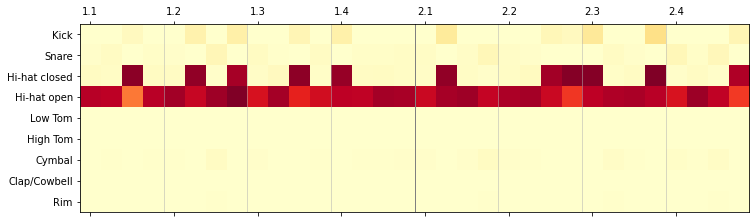

epoch: 42
m_d_loss: 0.30995545350015163     m_g_loss: 3.6805564273487437


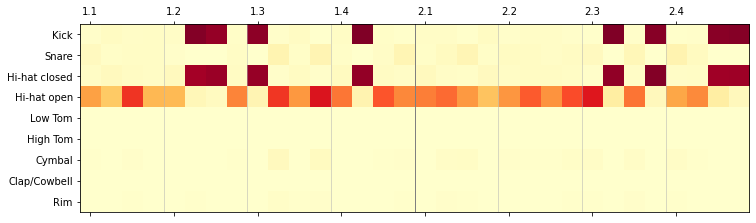

epoch: 43
m_d_loss: 0.3974721575484556     m_g_loss: 2.462690801331491


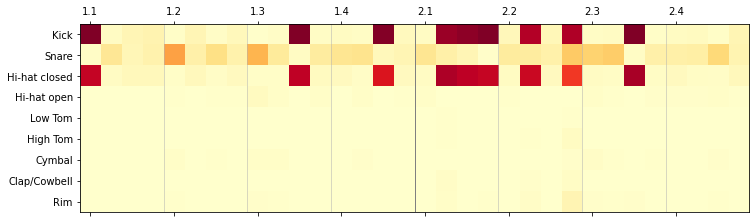

epoch: 44
m_d_loss: 0.4021132394671441     m_g_loss: 2.305183175838355


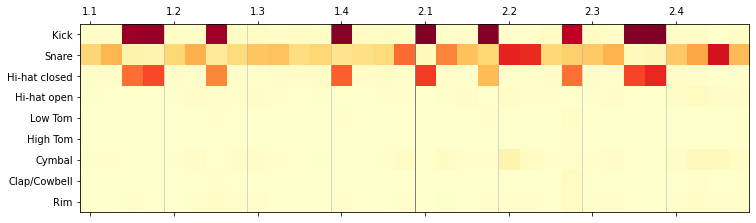

epoch: 45
m_d_loss: 0.361384510643342     m_g_loss: 2.8036084753094297


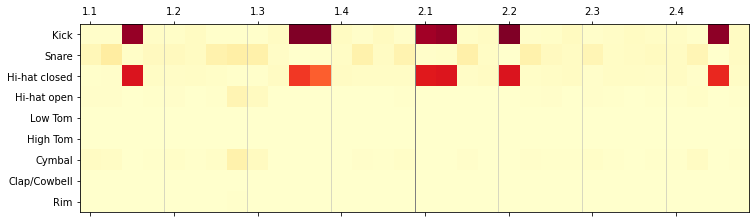

epoch: 46
m_d_loss: 0.35225307438522574     m_g_loss: 2.7930142590493867


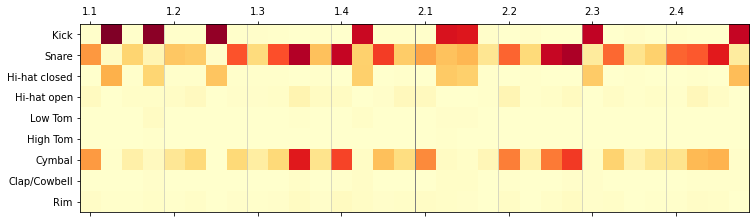

epoch: 47
m_d_loss: 0.3277617075864007     m_g_loss: 2.9171386126315957


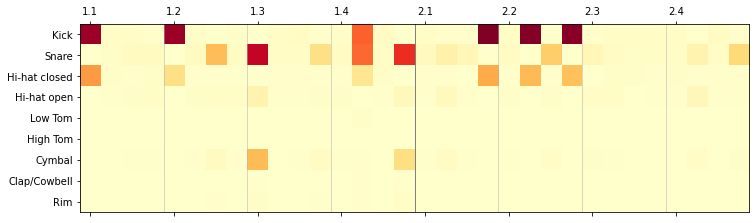

epoch: 48
m_d_loss: 0.3385011080652476     m_g_loss: 2.829071875774499


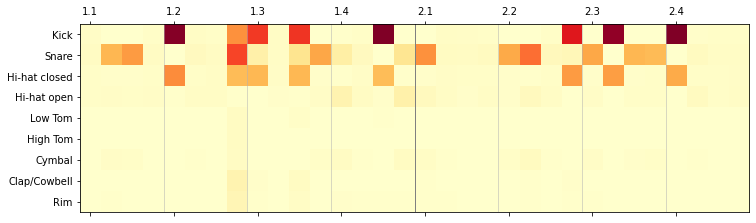

epoch: 49
m_d_loss: 0.3781362088287577     m_g_loss: 2.66341448913921


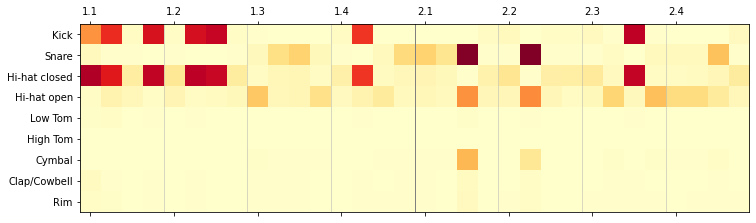

epoch: 50
m_d_loss: 0.4768521800637245     m_g_loss: 1.9590724020293264


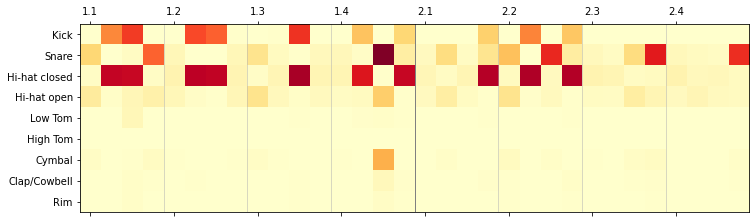

epoch: 51
m_d_loss: 0.4610266664448906     m_g_loss: 2.040127598878109


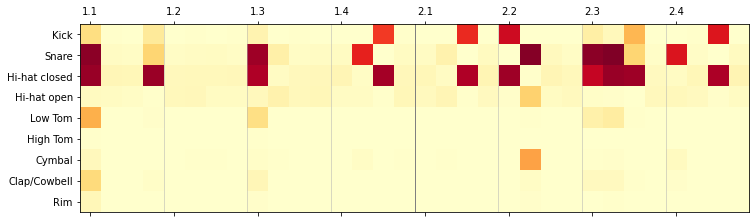

epoch: 52
m_d_loss: 0.46727718897163867     m_g_loss: 1.9906454266923848


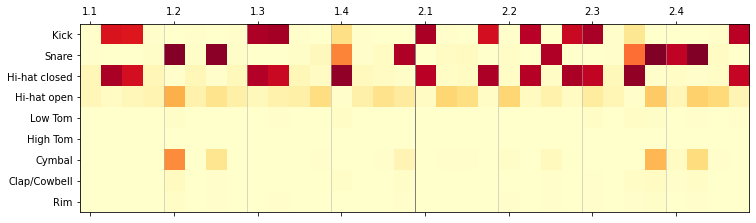

epoch: 53
m_d_loss: 0.4733944805229412     m_g_loss: 1.9818441036975745


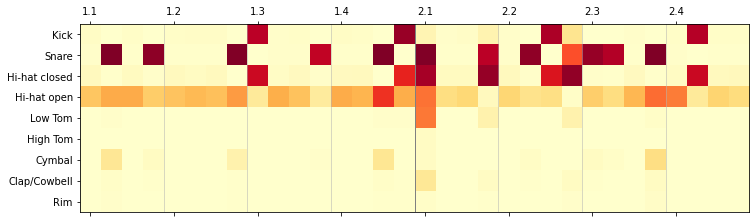

epoch: 54
m_d_loss: 0.46900748722255237     m_g_loss: 1.9307384129726526


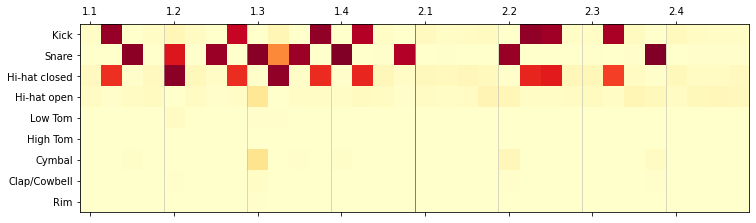

epoch: 55
m_d_loss: 0.4690339484635522     m_g_loss: 1.980002117879463


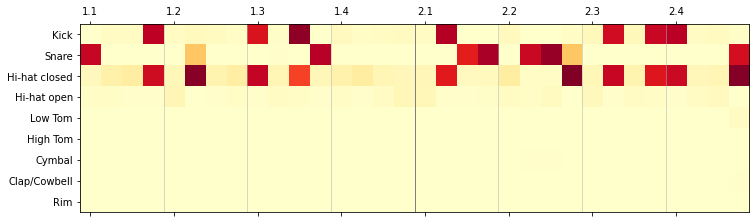

epoch: 56
m_d_loss: 0.46153725013136865     m_g_loss: 1.9749107974948306


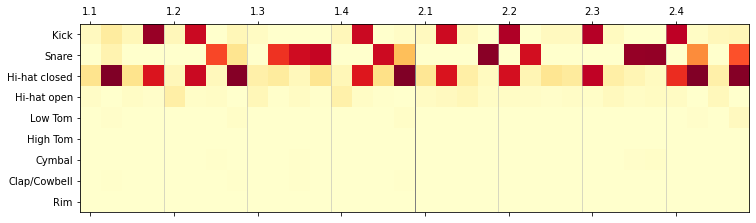

epoch: 57
m_d_loss: 0.46140990327386294     m_g_loss: 2.01578375787446


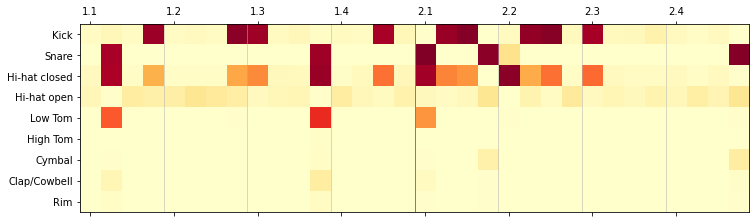

epoch: 58
m_d_loss: 0.4426451701670886     m_g_loss: 2.0490415565895312


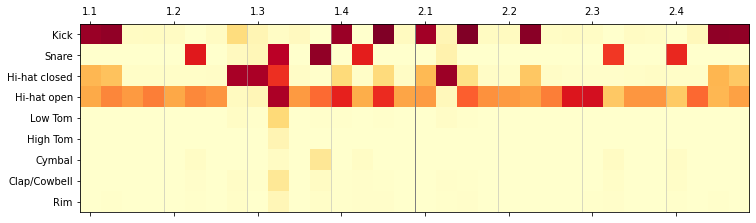

epoch: 59
m_d_loss: 0.42718537029098075     m_g_loss: 2.201243870186083


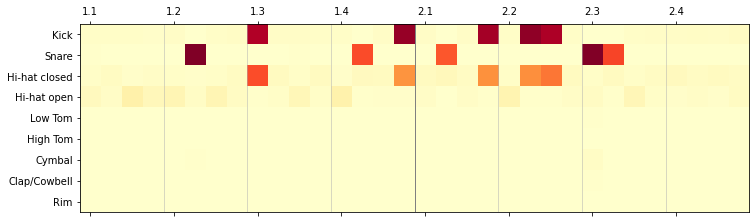

epoch: 60
m_d_loss: 0.4808617014437914     m_g_loss: 1.8450599366968328


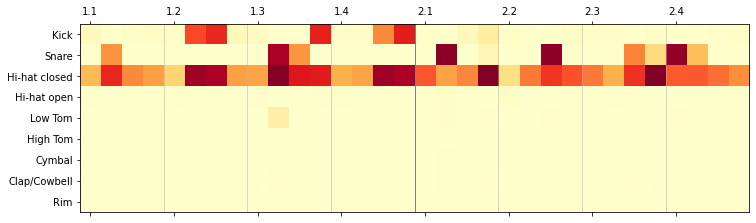

epoch: 61
m_d_loss: 0.47027365004315097     m_g_loss: 2.0087446263342192


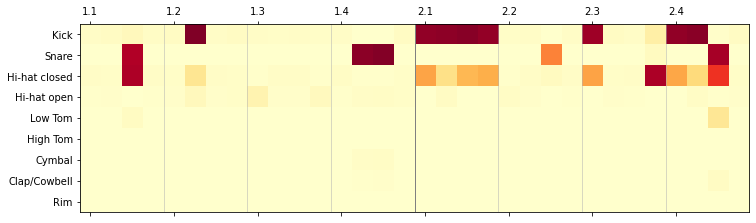

epoch: 62
m_d_loss: 0.4157904986292123     m_g_loss: 2.0798725973476064


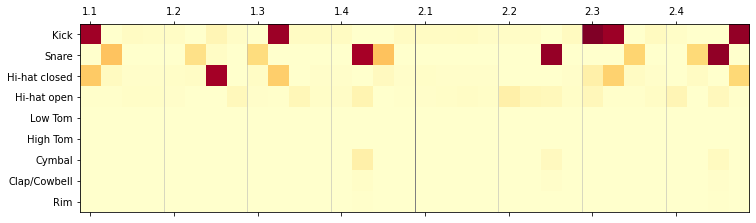

epoch: 63
m_d_loss: 0.4055101240382475     m_g_loss: 2.3093505917173442


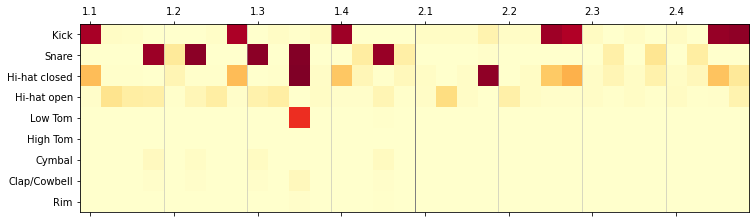

epoch: 64
m_d_loss: 0.4067828156054019     m_g_loss: 2.305293877919515


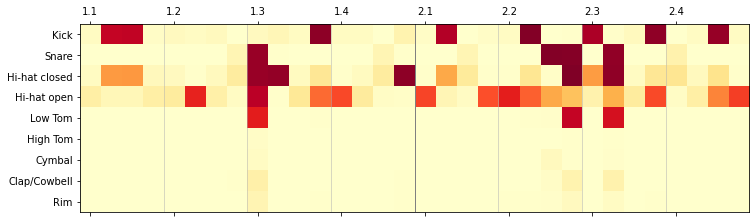

epoch: 65
m_d_loss: 0.4661033549729516     m_g_loss: 1.9844384301792493


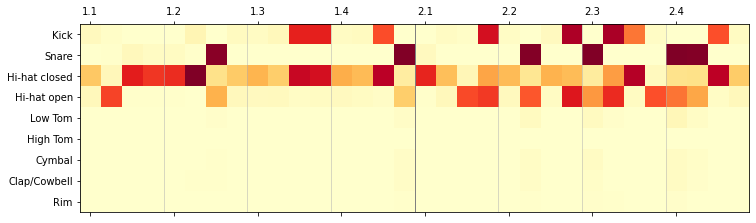

epoch: 66
m_d_loss: 0.4769601330161094     m_g_loss: 1.8551698164506392


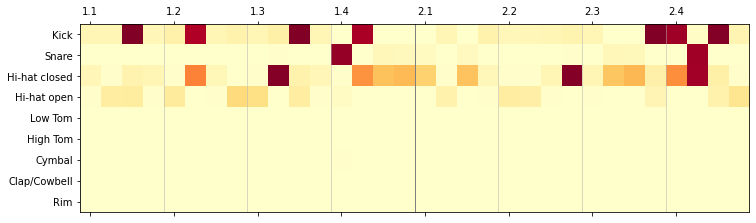

epoch: 67
m_d_loss: 0.502454545918633     m_g_loss: 1.69273866667892


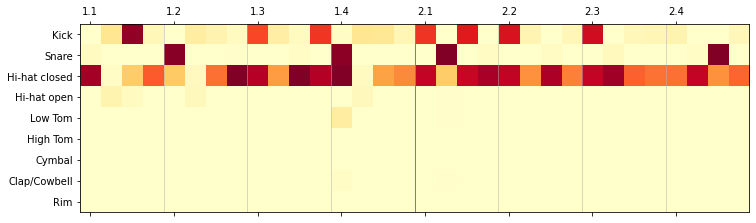

epoch: 68
m_d_loss: 0.499021328240633     m_g_loss: 1.7488395336902502


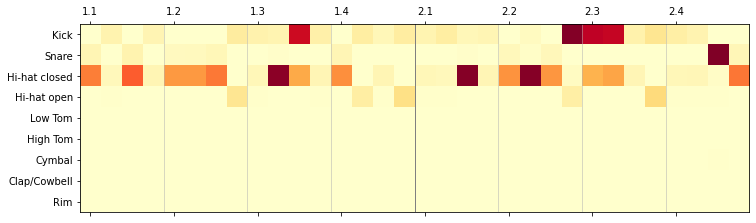

epoch: 69
m_d_loss: 0.4813525255988627     m_g_loss: 1.7950958410898845


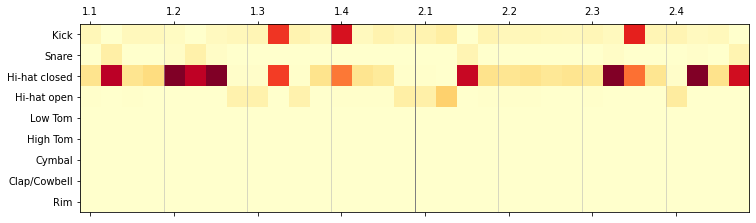

epoch: 70
m_d_loss: 0.49702156968414785     m_g_loss: 1.7943015929424402


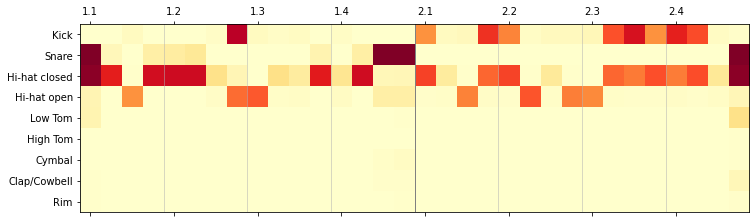

epoch: 71
m_d_loss: 0.5100424689405104     m_g_loss: 1.6571788787841797


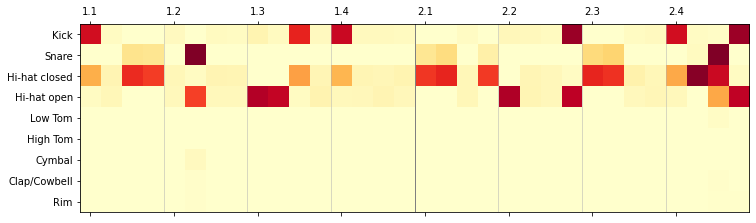

epoch: 72
m_d_loss: 0.5021229565143586     m_g_loss: 1.6619761568127256


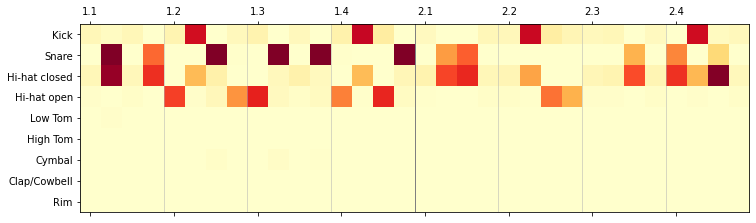

epoch: 73
m_d_loss: 0.5318624969790963     m_g_loss: 1.5213155710335933


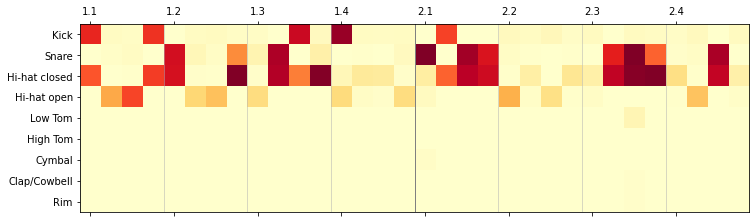

epoch: 74
m_d_loss: 0.5029340844601393     m_g_loss: 1.6622750650752673


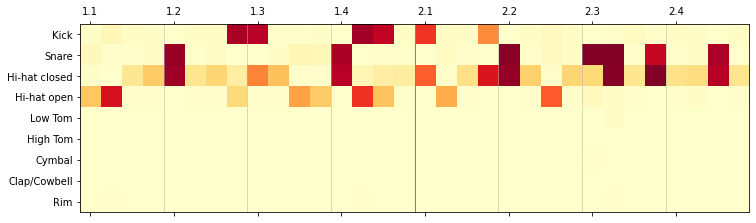

epoch: 75
m_d_loss: 0.48839504262980293     m_g_loss: 1.8523784550753506


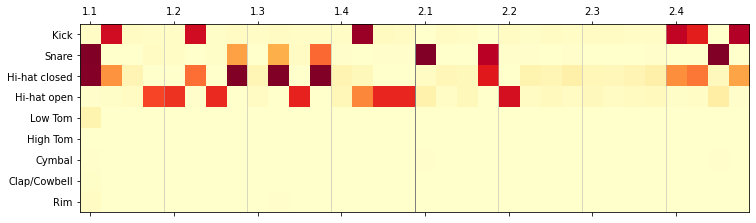

epoch: 76
m_d_loss: 0.487350058928132     m_g_loss: 1.9152873754501343


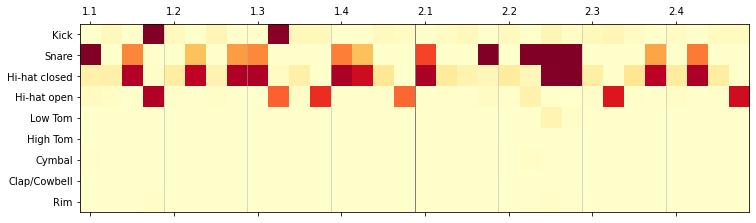

epoch: 77
m_d_loss: 0.5087677650591905     m_g_loss: 1.7463402964852073


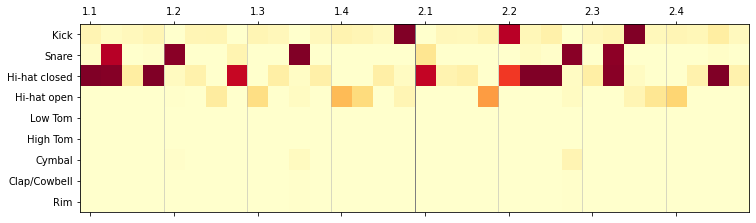

epoch: 78
m_d_loss: 0.5204221814870834     m_g_loss: 1.6435962626428315


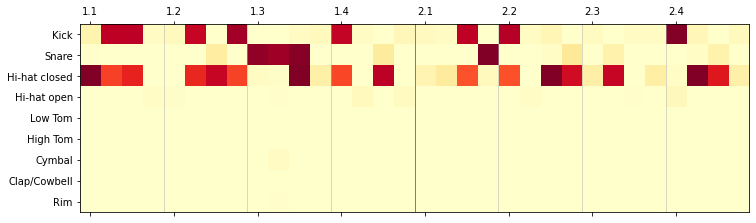

epoch: 79
m_d_loss: 0.4914737361318925     m_g_loss: 1.7883902137929744


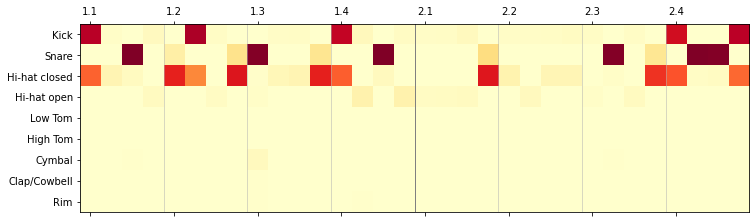

epoch: 80
m_d_loss: 0.4732703149318695     m_g_loss: 1.845768715396072


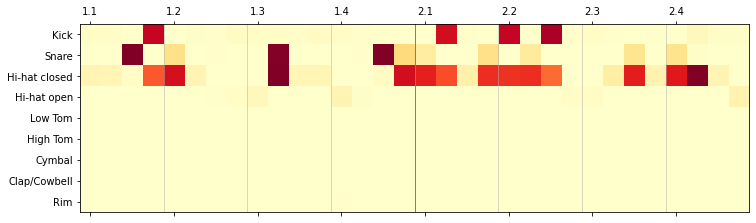

epoch: 81
m_d_loss: 0.449159297872992     m_g_loss: 2.1526647553299414


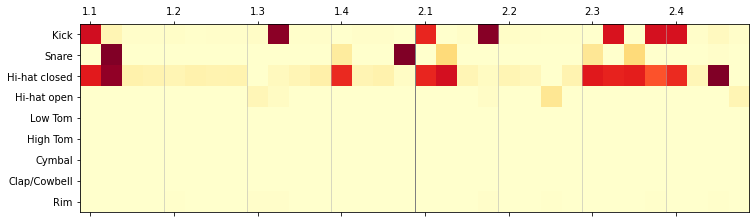

epoch: 82
m_d_loss: 0.4653032168745995     m_g_loss: 2.0716085289463853


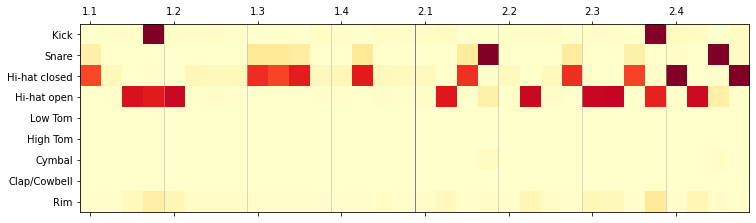

epoch: 83
m_d_loss: 0.5197949171066284     m_g_loss: 1.5879098538196448


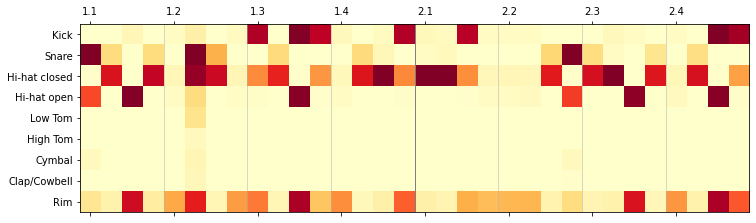

epoch: 84
m_d_loss: 0.4748329665511846     m_g_loss: 1.9492190570542307


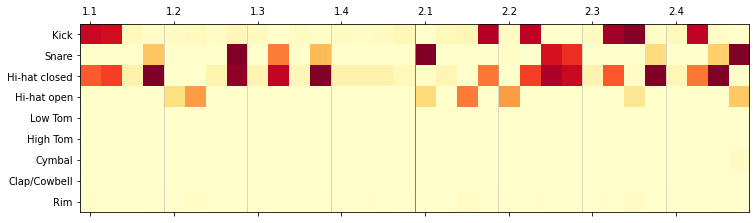

epoch: 85
m_d_loss: 0.4939165210022645     m_g_loss: 1.710979208801732


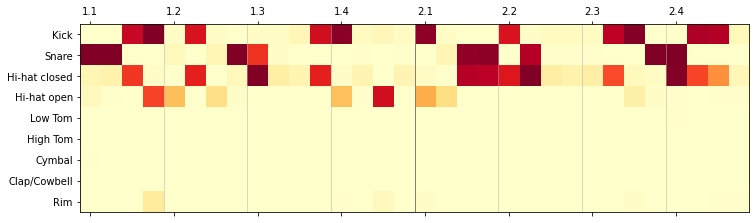

epoch: 86
m_d_loss: 0.4734344888478517     m_g_loss: 1.9900553587711218


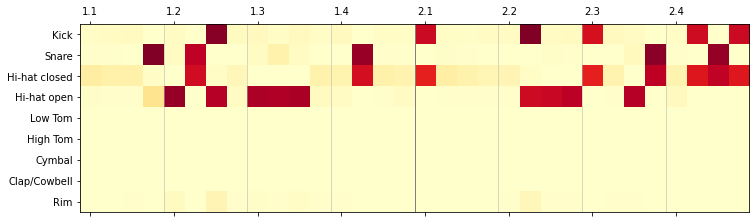

epoch: 87
m_d_loss: 0.449676849561579     m_g_loss: 2.1490523453914756


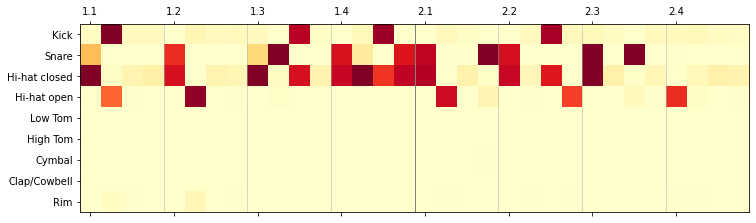

epoch: 88
m_d_loss: 0.47609023638069625     m_g_loss: 2.0020748954830747


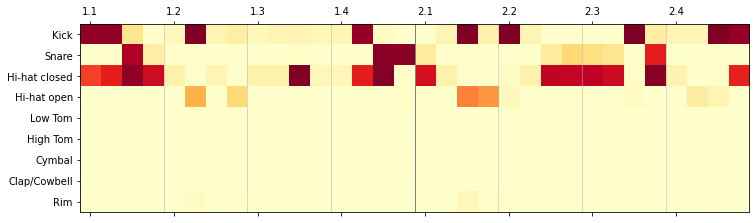

epoch: 89
m_d_loss: 0.47584629549699664     m_g_loss: 1.9582910935084026


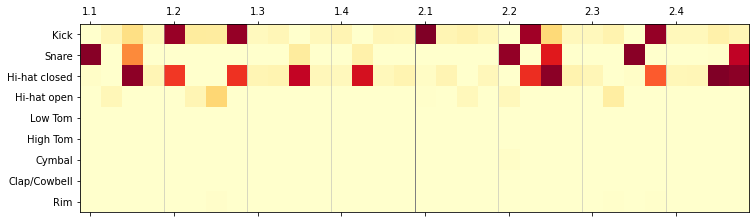

epoch: 90
m_d_loss: 0.45560788661241536     m_g_loss: 2.030050115151839


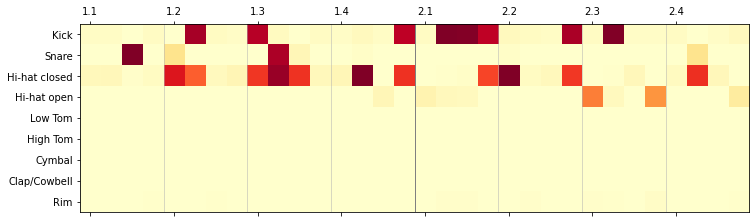

epoch: 91
m_d_loss: 0.4617774048272302     m_g_loss: 2.002235076644204


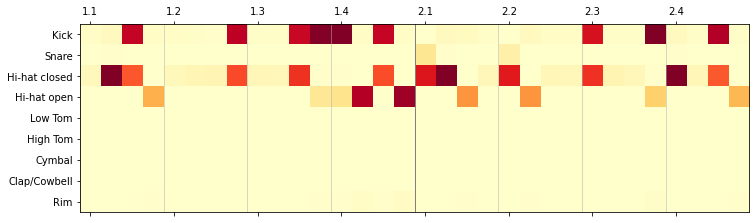

epoch: 92
m_d_loss: 0.4611556325107813     m_g_loss: 2.037052754199866


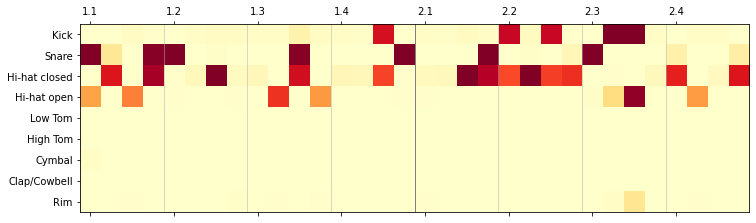

epoch: 93
m_d_loss: 0.4540757035507875     m_g_loss: 2.1652904098684136


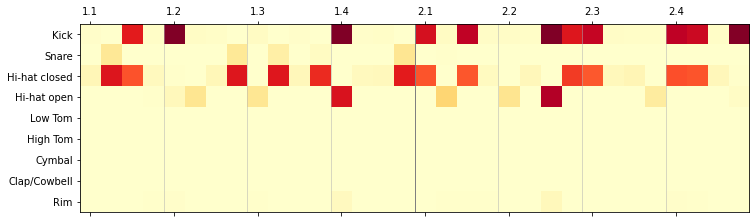

epoch: 94
m_d_loss: 0.46404166333377356     m_g_loss: 1.9647435238867095


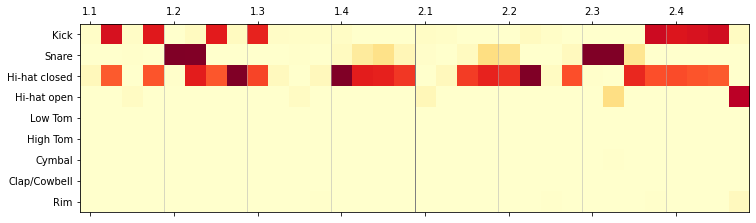

epoch: 95
m_d_loss: 0.4628660899751327     m_g_loss: 2.0693640275435015


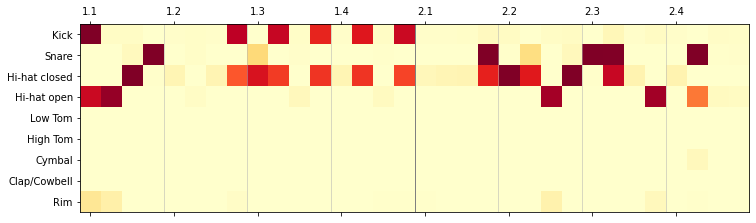

epoch: 96
m_d_loss: 0.45228894911706446     m_g_loss: 2.0356079159360942


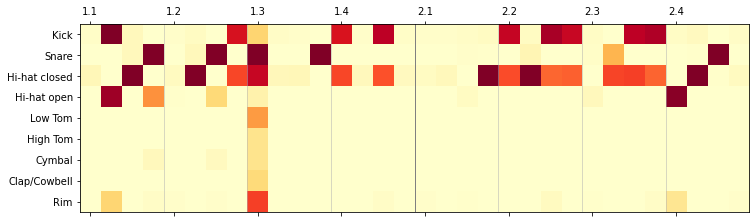

epoch: 97
m_d_loss: 0.4541963763096753     m_g_loss: 2.090848142450506


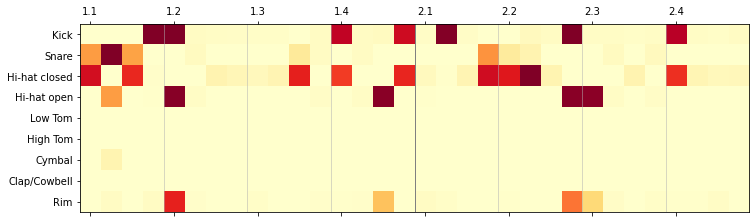

epoch: 98
m_d_loss: 0.4550415780395269     m_g_loss: 2.106484900821339


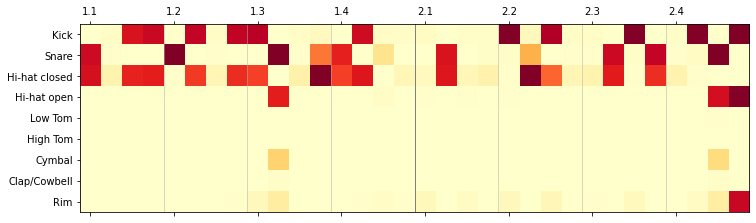

epoch: 99
m_d_loss: 0.4542130638571346     m_g_loss: 2.09597909450531


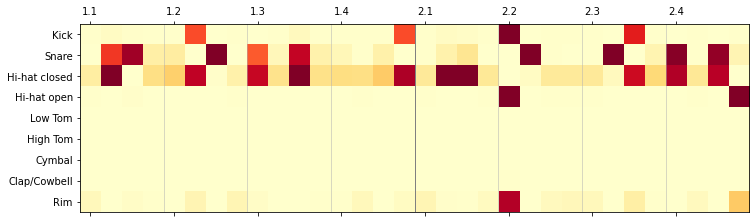

epoch: 100
m_d_loss: 0.42153994590044025     m_g_loss: 2.317838126962835


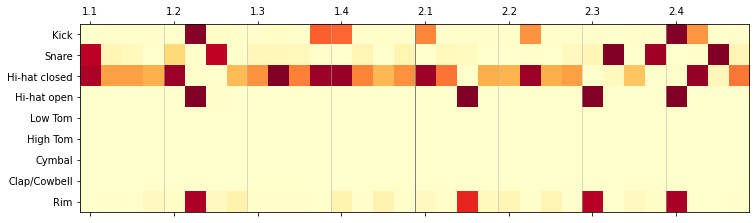

epoch: 101
m_d_loss: 0.3906985402107239     m_g_loss: 2.522339828086622


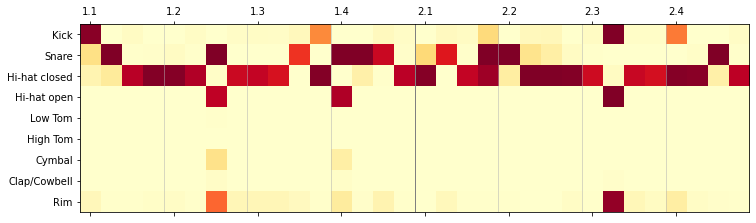

epoch: 102
m_d_loss: 0.38701614439487453     m_g_loss: 2.613496426380042


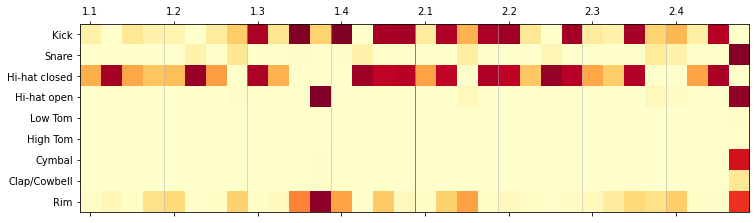

epoch: 103
m_d_loss: 0.5227666153627284     m_g_loss: 1.7863333983854814


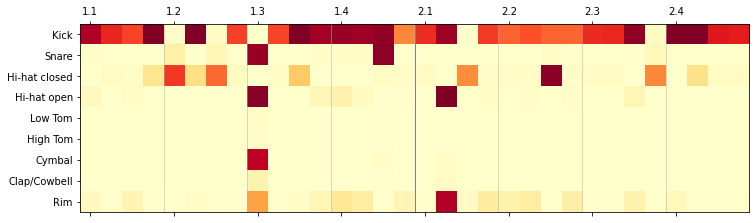

epoch: 104
m_d_loss: 0.41380945630371574     m_g_loss: 2.382541381951534


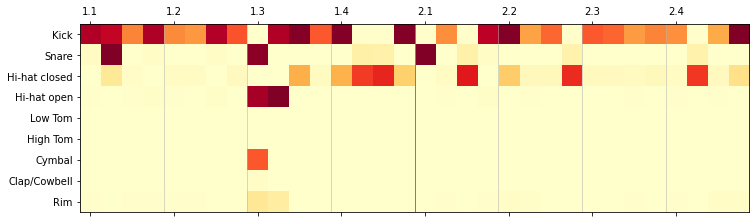

epoch: 105
m_d_loss: 0.41726229015518634     m_g_loss: 2.509714505889199


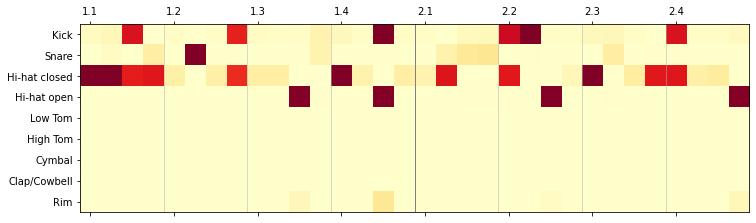

epoch: 106
m_d_loss: 0.4553853429853916     m_g_loss: 2.1251108104532417


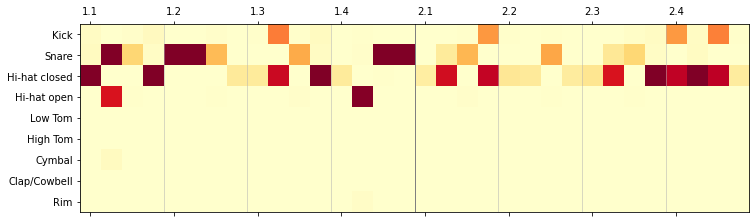

epoch: 107
m_d_loss: 0.45420969759716706     m_g_loss: 2.0928771965431445


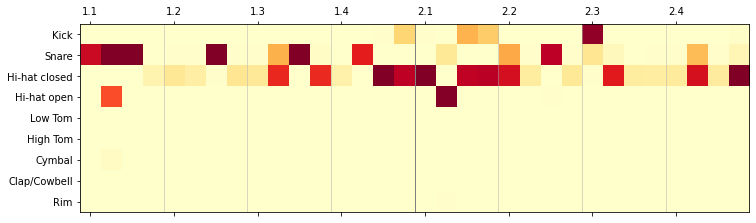

epoch: 108
m_d_loss: 0.4423929877579212     m_g_loss: 2.0910613789702905


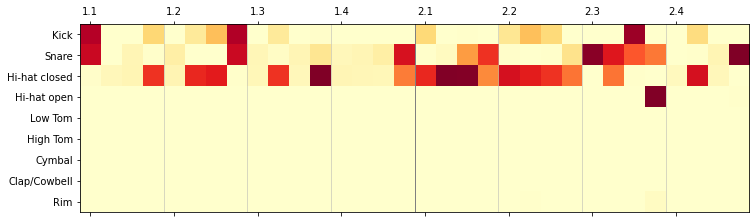

epoch: 109
m_d_loss: 0.4067839163191178     m_g_loss: 2.440491860563105


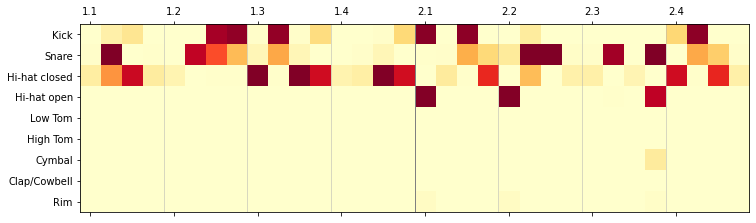

epoch: 110
m_d_loss: 0.4084484830498695     m_g_loss: 2.4225116859782827


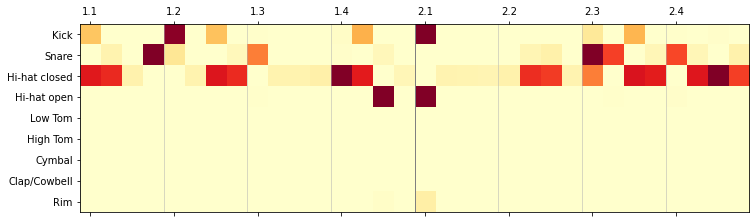

epoch: 111
m_d_loss: 0.42893282665925864     m_g_loss: 2.3606511715686684


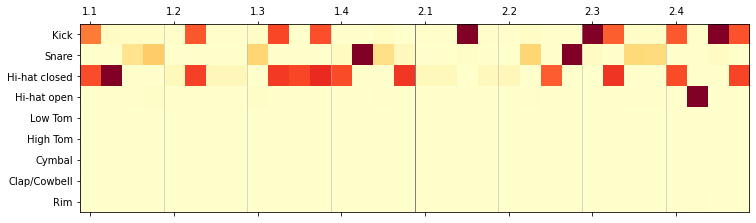

epoch: 112
m_d_loss: 0.4457627885043621     m_g_loss: 2.128149722561692


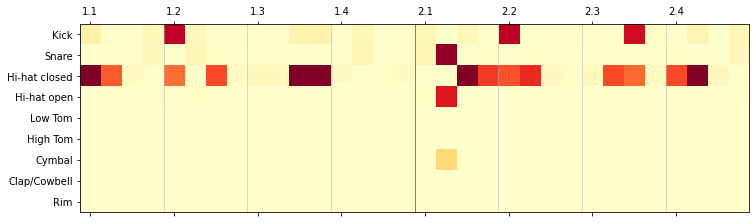

epoch: 113
m_d_loss: 0.4549802759114434     m_g_loss: 2.1596422773419004


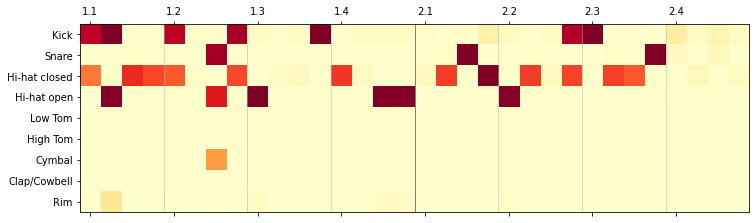

epoch: 114
m_d_loss: 0.4562040504068136     m_g_loss: 2.162828799450036


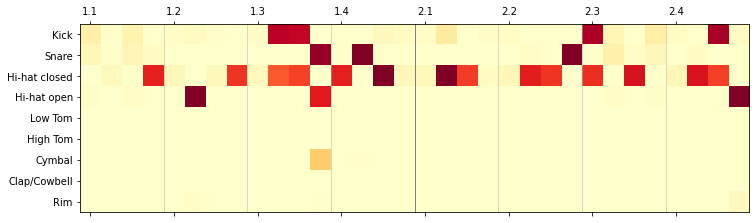

epoch: 115
m_d_loss: 0.44985805749893193     m_g_loss: 2.100558685533928


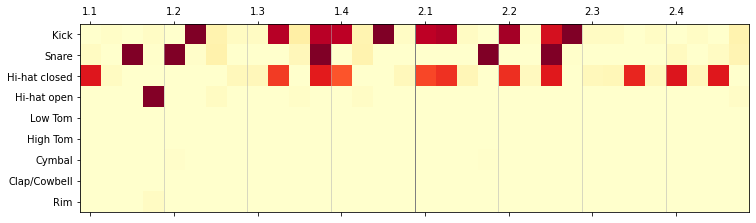

epoch: 116
m_d_loss: 0.4489364024251699     m_g_loss: 2.309857043352994


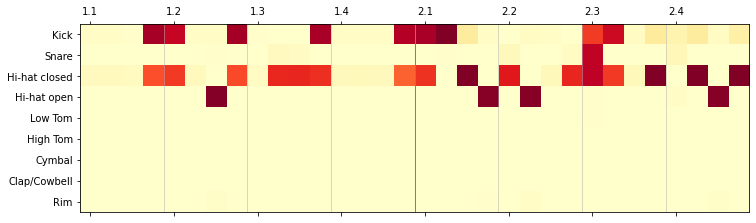

epoch: 117
m_d_loss: 0.4328796137781704     m_g_loss: 2.317345268798597


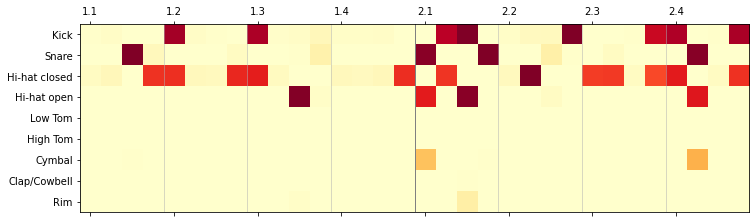

epoch: 118
m_d_loss: 0.4371992241591215     m_g_loss: 2.307732997518597


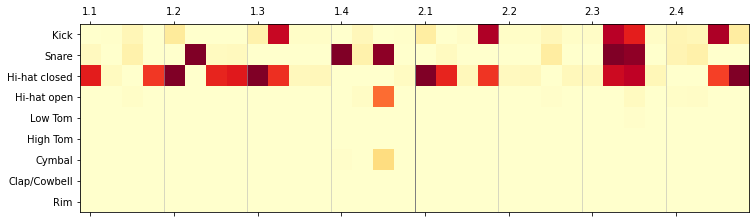

epoch: 119
m_d_loss: 0.43680491447448727     m_g_loss: 2.288448026686004


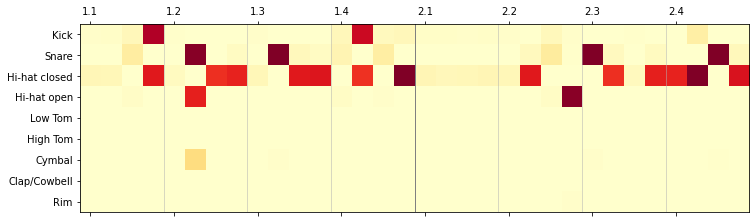

epoch: 120
m_d_loss: 0.42720708847045896     m_g_loss: 2.258049498904835


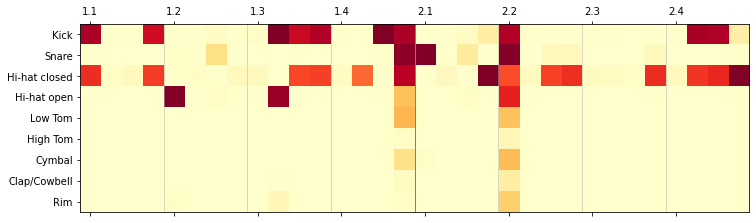

epoch: 121
m_d_loss: 0.4301655895569744     m_g_loss: 2.3899532267541597


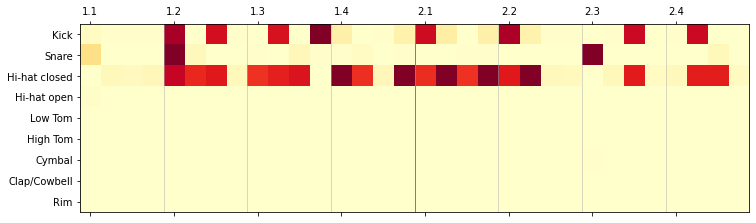

epoch: 122
m_d_loss: 0.42627605013549336     m_g_loss: 2.325390248587637


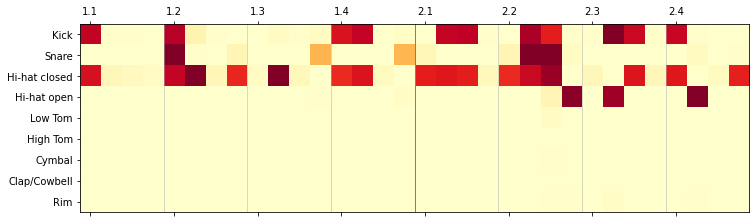

epoch: 123
m_d_loss: 0.43035712978419133     m_g_loss: 2.349702643625664


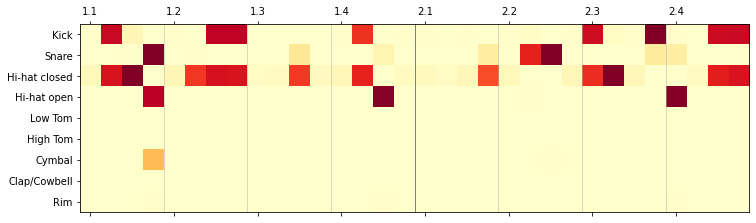

epoch: 124
m_d_loss: 0.43671828098595145     m_g_loss: 2.314167275573268


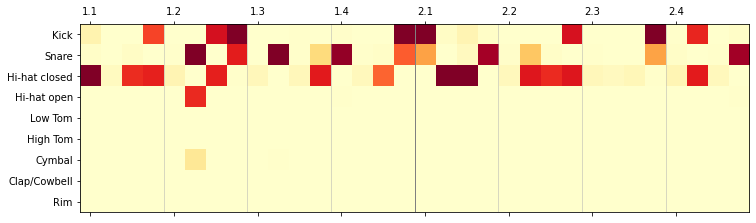

epoch: 125
m_d_loss: 0.4255315019803889     m_g_loss: 2.33676037643895


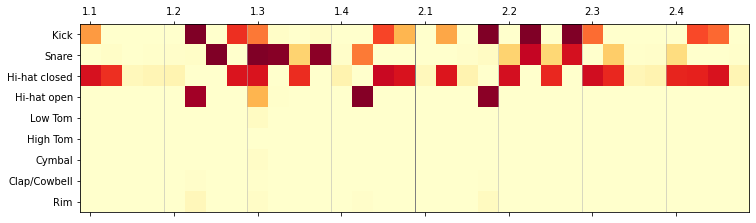

epoch: 126
m_d_loss: 0.4171577338129282     m_g_loss: 2.4104580373475044


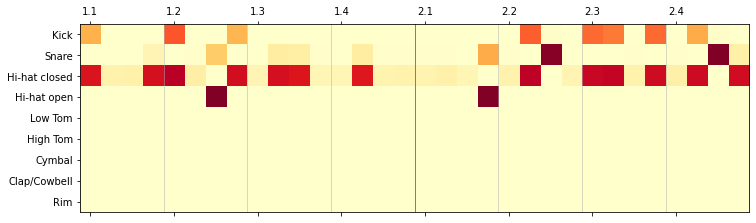

epoch: 127
m_d_loss: 0.4082797138129962     m_g_loss: 2.412625804091945


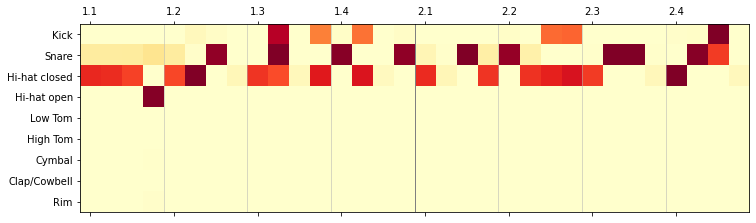

epoch: 128
m_d_loss: 0.4194324180483818     m_g_loss: 2.4263055143934307


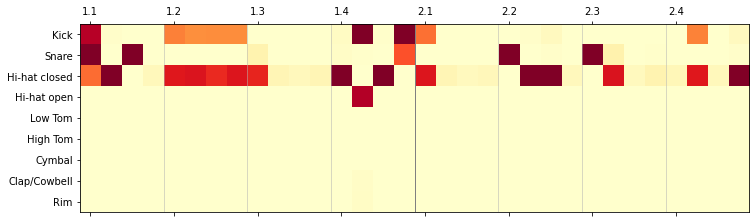

epoch: 129
m_d_loss: 0.41156146526336673     m_g_loss: 2.4914664860927695


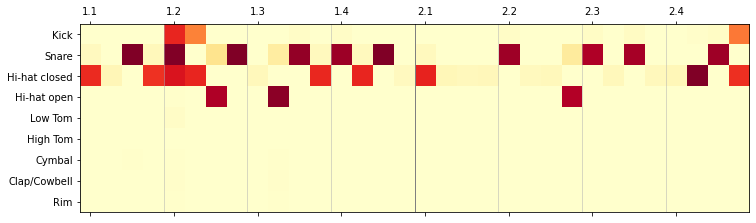

epoch: 130
m_d_loss: 0.41623134166002274     m_g_loss: 2.4584495732278535


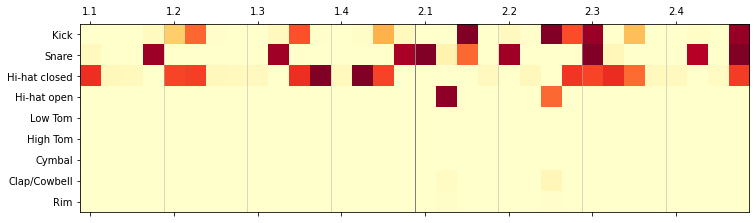

epoch: 131
m_d_loss: 0.41412555435124565     m_g_loss: 2.4380648136138916


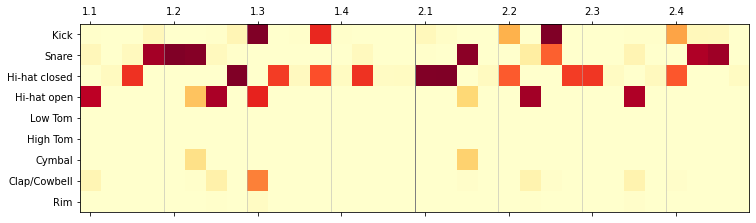

epoch: 132
m_d_loss: 0.41846928745508194     m_g_loss: 2.4739611365578393


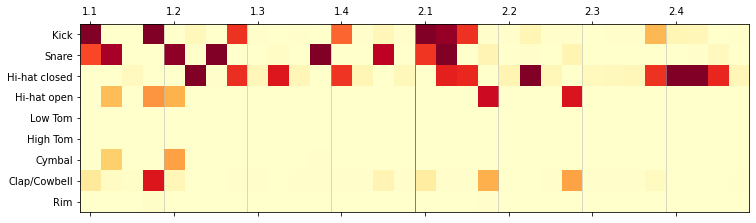

epoch: 133
m_d_loss: 0.4183196958373574     m_g_loss: 2.484514568791245


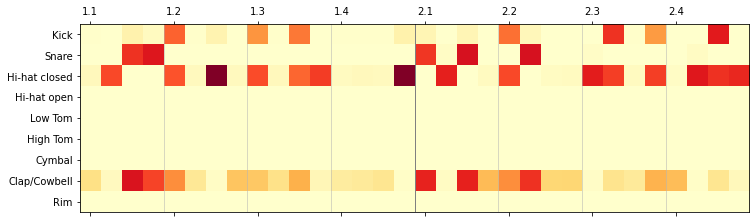

epoch: 134
m_d_loss: 0.3927357487380505     m_g_loss: 2.6182741902091284


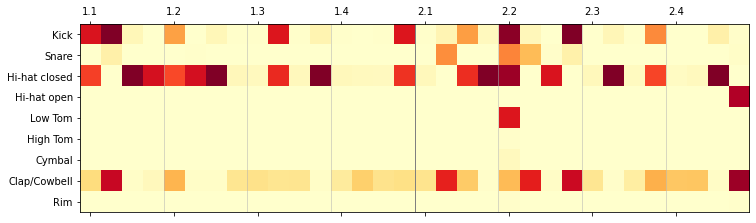

epoch: 135
m_d_loss: 0.39566511476741123     m_g_loss: 2.7388701872392134


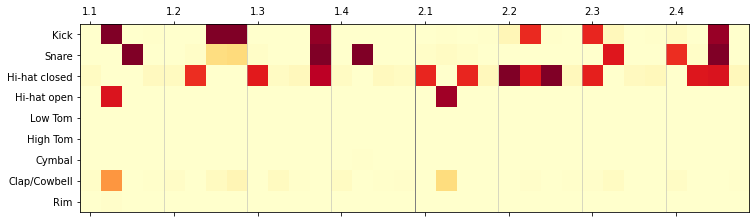

epoch: 136
m_d_loss: 0.41152614131569865     m_g_loss: 2.486064997586337


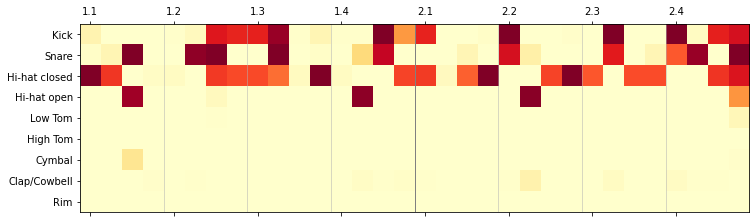

epoch: 137
m_d_loss: 0.41131700698067164     m_g_loss: 2.4406404711983423


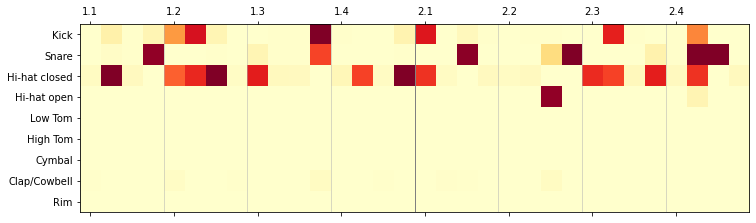

epoch: 138
m_d_loss: 0.3932188000530005     m_g_loss: 2.5649099422223642


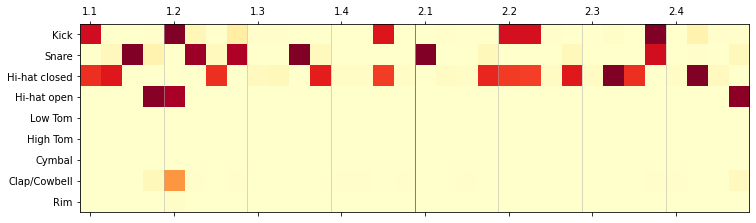

epoch: 139
m_d_loss: 0.39914897855590376     m_g_loss: 2.598178588982784


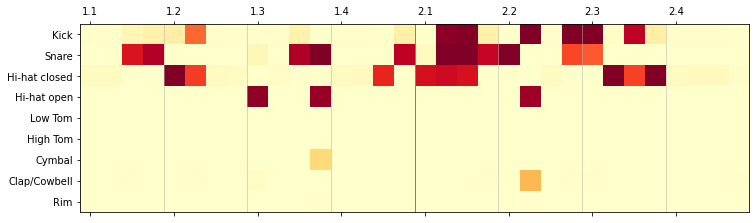

epoch: 140
m_d_loss: 0.3999221857637167     m_g_loss: 2.646579561811505


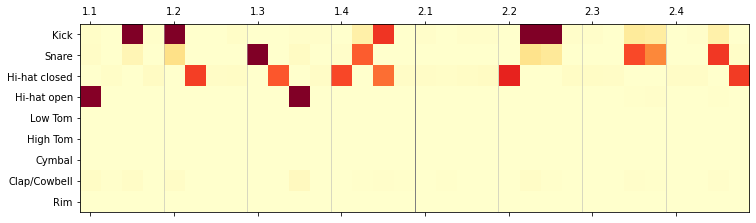

epoch: 141
m_d_loss: 0.399619155771592     m_g_loss: 2.514293179367528


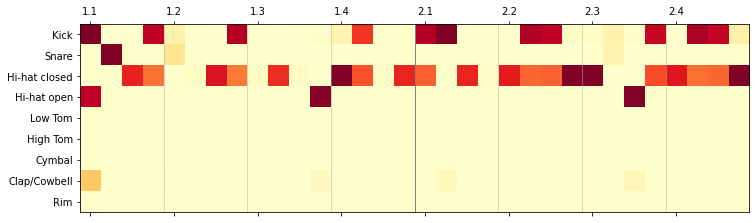

epoch: 142
m_d_loss: 0.41016503982245917     m_g_loss: 2.4963212446732954


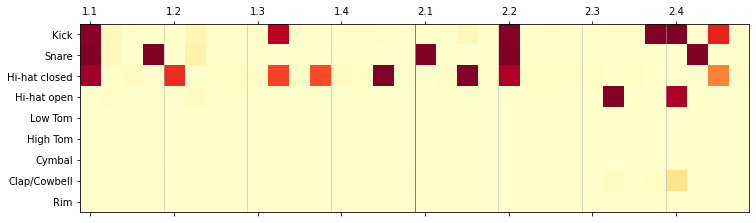

epoch: 143
m_d_loss: 0.4072594288517447     m_g_loss: 2.487093260793975


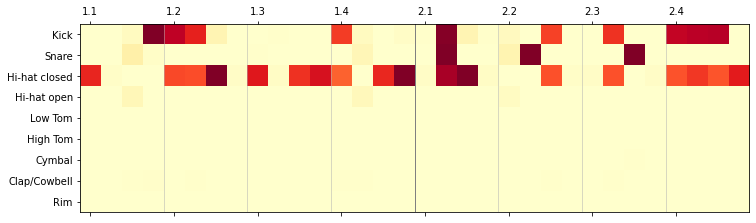

epoch: 144
m_d_loss: 0.40765003152191637     m_g_loss: 2.568564429427638


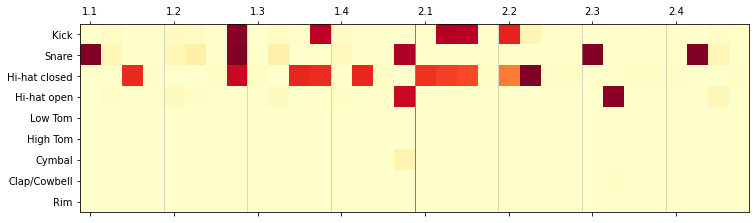

epoch: 145
m_d_loss: 0.41095927532981424     m_g_loss: 2.5361429994756524


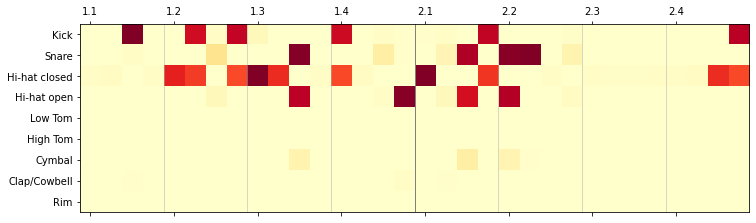

epoch: 146
m_d_loss: 0.3913159169256687     m_g_loss: 2.611981608650901


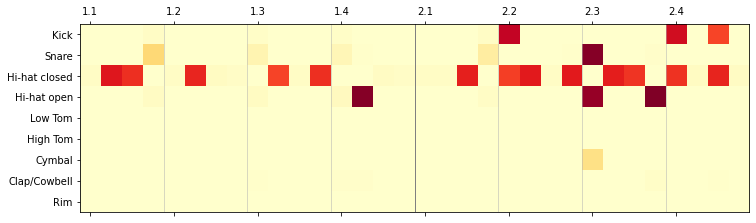

epoch: 147
m_d_loss: 0.3898609852089602     m_g_loss: 2.6289244131608442


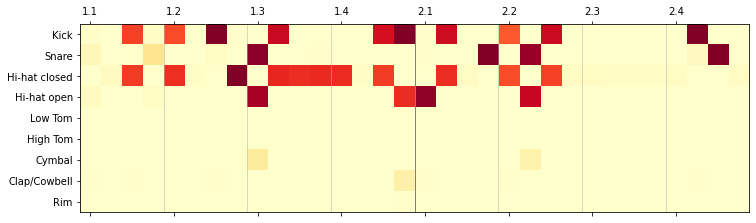

epoch: 148
m_d_loss: 0.39981334283947945     m_g_loss: 2.6381302457867246


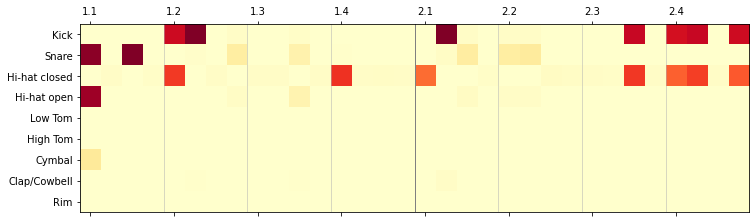

epoch: 149
m_d_loss: 0.39422384851119097     m_g_loss: 2.6667314731713496


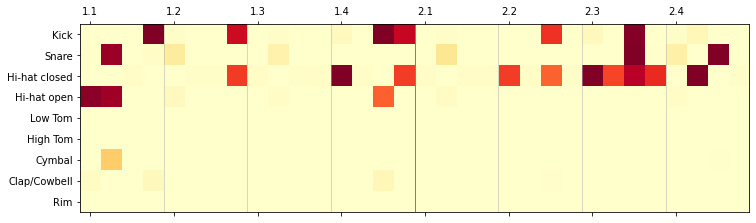

epoch: 150
m_d_loss: 0.39894320704042907     m_g_loss: 2.7461414192662095


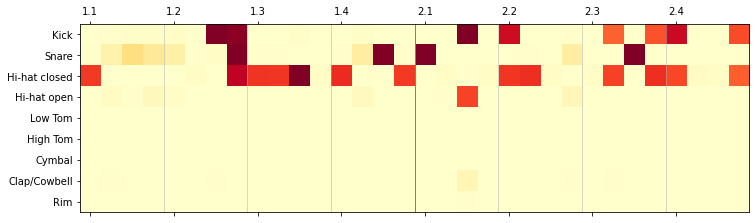

epoch: 151
m_d_loss: 0.3834873276598313     m_g_loss: 2.7236158920056894


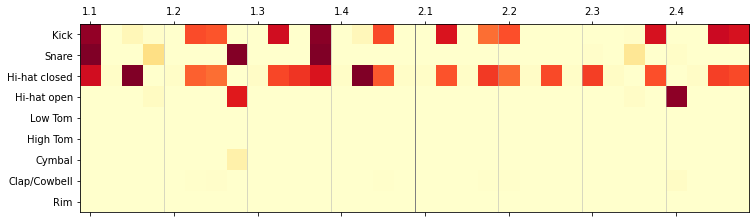

epoch: 152
m_d_loss: 0.39115208871662616     m_g_loss: 2.710900649879918


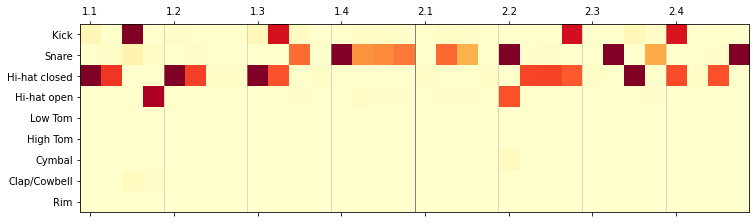

epoch: 153
m_d_loss: 0.3838180370190564     m_g_loss: 2.657408092961167


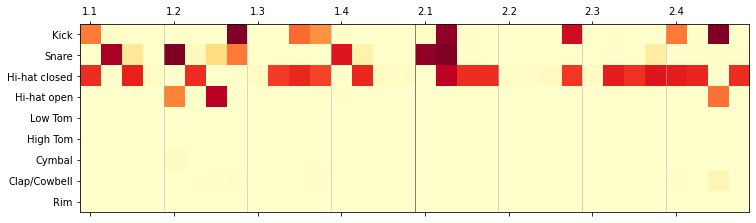

epoch: 154
m_d_loss: 0.3902611322700977     m_g_loss: 2.65852656508937


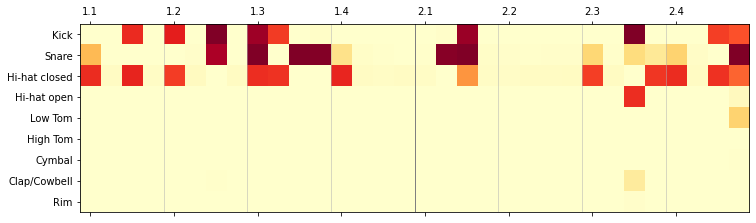

epoch: 155
m_d_loss: 0.3755637999843149     m_g_loss: 2.8922391732533774


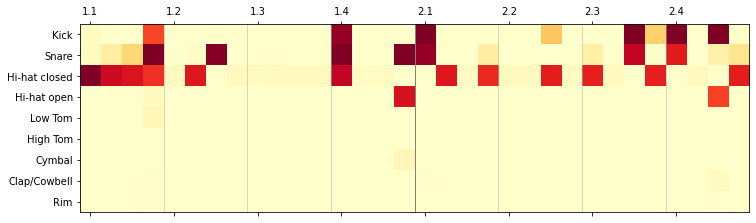

epoch: 156
m_d_loss: 0.3760527592152356     m_g_loss: 2.8517537911732993


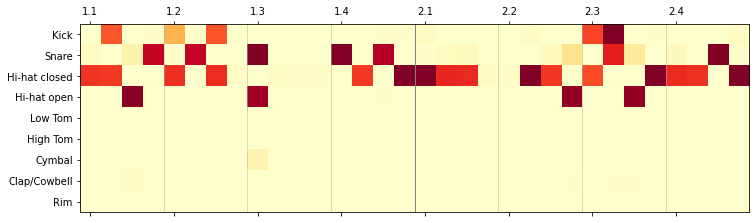

epoch: 157
m_d_loss: 0.3797651995630825     m_g_loss: 2.682687759399414


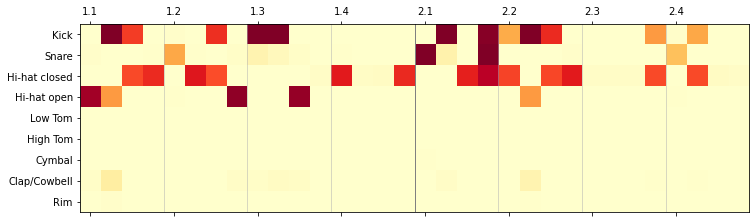

epoch: 158
m_d_loss: 0.39539810977876194     m_g_loss: 2.6768935160203413


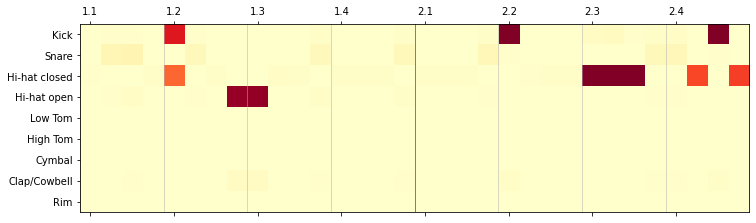

epoch: 159
m_d_loss: 0.3877383488066057     m_g_loss: 2.6573850602814644


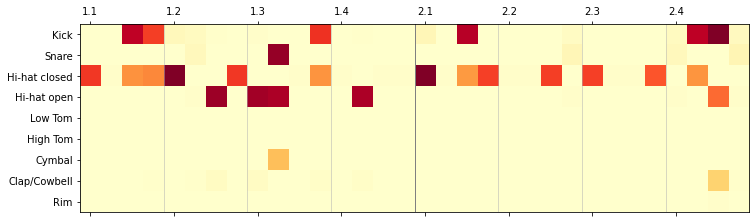

epoch: 160
m_d_loss: 0.38989538103342064     m_g_loss: 2.6783772959853662


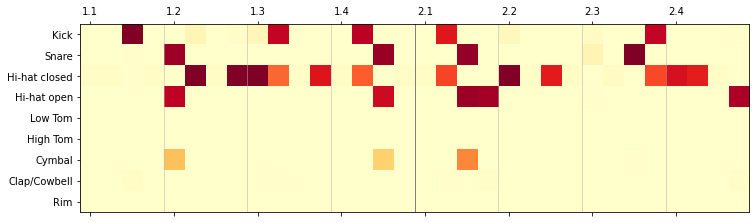

epoch: 161
m_d_loss: 0.37805573133861314     m_g_loss: 2.790366519581188


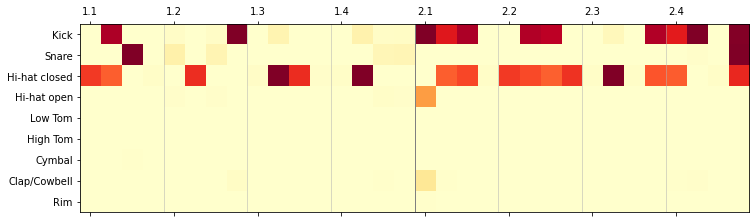

epoch: 162
m_d_loss: 0.3831524480134249     m_g_loss: 2.69215726852417


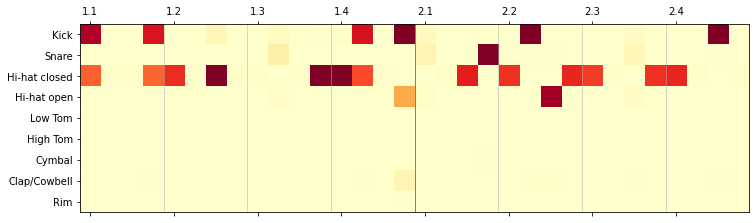

epoch: 163
m_d_loss: 0.3856375473387101     m_g_loss: 2.809955018939394


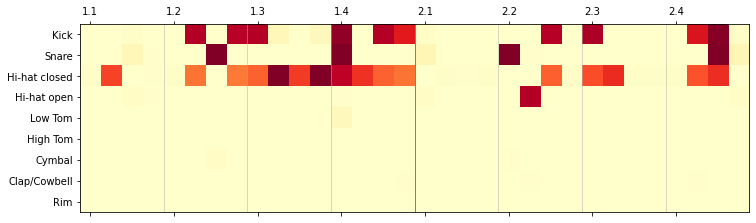

epoch: 164
m_d_loss: 0.37967602983117105     m_g_loss: 2.857811942245021


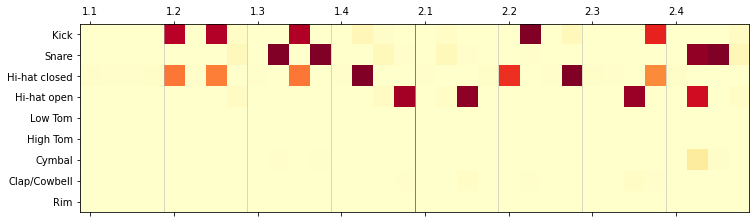

epoch: 165
m_d_loss: 0.3785216356025023     m_g_loss: 2.8378626144293584


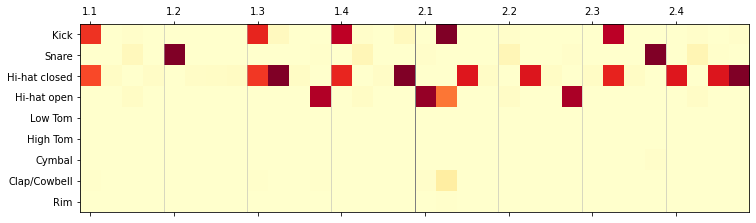

epoch: 166
m_d_loss: 0.36626504063606263     m_g_loss: 2.9761563575629033


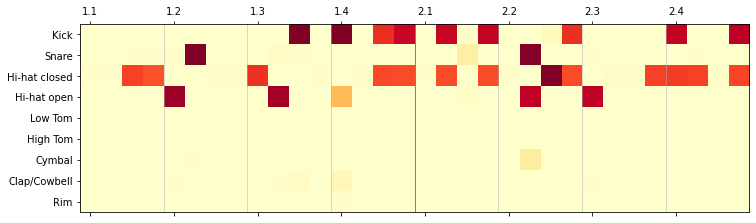

epoch: 167
m_d_loss: 0.37851346766247473     m_g_loss: 2.891790787378947


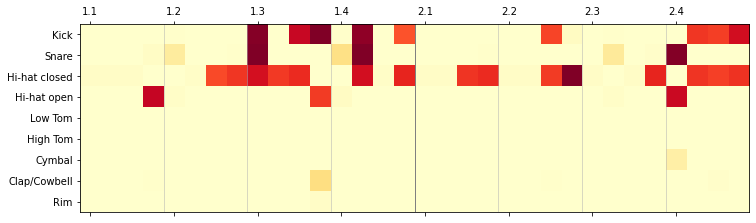

epoch: 168
m_d_loss: 0.37354370839893813     m_g_loss: 2.8028237530679414


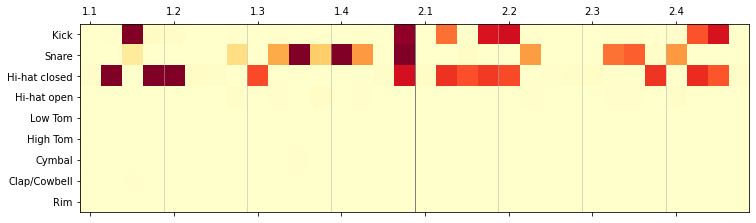

epoch: 169
m_d_loss: 0.37137826996691076     m_g_loss: 2.851906494660811


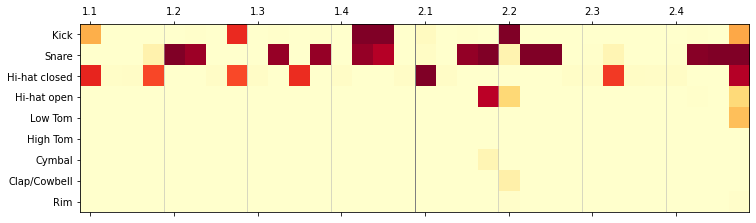

epoch: 170
m_d_loss: 0.3632640600204467     m_g_loss: 2.9871589198256983


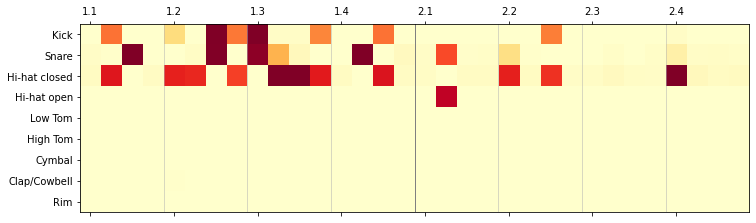

epoch: 171
m_d_loss: 0.35047750227591573     m_g_loss: 3.0883675922047007


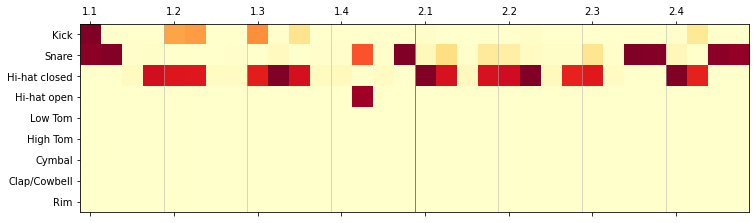

epoch: 172
m_d_loss: 0.35287672802805903     m_g_loss: 3.146106091412631


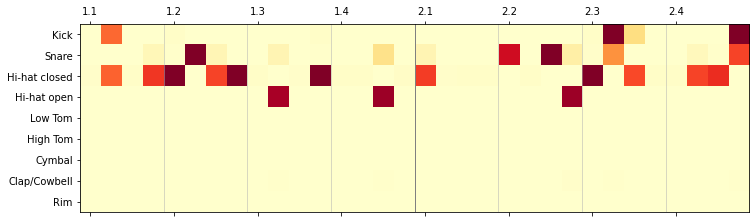

epoch: 173
m_d_loss: 0.364640730268815     m_g_loss: 2.9808331113873106


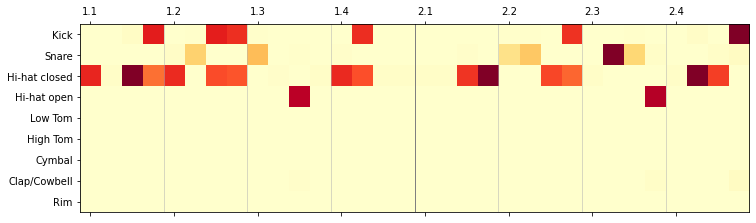

epoch: 174
m_d_loss: 0.3700379081070423     m_g_loss: 2.9977953506238535


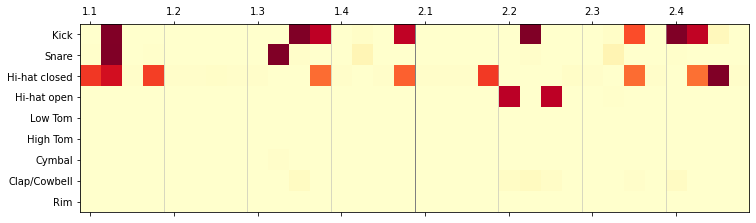

epoch: 175
m_d_loss: 0.3729445008670582     m_g_loss: 2.944773139375629


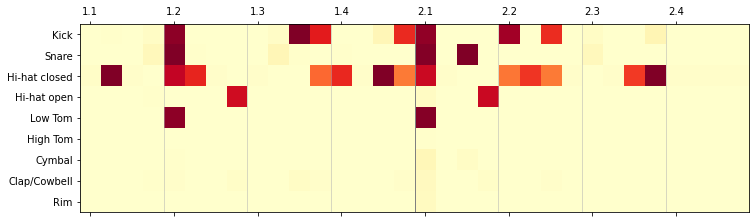

epoch: 176
m_d_loss: 0.36923577785491946     m_g_loss: 2.884804783445416


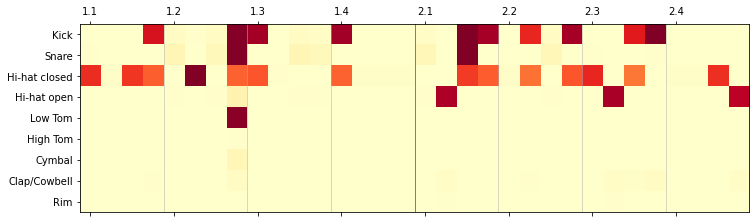

epoch: 177
m_d_loss: 0.3631314431919771     m_g_loss: 3.039143793510668


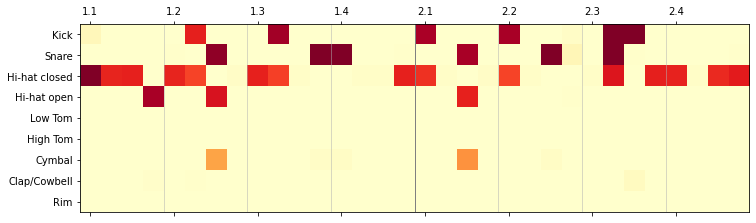

epoch: 178
m_d_loss: 0.36296204589307307     m_g_loss: 3.080523483680956


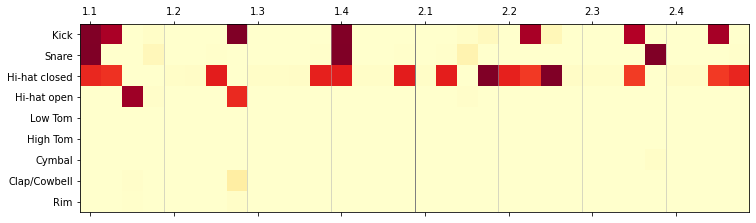

epoch: 179
m_d_loss: 0.3525924580938675     m_g_loss: 3.0441782474517822


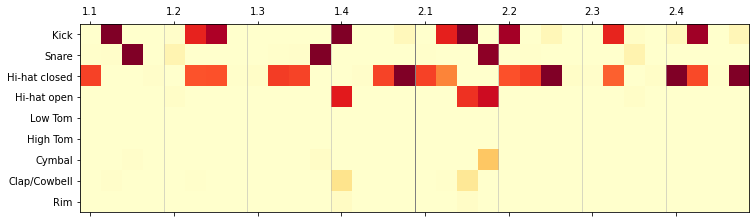

epoch: 180
m_d_loss: 0.3625939402729273     m_g_loss: 3.1857489600326074


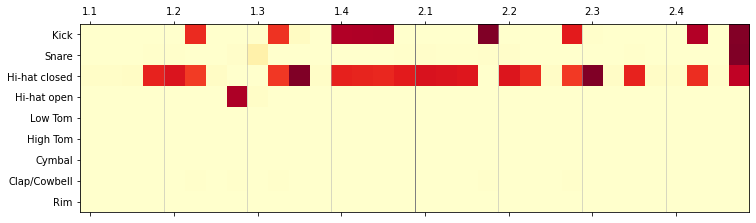

epoch: 181
m_d_loss: 0.354972822525922     m_g_loss: 3.1475360827012495


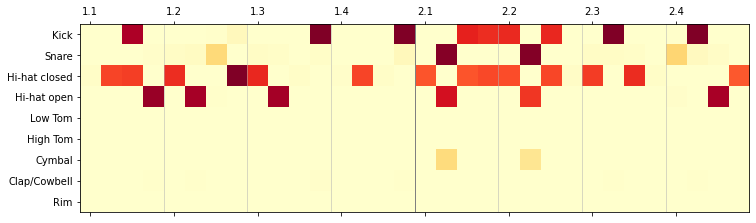

epoch: 182
m_d_loss: 0.35062028355896474     m_g_loss: 3.145935412609216


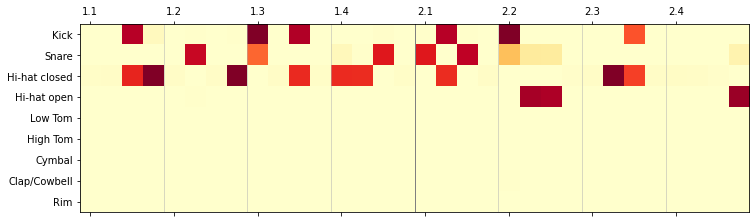

epoch: 183
m_d_loss: 0.3692095931838541     m_g_loss: 2.929297165437178


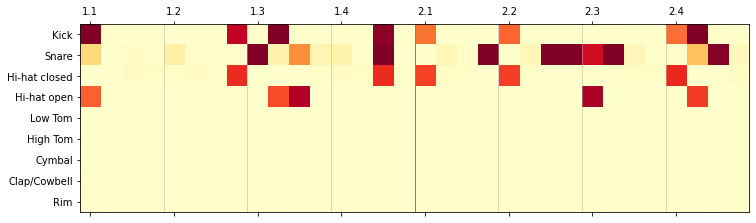

epoch: 184
m_d_loss: 0.3446478959172964     m_g_loss: 3.1397318334290474


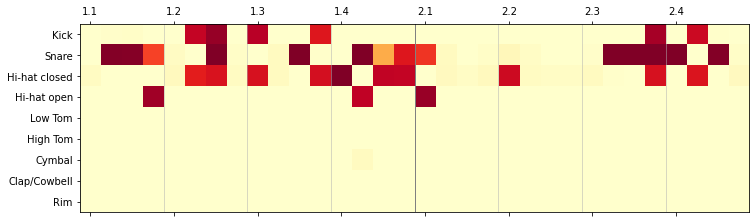

epoch: 185
m_d_loss: 0.34192011093392094     m_g_loss: 3.243441784020626


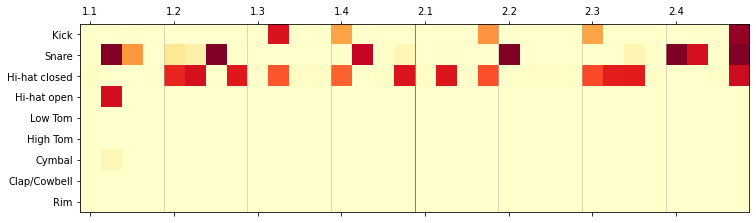

epoch: 186
m_d_loss: 0.36028353869915003     m_g_loss: 3.101376193942446


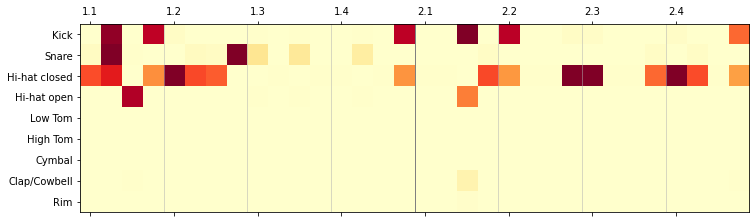

epoch: 187
m_d_loss: 0.3588428756769966     m_g_loss: 3.0588354630903765


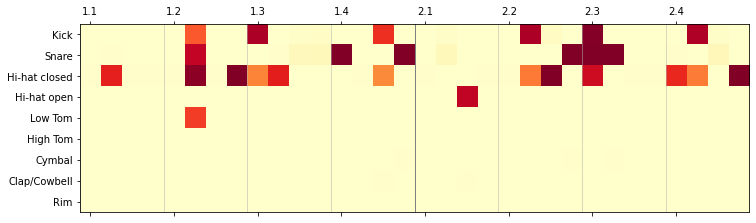

epoch: 188
m_d_loss: 0.36068309284746647     m_g_loss: 3.1072487831115723


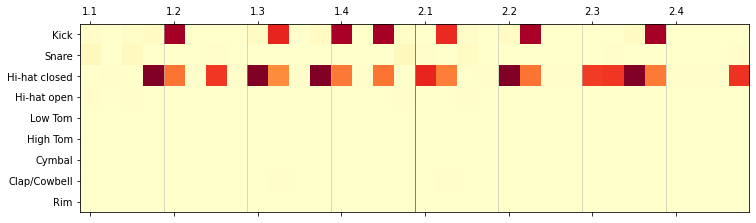

epoch: 189
m_d_loss: 0.34687559779952554     m_g_loss: 3.0975575808322793


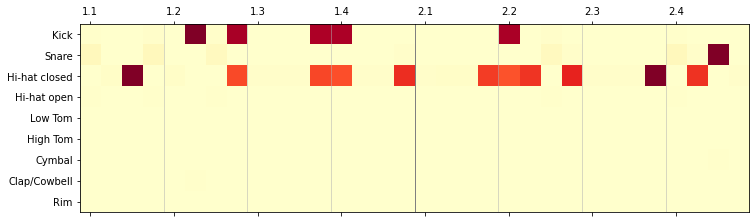

epoch: 190
m_d_loss: 0.35070486925542355     m_g_loss: 3.230834621371645


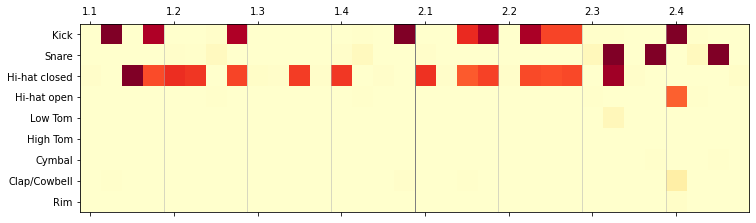

epoch: 191
m_d_loss: 0.345958238138872     m_g_loss: 3.1062182513150303


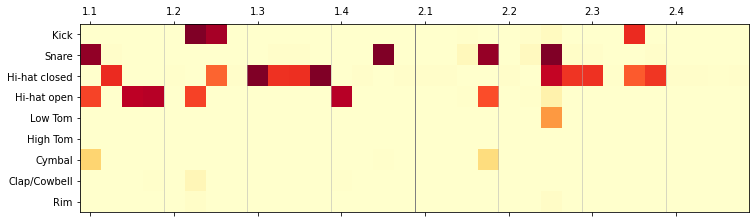

epoch: 192
m_d_loss: 0.3512059416621924     m_g_loss: 3.1500689549879595


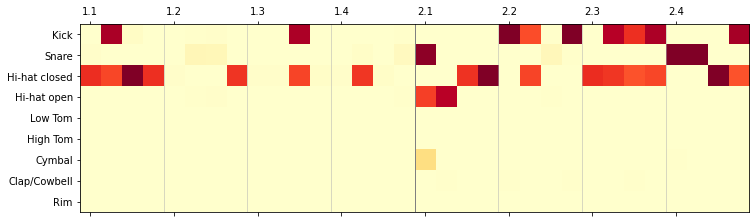

epoch: 193
m_d_loss: 0.34514680820352894     m_g_loss: 3.28232953042695


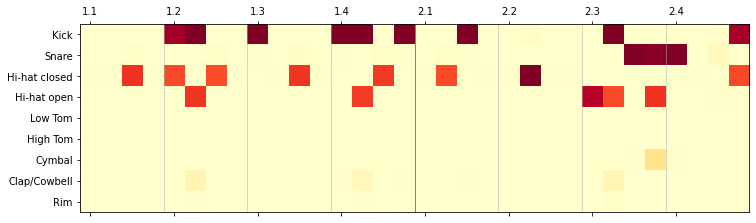

epoch: 194
m_d_loss: 0.34423721339553587     m_g_loss: 3.174512241825913


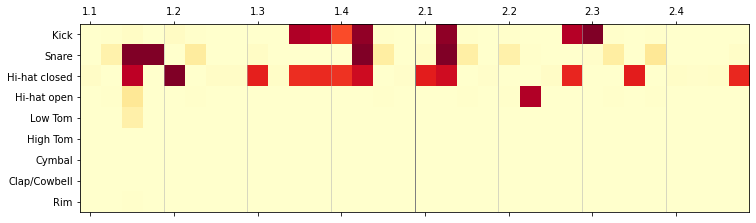

epoch: 195
m_d_loss: 0.34182513671762804     m_g_loss: 3.377490657748598


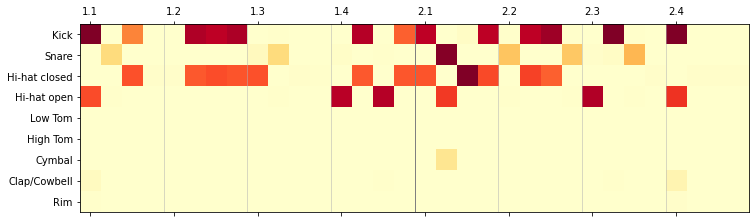

epoch: 196
m_d_loss: 0.3480359483510255     m_g_loss: 3.2525142467383183


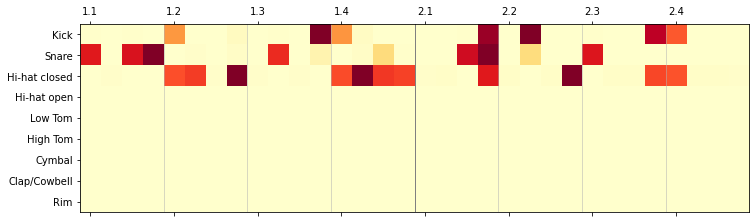

epoch: 197
m_d_loss: 0.36535695212728836     m_g_loss: 2.8984917799631753


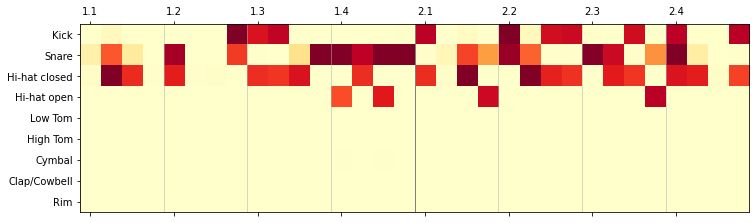

epoch: 198
m_d_loss: 0.3236959211528301     m_g_loss: 3.3601133173162285


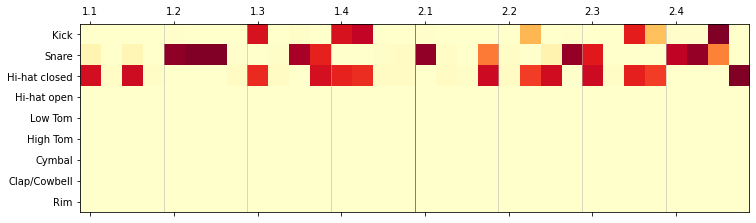

epoch: 199
m_d_loss: 0.34118456051630136     m_g_loss: 3.2531538732124097


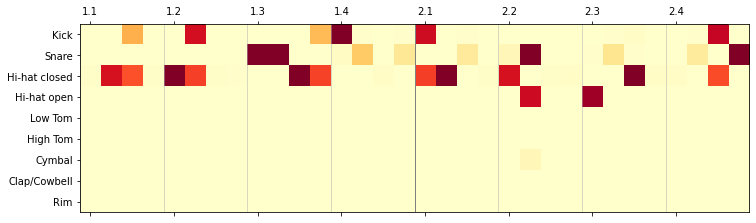

epoch: 200
m_d_loss: 0.3610756274312734     m_g_loss: 3.170541019150705


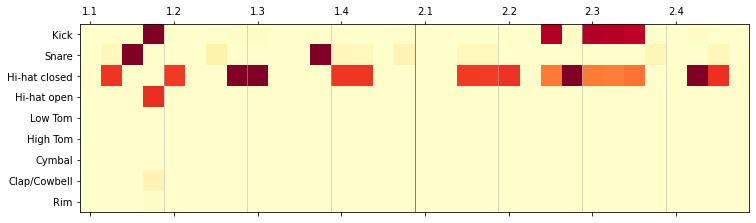

epoch: 201
m_d_loss: 0.3603936479372136     m_g_loss: 3.143662337100867


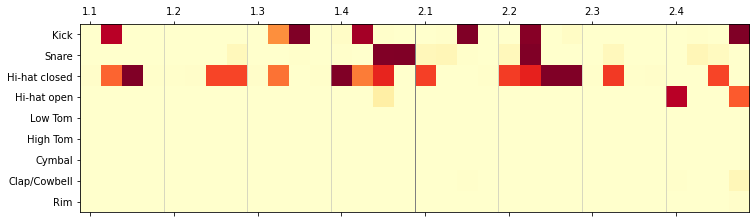

epoch: 202
m_d_loss: 0.34825991801917555     m_g_loss: 3.2126819798440645


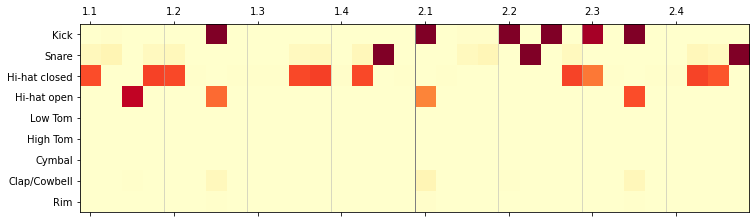

epoch: 203
m_d_loss: 0.3477471270981957     m_g_loss: 3.2087350108406762


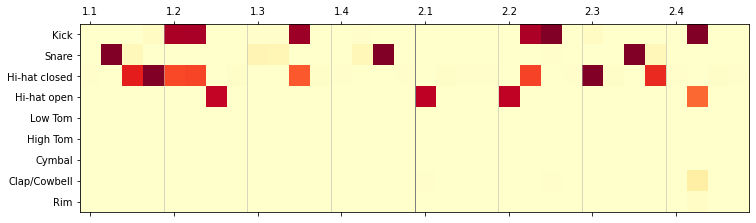

epoch: 204
m_d_loss: 0.3284132095053792     m_g_loss: 3.339847521348433


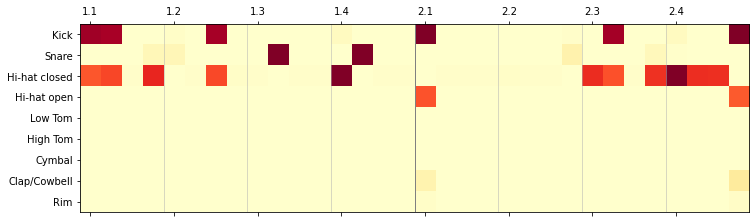

epoch: 205
m_d_loss: 0.33106976642328156     m_g_loss: 3.30226088292671


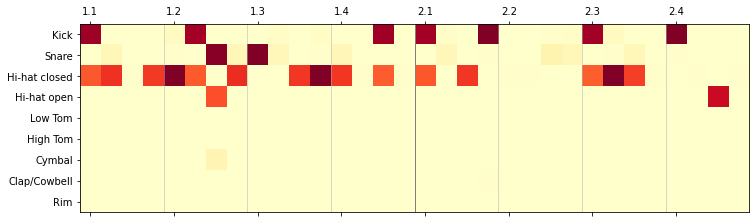

epoch: 206
m_d_loss: 0.3383317023515701     m_g_loss: 3.363407936963168


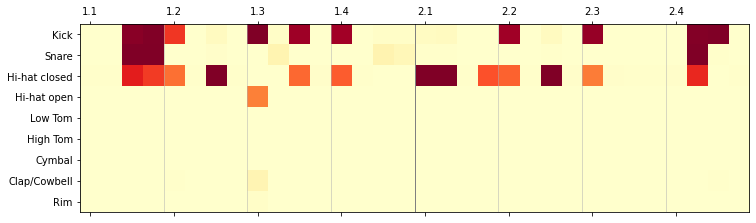

epoch: 207
m_d_loss: 0.33669813485706557     m_g_loss: 3.4174175984931714


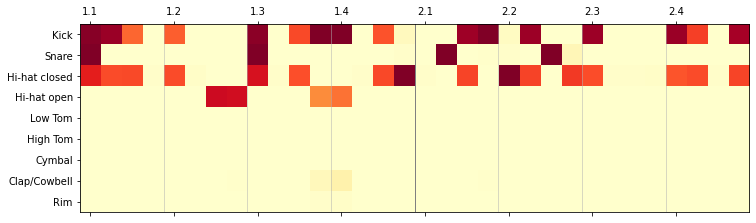

epoch: 208
m_d_loss: 0.33070011120289566     m_g_loss: 3.371858567902536


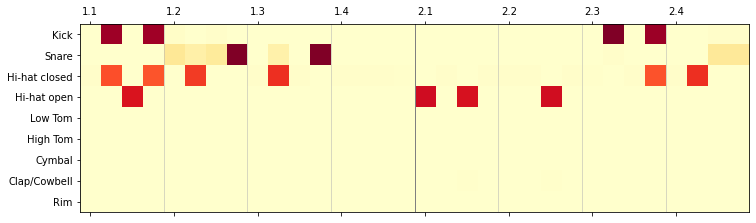

epoch: 209
m_d_loss: 0.3429995391298743     m_g_loss: 3.3610800685304585


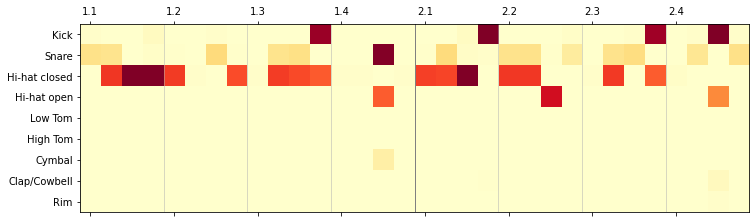

epoch: 210
m_d_loss: 0.33415858242660756     m_g_loss: 3.3716538458159477


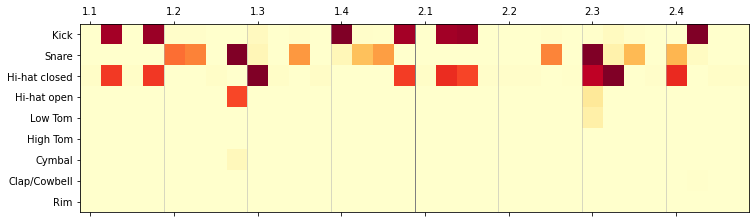

epoch: 211
m_d_loss: 0.3527731215252596     m_g_loss: 3.295138474666711


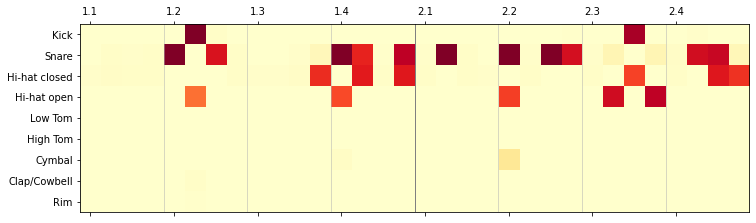

epoch: 212
m_d_loss: 0.34940991662442683     m_g_loss: 3.180924249417854


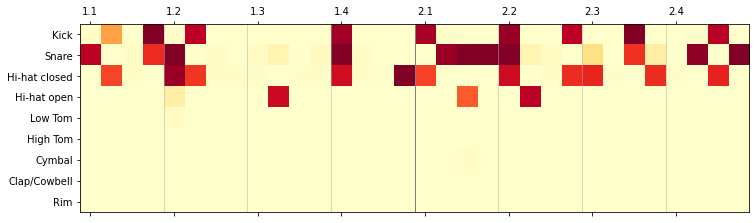

epoch: 213
m_d_loss: 0.3257011808016721     m_g_loss: 3.2833830587791675


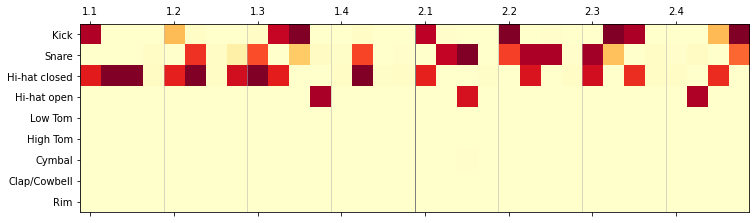

epoch: 214
m_d_loss: 0.3404834739863873     m_g_loss: 3.340771349993619


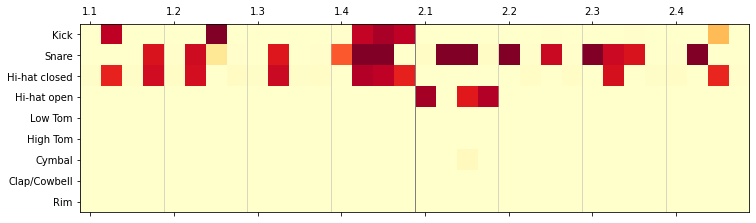

epoch: 215
m_d_loss: 0.33308372742989484     m_g_loss: 3.3564242377425684


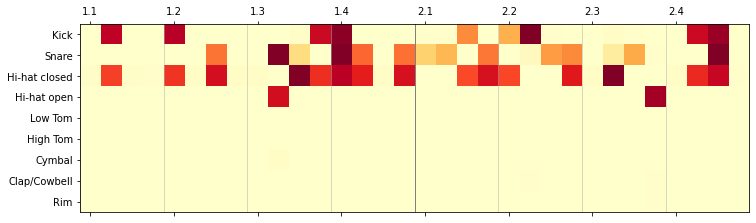

epoch: 216
m_d_loss: 0.3475663311779499     m_g_loss: 3.3374747001763545


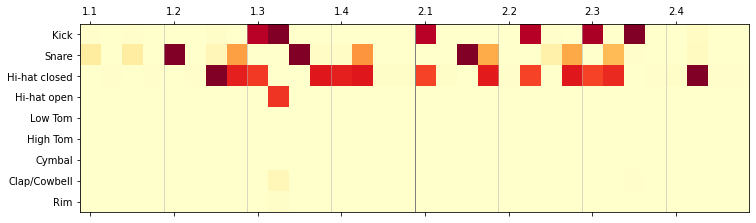

epoch: 217
m_d_loss: 0.3403269217294805     m_g_loss: 3.230336550510291


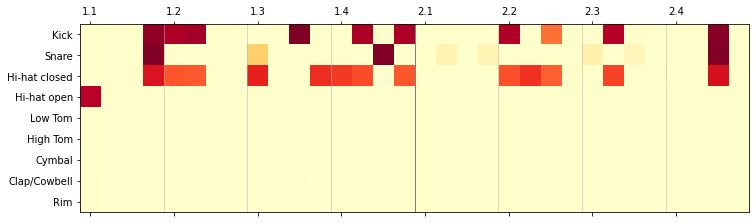

epoch: 218
m_d_loss: 0.33326871953904635     m_g_loss: 3.357038115010117


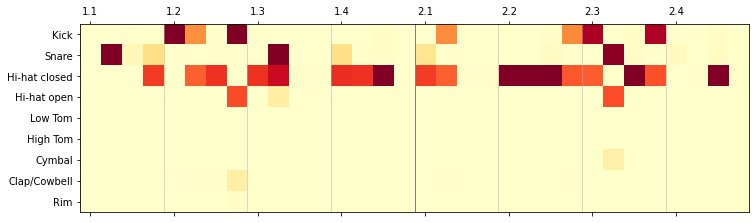

epoch: 219
m_d_loss: 0.332918848360286     m_g_loss: 3.4578778093511406


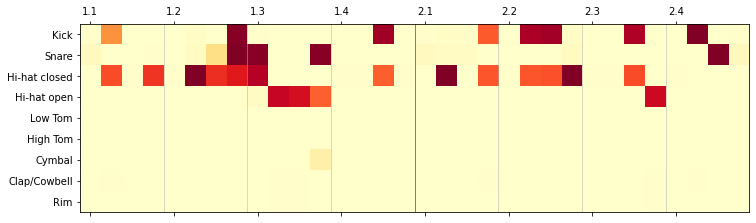

epoch: 220
m_d_loss: 0.3429624747484922     m_g_loss: 3.292072007150361


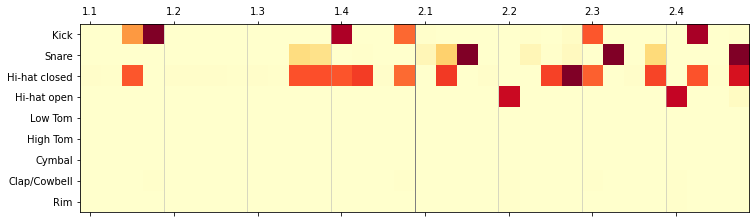

epoch: 221
m_d_loss: 0.3340282867936527     m_g_loss: 3.2908752181313257


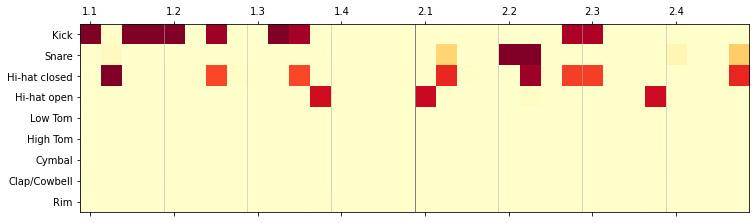

epoch: 222
m_d_loss: 0.3444862253963947     m_g_loss: 3.271535389351122


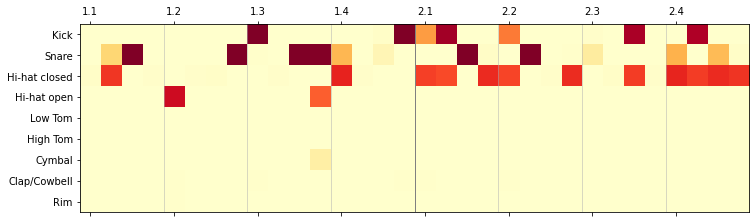

epoch: 223
m_d_loss: 0.3333227012087317     m_g_loss: 3.377990332516757


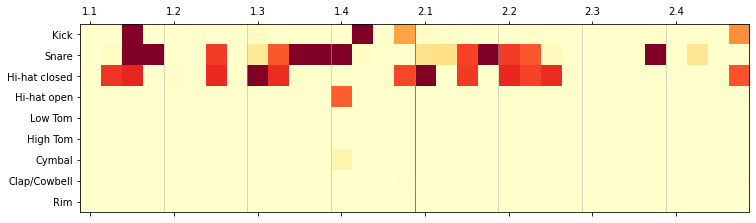

epoch: 224
m_d_loss: 0.3368282899260521     m_g_loss: 3.294745755918098


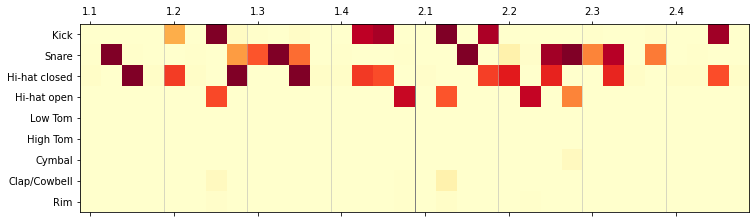

epoch: 225
m_d_loss: 0.34459912180900565     m_g_loss: 3.1661760012308755


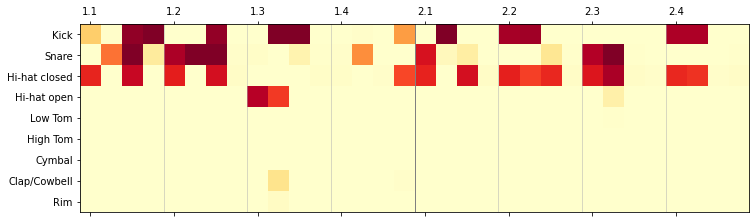

epoch: 226
m_d_loss: 0.33478442803025243     m_g_loss: 3.215557083939061


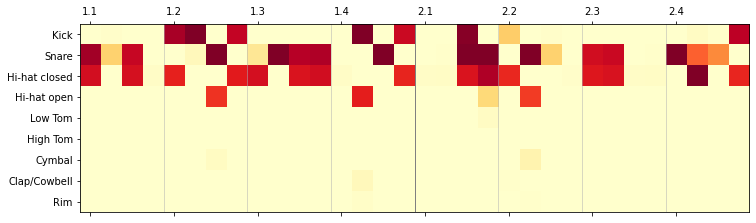

epoch: 227
m_d_loss: 0.3372249529642217     m_g_loss: 3.3239642201047954


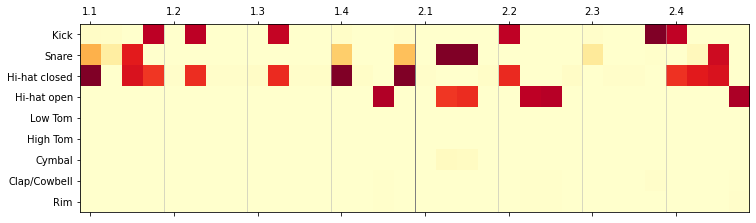

epoch: 228
m_d_loss: 0.33807119019329546     m_g_loss: 3.3098542256788774


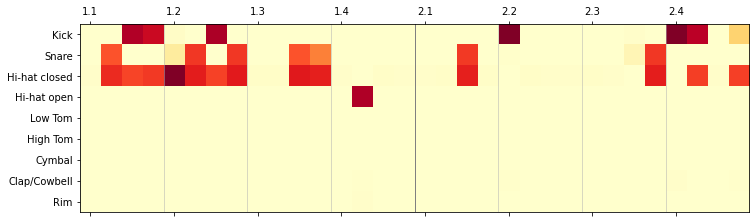

epoch: 229
m_d_loss: 0.3434179130722495     m_g_loss: 3.267306696284901


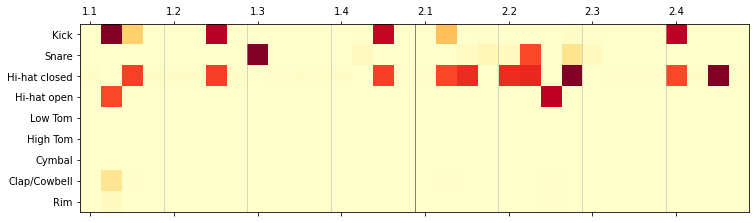

epoch: 230
m_d_loss: 0.3380189038813114     m_g_loss: 3.283025864398841


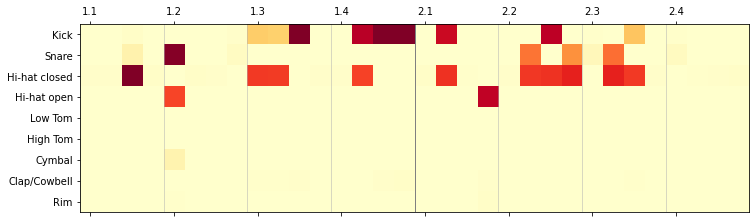

epoch: 231
m_d_loss: 0.34349354891216055     m_g_loss: 3.3480032790790903


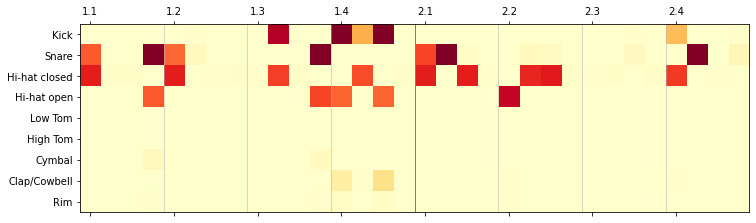

epoch: 232
m_d_loss: 0.3353873185813427     m_g_loss: 3.3124864462650185


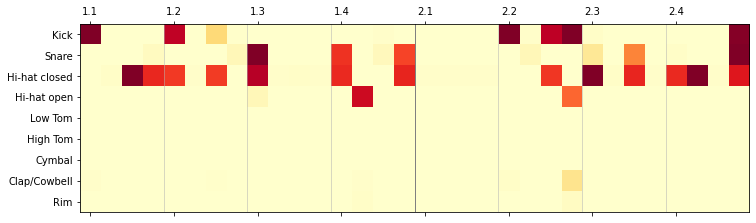

epoch: 233
m_d_loss: 0.3374033324858722     m_g_loss: 3.4212164156364673


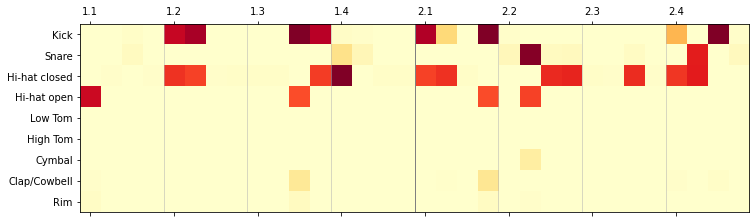

epoch: 234
m_d_loss: 0.33441641218960283     m_g_loss: 3.4330574093442974


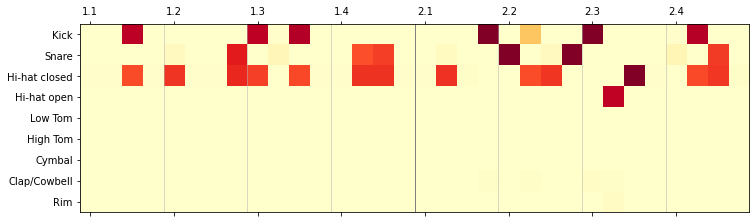

epoch: 235
m_d_loss: 0.33377315875361946     m_g_loss: 3.299098520567923


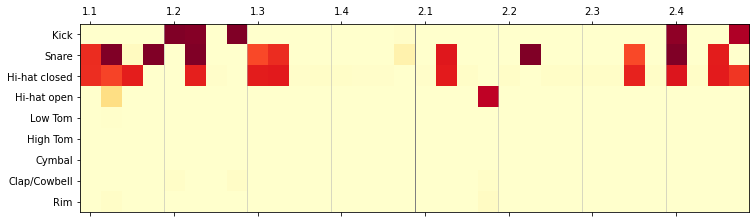

epoch: 236
m_d_loss: 0.33136541545391085     m_g_loss: 3.40057711167769


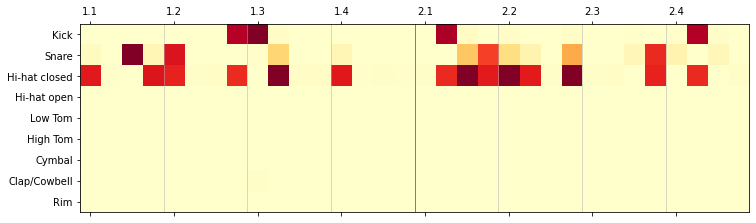

epoch: 237
m_d_loss: 0.33311782023485964     m_g_loss: 3.3588915593696362


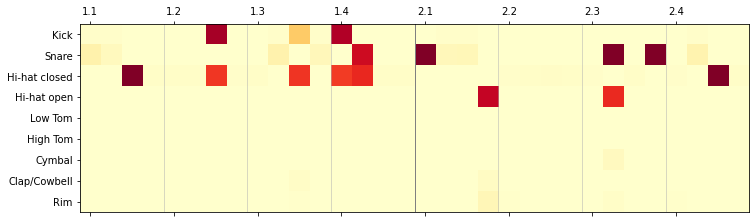

epoch: 238
m_d_loss: 0.33108736798167226     m_g_loss: 3.430741194522742


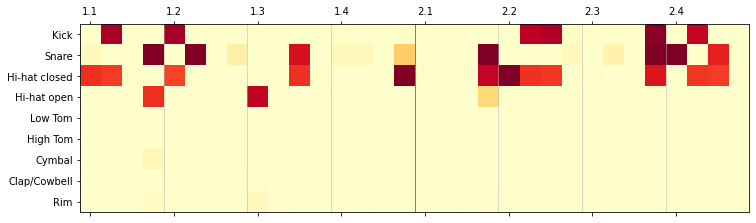

epoch: 239
m_d_loss: 0.3344510467613445     m_g_loss: 3.369378899082993


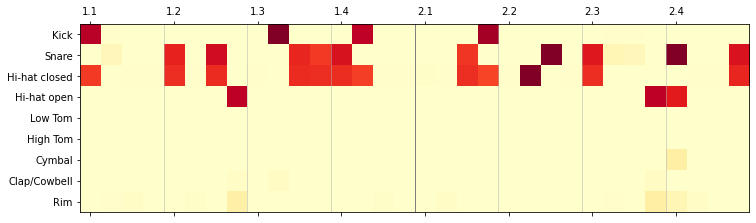

epoch: 240
m_d_loss: 0.3414815224707127     m_g_loss: 3.2098127856399072


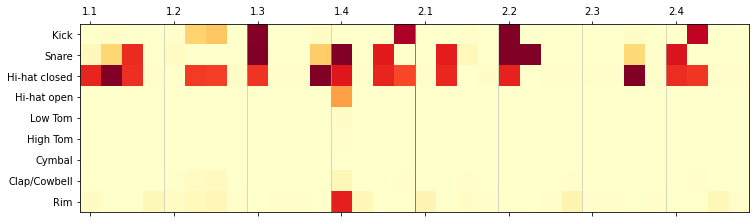

epoch: 241
m_d_loss: 0.3543596621821908     m_g_loss: 3.19852495915962


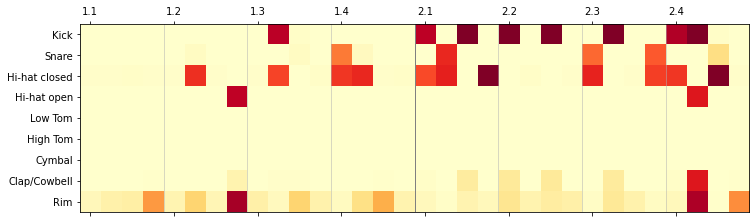

epoch: 242
m_d_loss: 0.3758515935391188     m_g_loss: 2.903956991253477


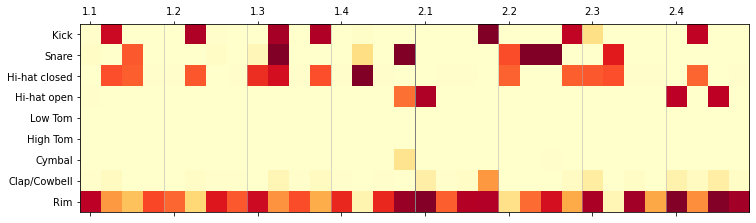

epoch: 243
m_d_loss: 0.28937217768500834     m_g_loss: 3.7012830358563047


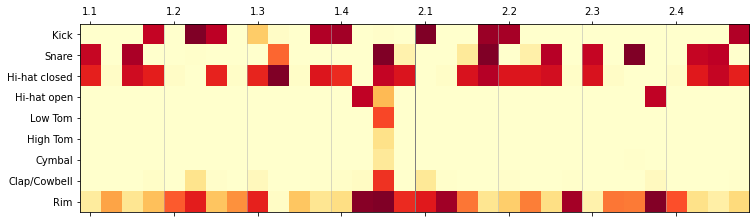

epoch: 244
m_d_loss: 0.30720620080828664     m_g_loss: 3.884474328069976


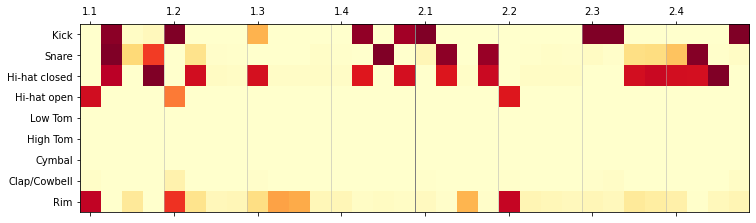

epoch: 245
m_d_loss: 0.3385805179091061     m_g_loss: 3.4697044401457817


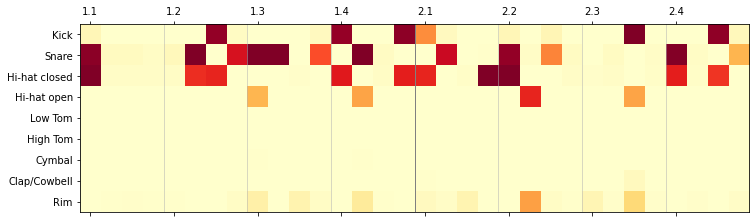

epoch: 246
m_d_loss: 0.31907616555690765     m_g_loss: 3.6214700106418496


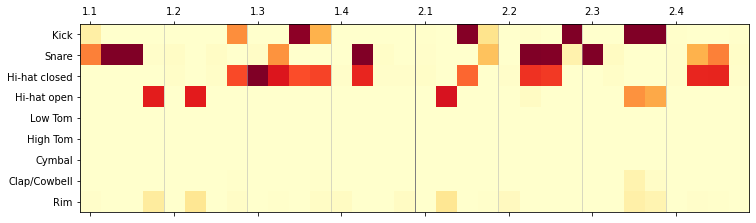

epoch: 247
m_d_loss: 0.321990358303575     m_g_loss: 3.679979584433816


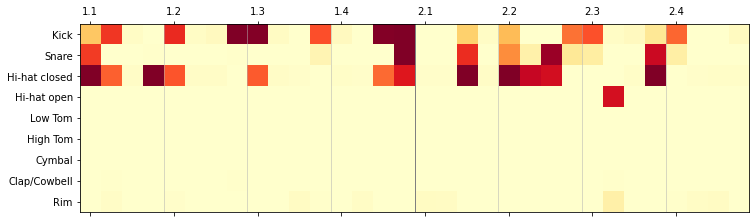

epoch: 248
m_d_loss: 0.3439831469208001     m_g_loss: 3.409116607723814


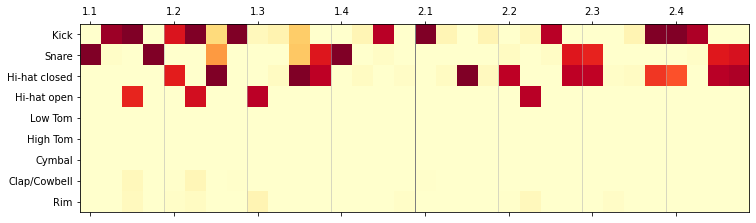

epoch: 249
m_d_loss: 0.3485137907897724     m_g_loss: 3.22707520831715


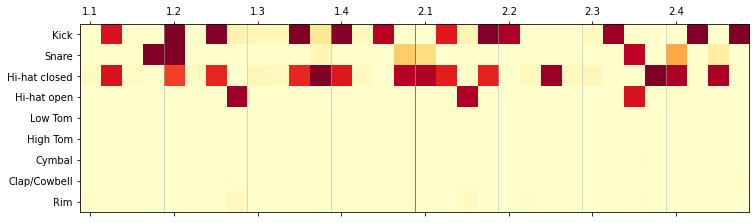

epoch: 250
m_d_loss: 0.352816316485405     m_g_loss: 3.3616856517213765


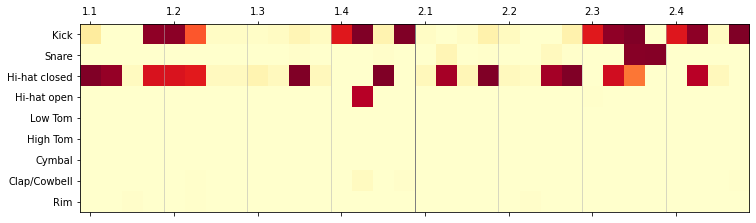

epoch: 251
m_d_loss: 0.3339381775435279     m_g_loss: 3.3593198747345894


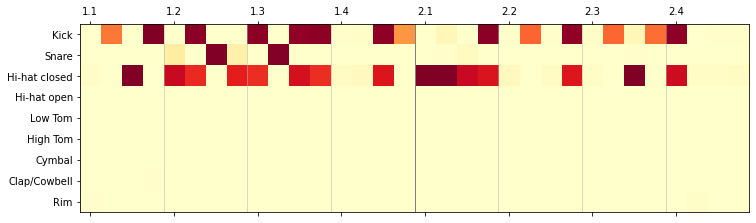

epoch: 252
m_d_loss: 0.3346257440745831     m_g_loss: 3.4383988669424346


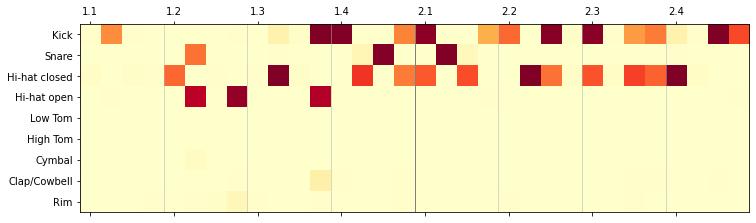

epoch: 253
m_d_loss: 0.3274555030991049     m_g_loss: 3.433742385922056


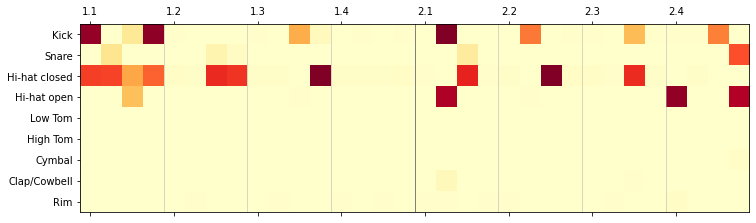

epoch: 254
m_d_loss: 0.32728343848139047     m_g_loss: 3.474367690808845


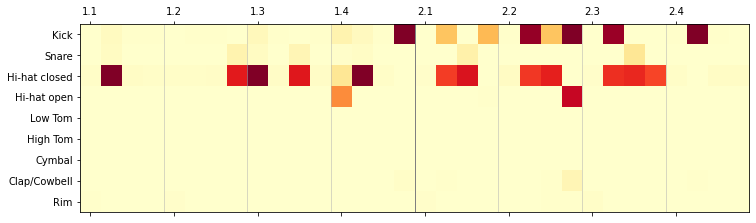

epoch: 255
m_d_loss: 0.3196561399628134     m_g_loss: 3.4905752485448662


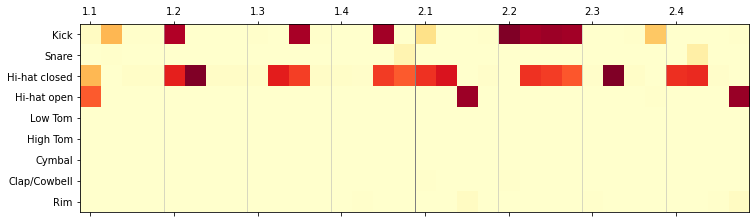

epoch: 256
m_d_loss: 0.33038962874561545     m_g_loss: 3.3769658117583305


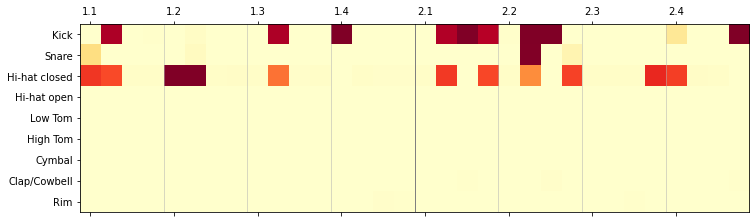

epoch: 257
m_d_loss: 0.32509321640519534     m_g_loss: 3.394399628494725


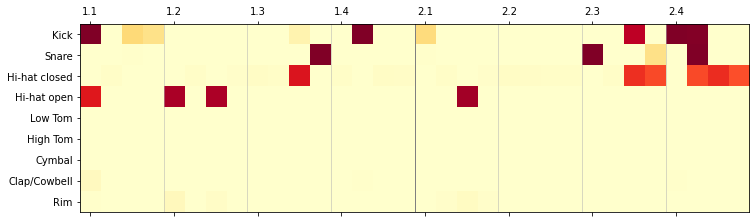

epoch: 258
m_d_loss: 0.321876366250217     m_g_loss: 3.382231199380123


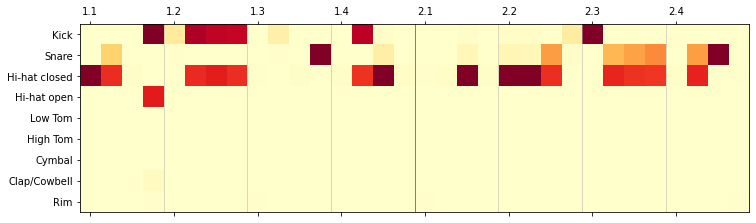

epoch: 259
m_d_loss: 0.3309904634952545     m_g_loss: 3.459531560088649


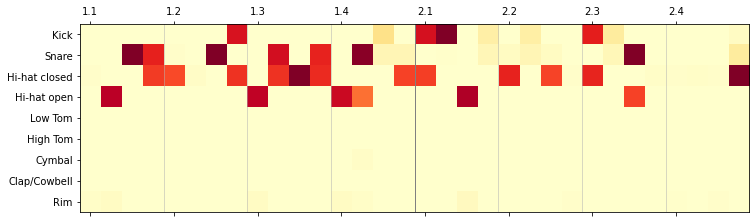

epoch: 260
m_d_loss: 0.3448440685868263     m_g_loss: 3.1332939754832876


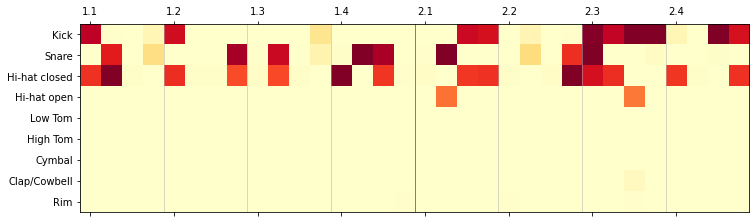

epoch: 261
m_d_loss: 0.3325055629014968     m_g_loss: 3.1447194706309927


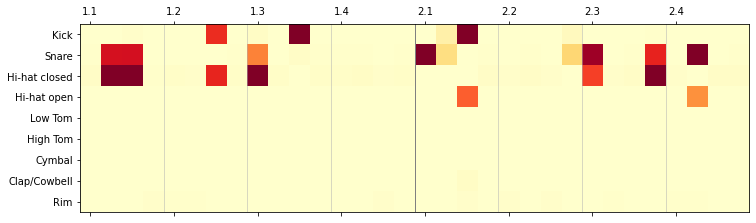

epoch: 262
m_d_loss: 0.32752740308642386     m_g_loss: 3.4064530314821186


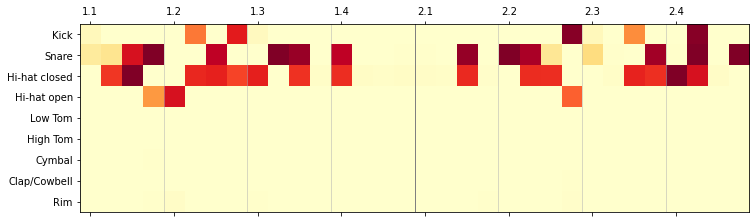

epoch: 263
m_d_loss: 0.32668181798037355     m_g_loss: 3.541604020378806


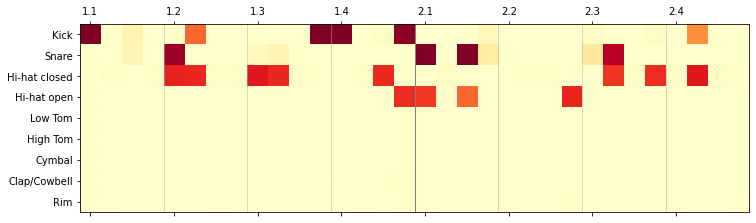

epoch: 264
m_d_loss: 0.333621996641159     m_g_loss: 3.4004677497979365


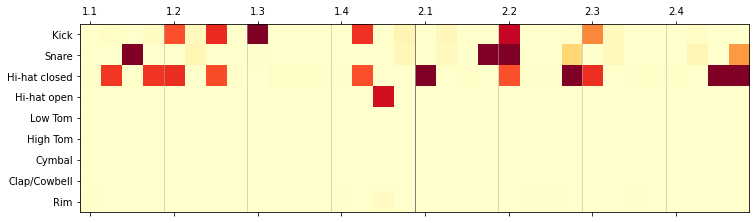

epoch: 265
m_d_loss: 0.3235639039207907     m_g_loss: 3.415418834397287


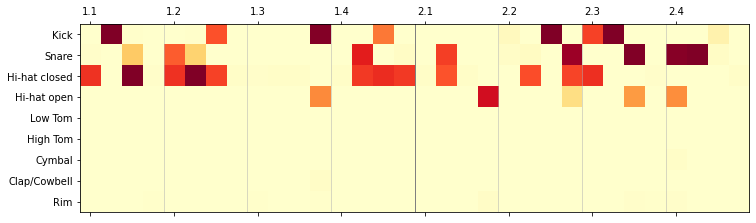

epoch: 266
m_d_loss: 0.32032722756266596     m_g_loss: 3.513202667236328


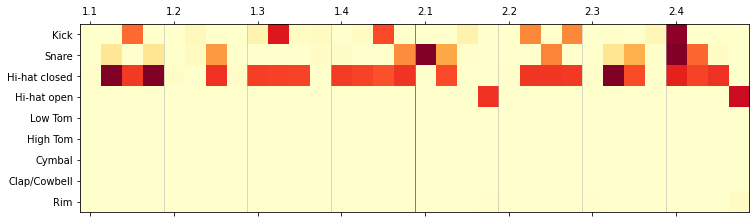

epoch: 267
m_d_loss: 0.3232205582015655     m_g_loss: 3.465848698760524


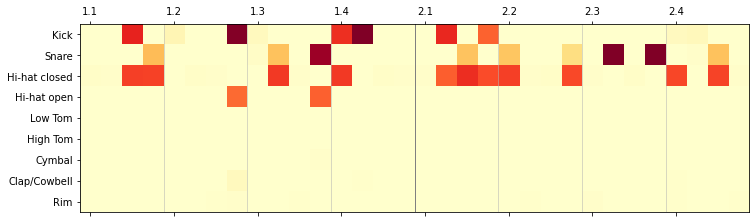

epoch: 268
m_d_loss: 0.3159061759710312     m_g_loss: 3.627477284633752


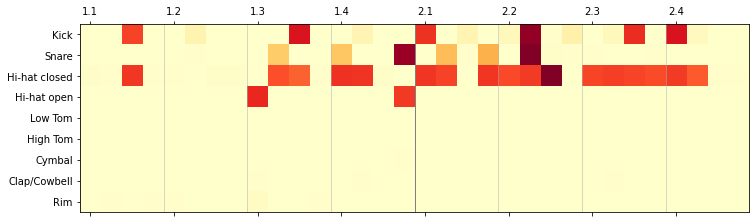

epoch: 269
m_d_loss: 0.3289590225500219     m_g_loss: 3.528662905548558


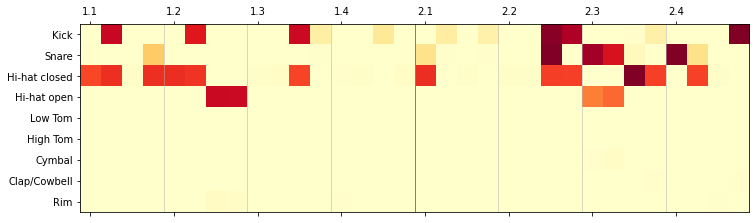

epoch: 270
m_d_loss: 0.3239435266703367     m_g_loss: 3.417137319391424


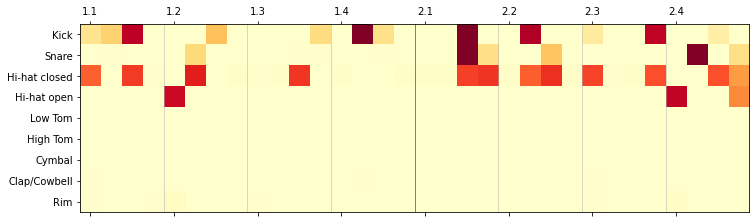

epoch: 271
m_d_loss: 0.32004574993077445     m_g_loss: 3.559450965939146


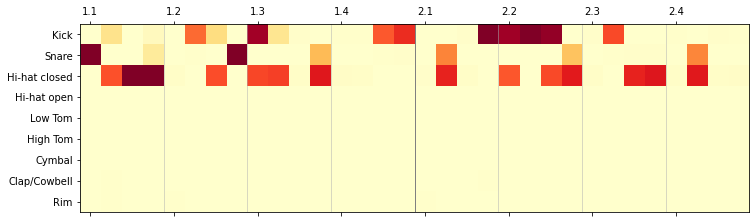

epoch: 272
m_d_loss: 0.3296108953654766     m_g_loss: 3.5462665124373003


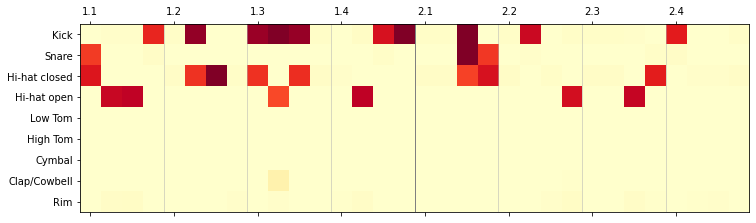

epoch: 273
m_d_loss: 0.33158632849945746     m_g_loss: 3.3993340622295034


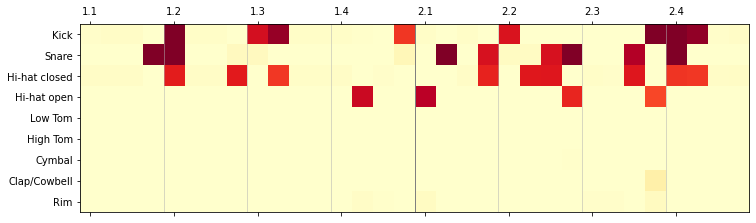

epoch: 274
m_d_loss: 0.3268225457519293     m_g_loss: 3.494059252016472


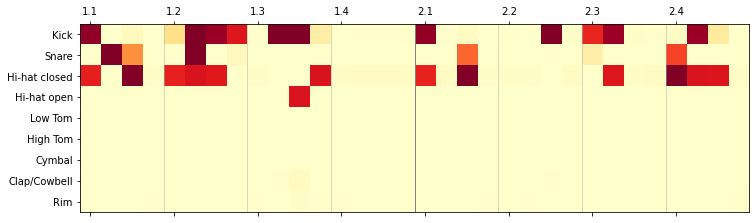

epoch: 275
m_d_loss: 0.32163539458723633     m_g_loss: 3.539221915331754


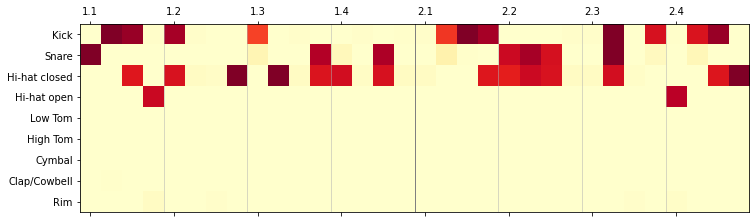

epoch: 276
m_d_loss: 0.32924266811460257     m_g_loss: 3.359272256042018


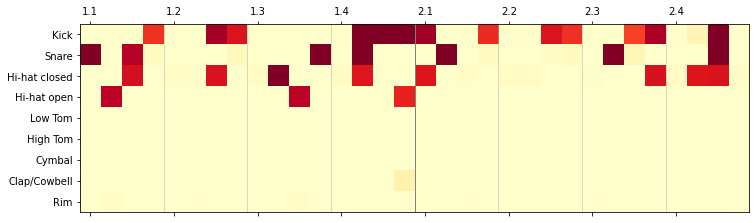

epoch: 277
m_d_loss: 0.32275569789549885     m_g_loss: 3.5075815518697104


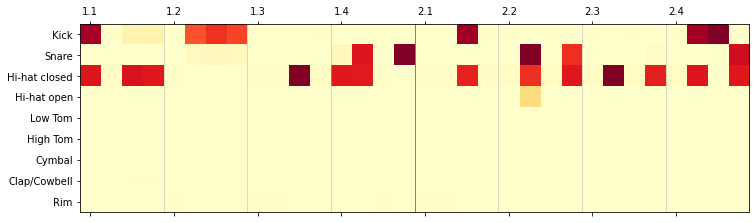

epoch: 278
m_d_loss: 0.3184120122343302     m_g_loss: 3.468235882845792


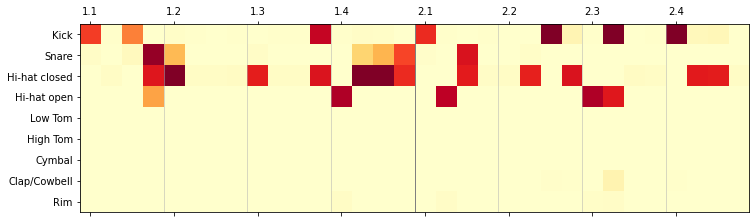

epoch: 279
m_d_loss: 0.3287993539782132     m_g_loss: 3.525249820767027


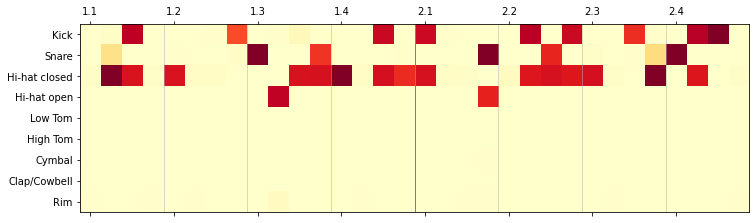

epoch: 280
m_d_loss: 0.322702482715249     m_g_loss: 3.500611095717459


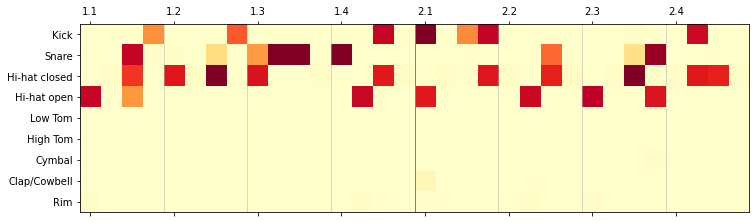

epoch: 281
m_d_loss: 0.3291089976535124     m_g_loss: 3.5953021627483945


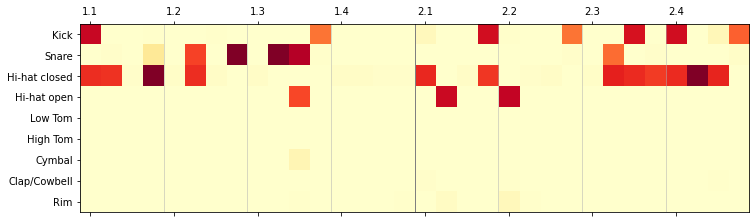

epoch: 282
m_d_loss: 0.33317951261997225     m_g_loss: 3.454431172573205


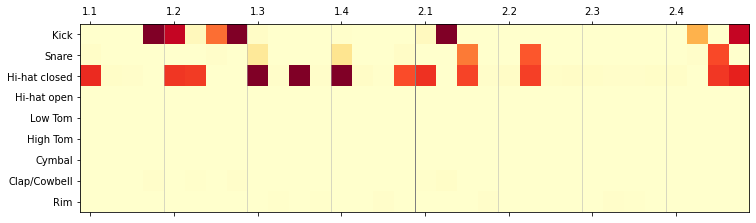

epoch: 283
m_d_loss: 0.3185720310491674     m_g_loss: 3.442639704906579


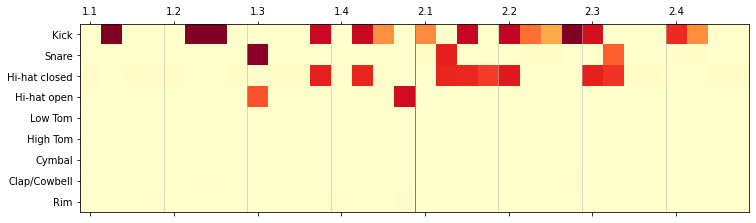

epoch: 284
m_d_loss: 0.32119257804006335     m_g_loss: 3.521409106977058


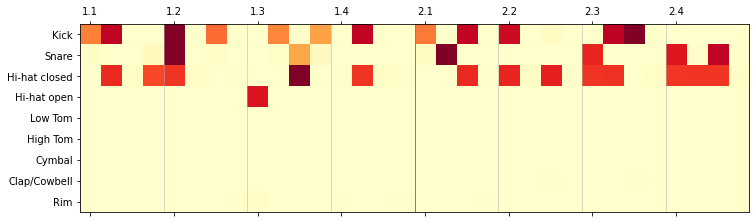

epoch: 285
m_d_loss: 0.32774761810022246     m_g_loss: 3.427883328813495


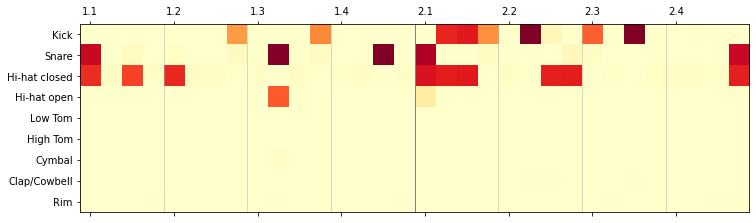

epoch: 286
m_d_loss: 0.32467017248272895     m_g_loss: 3.4405683893145937


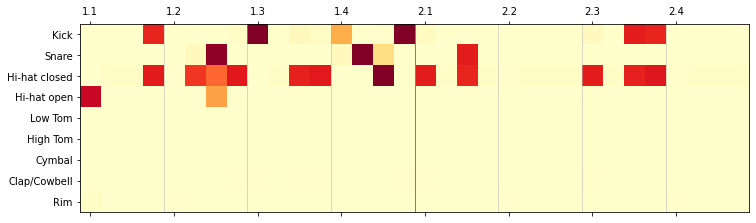

epoch: 287
m_d_loss: 0.3185083143851336     m_g_loss: 3.6327440160693545


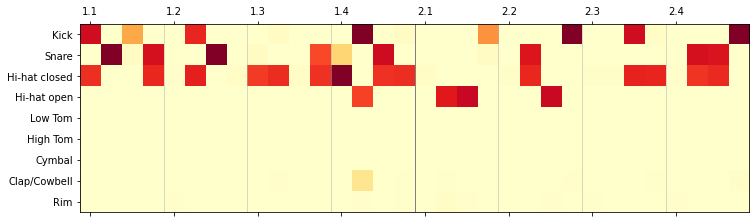

epoch: 288
m_d_loss: 0.31604159232228995     m_g_loss: 3.54817516153509


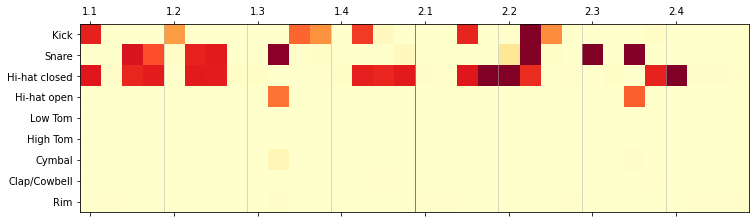

epoch: 289
m_d_loss: 0.3233779372537838     m_g_loss: 3.4909381649710913


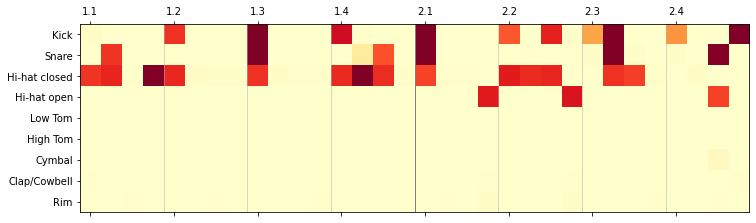

epoch: 290
m_d_loss: 0.32175435982644557     m_g_loss: 3.410608754013524


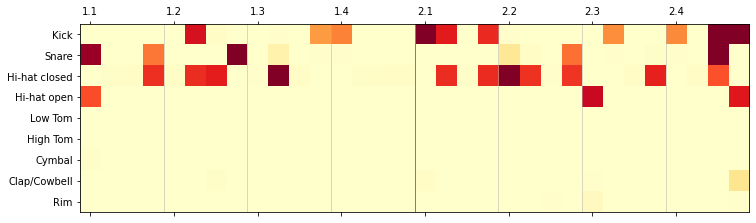

epoch: 291
m_d_loss: 0.3169558663578595     m_g_loss: 3.620415875405976


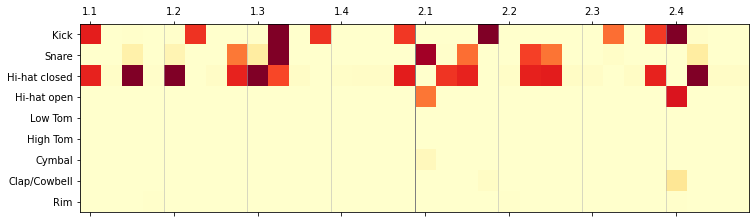

epoch: 292
m_d_loss: 0.31086986977607006     m_g_loss: 3.6962000023234975


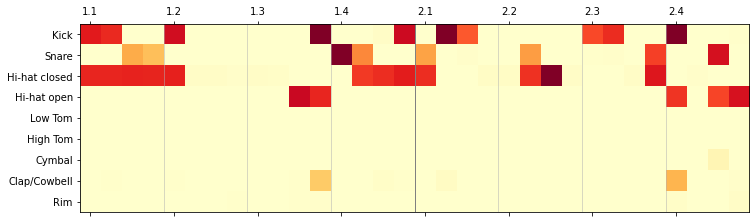

epoch: 293
m_d_loss: 0.31844834895694957     m_g_loss: 3.62383450161327


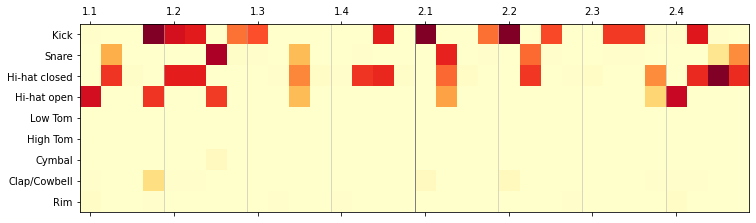

epoch: 294
m_d_loss: 0.31763904355466366     m_g_loss: 3.514246261481083


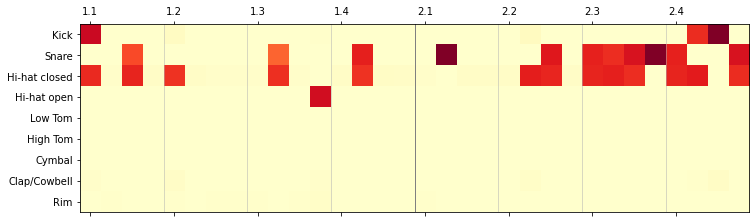

epoch: 295
m_d_loss: 0.31627084770623376     m_g_loss: 3.622306621435917


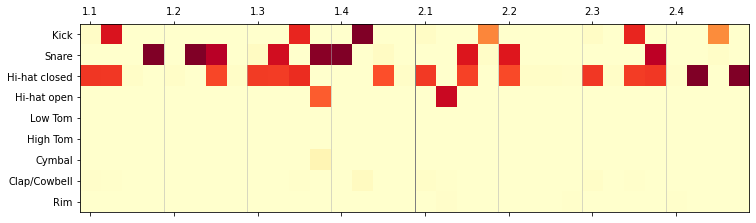

epoch: 296
m_d_loss: 0.3178875071927905     m_g_loss: 3.4879511919888584


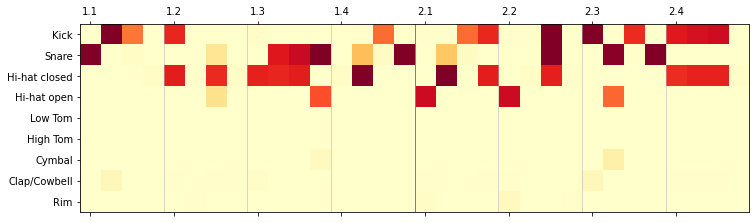

epoch: 297
m_d_loss: 0.317260600363507     m_g_loss: 3.595470327319521


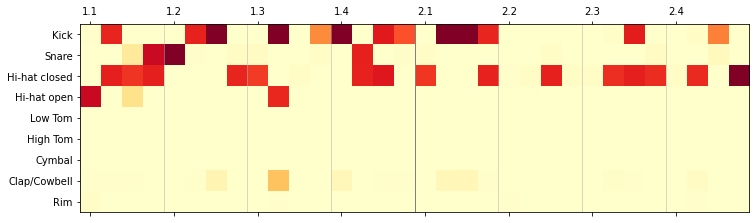

epoch: 298
m_d_loss: 0.3170551305636764     m_g_loss: 3.6096760359677402


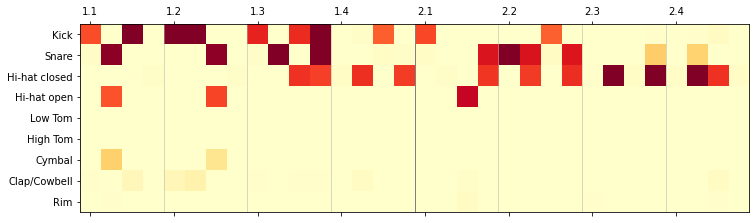

epoch: 299
m_d_loss: 0.31385374437360203     m_g_loss: 3.7217832695354116


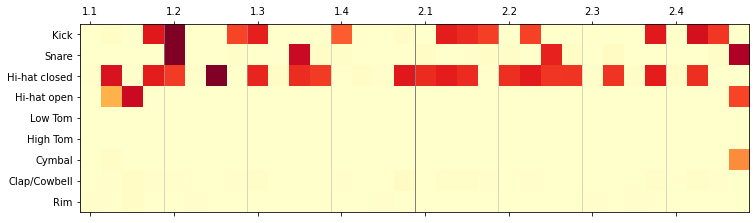

epoch: 300
m_d_loss: 0.30870273523032665     m_g_loss: 3.719511364445542


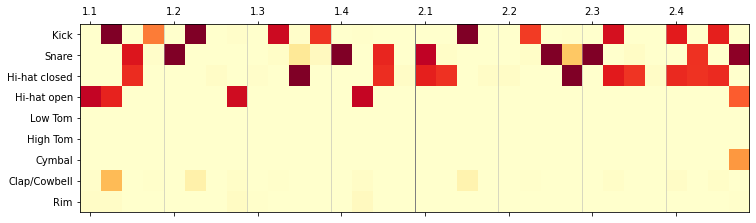

epoch: 301
m_d_loss: 0.3158106740783242     m_g_loss: 3.6458903803969873


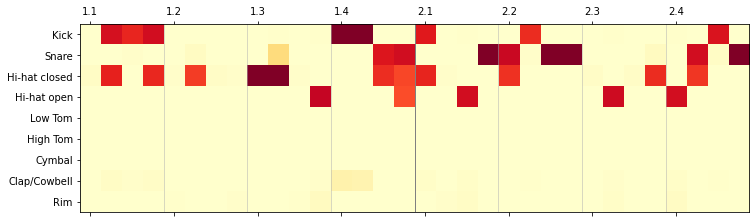

epoch: 302
m_d_loss: 0.3124662313610315     m_g_loss: 3.7764699242331763


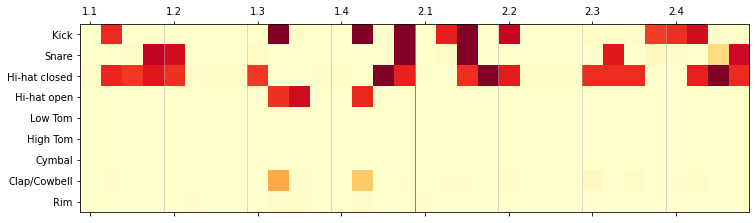

epoch: 303
m_d_loss: 0.31392153080771956     m_g_loss: 3.70374769153017


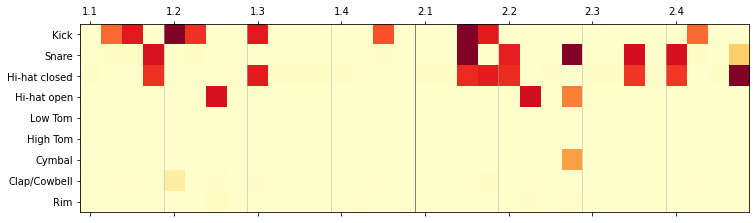

epoch: 304
m_d_loss: 0.31864965092390773     m_g_loss: 3.6102241602810947


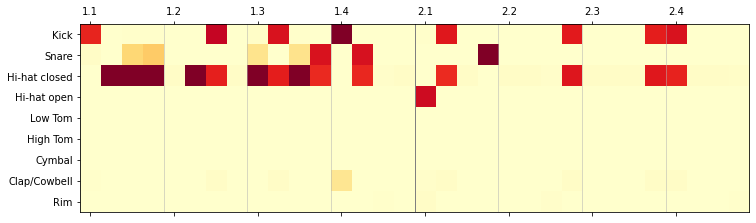

epoch: 305
m_d_loss: 0.3105686694383621     m_g_loss: 3.6869172688686485


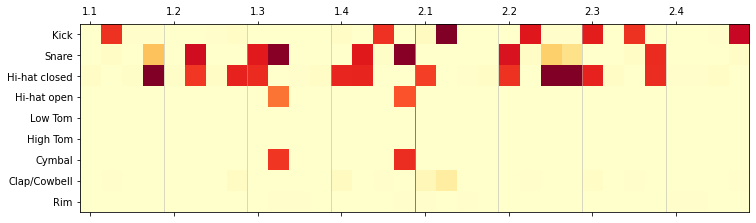

epoch: 306
m_d_loss: 0.3240717077627778     m_g_loss: 3.7015667684150464


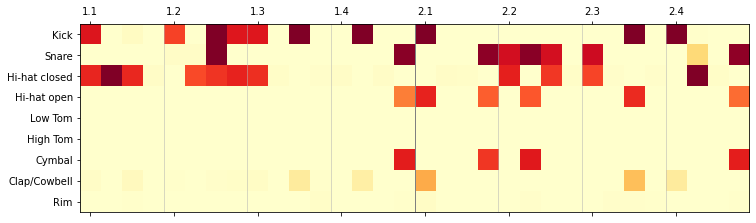

epoch: 307
m_d_loss: 0.32137541017111604     m_g_loss: 3.4688300074953022


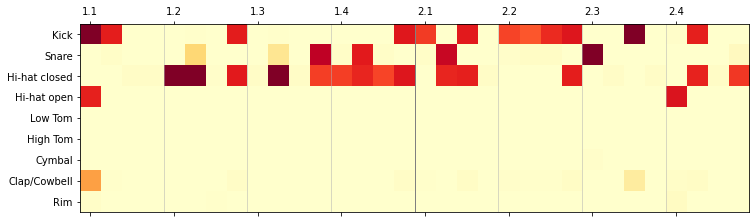

epoch: 308
m_d_loss: 0.31269350033253435     m_g_loss: 3.596462480949633


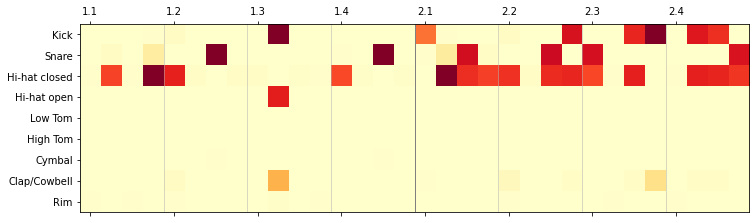

epoch: 309
m_d_loss: 0.3178128538762821     m_g_loss: 3.626051729375666


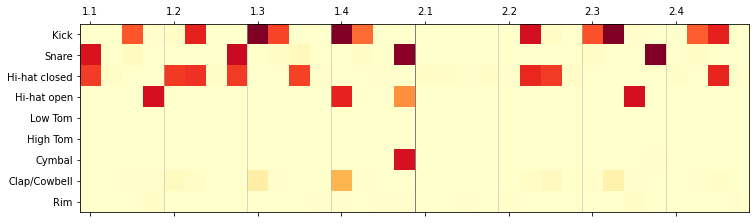

epoch: 310
m_d_loss: 0.3174205468967557     m_g_loss: 3.596551223234697


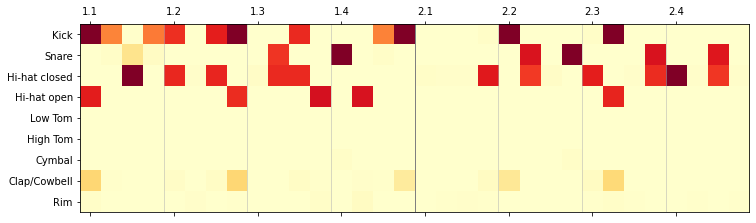

epoch: 311
m_d_loss: 0.3192812414730296     m_g_loss: 3.6325660980109014


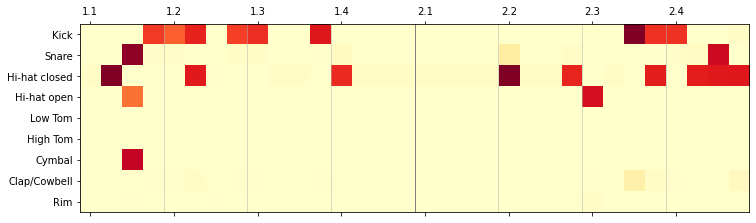

epoch: 312
m_d_loss: 0.3141013352200389     m_g_loss: 3.6871467648130474


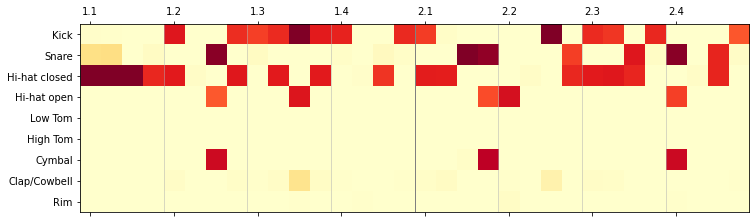

epoch: 313
m_d_loss: 0.3102968994308921     m_g_loss: 3.633464625387481


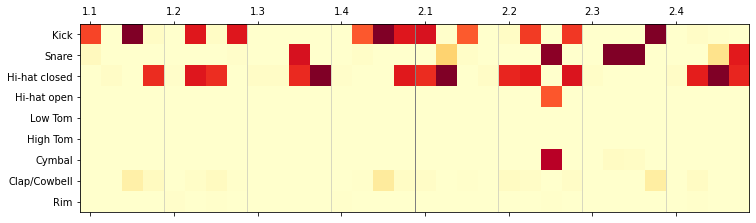

epoch: 314
m_d_loss: 0.3113421034067869     m_g_loss: 3.8082850846377285


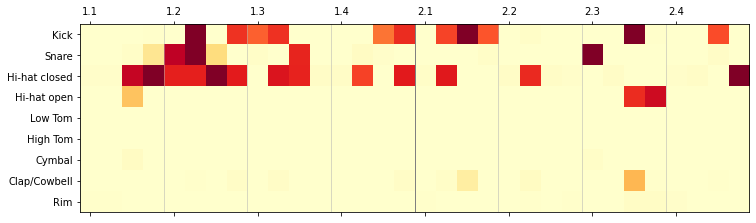

epoch: 315
m_d_loss: 0.3091227648889317     m_g_loss: 3.7834899136514375


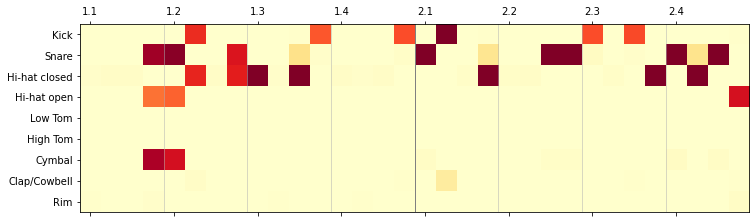

epoch: 316
m_d_loss: 0.31934353876858956     m_g_loss: 3.6618164886127818


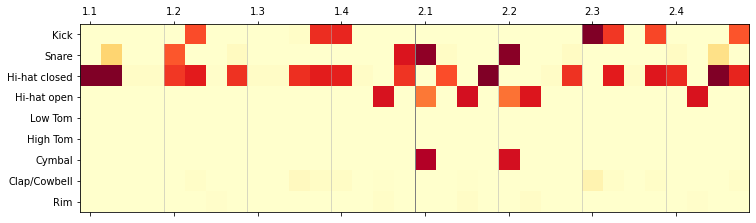

epoch: 317
m_d_loss: 0.3087744167622398     m_g_loss: 3.7441163207545425


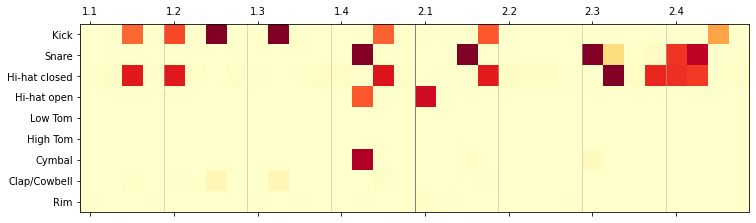

epoch: 318
m_d_loss: 0.3120917115360499     m_g_loss: 3.7323376337687173


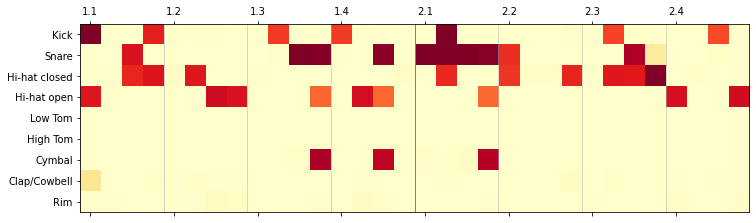

epoch: 319
m_d_loss: 0.31941226843525383     m_g_loss: 3.7005717104131524


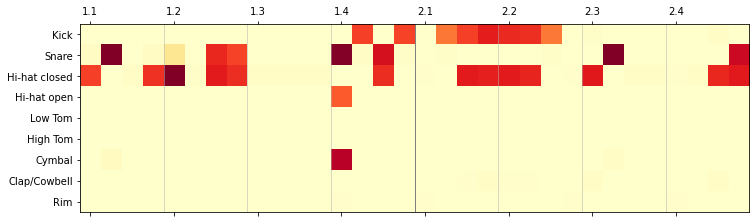

epoch: 320
m_d_loss: 0.326173348724842     m_g_loss: 3.5394566492600874


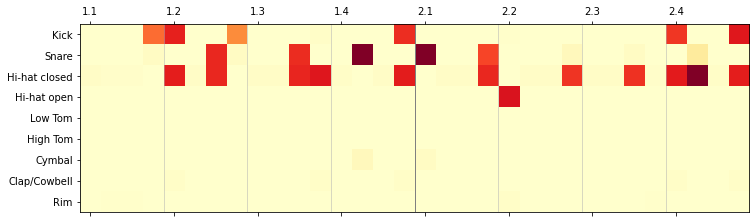

epoch: 321
m_d_loss: 0.3172792487284717     m_g_loss: 3.5545583132541543


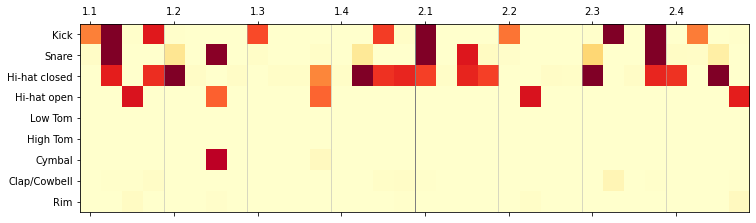

epoch: 322
m_d_loss: 0.3142724948003889     m_g_loss: 3.664678443561901


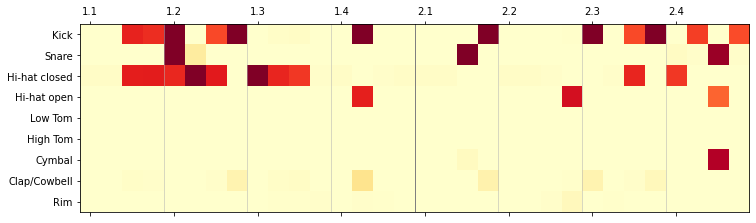

epoch: 323
m_d_loss: 0.31701253021464637     m_g_loss: 3.579705946373217


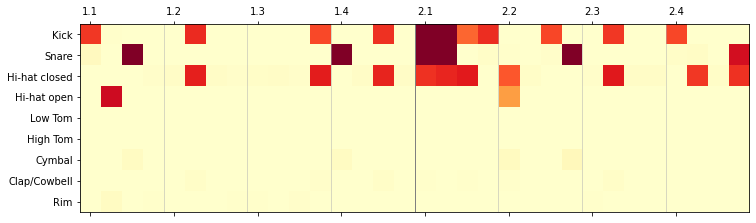

epoch: 324
m_d_loss: 0.3113513957709074     m_g_loss: 3.6442180546847256


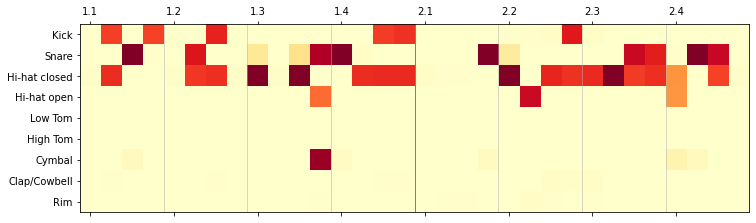

epoch: 325
m_d_loss: 0.3194197726600311     m_g_loss: 3.6506769079150576


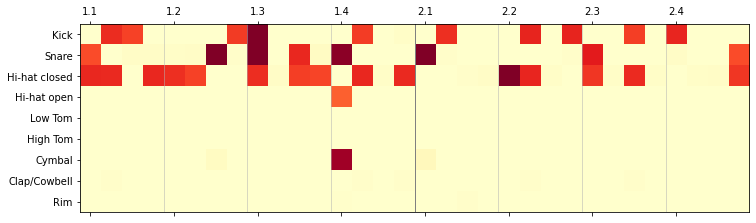

epoch: 326
m_d_loss: 0.314361659437418     m_g_loss: 3.655117179408218


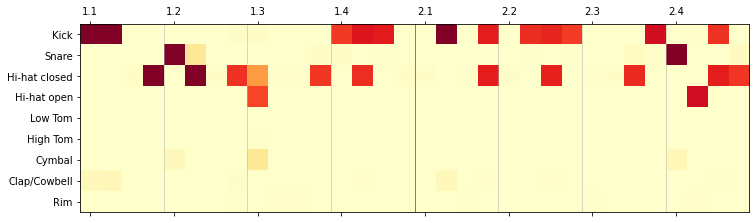

epoch: 327
m_d_loss: 0.30866761347826793     m_g_loss: 3.6798767032045308


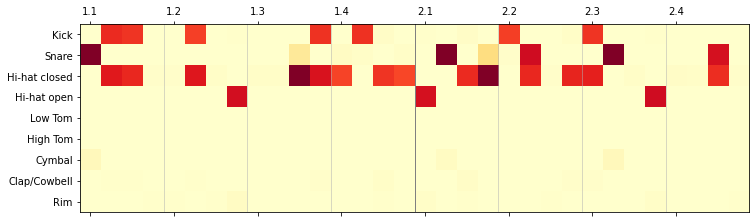

epoch: 328
m_d_loss: 0.30718291234225037     m_g_loss: 3.7636565367380777


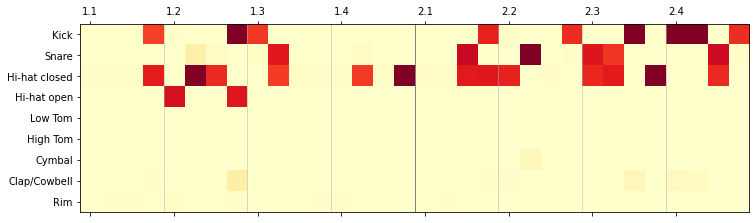

epoch: 329
m_d_loss: 0.3138081938028336     m_g_loss: 3.604836109912757


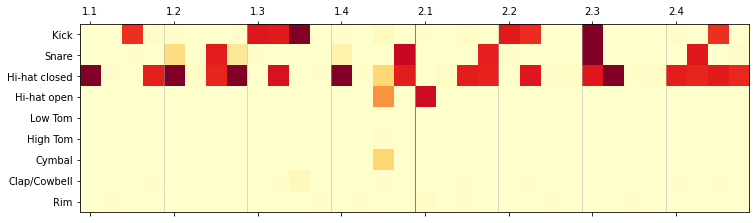

epoch: 330
m_d_loss: 0.3021381869912147     m_g_loss: 3.6830325921376548


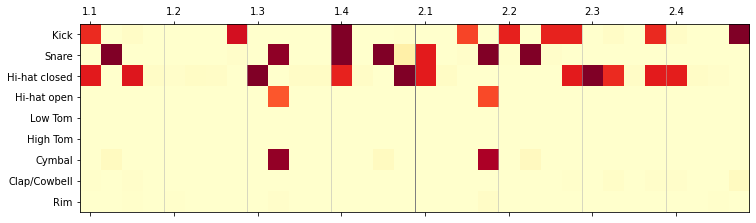

epoch: 331
m_d_loss: 0.31040198171839994     m_g_loss: 3.7198442329059946


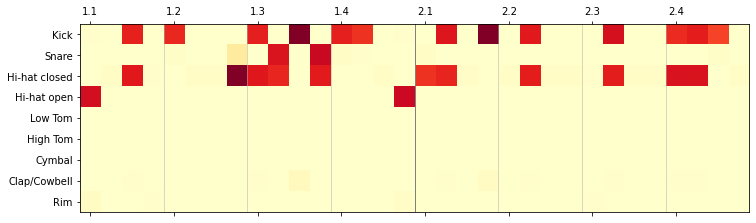

epoch: 332
m_d_loss: 0.30737438183277843     m_g_loss: 3.770487489122333


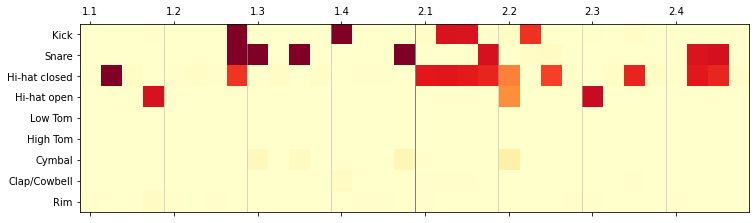

epoch: 333
m_d_loss: 0.31248718973468337     m_g_loss: 3.748317581234556


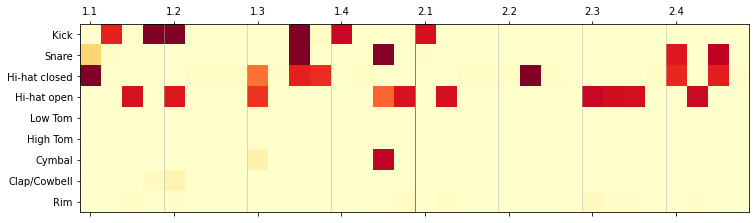

epoch: 334
m_d_loss: 0.31459677219390875     m_g_loss: 3.7144230929288


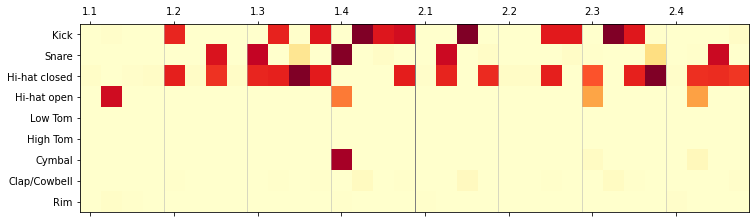

epoch: 335
m_d_loss: 0.3107109327526652     m_g_loss: 3.69111003297748


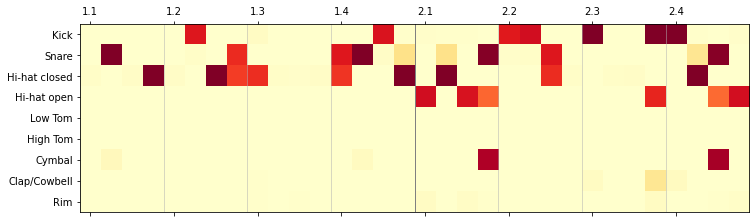

epoch: 336
m_d_loss: 0.3129082815721631     m_g_loss: 3.653384468772195


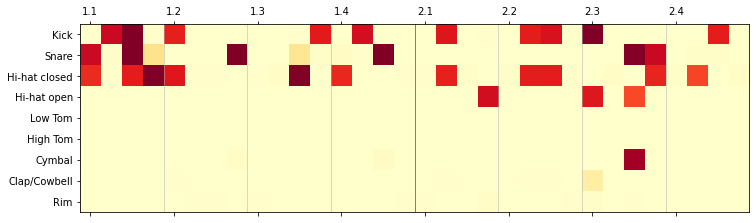

epoch: 337
m_d_loss: 0.3182269038522946     m_g_loss: 3.529337536204945


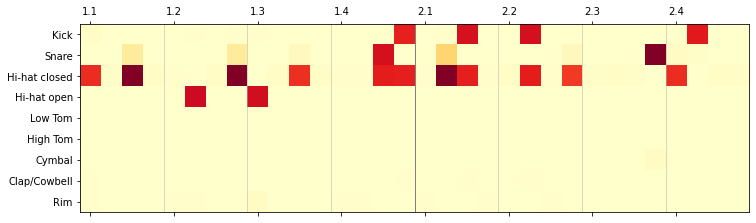

epoch: 338
m_d_loss: 0.3056392569094897     m_g_loss: 3.679659540002996


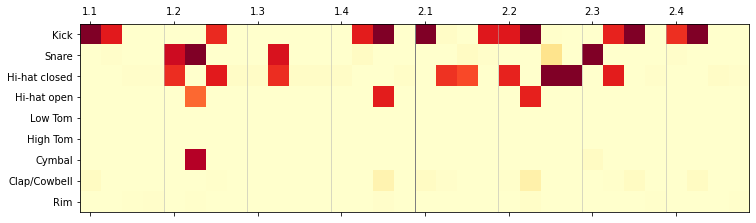

epoch: 339
m_d_loss: 0.31209461005295025     m_g_loss: 3.6998296867717397


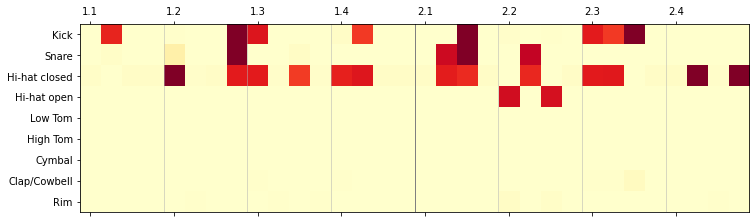

epoch: 340
m_d_loss: 0.30660410802811383     m_g_loss: 3.7640887029243237


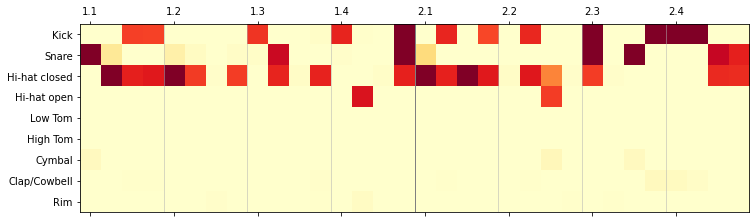

epoch: 341
m_d_loss: 0.30842506815405457     m_g_loss: 3.6756792574217827


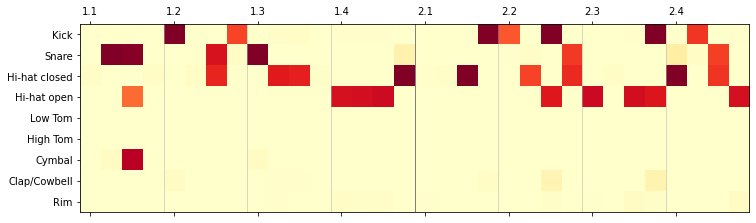

epoch: 342
m_d_loss: 0.31558577045798303     m_g_loss: 3.7661166335597183


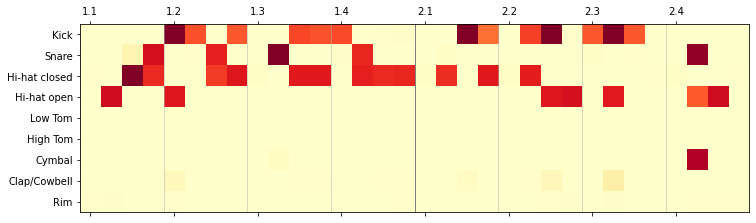

epoch: 343
m_d_loss: 0.3085207511396969     m_g_loss: 3.7865711269956646


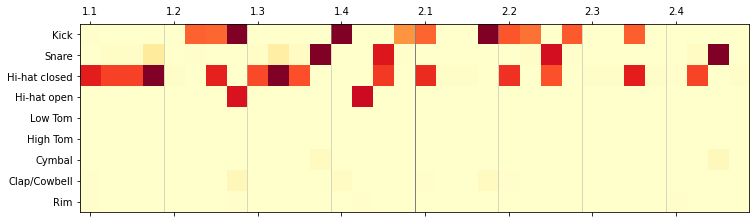

epoch: 344
m_d_loss: 0.3203717663884163     m_g_loss: 3.570342085578225


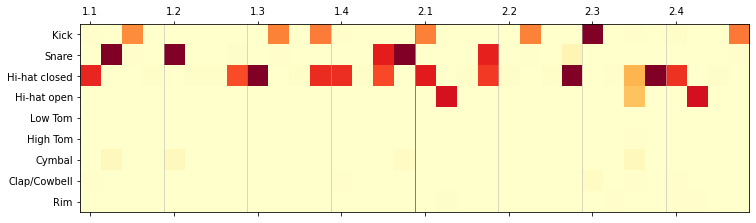

epoch: 345
m_d_loss: 0.3080777098150814     m_g_loss: 3.625853495164351


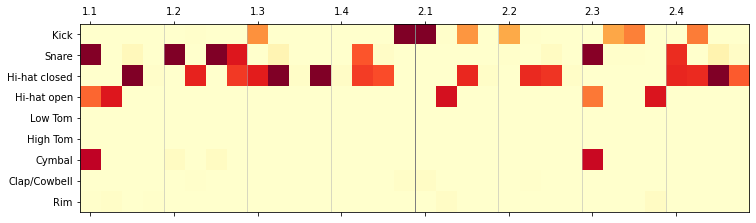

epoch: 346
m_d_loss: 0.3119064932689071     m_g_loss: 3.5322693983713784


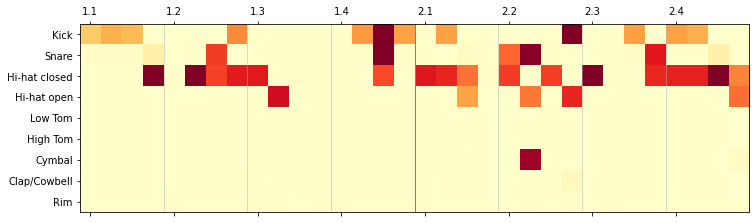

epoch: 347
m_d_loss: 0.3042026232270634     m_g_loss: 3.747687982790398


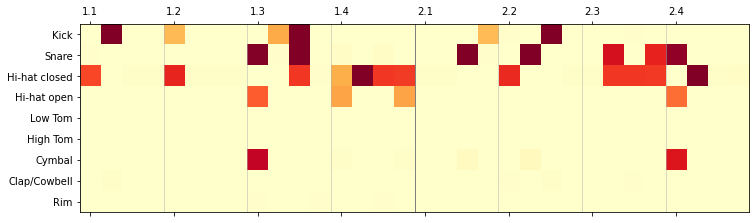

epoch: 348
m_d_loss: 0.30588707346469163     m_g_loss: 3.6028095592151987


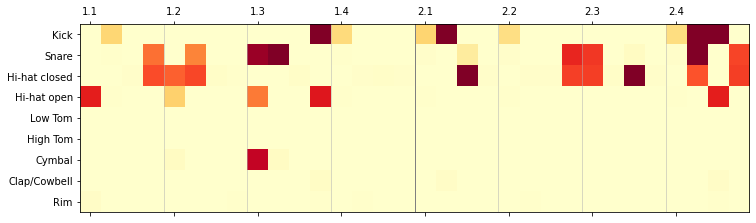

epoch: 349
m_d_loss: 0.30290487391107224     m_g_loss: 3.6550889593182188


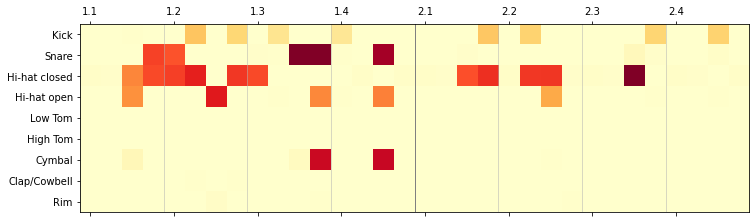

epoch: 350
m_d_loss: 0.30266449581831695     m_g_loss: 3.8349599982752944


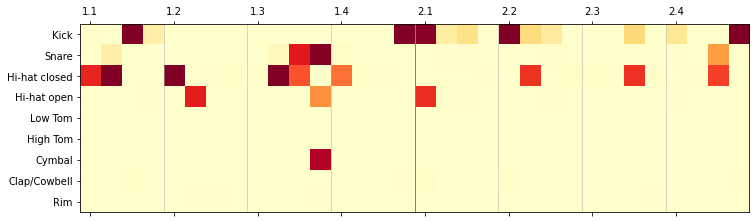

epoch: 351
m_d_loss: 0.30209342942518347     m_g_loss: 3.865390517494895


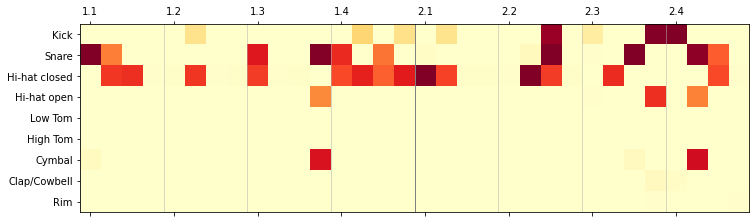

epoch: 352
m_d_loss: 0.30595635101199153     m_g_loss: 3.75693847916343


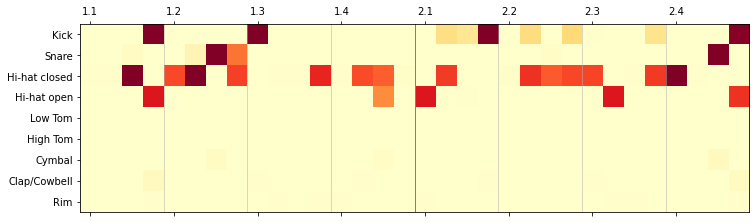

epoch: 353
m_d_loss: 0.29641367617775416     m_g_loss: 3.77407152002508


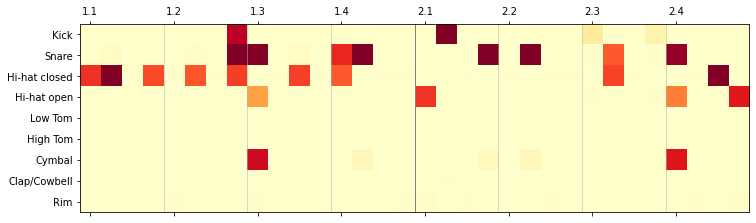

epoch: 354
m_d_loss: 0.3006292628124356     m_g_loss: 3.867112484845248


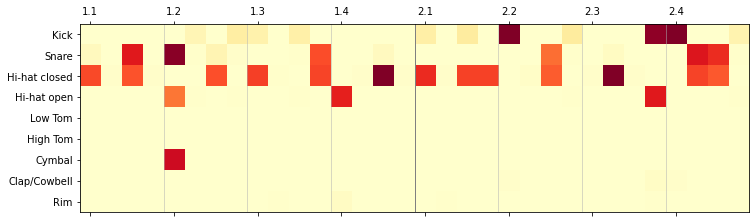

epoch: 355
m_d_loss: 0.2971255304182277     m_g_loss: 3.8717597831379282


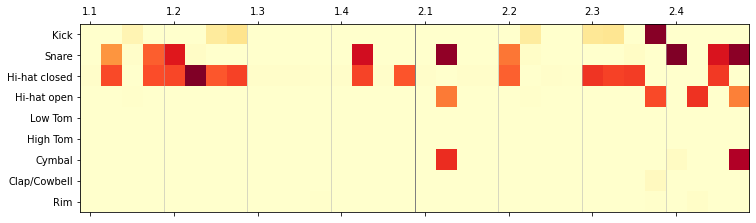

epoch: 356
m_d_loss: 0.2972212001681328     m_g_loss: 3.7955759727593623


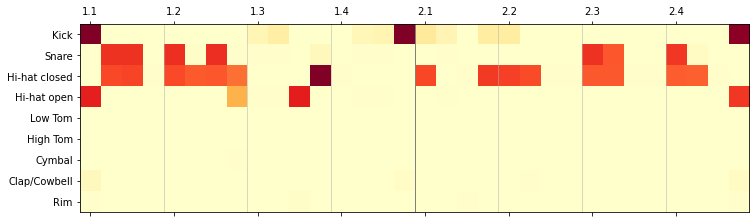

epoch: 357
m_d_loss: 0.29566710310823785     m_g_loss: 3.8661331552447695


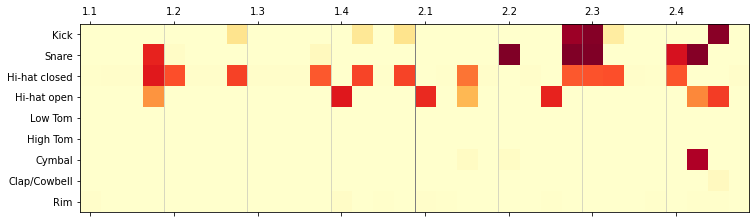

epoch: 358
m_d_loss: 0.2883344361558557     m_g_loss: 3.859358469645182


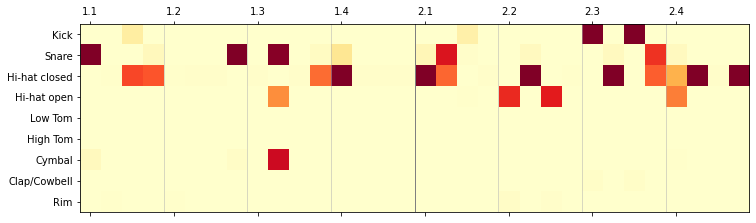

epoch: 359
m_d_loss: 0.2916000715073417     m_g_loss: 4.012610493284283


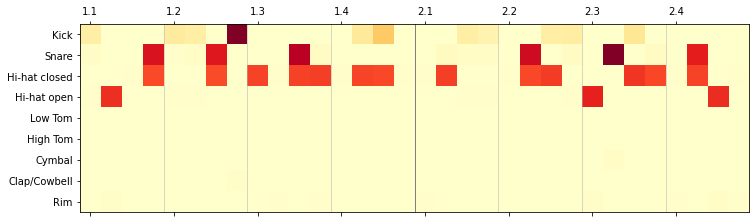

epoch: 360
m_d_loss: 0.2934941470623017     m_g_loss: 3.970102021188447


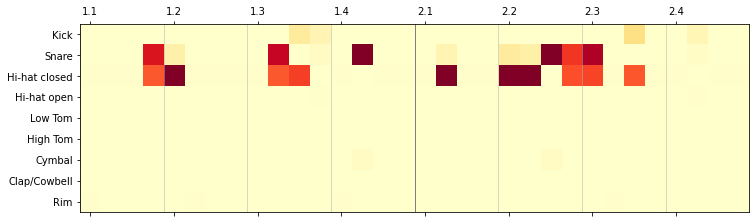

epoch: 361
m_d_loss: 0.28574186931638157     m_g_loss: 3.88018004099528


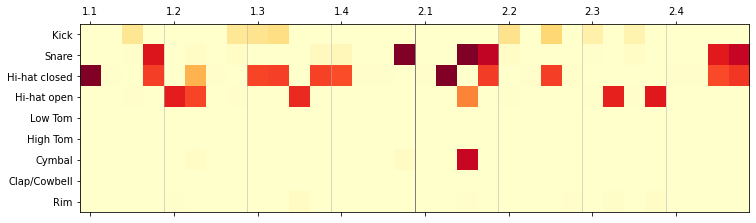

epoch: 362
m_d_loss: 0.2945926928892732     m_g_loss: 3.899146881970492


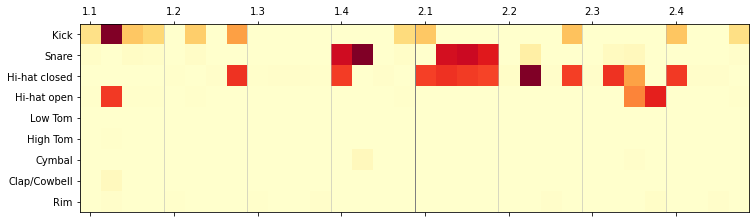

epoch: 363
m_d_loss: 0.29729920538032756     m_g_loss: 3.783071250626535


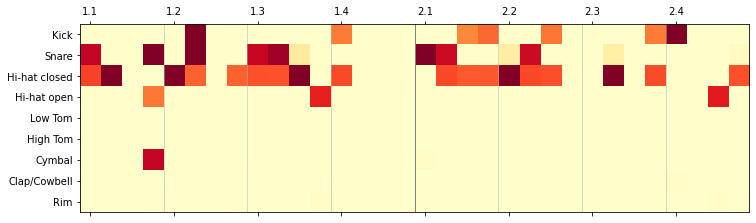

epoch: 364
m_d_loss: 0.31972764022648337     m_g_loss: 3.6625684463616572


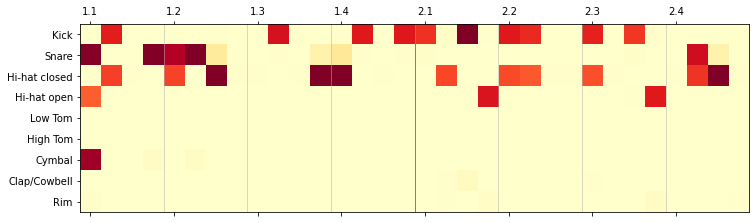

epoch: 365
m_d_loss: 0.3159449074198218     m_g_loss: 3.5653875452099424


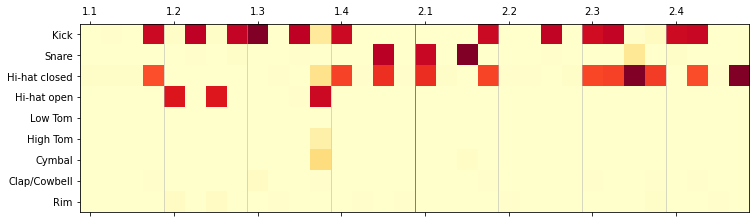

epoch: 366
m_d_loss: 0.31618304774165146     m_g_loss: 3.587840788292162


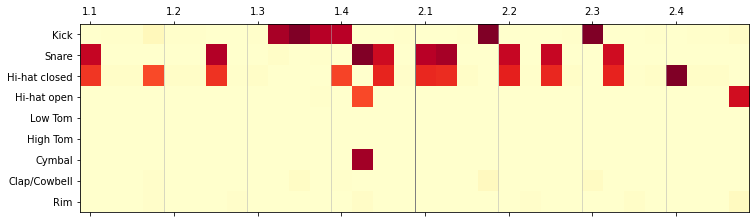

epoch: 367
m_d_loss: 0.3167166920269237     m_g_loss: 3.4888305736310556


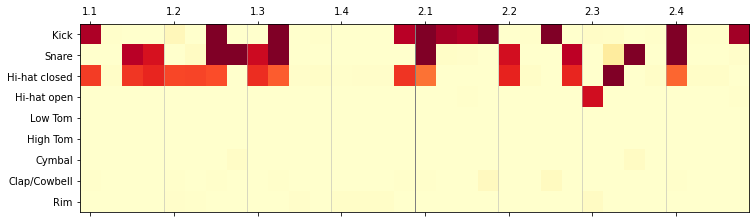

epoch: 368
m_d_loss: 0.31873386446386576     m_g_loss: 3.5440495519927055


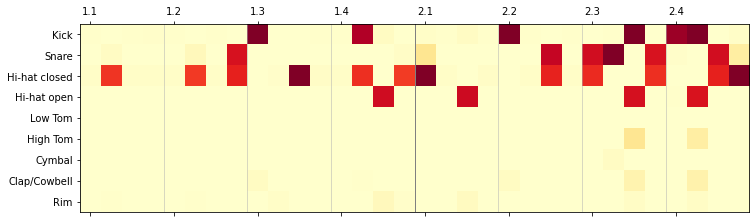

epoch: 369
m_d_loss: 0.3176186814027674     m_g_loss: 3.5885099642204517


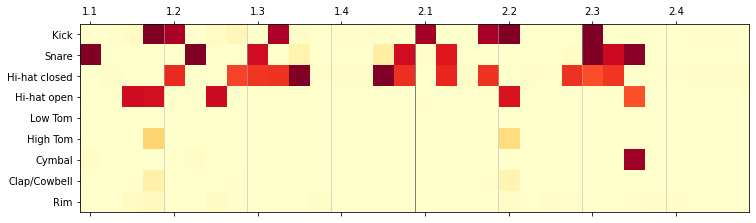

epoch: 370
m_d_loss: 0.31379662230610844     m_g_loss: 3.692361911137899


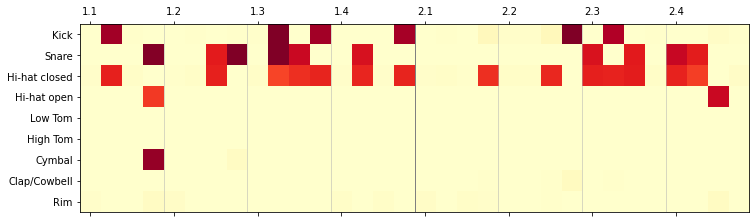

epoch: 371
m_d_loss: 0.30564592883867375     m_g_loss: 3.766047463272557


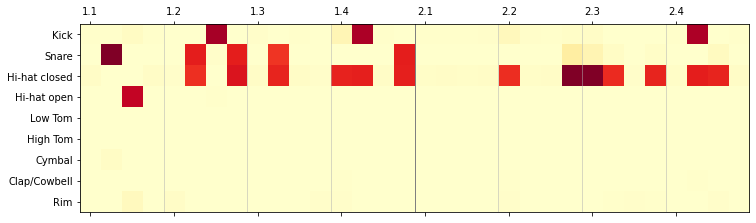

epoch: 372
m_d_loss: 0.31181314885616307     m_g_loss: 3.7574961040959214


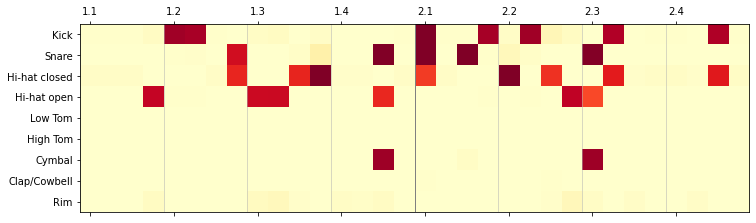

epoch: 373
m_d_loss: 0.30582083025399376     m_g_loss: 3.8270863764213794


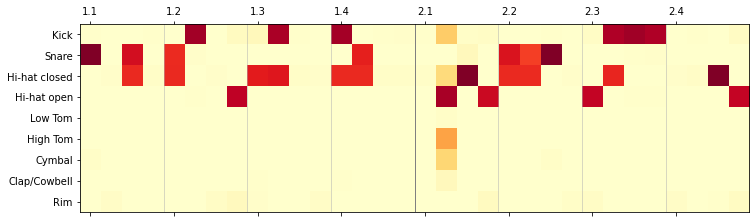

epoch: 374
m_d_loss: 0.3013430394232273     m_g_loss: 3.7929542353658965


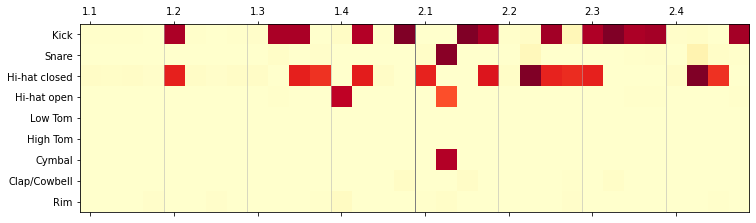

epoch: 375
m_d_loss: 0.3165312237599317     m_g_loss: 3.6746362122622402


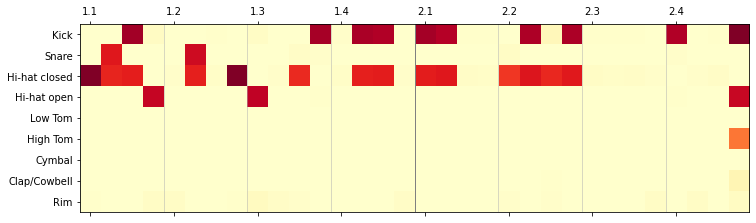

epoch: 376
m_d_loss: 0.3075050365179777     m_g_loss: 3.663340778061838


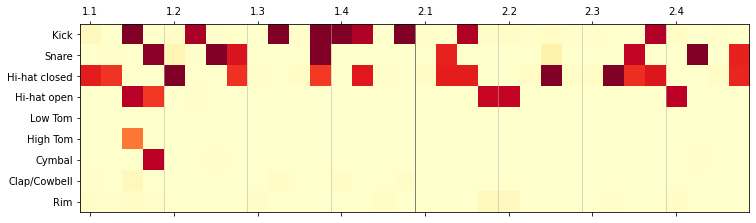

epoch: 377
m_d_loss: 0.313909959617783     m_g_loss: 3.7417406168850986


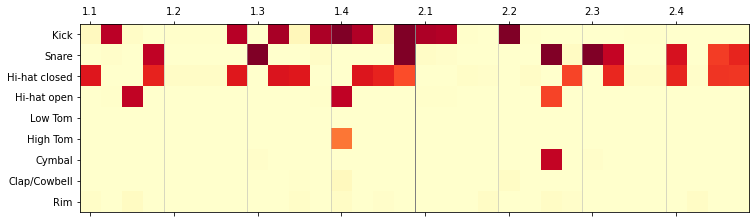

epoch: 378
m_d_loss: 0.3051417702808977     m_g_loss: 3.6418095429738364


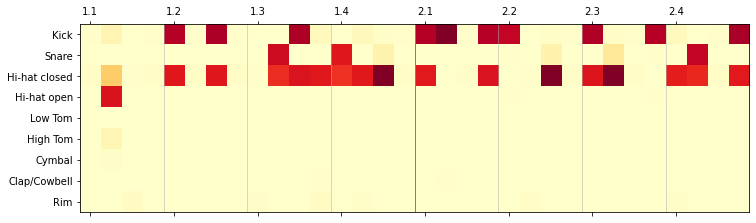

epoch: 379
m_d_loss: 0.2988633054144242     m_g_loss: 3.7705159187316895


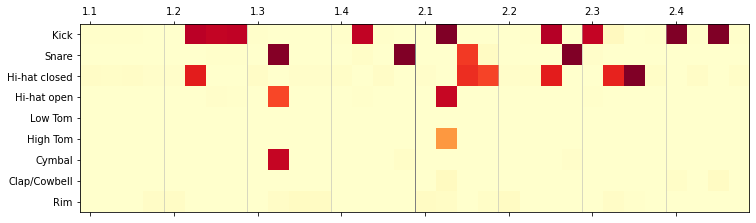

epoch: 380
m_d_loss: 0.3092799175530672     m_g_loss: 3.6936082261981387


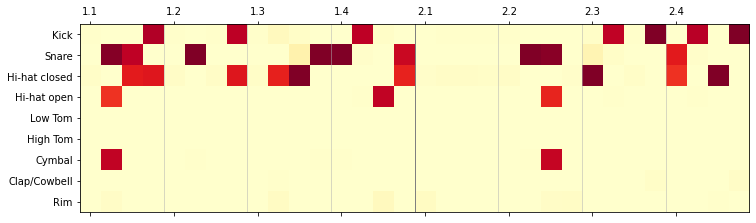

epoch: 381
m_d_loss: 0.3039497824276195     m_g_loss: 3.7106636437502774


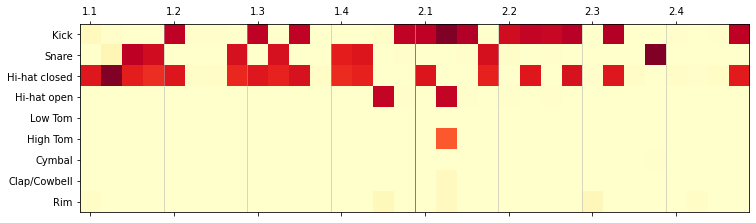

epoch: 382
m_d_loss: 0.3047686167061329     m_g_loss: 3.6456540353370435


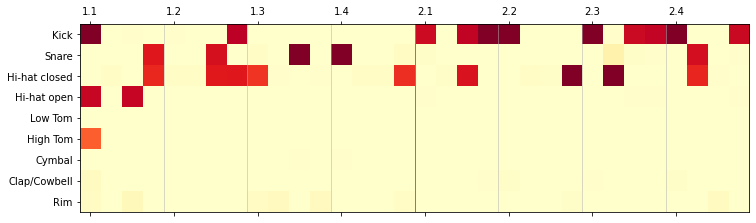

epoch: 383
m_d_loss: 0.31593068767996396     m_g_loss: 3.5581520037217573


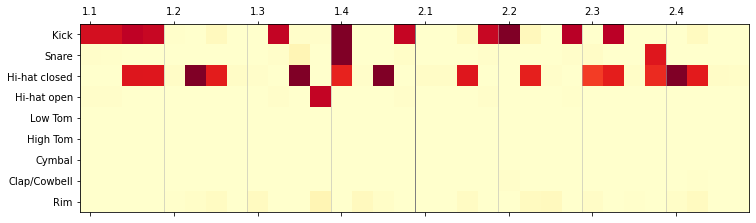

epoch: 384
m_d_loss: 0.3062819421291352     m_g_loss: 3.8004145261013145


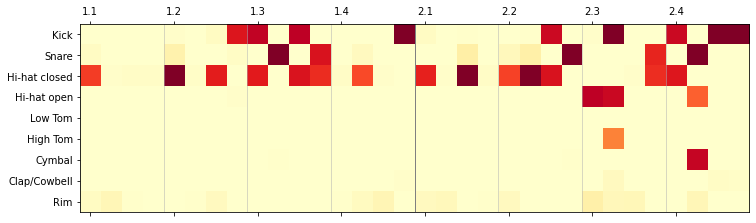

epoch: 385
m_d_loss: 0.30844283261719874     m_g_loss: 3.79239432739489


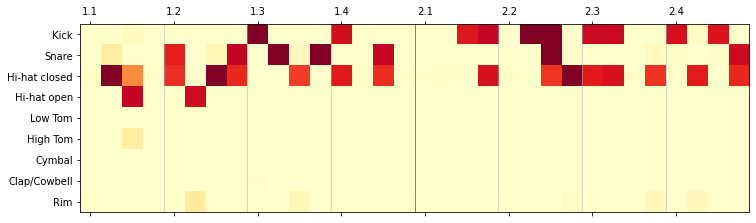

epoch: 386
m_d_loss: 0.31116597354412084     m_g_loss: 3.7971478809009898


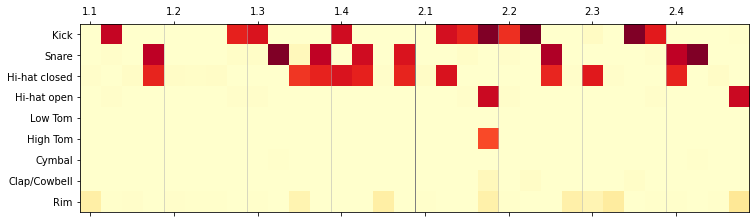

epoch: 387
m_d_loss: 0.30690973155638746     m_g_loss: 3.733729059045965


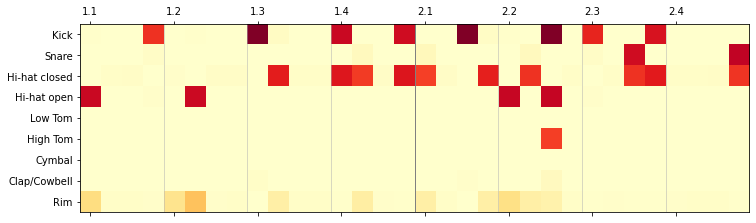

epoch: 388
m_d_loss: 0.3185350988060236     m_g_loss: 3.688210545164166


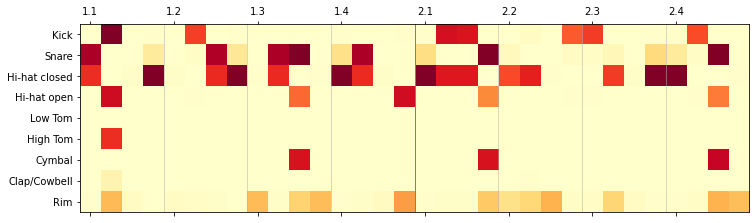

epoch: 389
m_d_loss: 0.3235501767957911     m_g_loss: 3.640231067484075


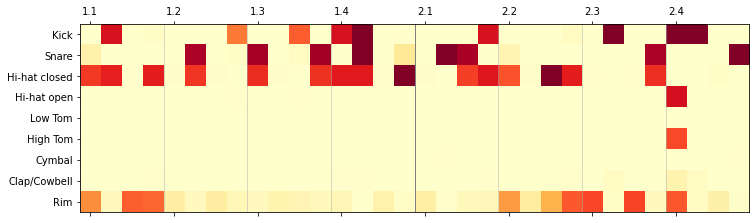

epoch: 390
m_d_loss: 0.3467908242717385     m_g_loss: 3.449952407316728


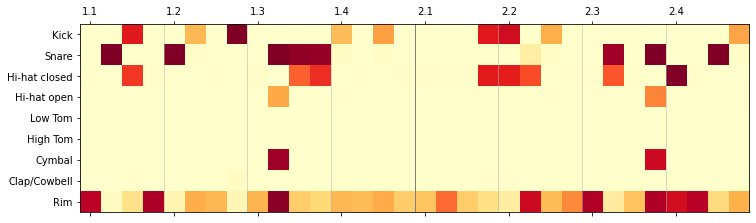

epoch: 391
m_d_loss: 0.31448172523694873     m_g_loss: 3.5066841876868047


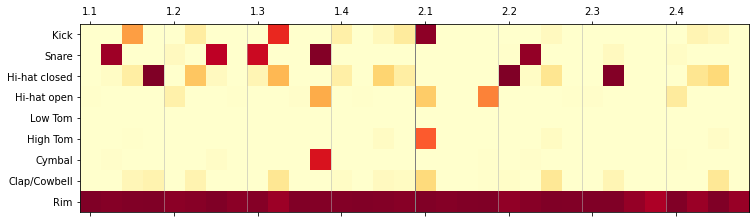

epoch: 392
m_d_loss: 0.22184435985982418     m_g_loss: 4.599050254532785


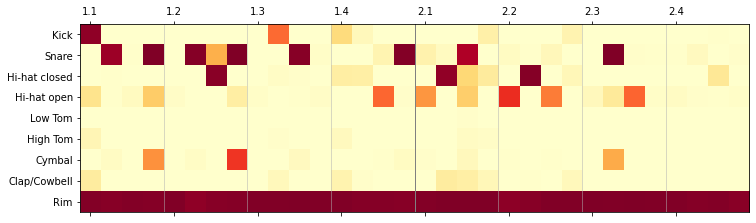

epoch: 393
m_d_loss: 0.21159470414414125     m_g_loss: 5.069855574405555


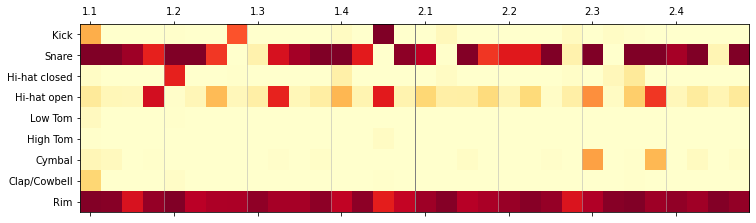

epoch: 394
m_d_loss: 0.3107574658468366     m_g_loss: 3.839927969556866


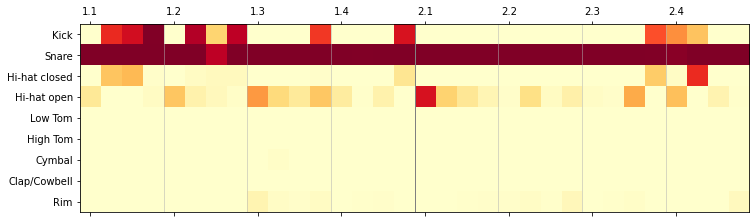

epoch: 395
m_d_loss: 0.2785240678226246     m_g_loss: 3.8732188976172246


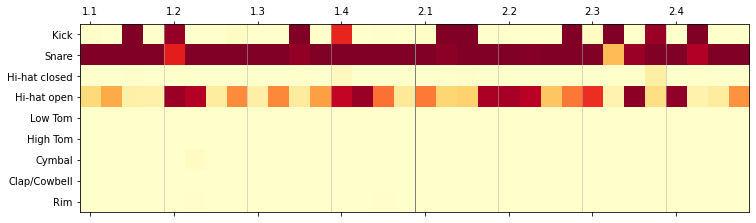

epoch: 396
m_d_loss: 0.35711345300078395     m_g_loss: 3.759024988521229


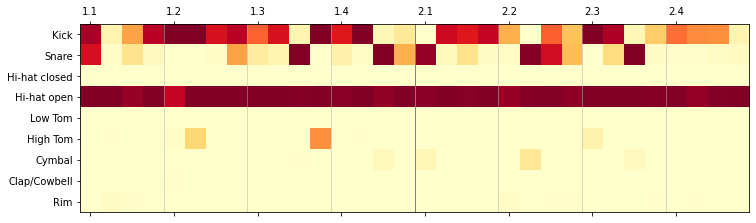

epoch: 397
m_d_loss: 0.5048387576551998     m_g_loss: 2.544920719031132


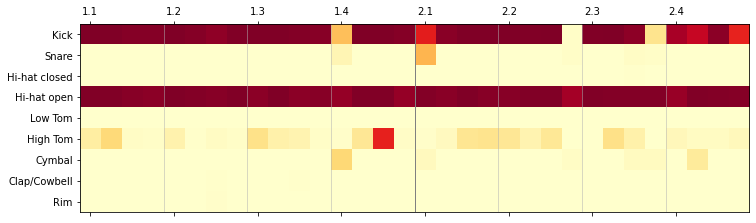

epoch: 398
m_d_loss: 0.33864580802619454     m_g_loss: 3.3312332413413306


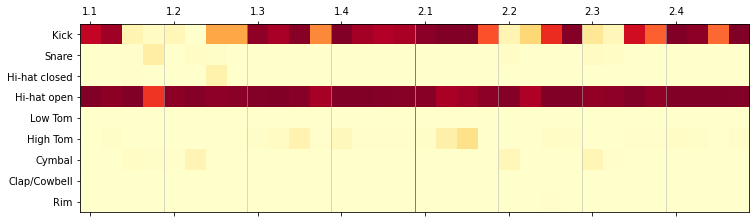

epoch: 399
m_d_loss: 0.2674726999857846     m_g_loss: 4.008018912691059


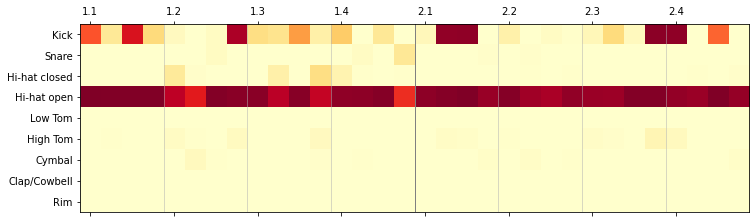

epoch: 400
m_d_loss: 0.23838248290121555     m_g_loss: 4.509397333318537


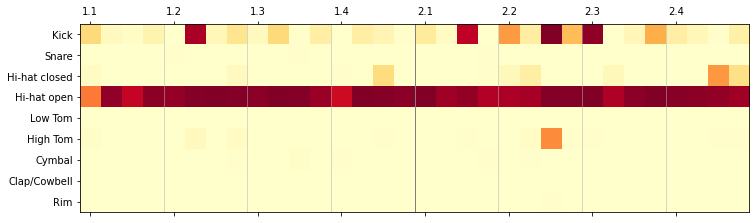

epoch: 401
m_d_loss: 0.2275968662079643     m_g_loss: 4.687449122920181


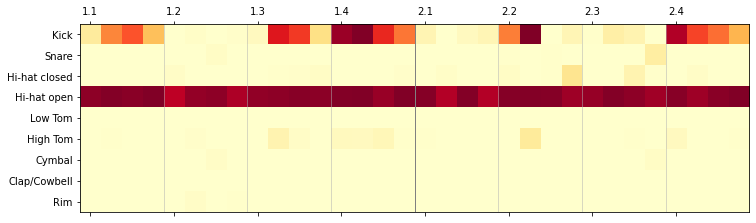

epoch: 402
m_d_loss: 0.2206082932651043     m_g_loss: 4.916504700978597


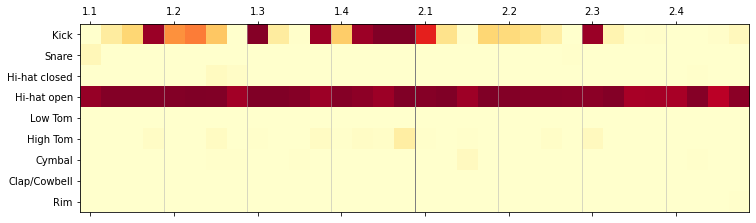

epoch: 403
m_d_loss: 0.21051083592807543     m_g_loss: 5.130604267120361


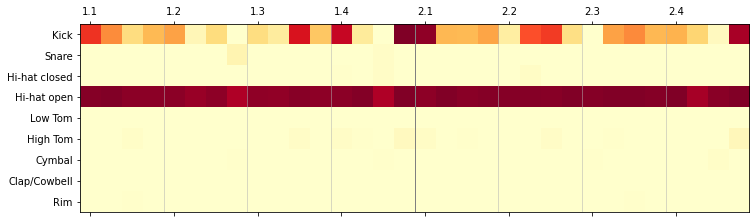

epoch: 404
m_d_loss: 0.2094523584470153     m_g_loss: 5.448906754002427


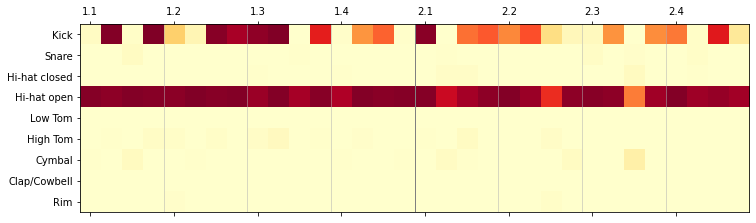

epoch: 405
m_d_loss: 0.19914608141955206     m_g_loss: 5.688302097898541


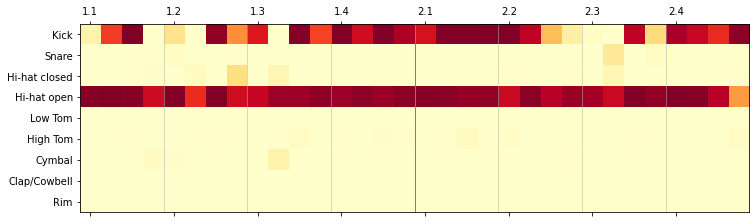

epoch: 406
m_d_loss: 0.1974874759092927     m_g_loss: 5.795845407428163


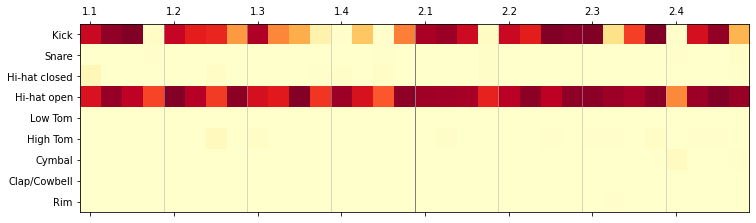

epoch: 407
m_d_loss: 0.20416890417828282     m_g_loss: 5.591847231893828


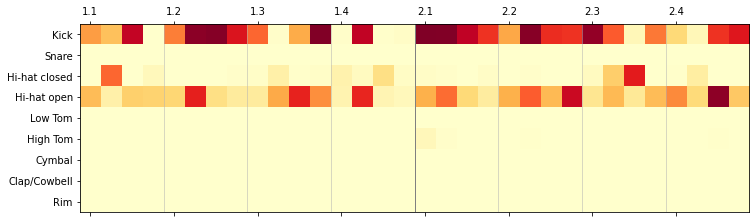

epoch: 408
m_d_loss: 0.38497236222028736     m_g_loss: 3.6882592042287192


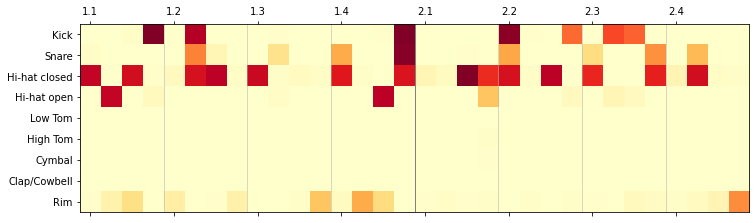

epoch: 409
m_d_loss: 0.524114812822903     m_g_loss: 2.3395010232925415


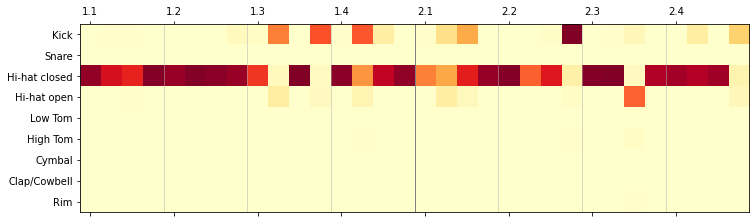

epoch: 410
m_d_loss: 0.46571757718920703     m_g_loss: 2.08495979236834


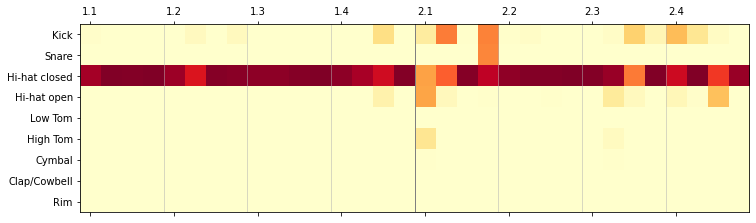

epoch: 411
m_d_loss: 0.34190089124090534     m_g_loss: 2.6785979848919492


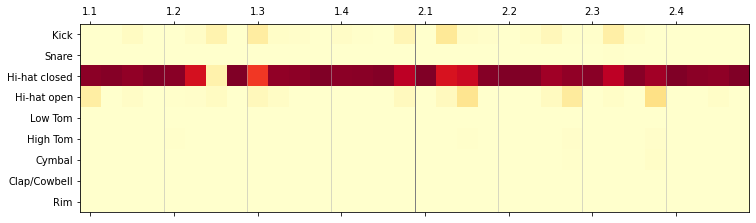

epoch: 412
m_d_loss: 0.4604878013953566     m_g_loss: 2.368783538991755


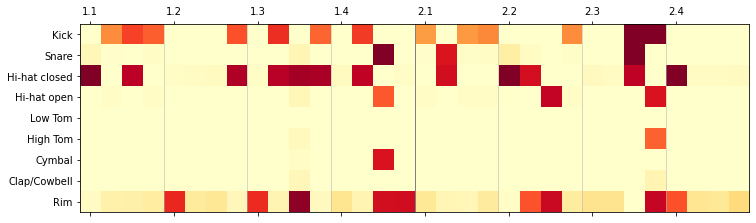

epoch: 413
m_d_loss: 0.5157723093734068     m_g_loss: 2.228998054157604


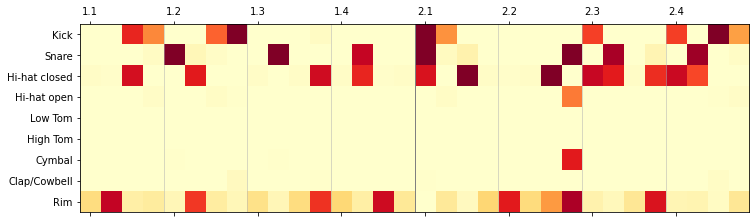

epoch: 414
m_d_loss: 0.46711314171552665     m_g_loss: 2.2942807602159903


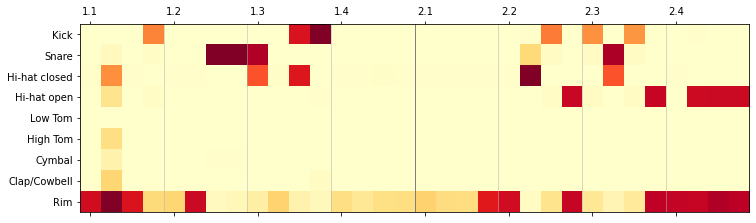

epoch: 415
m_d_loss: 0.4146874774904812     m_g_loss: 2.355914690277793


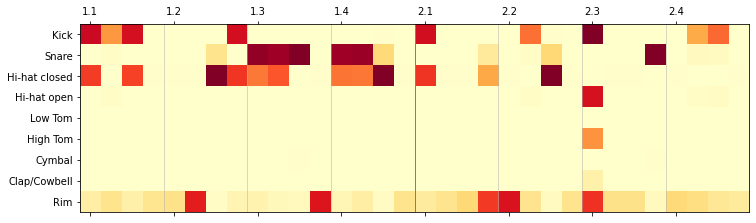

epoch: 416
m_d_loss: 0.3826158655807375     m_g_loss: 2.587331280563817


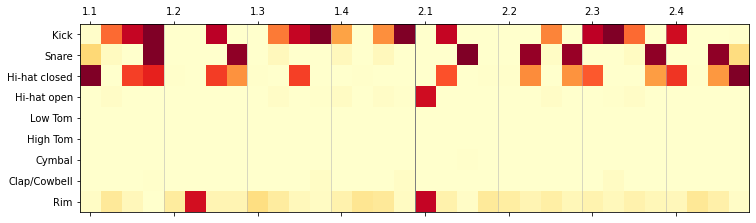

epoch: 417
m_d_loss: 0.3737140301395865     m_g_loss: 2.651702866409764


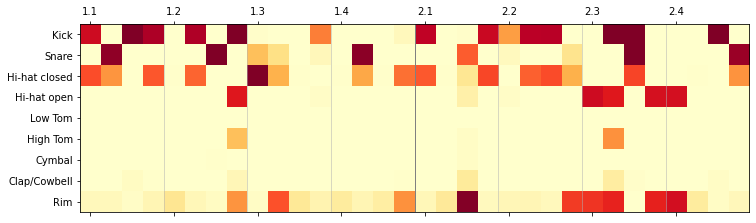

epoch: 418
m_d_loss: 0.34777783416211605     m_g_loss: 2.751470999284224


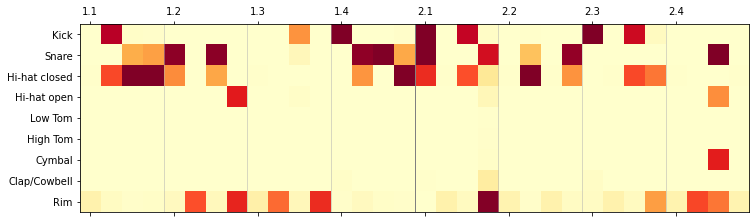

epoch: 419
m_d_loss: 0.35199976072591893     m_g_loss: 2.851210912068685


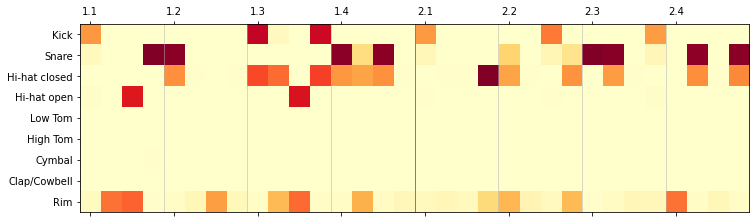

epoch: 420
m_d_loss: 0.3626004584133625     m_g_loss: 2.8834000139525444


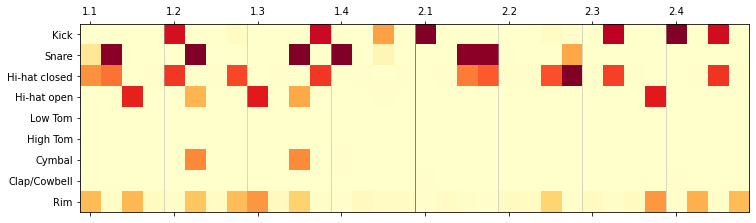

epoch: 421
m_d_loss: 0.3681648917057935     m_g_loss: 2.7459819316864014


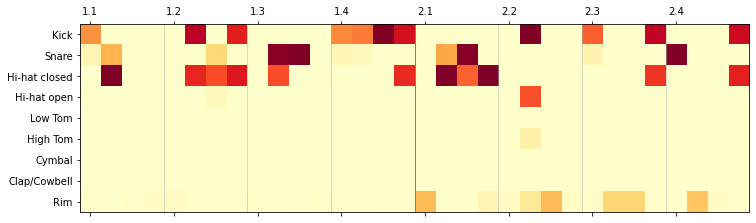

epoch: 422
m_d_loss: 0.36324575766921047     m_g_loss: 2.8417474862300987


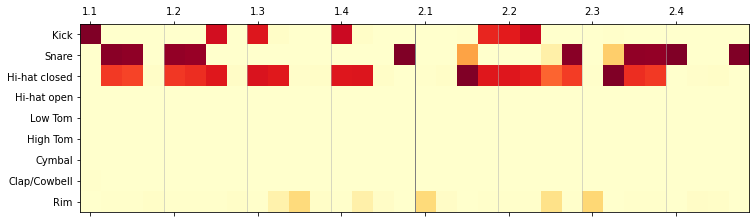

epoch: 423
m_d_loss: 0.3715575491680818     m_g_loss: 2.7594854325959175


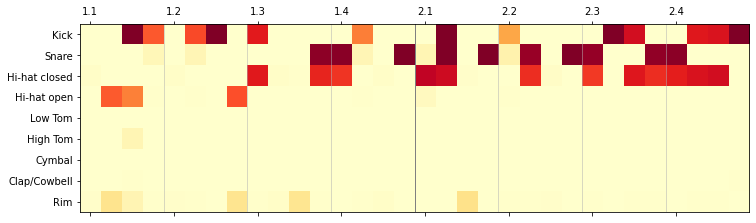

epoch: 424
m_d_loss: 0.37188718579709534     m_g_loss: 2.8362886688926


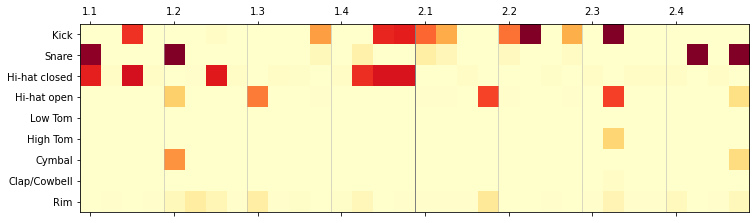

epoch: 425
m_d_loss: 0.36327354907989506     m_g_loss: 2.883104288216793


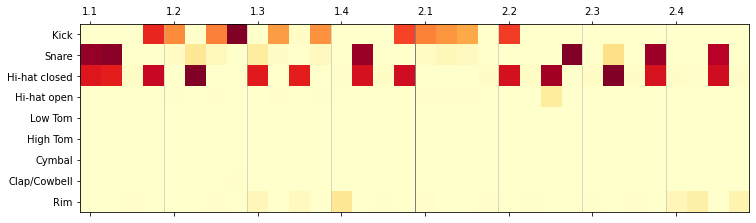

epoch: 426
m_d_loss: 0.348297718167305     m_g_loss: 2.9147239164872603


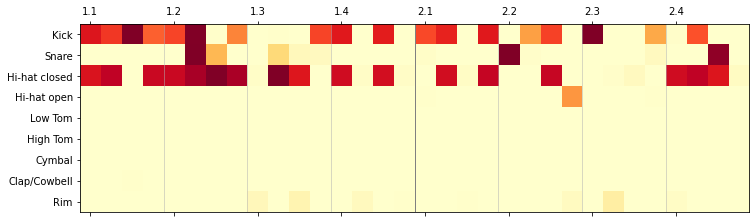

epoch: 427
m_d_loss: 0.35213477120679965     m_g_loss: 3.053673773100882


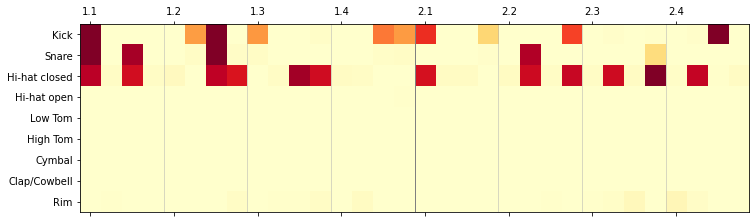

epoch: 428
m_d_loss: 0.3469236433506012     m_g_loss: 3.069507851745143


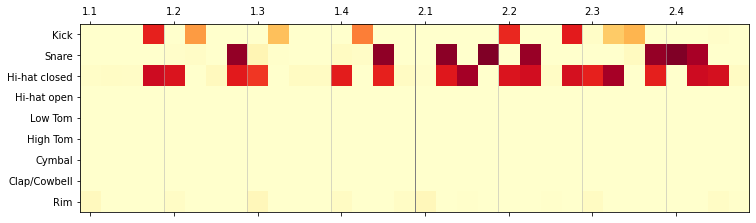

epoch: 429
m_d_loss: 0.34152236721094914     m_g_loss: 3.128143953554558


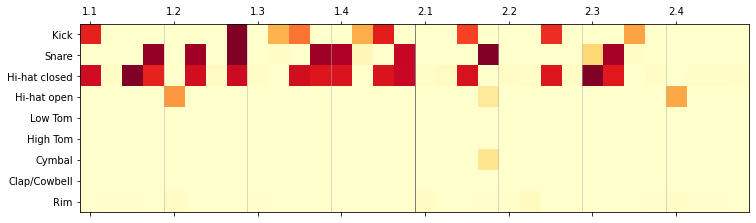

epoch: 430
m_d_loss: 0.3347950100898743     m_g_loss: 3.2009361512733228


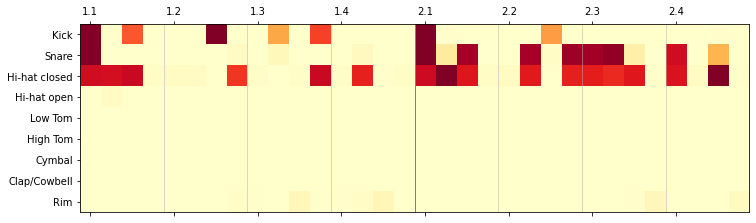

epoch: 431
m_d_loss: 0.34448382889523227     m_g_loss: 3.195894891565496


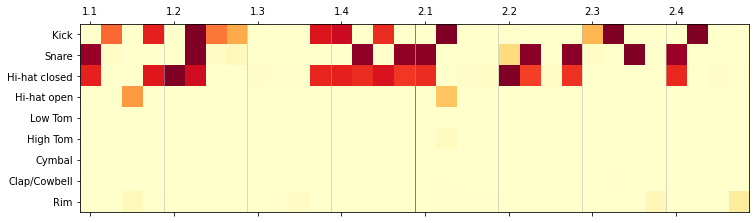

epoch: 432
m_d_loss: 0.330843149125576     m_g_loss: 3.224310130784006


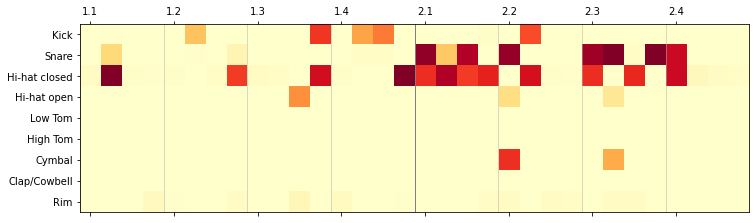

epoch: 433
m_d_loss: 0.32195036341162286     m_g_loss: 3.27205753326416


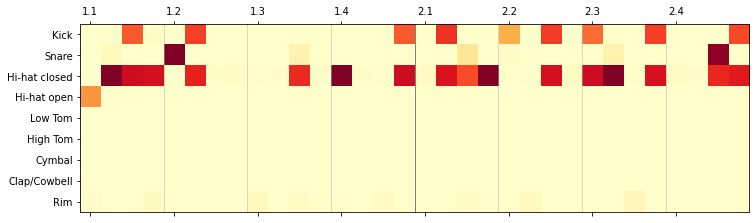

epoch: 434
m_d_loss: 0.33167373687028884     m_g_loss: 3.235837286168879


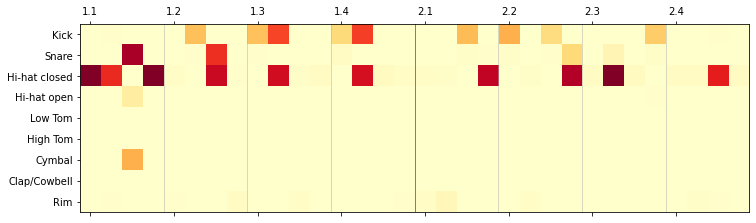

epoch: 435
m_d_loss: 0.32214210962547973     m_g_loss: 3.232282508503307


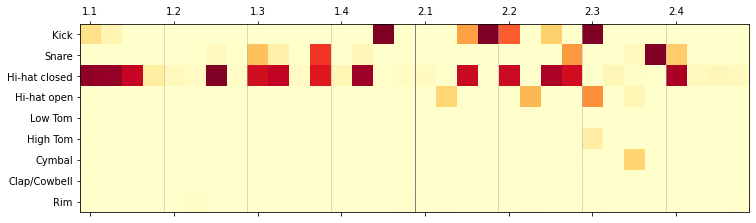

epoch: 436
m_d_loss: 0.5159290578630236     m_g_loss: 1.909652124751698


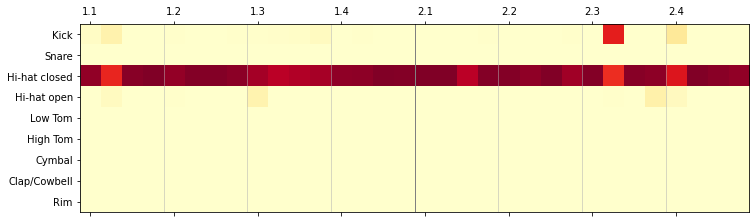

epoch: 437
m_d_loss: 0.3970549046993256     m_g_loss: 2.4298004778948696


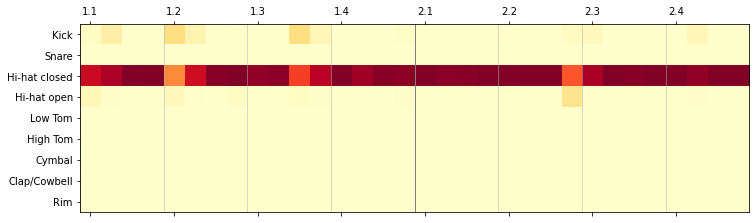

epoch: 438
m_d_loss: 0.3159796342253685     m_g_loss: 3.0034628636909253


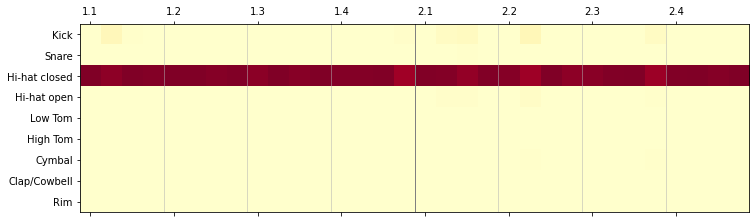

epoch: 439
m_d_loss: 0.27361532309476067     m_g_loss: 3.4708516597747803


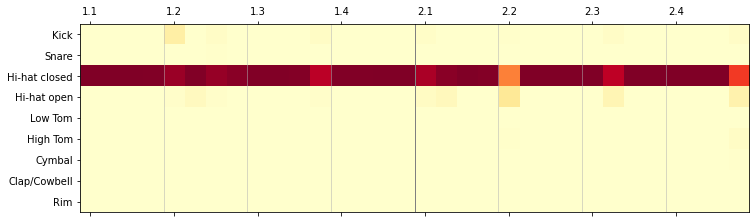

epoch: 440
m_d_loss: 0.2464607249945402     m_g_loss: 3.807931582132975


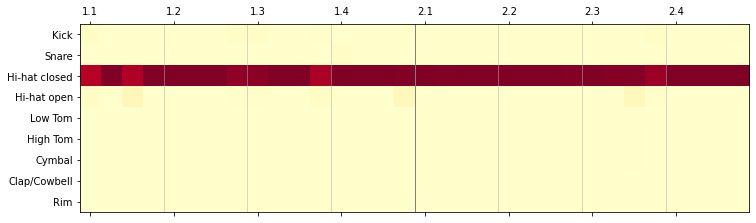

epoch: 441
m_d_loss: 0.22934520682867834     m_g_loss: 4.0716932181156045


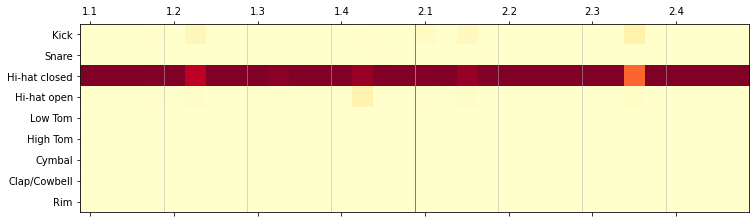

epoch: 442
m_d_loss: 0.22291676513850692     m_g_loss: 4.3456416852546464


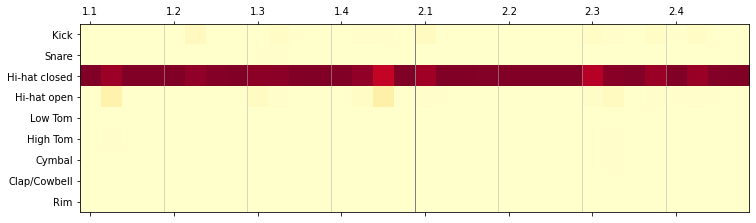

epoch: 443
m_d_loss: 0.21495483009254235     m_g_loss: 4.531475081588283


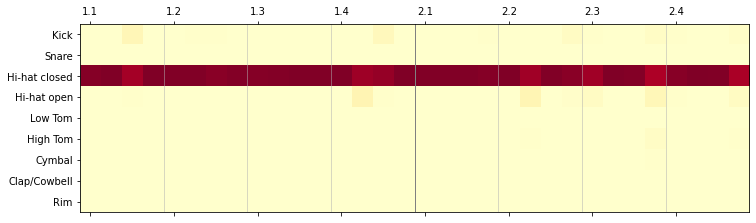

epoch: 444
m_d_loss: 0.20964789371937514     m_g_loss: 4.638807094458378


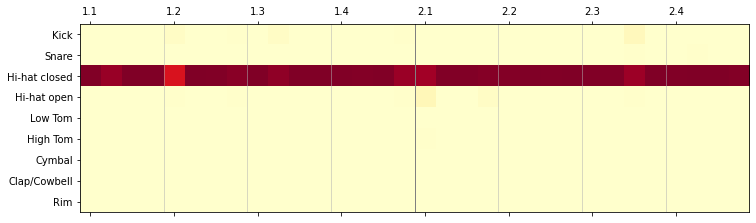

epoch: 445
m_d_loss: 0.4216573471532148     m_g_loss: 3.1385083704283745


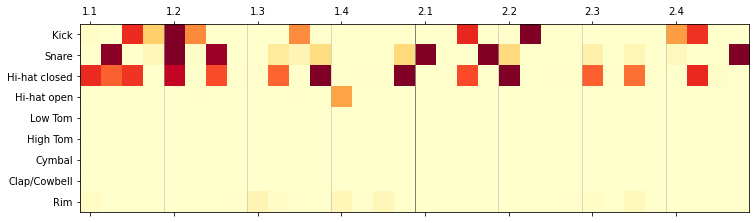

epoch: 446
m_d_loss: 0.5388285361230375     m_g_loss: 2.2164877328005703


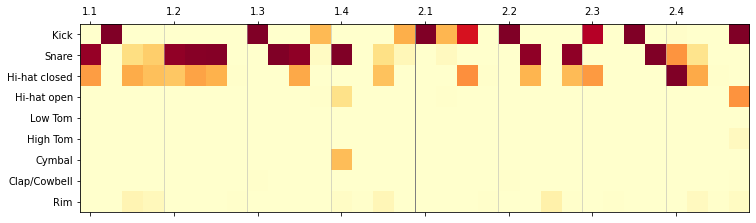

epoch: 447
m_d_loss: 0.48272931575775146     m_g_loss: 2.1669302962043067


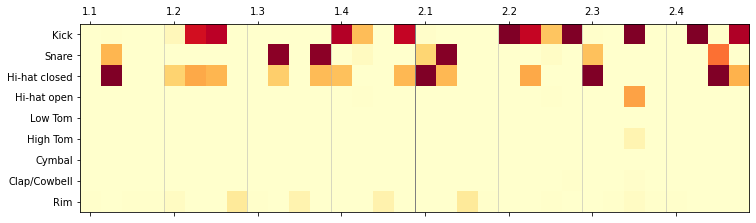

epoch: 448
m_d_loss: 0.43689124509692184     m_g_loss: 2.1971107721328735


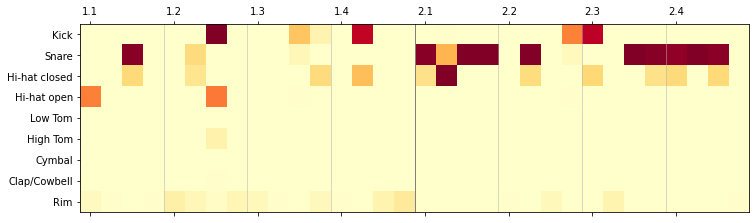

epoch: 449
m_d_loss: 0.41102878030608675     m_g_loss: 2.3293866605469673


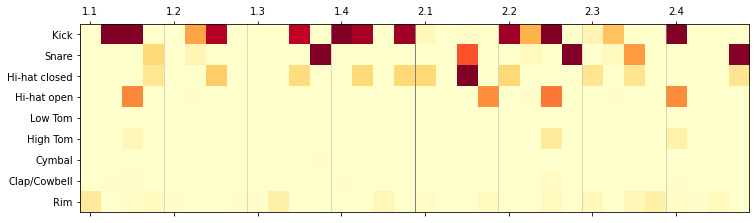

epoch: 450
m_d_loss: 0.38233939222991464     m_g_loss: 2.442372542439085


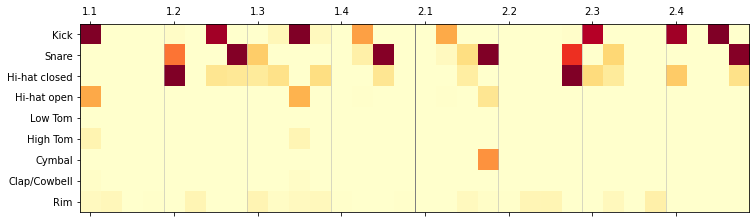

epoch: 451
m_d_loss: 0.3547473241301144     m_g_loss: 2.6775541739030317


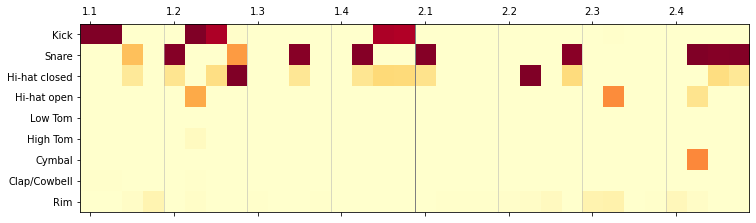

epoch: 452
m_d_loss: 0.3425823837518692     m_g_loss: 2.8352814876671992


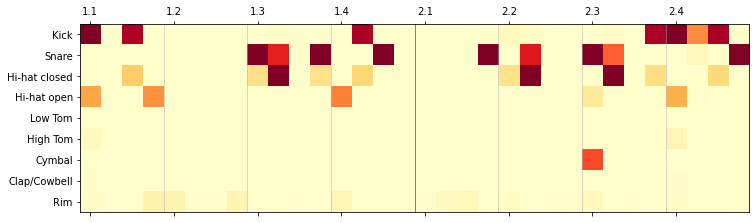

epoch: 453
m_d_loss: 0.3252101514269324     m_g_loss: 2.95804475293015


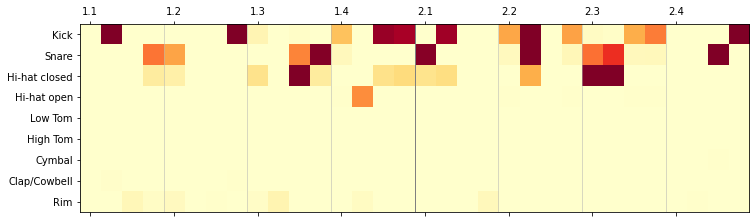

epoch: 454
m_d_loss: 0.3093383498489857     m_g_loss: 3.135193022814664


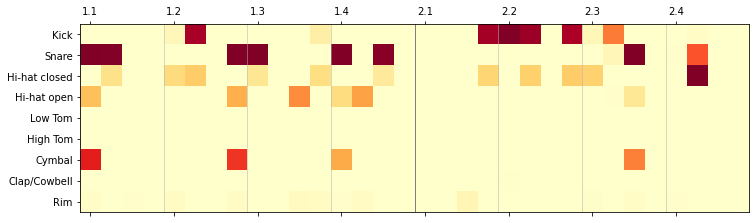

epoch: 455
m_d_loss: 0.3040221519329969     m_g_loss: 3.328599958708792


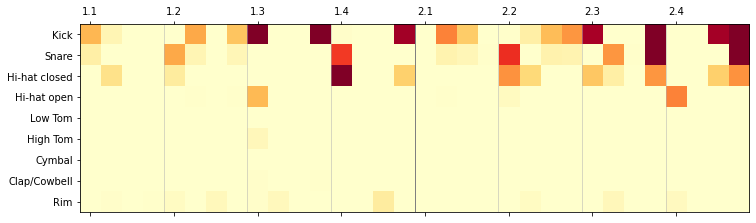

epoch: 456
m_d_loss: 0.29658271446824075     m_g_loss: 3.384446801561298


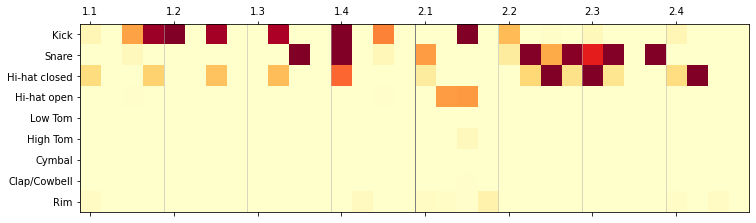

epoch: 457
m_d_loss: 0.2982184224268969     m_g_loss: 3.5081721580389775


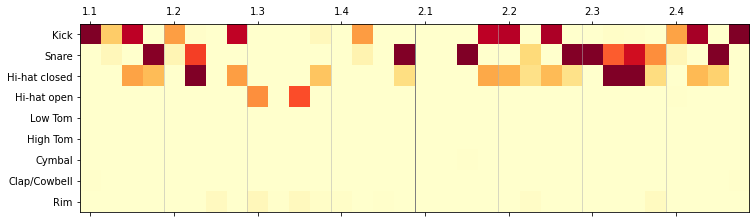

epoch: 458
m_d_loss: 0.29115142337977884     m_g_loss: 3.742439132748228


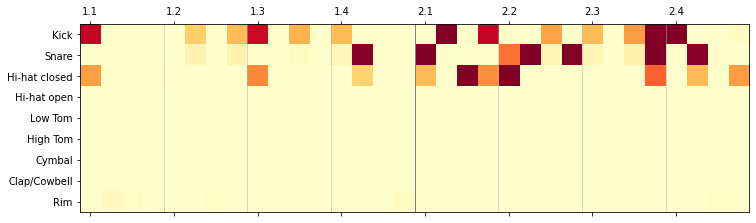

epoch: 459
m_d_loss: 0.2982517612331053     m_g_loss: 3.6736277016726406


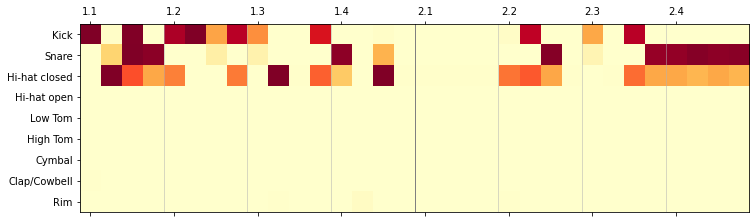

epoch: 460
m_d_loss: 0.2984425965696574     m_g_loss: 3.7259888143250435


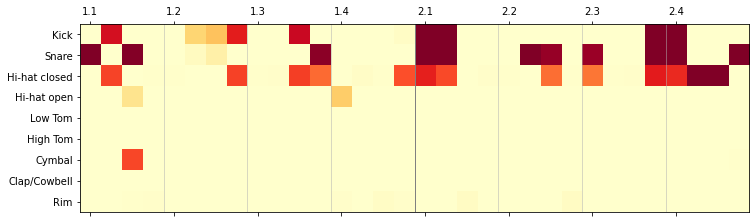

epoch: 461
m_d_loss: 0.3157081618028528     m_g_loss: 3.6913801395531856


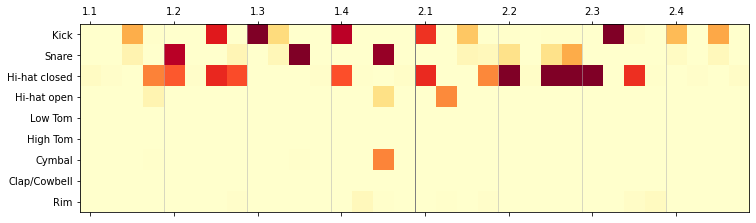

epoch: 462
m_d_loss: 0.31150581166148184     m_g_loss: 3.628099405404293


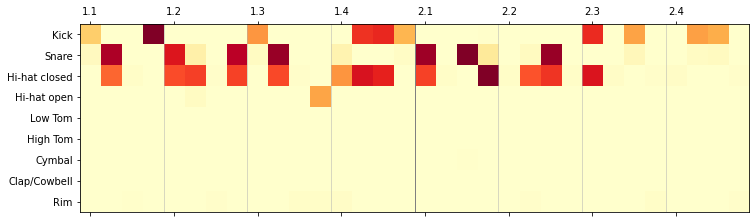

epoch: 463
m_d_loss: 0.30517875359338875     m_g_loss: 3.6111868511546743


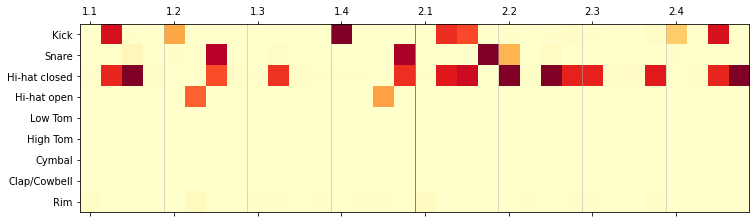

epoch: 464
m_d_loss: 0.30919810142368076     m_g_loss: 3.674533865668557


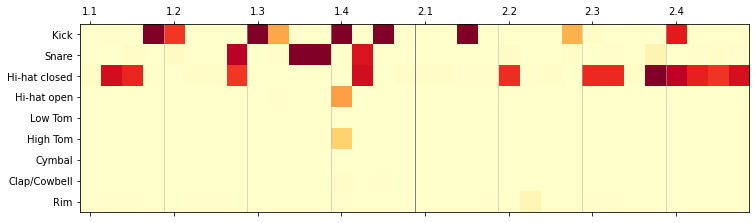

epoch: 465
m_d_loss: 0.30805694215437945     m_g_loss: 3.7613036415793677


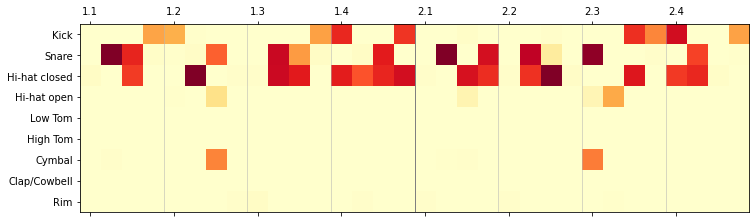

epoch: 466
m_d_loss: 0.3086904952302575     m_g_loss: 3.697458512855299


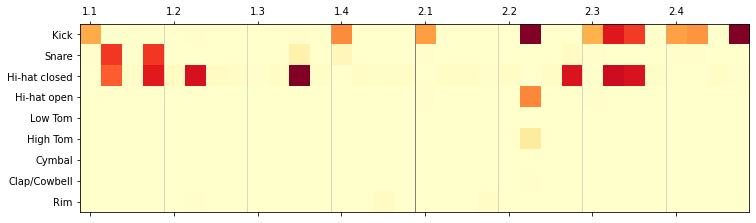

epoch: 467
m_d_loss: 0.31392606496810904     m_g_loss: 3.684589147567749


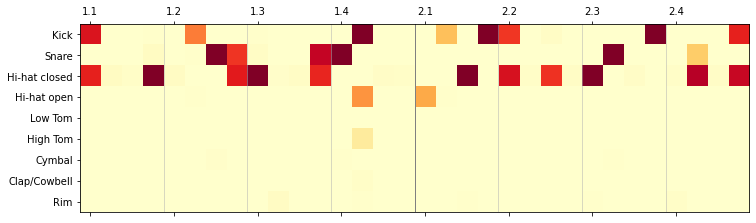

epoch: 468
m_d_loss: 0.31697114743292326     m_g_loss: 3.6928703062462085


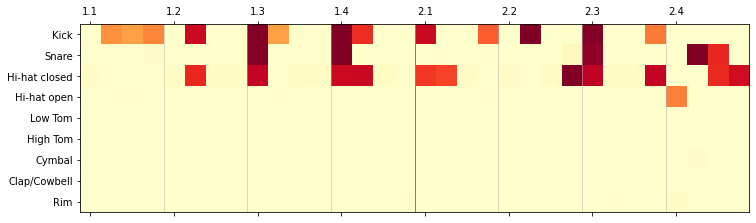

epoch: 469
m_d_loss: 0.3084546462577932     m_g_loss: 3.5916923609646885


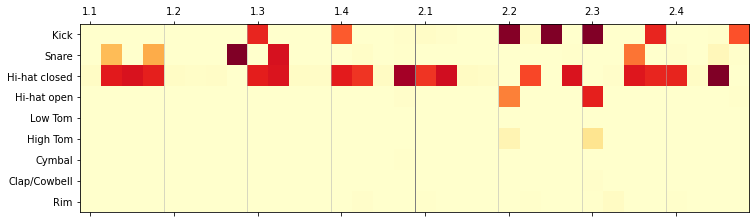

epoch: 470
m_d_loss: 0.31463831271976234     m_g_loss: 3.624371875416149


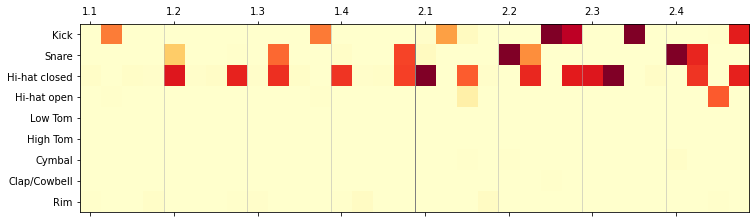

epoch: 471
m_d_loss: 0.31049785105621114     m_g_loss: 3.7255366426525693


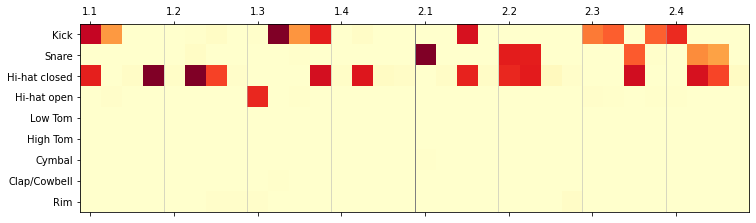

epoch: 472
m_d_loss: 0.3078793970867992     m_g_loss: 3.65402762817614


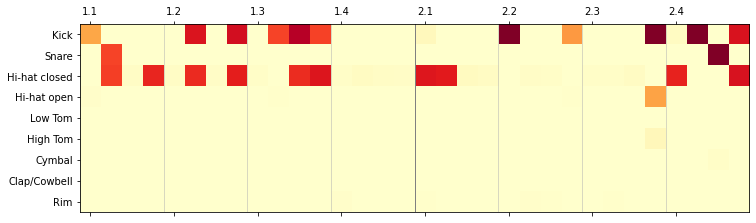

epoch: 473
m_d_loss: 0.3082584360066582     m_g_loss: 3.7401646050539883


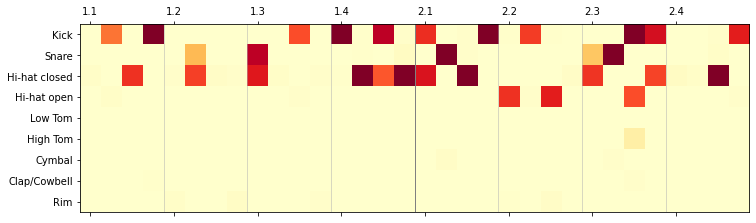

epoch: 474
m_d_loss: 0.31244952082633964     m_g_loss: 3.8467087095434014


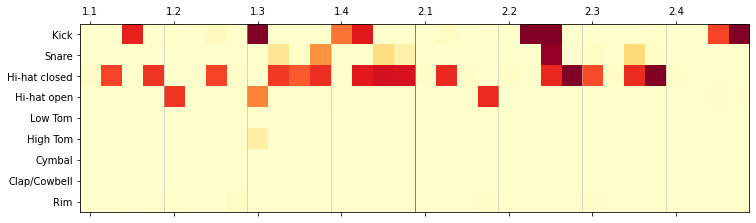

epoch: 475
m_d_loss: 0.30941427139674915     m_g_loss: 3.6982116771466806


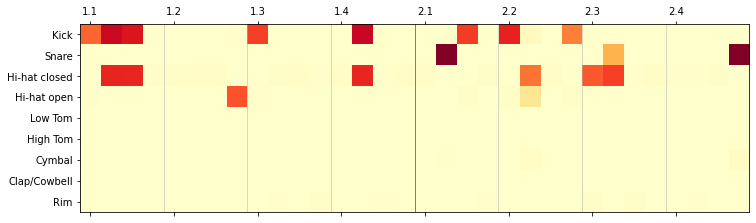

epoch: 476
m_d_loss: 0.309193723089993     m_g_loss: 3.610927726283218


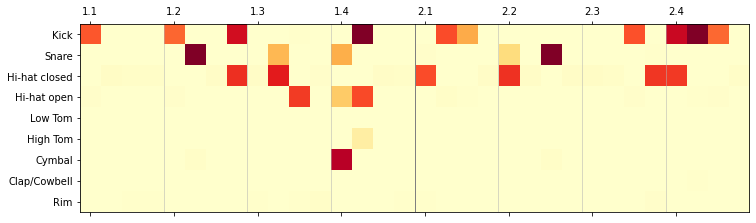

epoch: 477
m_d_loss: 0.3164341786328484     m_g_loss: 3.6780825239239316


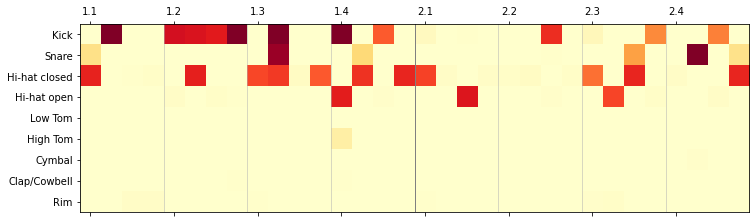

epoch: 478
m_d_loss: 0.30440658368170265     m_g_loss: 3.6311581712780576


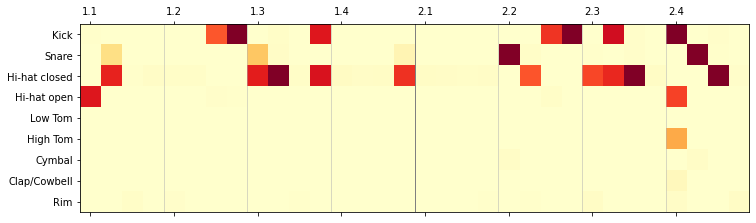

epoch: 479
m_d_loss: 0.31160307333749876     m_g_loss: 3.6114542917771773


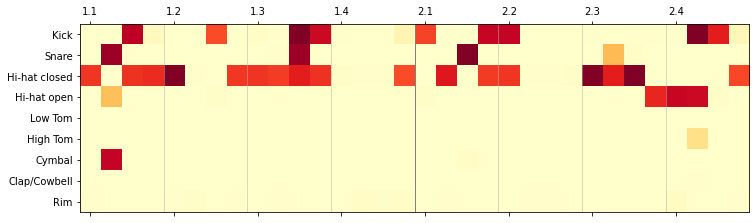

epoch: 480
m_d_loss: 0.30930393859744076     m_g_loss: 3.668896097125429


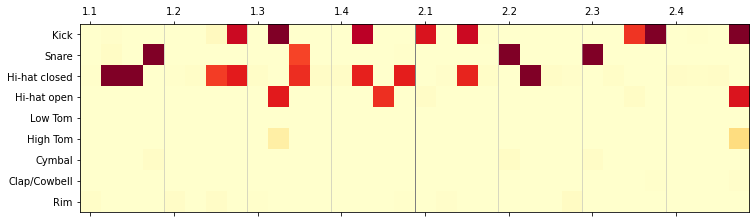

epoch: 481
m_d_loss: 0.307843340845669     m_g_loss: 3.65624763026382


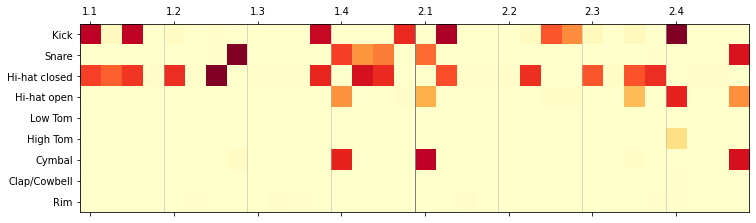

epoch: 482
m_d_loss: 0.30357843562960624     m_g_loss: 3.7964479489759966


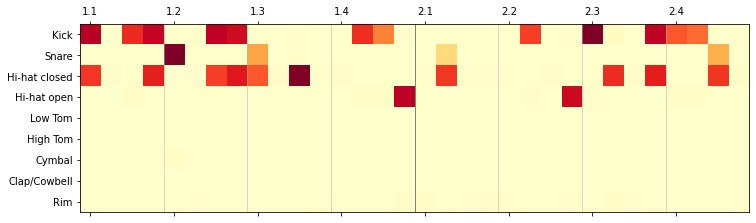

epoch: 483
m_d_loss: 0.30730986349722916     m_g_loss: 3.727838877475623


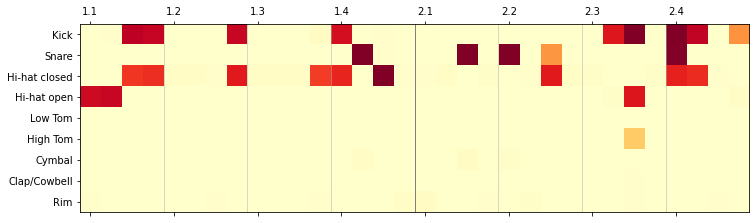

epoch: 484
m_d_loss: 0.31108159106224775     m_g_loss: 3.7668379147847495


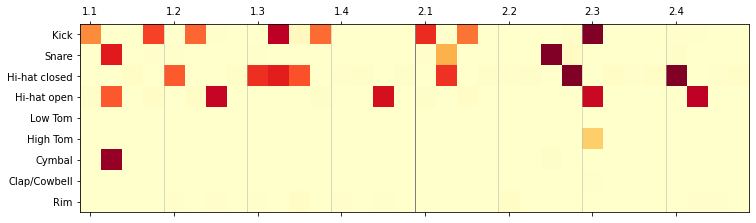

epoch: 485
m_d_loss: 0.30734314024448395     m_g_loss: 3.6342237718177564


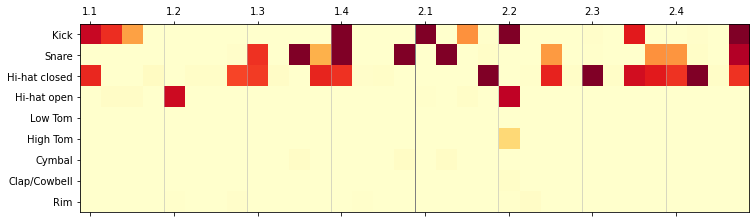

epoch: 486
m_d_loss: 0.3015750881284475     m_g_loss: 3.655765677943374


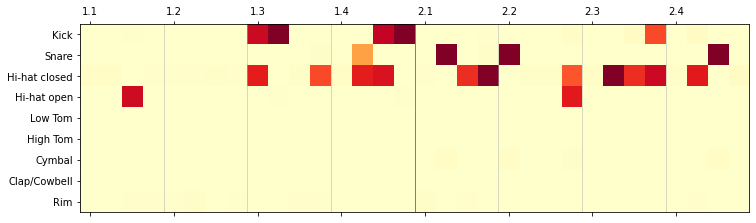

epoch: 487
m_d_loss: 0.30137447136289935     m_g_loss: 3.791953433643688


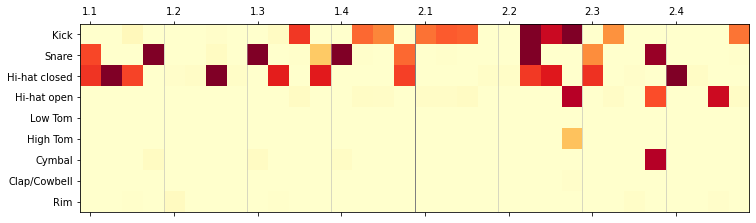

epoch: 488
m_d_loss: 0.29676722250878806     m_g_loss: 3.7744257522351816


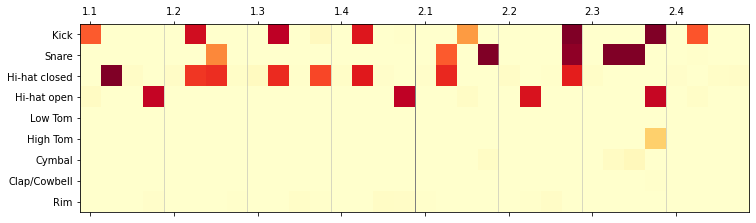

epoch: 489
m_d_loss: 0.3057167642256792     m_g_loss: 3.789858644658869


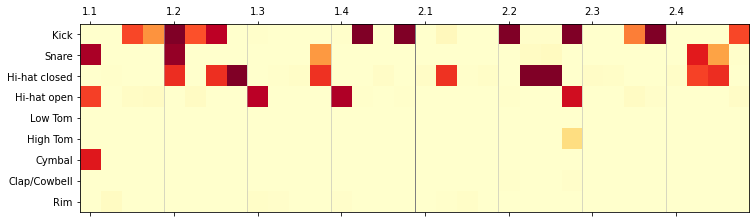

epoch: 490
m_d_loss: 0.3114154729992151     m_g_loss: 3.804218718499848


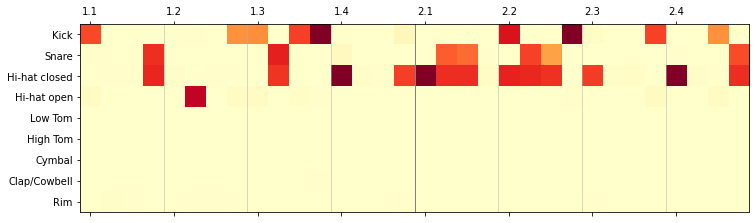

epoch: 491
m_d_loss: 0.3094811278231004     m_g_loss: 3.7440521428079316


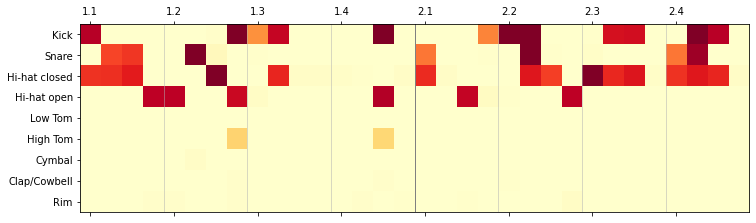

epoch: 492
m_d_loss: 0.299479510076344     m_g_loss: 3.6571588371739243


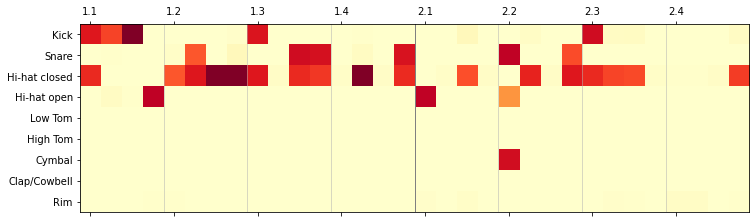

epoch: 493
m_d_loss: 0.29948758027132816     m_g_loss: 3.7038497419068306


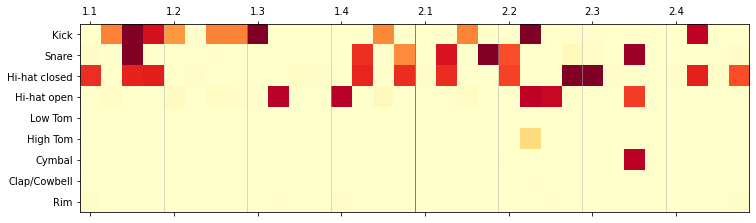

epoch: 494
m_d_loss: 0.29555863551795486     m_g_loss: 3.7914165800268


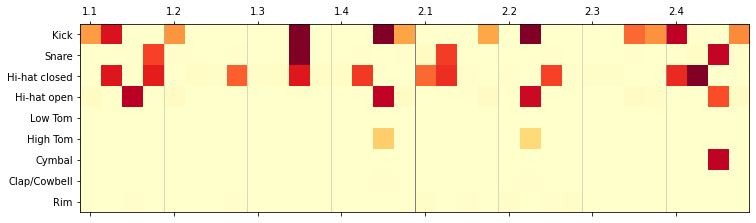

epoch: 495
m_d_loss: 0.3056495631442351     m_g_loss: 3.850997816432606


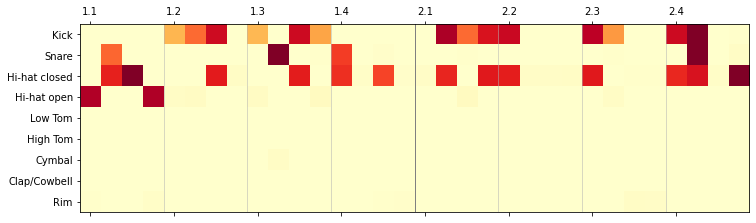

epoch: 496
m_d_loss: 0.2984792253002525     m_g_loss: 3.8317934599789707


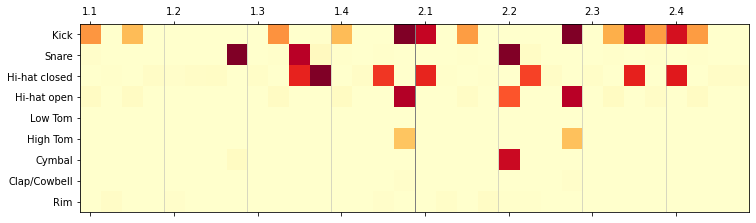

epoch: 497
m_d_loss: 0.3033191803623649     m_g_loss: 3.9510420524712764


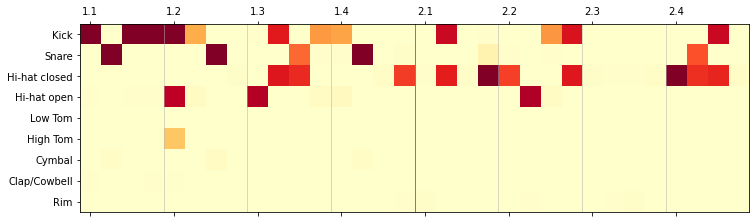

epoch: 498
m_d_loss: 0.30045539606362587     m_g_loss: 3.882933746684681


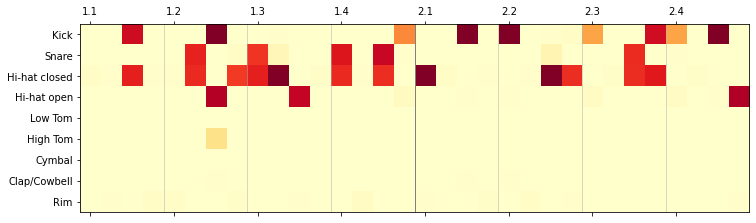

epoch: 499
m_d_loss: 0.3033550693708307     m_g_loss: 3.9002635695717554


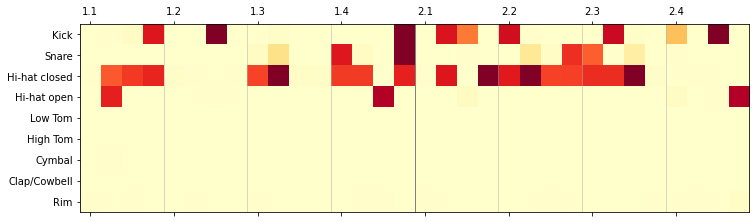

epoch: 500
m_d_loss: 0.30423521269112824     m_g_loss: 3.857471545537313


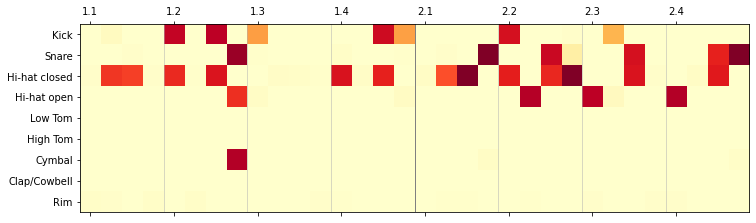

epoch: 501
m_d_loss: 0.2998764039839015     m_g_loss: 3.797708677523064


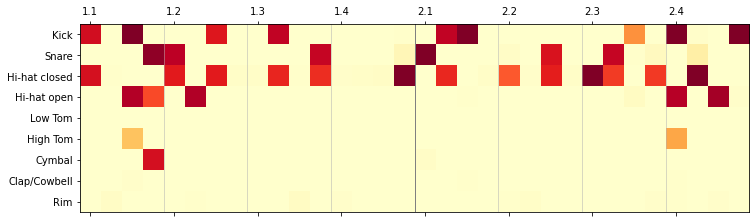

epoch: 502
m_d_loss: 0.300382424518466     m_g_loss: 3.7961022348114937


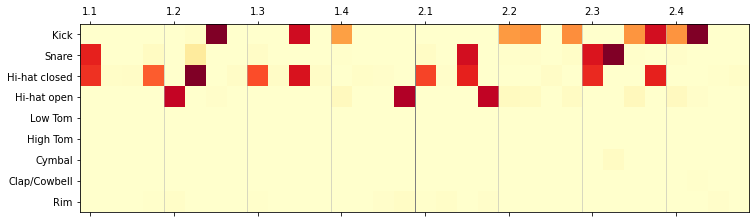

epoch: 503
m_d_loss: 0.30122918889803046     m_g_loss: 3.907734097856464


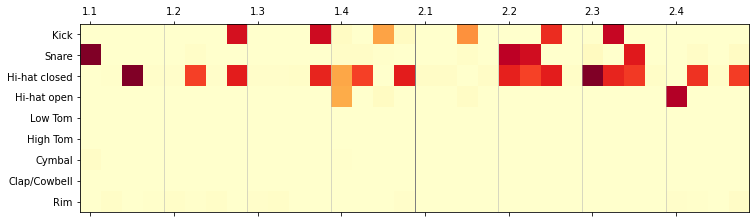

epoch: 504
m_d_loss: 0.30541891139000654     m_g_loss: 3.858043229941166


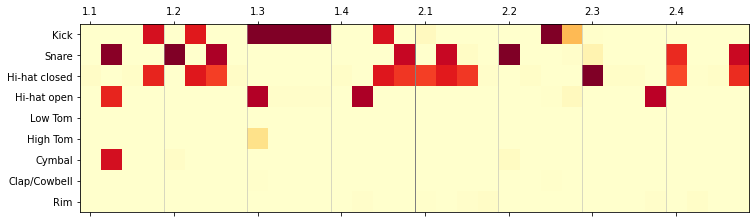

epoch: 505
m_d_loss: 0.31083699044059304     m_g_loss: 3.7650435476592095


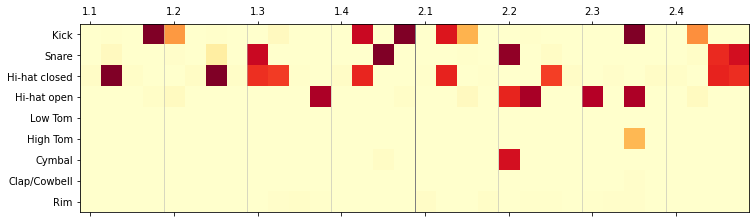

epoch: 506
m_d_loss: 0.3027227323502302     m_g_loss: 3.769231247179436


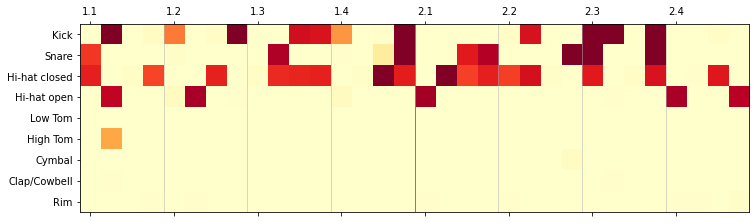

epoch: 507
m_d_loss: 0.300248738597421     m_g_loss: 3.9207240017977627


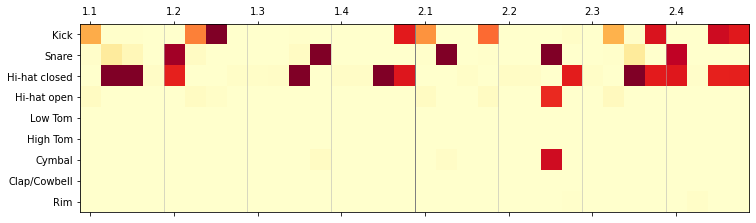

epoch: 508
m_d_loss: 0.2997995352372527     m_g_loss: 3.8723238092480283


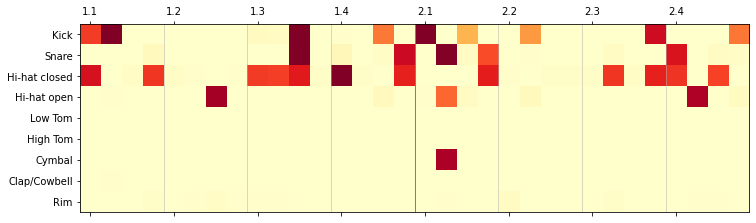

epoch: 509
m_d_loss: 0.30821193579365225     m_g_loss: 3.8528895378112793


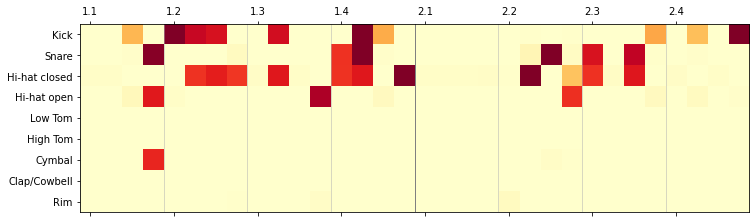

epoch: 510
m_d_loss: 0.3026847820729018     m_g_loss: 3.83235156174862


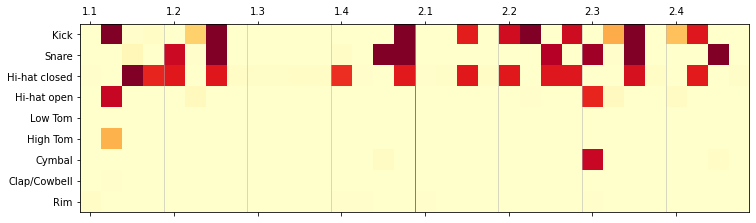

epoch: 511
m_d_loss: 0.2940478493185604     m_g_loss: 3.8716689384344853


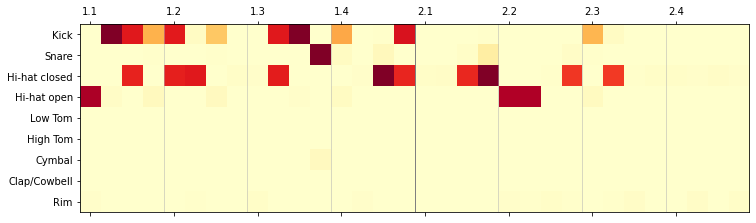

epoch: 512
m_d_loss: 0.2970442136749626     m_g_loss: 3.91225223830252


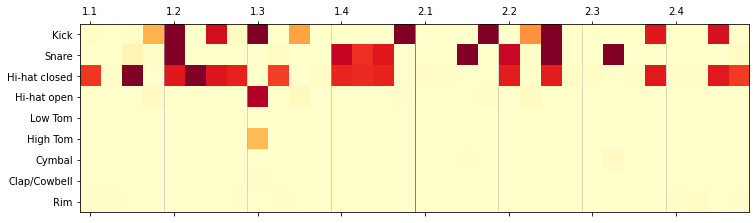

epoch: 513
m_d_loss: 0.3012326131848728     m_g_loss: 3.8766907345164907


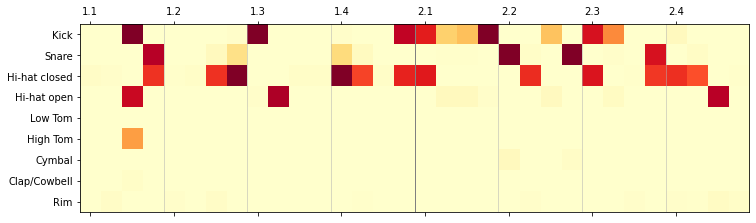

epoch: 514
m_d_loss: 0.30142917633056643     m_g_loss: 3.9632498856746787


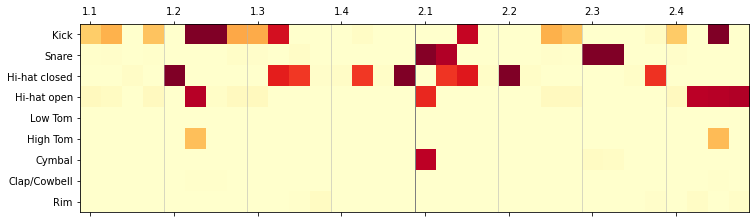

epoch: 515
m_d_loss: 0.30978708302273467     m_g_loss: 3.8825120853655264


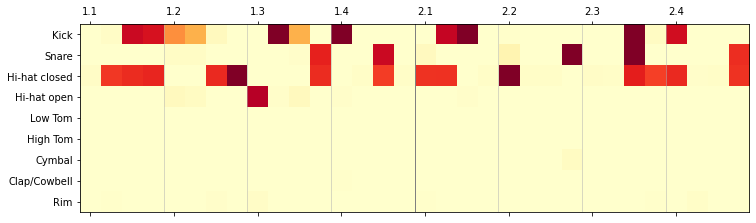

epoch: 516
m_d_loss: 0.3003201881423593     m_g_loss: 3.8772224657463306


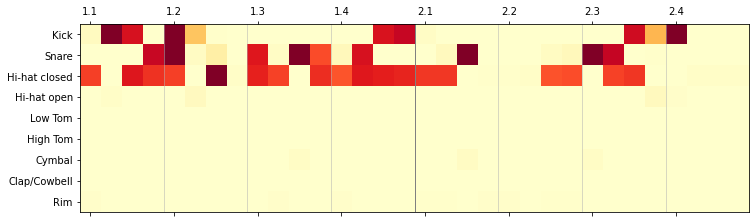

epoch: 517
m_d_loss: 0.2978099936948103     m_g_loss: 3.8720288132176255


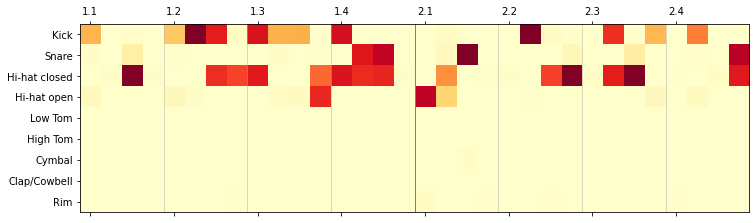

epoch: 518
m_d_loss: 0.3012765934690833     m_g_loss: 3.79492212786819


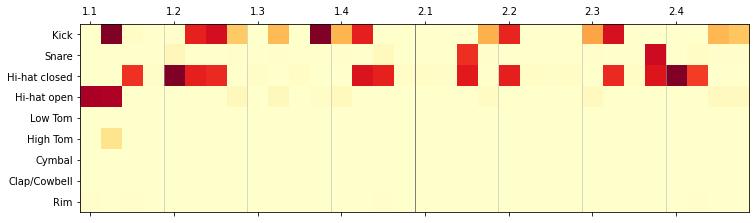

epoch: 519
m_d_loss: 0.3108136189334533     m_g_loss: 3.9134501471663965


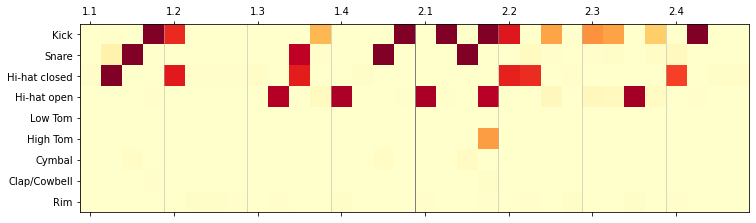

epoch: 520
m_d_loss: 0.31090680714696645     m_g_loss: 3.823971069220341


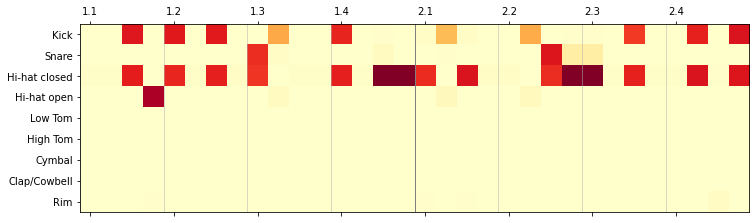

epoch: 521
m_d_loss: 0.3077279264436048     m_g_loss: 3.8183431986606484


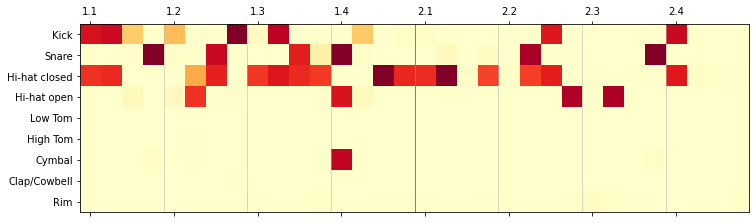

epoch: 522
m_d_loss: 0.30374340880662204     m_g_loss: 3.7494154048688486


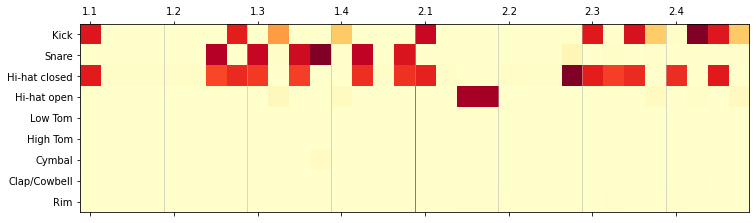

epoch: 523
m_d_loss: 0.3027375775225022     m_g_loss: 3.8170415704900567


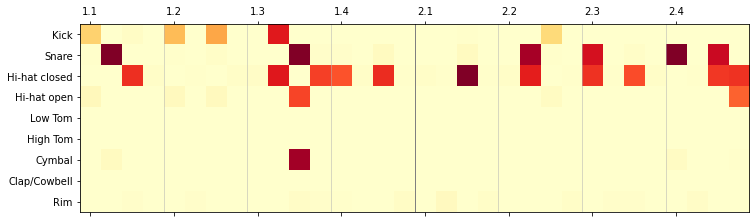

epoch: 524
m_d_loss: 0.3035221803933382     m_g_loss: 3.839640891913212


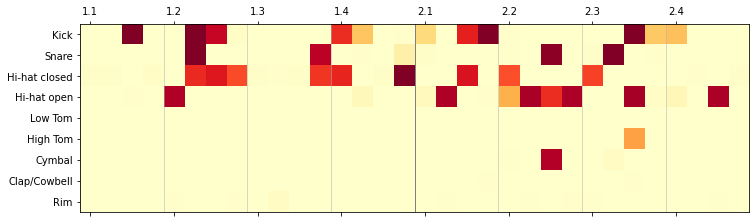

epoch: 525
m_d_loss: 0.30495900827295647     m_g_loss: 3.7408709742806177


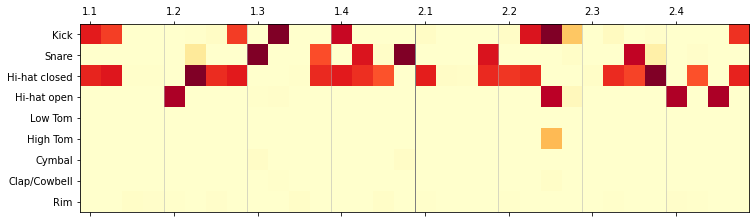

epoch: 526
m_d_loss: 0.3048254745081067     m_g_loss: 3.8452134927113852


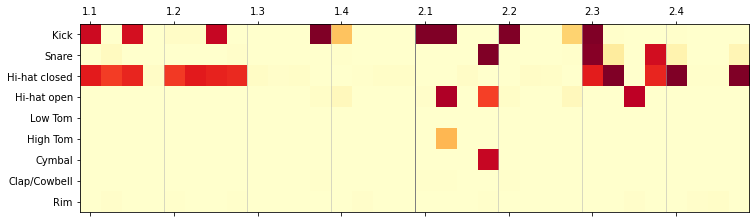

epoch: 527
m_d_loss: 0.2995653180515065     m_g_loss: 3.8508803338715523


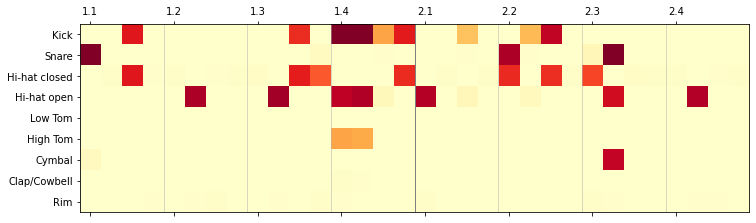

epoch: 528
m_d_loss: 0.2990092074498535     m_g_loss: 3.7433085730581572


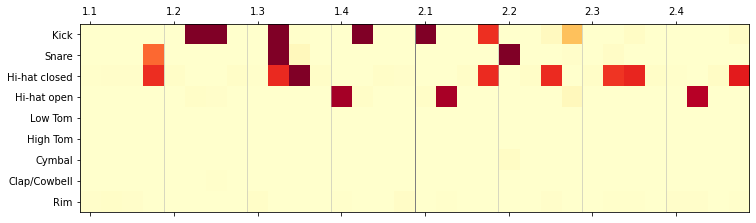

epoch: 529
m_d_loss: 0.29670942040050724     m_g_loss: 3.870908982826002


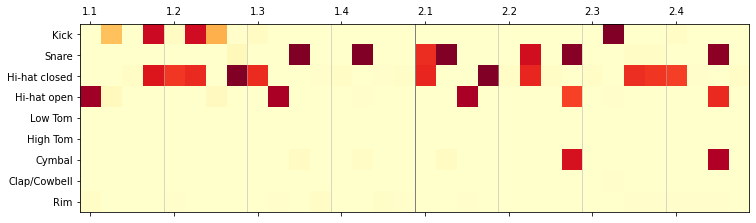

epoch: 530
m_d_loss: 0.30476740375161177     m_g_loss: 3.808284600575765


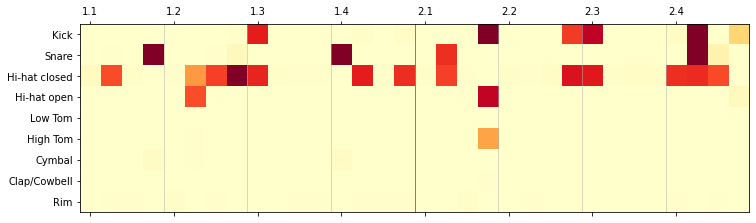

epoch: 531
m_d_loss: 0.30054151293109443     m_g_loss: 3.8918969125458687


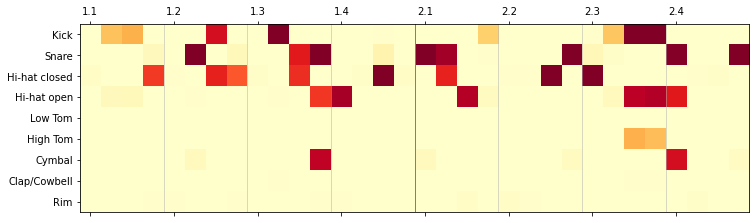

epoch: 532
m_d_loss: 0.2982964864000679     m_g_loss: 3.868328267877752


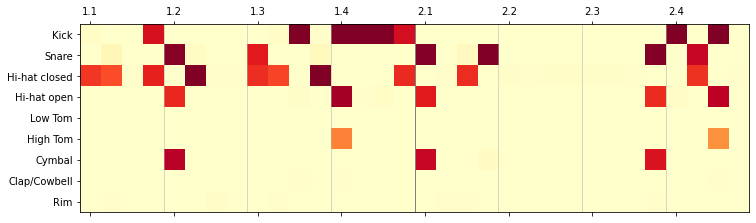

epoch: 533
m_d_loss: 0.30572786068215085     m_g_loss: 3.810359824787487


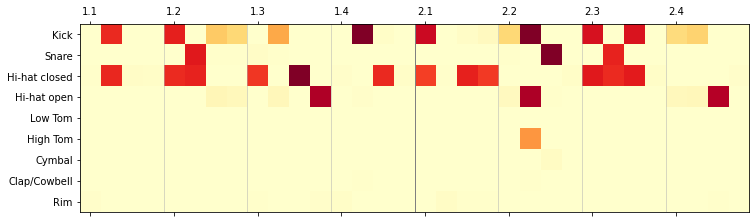

epoch: 534
m_d_loss: 0.30623850580304857     m_g_loss: 3.877386100364454


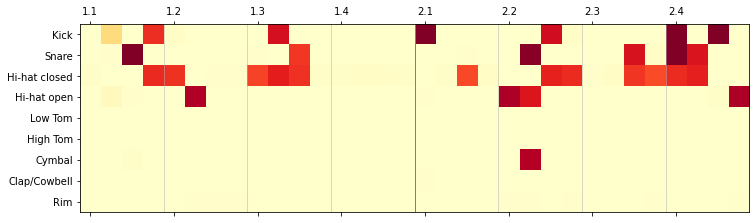

epoch: 535
m_d_loss: 0.30333702757078057     m_g_loss: 3.795384219198516


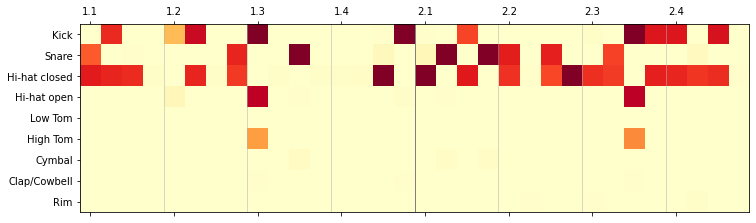

epoch: 536
m_d_loss: 0.3034114046022296     m_g_loss: 3.8838773785215435


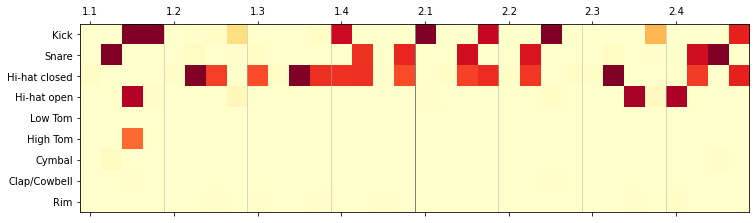

epoch: 537
m_d_loss: 0.3013703009661506     m_g_loss: 3.8418492620641533


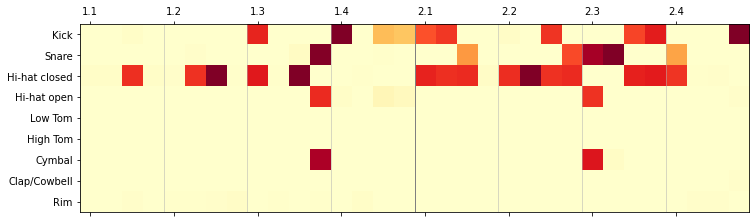

epoch: 538
m_d_loss: 0.3094671577215195     m_g_loss: 3.8416217890652744


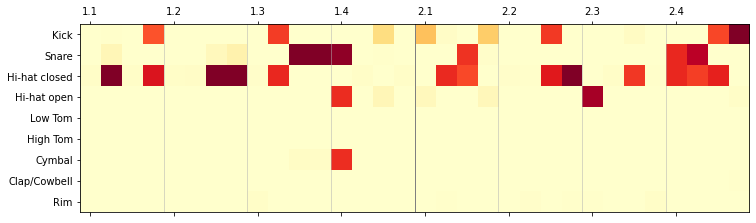

epoch: 539
m_d_loss: 0.3026116385179407     m_g_loss: 3.7209217476122305


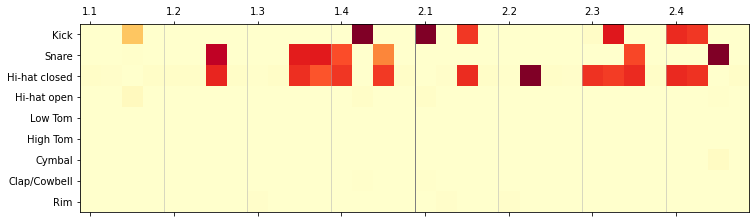

epoch: 540
m_d_loss: 0.298805213905871     m_g_loss: 3.6907803506562202


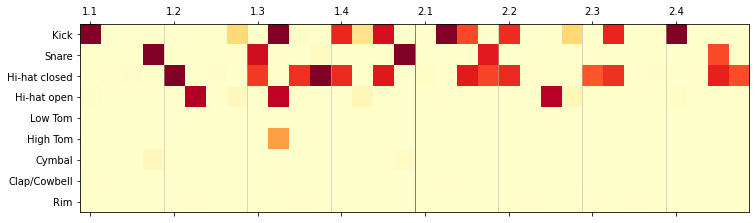

epoch: 541
m_d_loss: 0.30286851718145263     m_g_loss: 3.8644283829313335


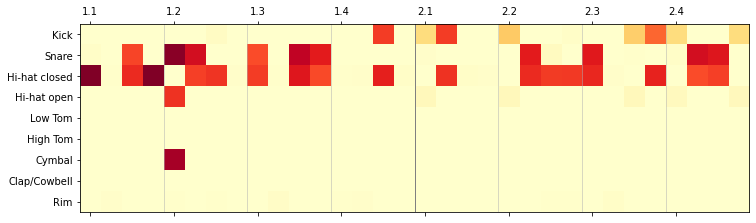

epoch: 542
m_d_loss: 0.3058321174234152     m_g_loss: 3.796998623645667


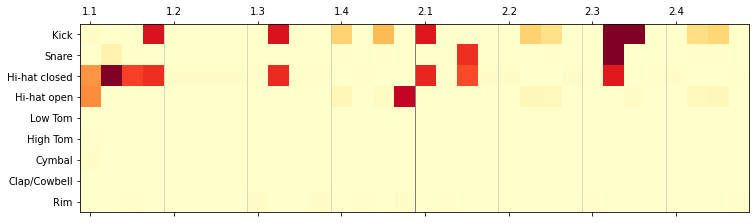

epoch: 543
m_d_loss: 0.30040262657053324     m_g_loss: 3.71674091165716


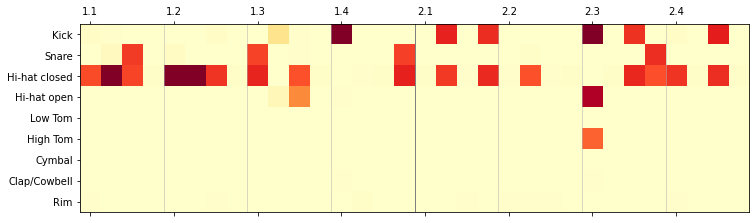

epoch: 544
m_d_loss: 0.300597576610744     m_g_loss: 3.840327327901667


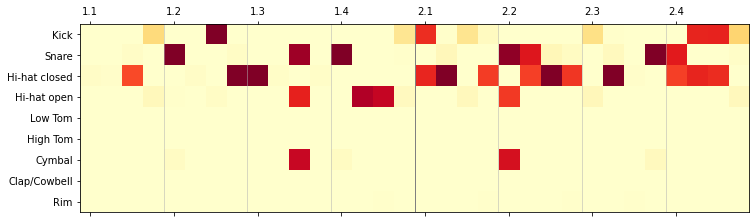

epoch: 545
m_d_loss: 0.29575503854190605     m_g_loss: 3.903961593454534


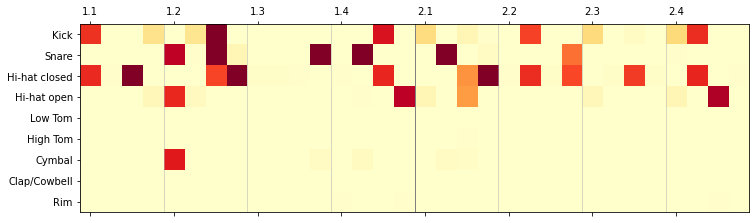

epoch: 546
m_d_loss: 0.2941725248470902     m_g_loss: 3.9342394308610396


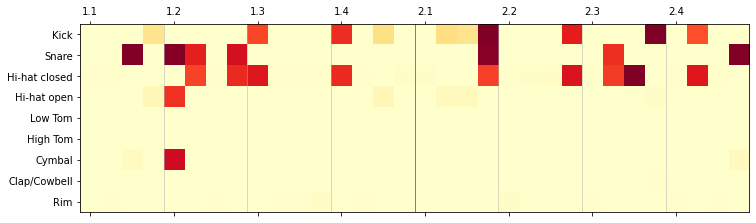

epoch: 547
m_d_loss: 0.29615753047606524     m_g_loss: 3.9778292323603774


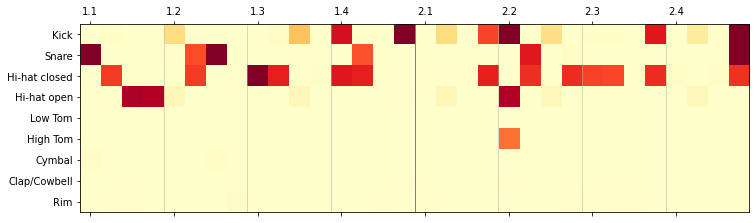

epoch: 548
m_d_loss: 0.2905462214723229     m_g_loss: 3.9847307060704087


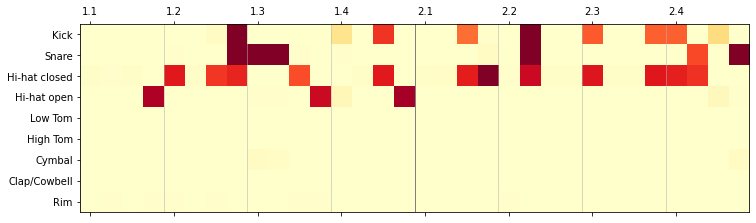

epoch: 549
m_d_loss: 0.2991924769738141     m_g_loss: 3.9774568297646264


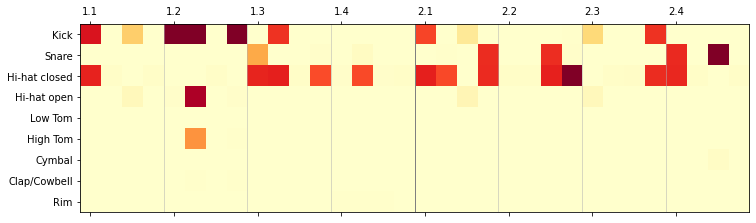

epoch: 550
m_d_loss: 0.29556644801050425     m_g_loss: 3.919970671335856


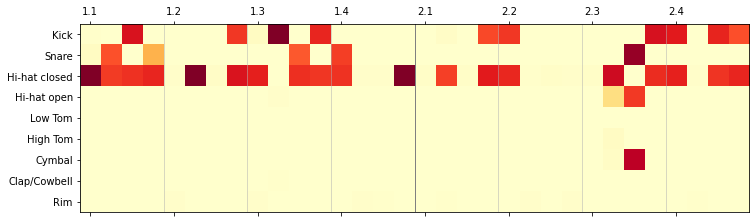

epoch: 551
m_d_loss: 0.3059916913509369     m_g_loss: 3.784065730643995


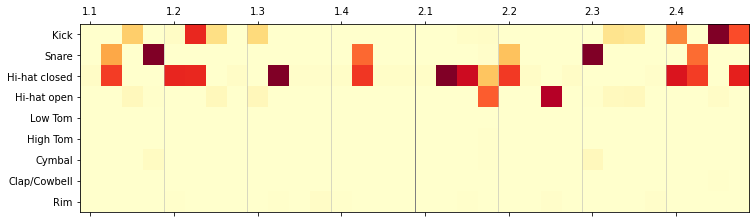

epoch: 552
m_d_loss: 0.2966458281502128     m_g_loss: 3.7648809245138457


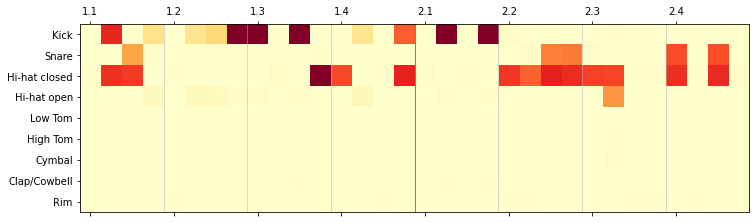

epoch: 553
m_d_loss: 0.29915451197063225     m_g_loss: 3.8980880506110913


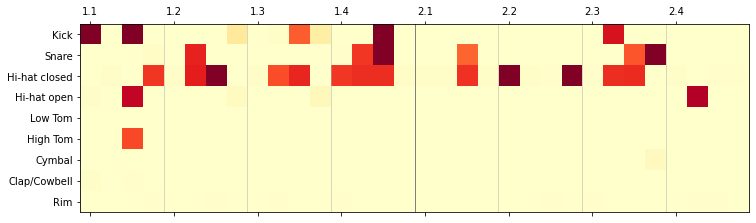

epoch: 554
m_d_loss: 0.30547774881124495     m_g_loss: 3.821262077851729


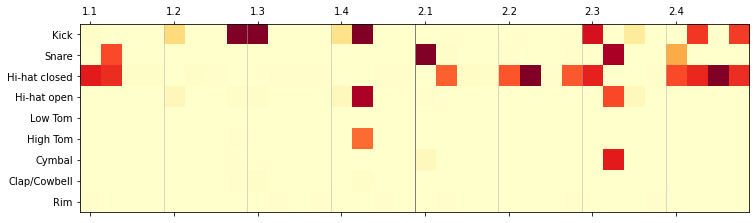

epoch: 555
m_d_loss: 0.29772681208217844     m_g_loss: 3.908224647695368


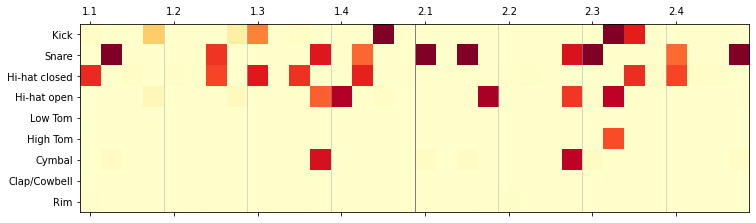

epoch: 556
m_d_loss: 0.30166102722287175     m_g_loss: 3.866711327523896


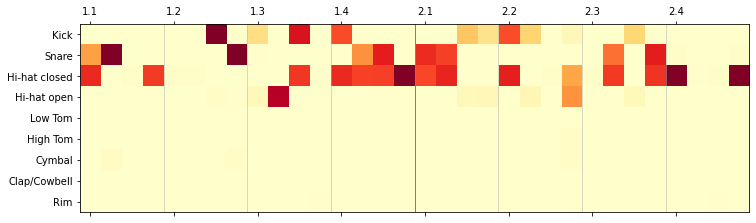

epoch: 557
m_d_loss: 0.30212465559735024     m_g_loss: 3.931565588170832


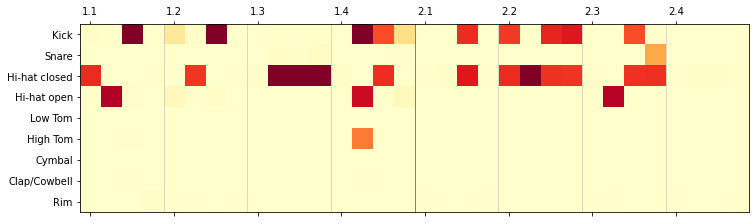

epoch: 558
m_d_loss: 0.30151412729173893     m_g_loss: 3.8313572623512964


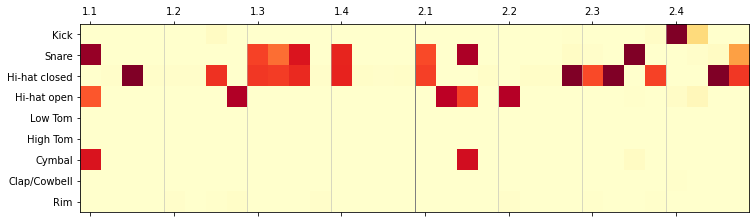

epoch: 559
m_d_loss: 0.30221726263270665     m_g_loss: 3.8753281434377036


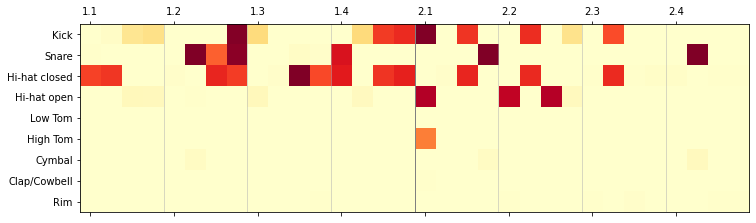

epoch: 560
m_d_loss: 0.3009681040421128     m_g_loss: 3.802156838503751


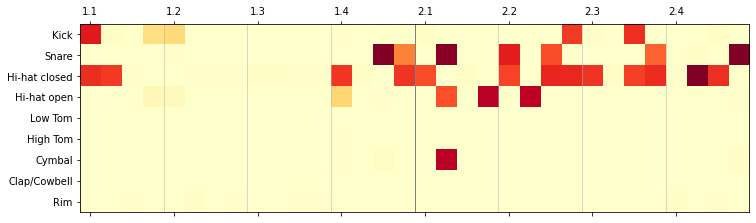

epoch: 561
m_d_loss: 0.30152956580414497     m_g_loss: 3.8826826268976387


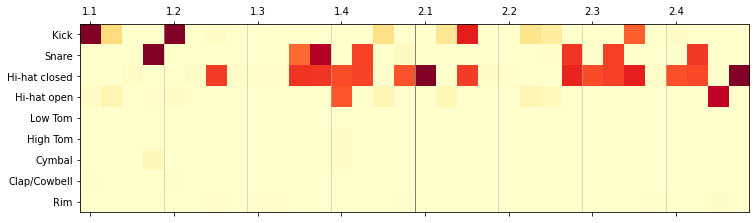

epoch: 562
m_d_loss: 0.2993159865960479     m_g_loss: 3.909678242423318


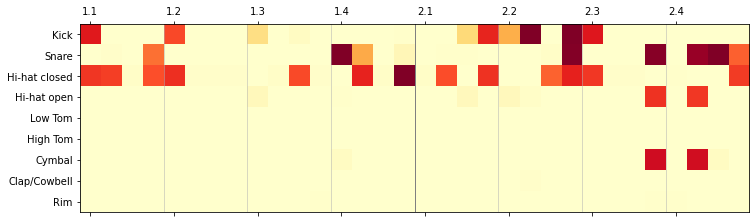

epoch: 563
m_d_loss: 0.29345256984233853     m_g_loss: 3.883239074186845


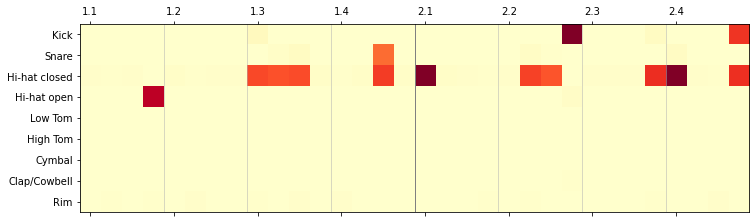

epoch: 564
m_d_loss: 0.2994898257777095     m_g_loss: 3.8516285925200493


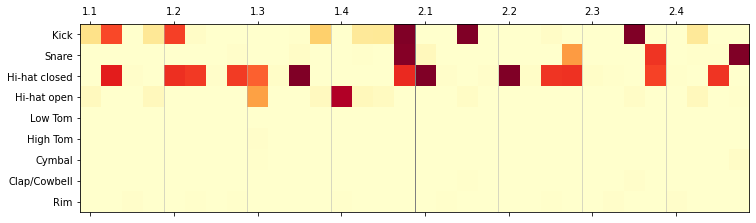

epoch: 565
m_d_loss: 0.29416260386214543     m_g_loss: 3.872100085923166


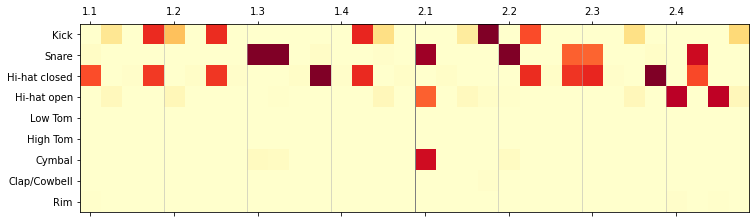

epoch: 566
m_d_loss: 0.3027620790526271     m_g_loss: 3.8810769138914165


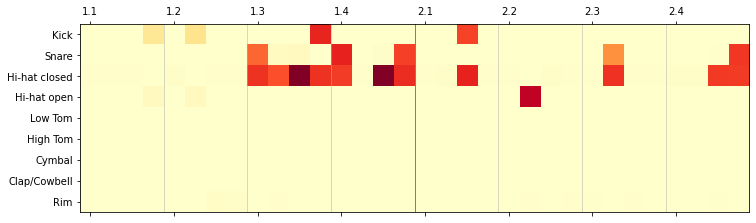

epoch: 567
m_d_loss: 0.3022769310895134     m_g_loss: 3.908620971621889


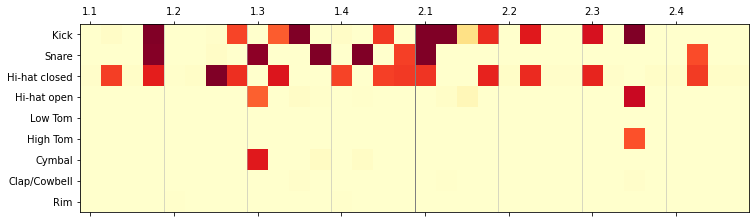

epoch: 568
m_d_loss: 0.30265445951372383     m_g_loss: 3.8477471163778594


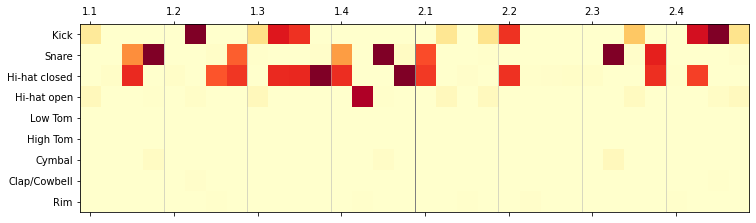

epoch: 569
m_d_loss: 0.2948010702343548     m_g_loss: 3.963143738833341


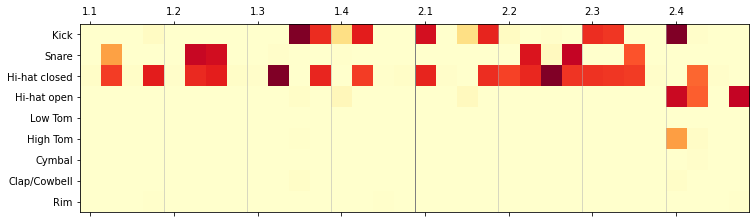

epoch: 570
m_d_loss: 0.29988368880003685     m_g_loss: 3.8980577208779077


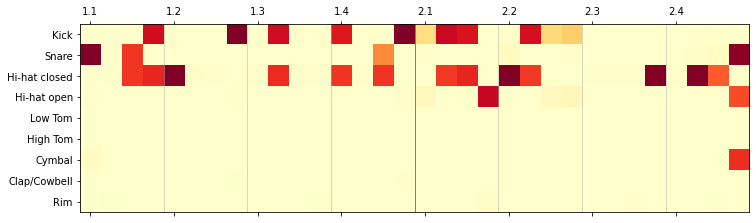

epoch: 571
m_d_loss: 0.2956301410408581     m_g_loss: 4.0213806051196475


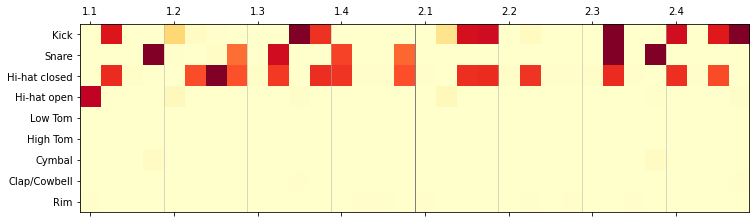

epoch: 572
m_d_loss: 0.3001546991989017     m_g_loss: 3.9722361925876504


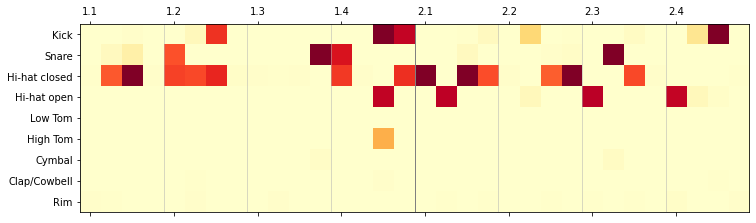

epoch: 573
m_d_loss: 0.2968098379233304     m_g_loss: 3.910052964181611


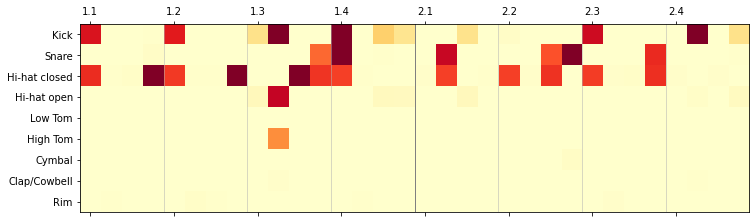

epoch: 574
m_d_loss: 0.29909342546015977     m_g_loss: 3.8740084821527656


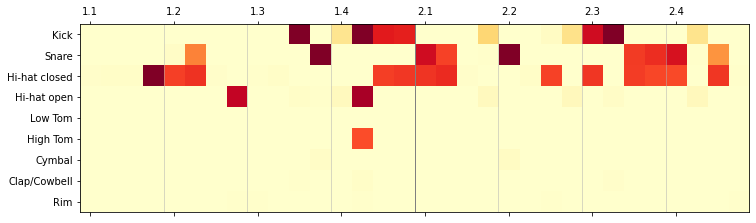

epoch: 575
m_d_loss: 0.29742311519735     m_g_loss: 3.895259965549816


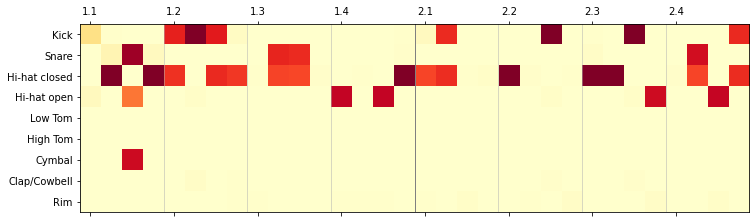

epoch: 576
m_d_loss: 0.3039796298369765     m_g_loss: 3.8490455295100356


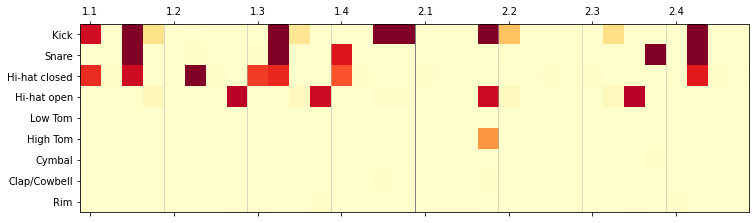

epoch: 577
m_d_loss: 0.3006767439491608     m_g_loss: 3.9728745980696245


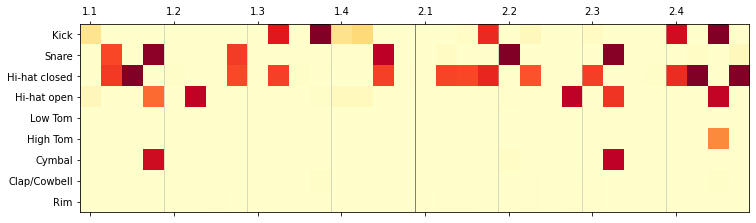

epoch: 578
m_d_loss: 0.29603296648710964     m_g_loss: 3.8818462761965664


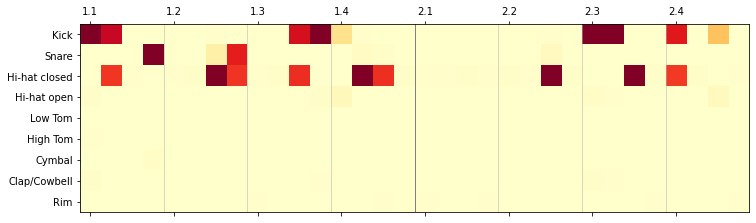

epoch: 579
m_d_loss: 0.3018553533974816     m_g_loss: 3.930835572156039


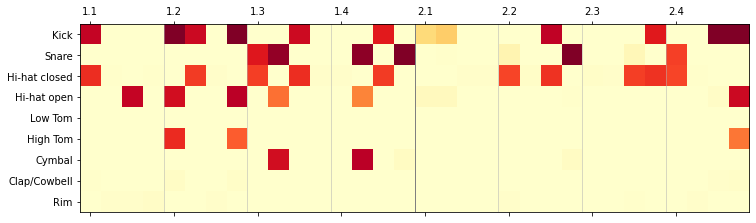

epoch: 580
m_d_loss: 0.2968778468668461     m_g_loss: 3.9195804090210884


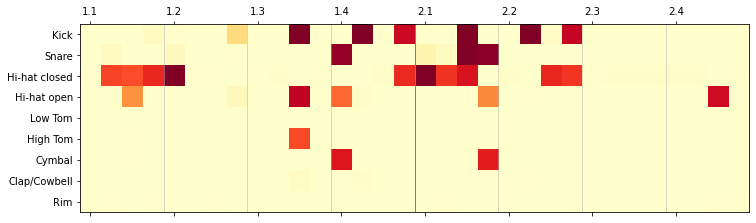

epoch: 581
m_d_loss: 0.30095914970425997     m_g_loss: 3.8600243149381694


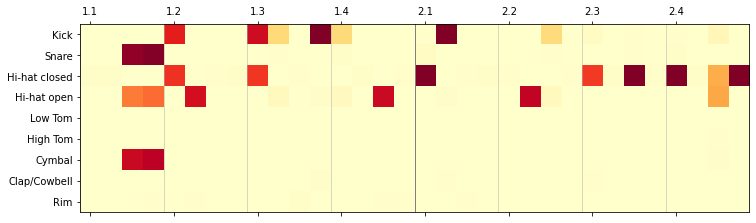

epoch: 582
m_d_loss: 0.2923379100859166     m_g_loss: 3.907845482681737


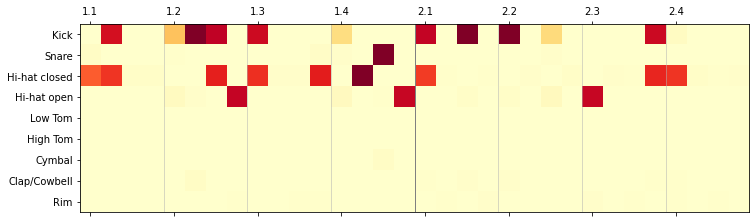

epoch: 583
m_d_loss: 0.3019948982140597     m_g_loss: 3.8093684153123335


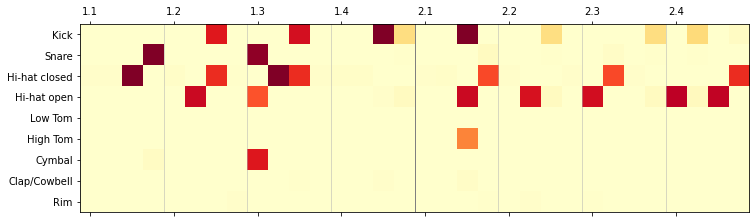

epoch: 584
m_d_loss: 0.29999290183186533     m_g_loss: 3.8814364418838965


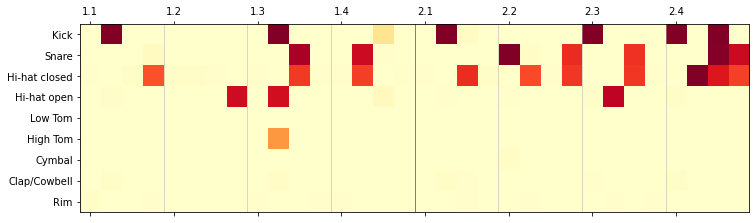

epoch: 585
m_d_loss: 0.3045266693129259     m_g_loss: 3.8818648511713203


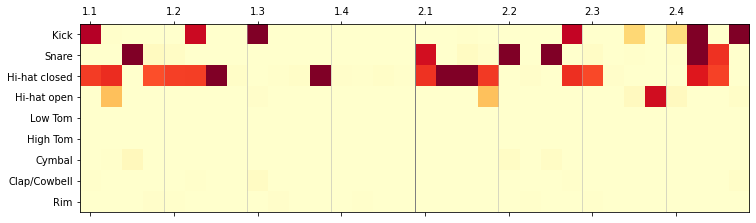

epoch: 586
m_d_loss: 0.2999423006549477     m_g_loss: 3.9352683876499985


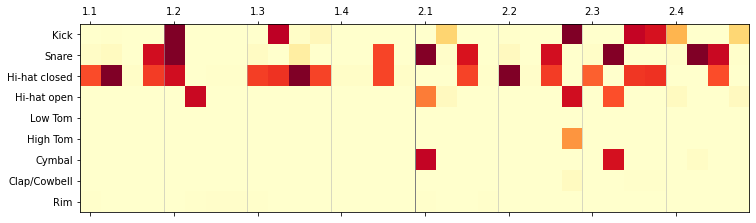

epoch: 587
m_d_loss: 0.29508921065751237     m_g_loss: 3.8551833629608154


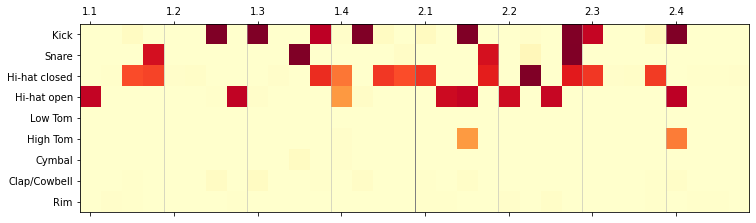

epoch: 588
m_d_loss: 0.29496523346751924     m_g_loss: 3.916016268007683


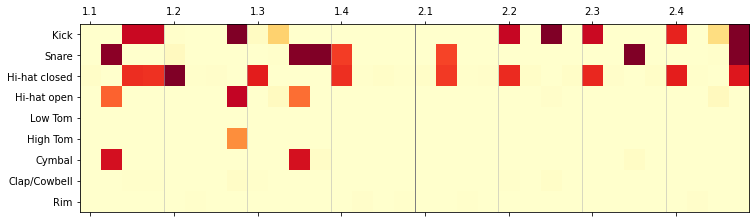

epoch: 589
m_d_loss: 0.2990601392353282     m_g_loss: 3.9240765788338403


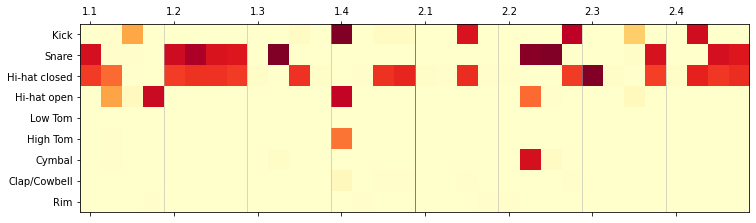

epoch: 590
m_d_loss: 0.2989322405308485     m_g_loss: 3.9122745340520684


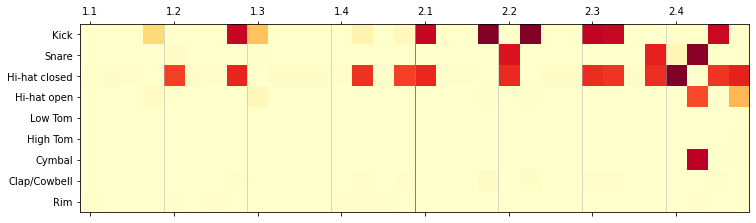

epoch: 591
m_d_loss: 0.29708036587518805     m_g_loss: 4.0495757189663975


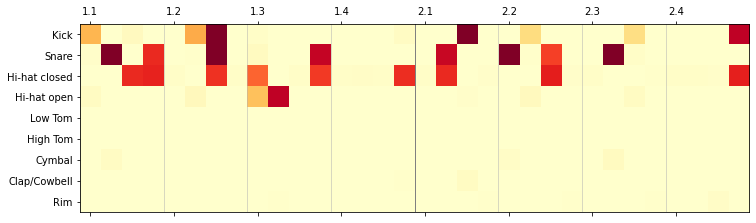

epoch: 592
m_d_loss: 0.29777847938239577     m_g_loss: 3.9263323148091636


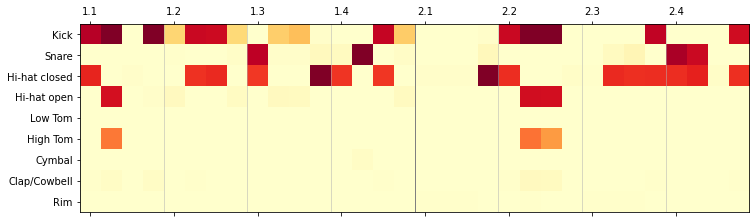

epoch: 593
m_d_loss: 0.2977574183660395     m_g_loss: 4.007266203562419


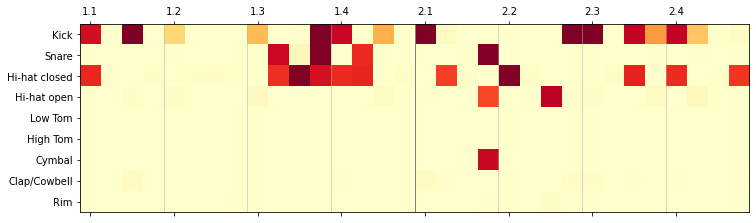

epoch: 594
m_d_loss: 0.30317172072827814     m_g_loss: 3.9987298503066553


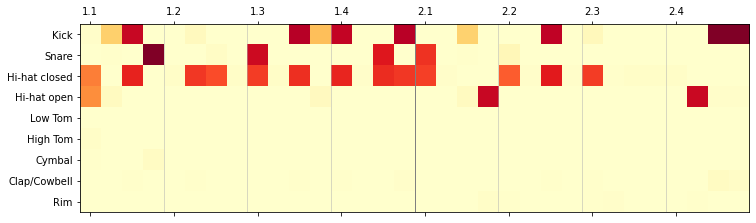

epoch: 595
m_d_loss: 0.2991620700148975     m_g_loss: 3.920549002560702


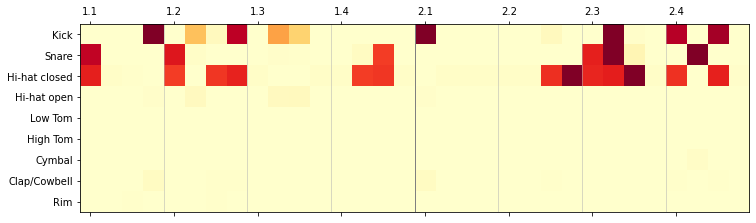

epoch: 596
m_d_loss: 0.2935697719454765     m_g_loss: 3.9183683106393525


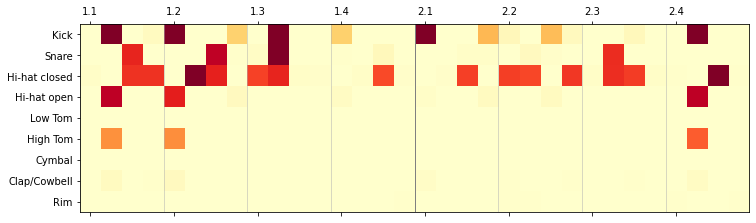

epoch: 597
m_d_loss: 0.2893205018604503     m_g_loss: 4.031693848696622


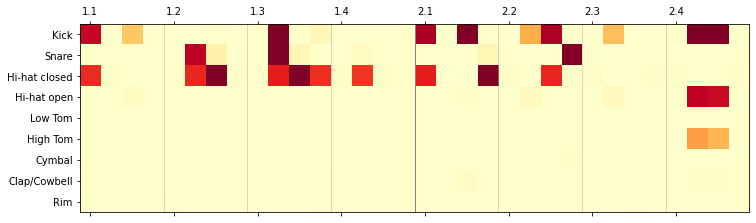

epoch: 598
m_d_loss: 0.293860917724669     m_g_loss: 4.14887395772067


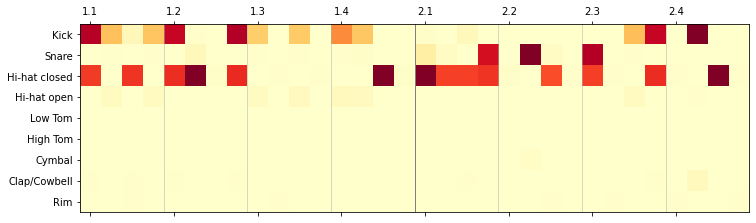

epoch: 599
m_d_loss: 0.2934291408342474     m_g_loss: 4.026605938420151


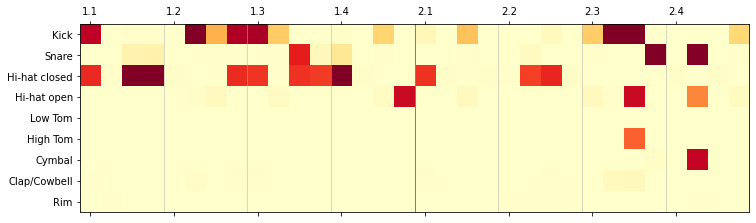

epoch: 600
m_d_loss: 0.2991266677156091     m_g_loss: 4.0995518944480205


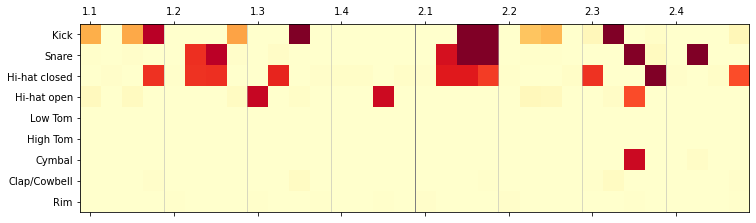

epoch: 601
m_d_loss: 0.3035476873902714     m_g_loss: 4.1214040337186875


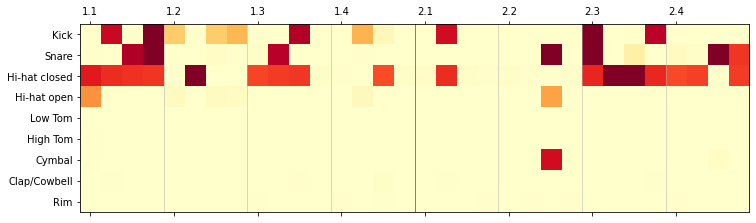

epoch: 602
m_d_loss: 0.28679871112108224     m_g_loss: 4.057309822602705


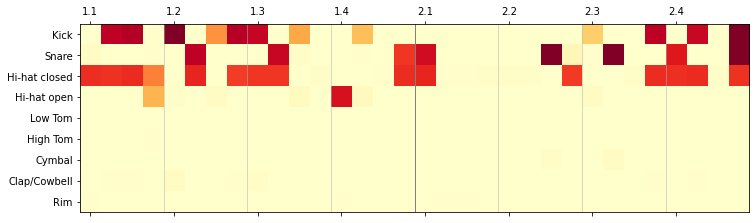

epoch: 603
m_d_loss: 0.2989896073060877     m_g_loss: 3.961160833185369


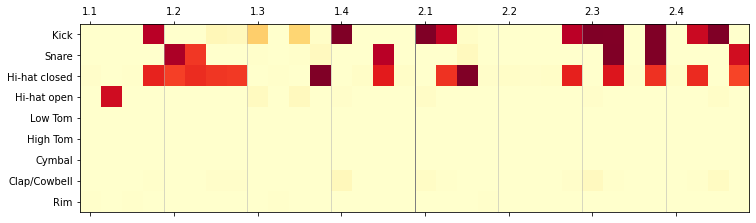

epoch: 604
m_d_loss: 0.3001005424186587     m_g_loss: 3.9981387384010083


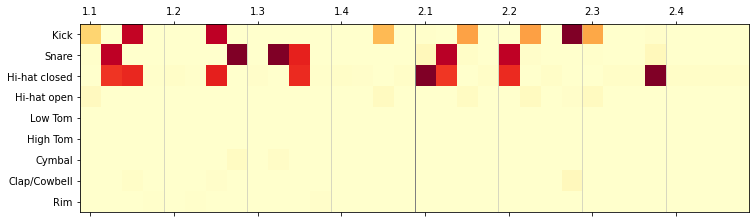

epoch: 605
m_d_loss: 0.2993580585016924     m_g_loss: 3.9187811721454966


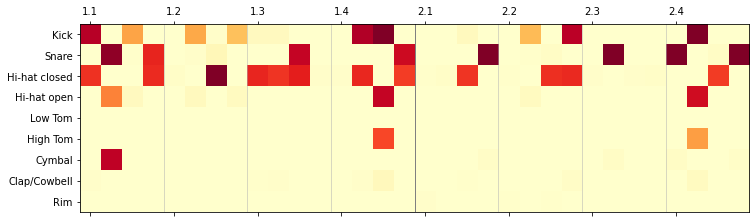

epoch: 606
m_d_loss: 0.2955825163051486     m_g_loss: 3.931121725024599


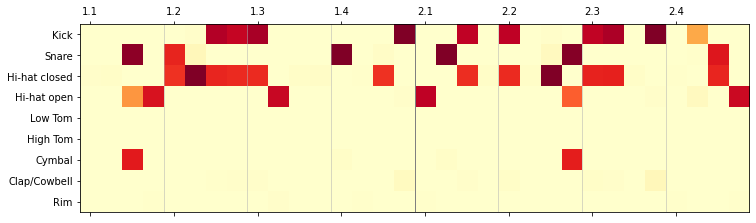

epoch: 607
m_d_loss: 0.304705921516699     m_g_loss: 4.000636476458925


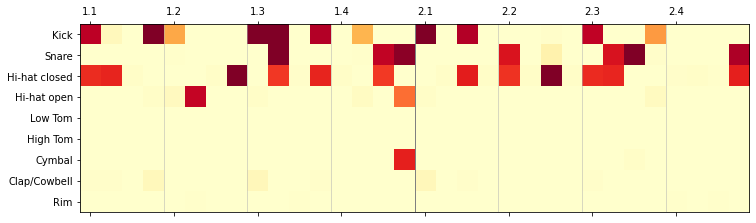

epoch: 608
m_d_loss: 0.2946171535179019     m_g_loss: 4.012103846578887


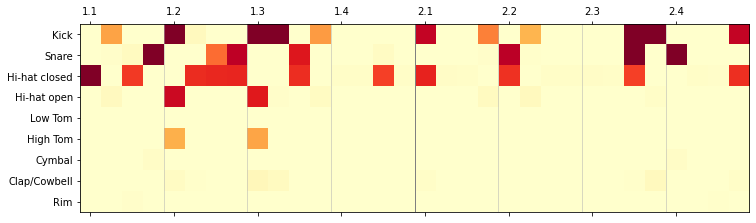

epoch: 609
m_d_loss: 0.29399906379335067     m_g_loss: 3.975664218266805


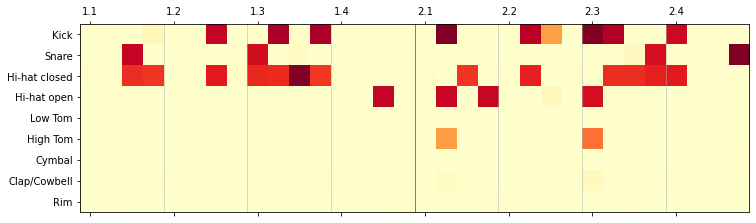

epoch: 610
m_d_loss: 0.29305286072194575     m_g_loss: 3.938620242205533


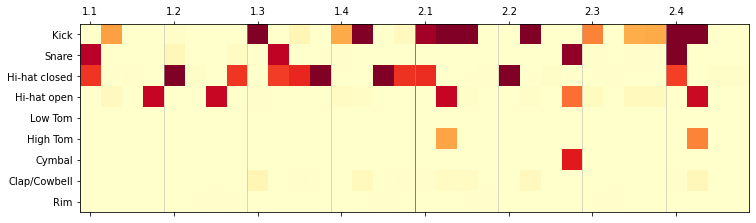

epoch: 611
m_d_loss: 0.2977589475757935     m_g_loss: 3.98067087838144


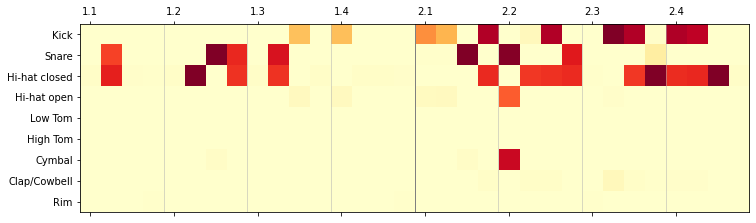

epoch: 612
m_d_loss: 0.2943476315587759     m_g_loss: 4.043153062011257


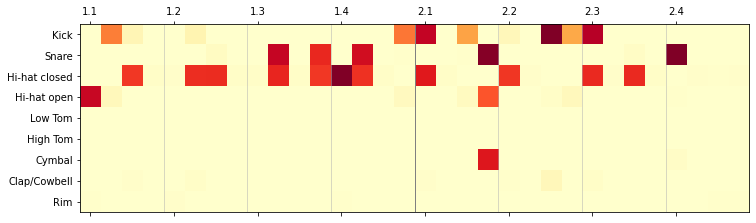

epoch: 613
m_d_loss: 0.2973527778597439     m_g_loss: 4.000233447912968


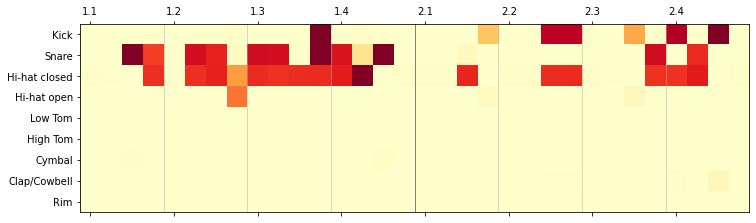

epoch: 614
m_d_loss: 0.30072305910289293     m_g_loss: 4.0217282194079775


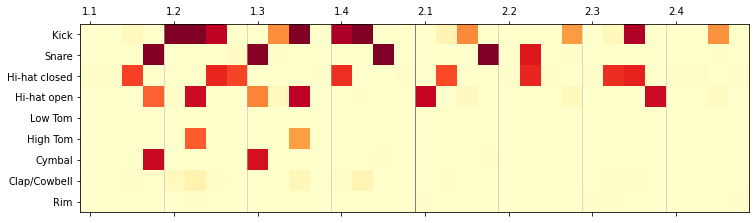

epoch: 615
m_d_loss: 0.2962136806810603     m_g_loss: 4.0371199304407295


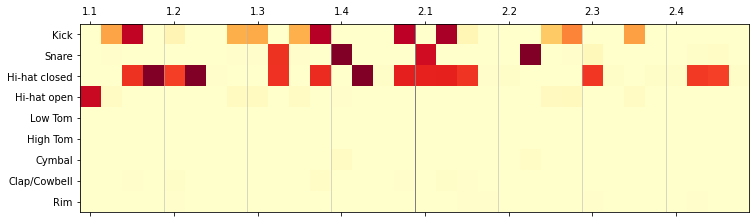

epoch: 616
m_d_loss: 0.2951984629034996     m_g_loss: 3.875845121614861


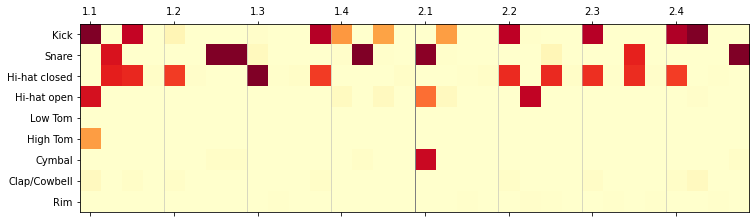

epoch: 617
m_d_loss: 0.296487489693305     m_g_loss: 3.9259212306051543


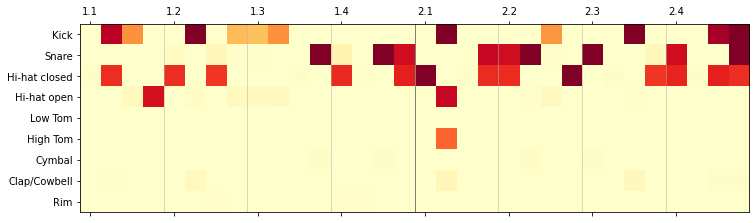

epoch: 618
m_d_loss: 0.3045591263100505     m_g_loss: 3.893134514490763


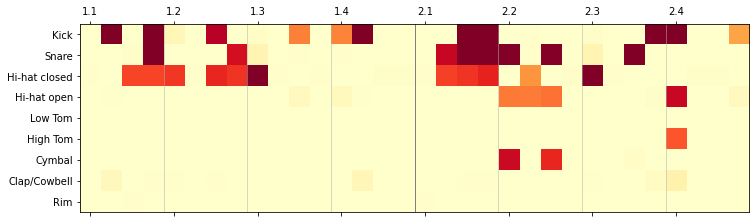

epoch: 619
m_d_loss: 0.2934234687510659     m_g_loss: 3.98402738571167


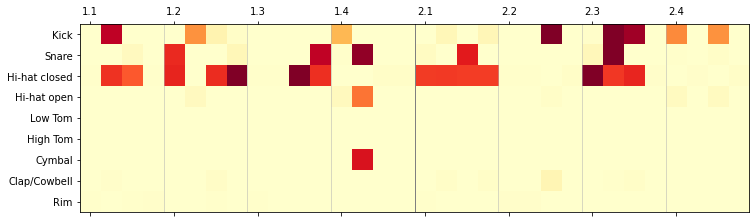

epoch: 620
m_d_loss: 0.29217699859291324     m_g_loss: 4.037230982924953


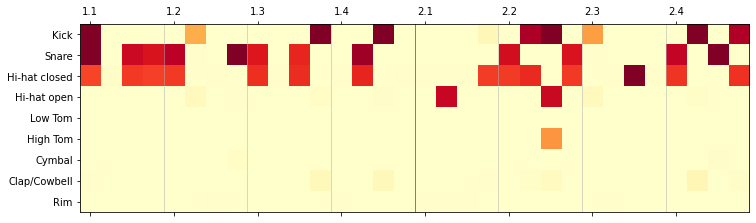

epoch: 621
m_d_loss: 0.29337528032415056     m_g_loss: 3.918766816457113


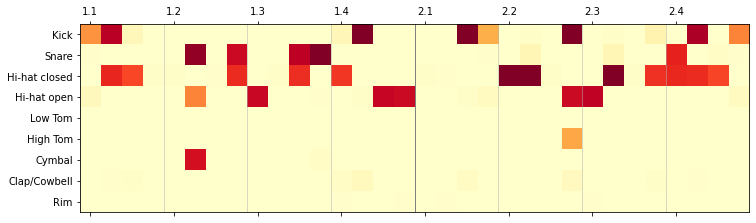

epoch: 622
m_d_loss: 0.3014716414734721     m_g_loss: 4.0159634171110214


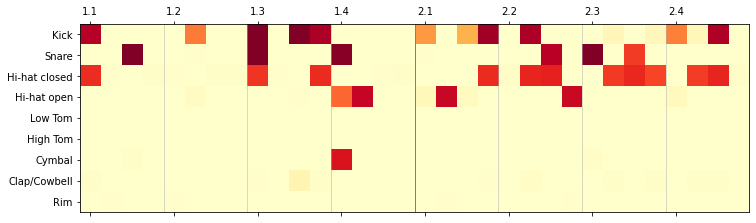

epoch: 623
m_d_loss: 0.2988362678710152     m_g_loss: 4.07149490443143


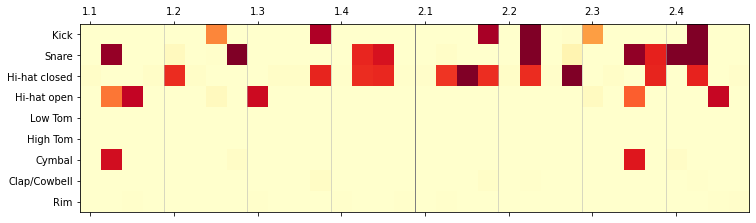

epoch: 624
m_d_loss: 0.30551873147487646     m_g_loss: 3.8824819651517


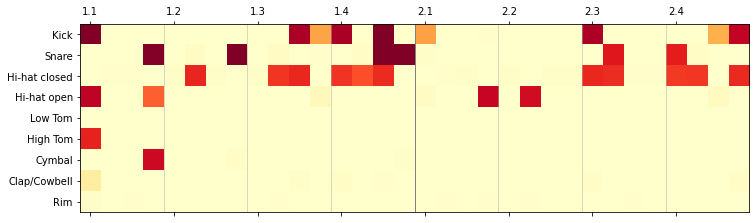

epoch: 625
m_d_loss: 0.2983625127988704     m_g_loss: 3.980434107057976


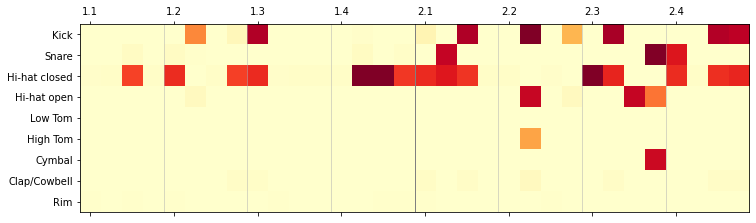

epoch: 626
m_d_loss: 0.2908823523670435     m_g_loss: 3.9374849073814624


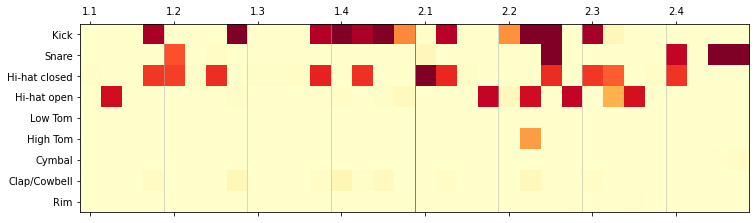

epoch: 627
m_d_loss: 0.2996680599801681     m_g_loss: 3.991540359728264


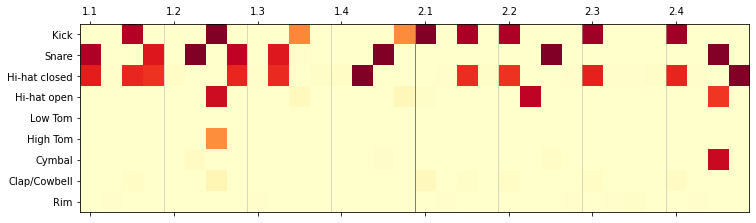

epoch: 628
m_d_loss: 0.30553651321679354     m_g_loss: 3.9749729922323516


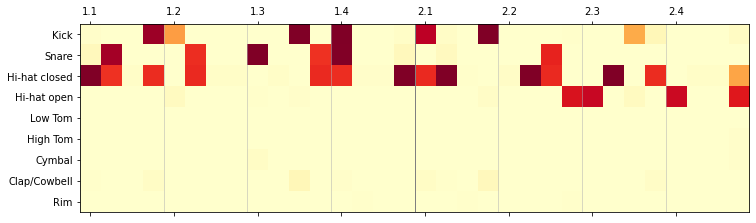

epoch: 629
m_d_loss: 0.2971734711352516     m_g_loss: 3.9466413151134145


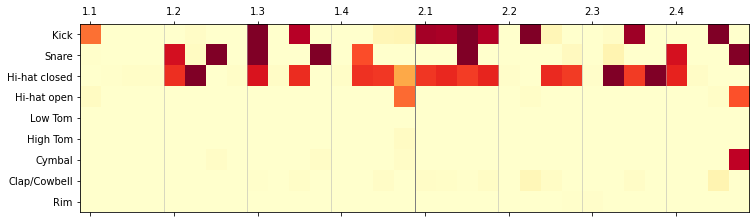

epoch: 630
m_d_loss: 0.29398287329822775     m_g_loss: 3.980290333429972


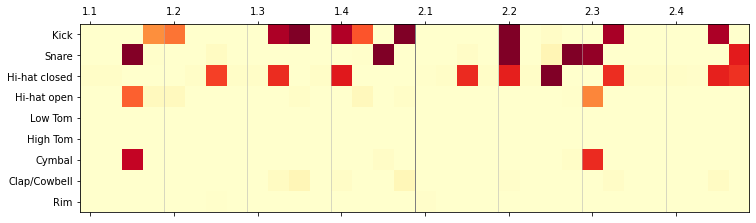

epoch: 631
m_d_loss: 0.2948287278413773     m_g_loss: 4.002846161524455


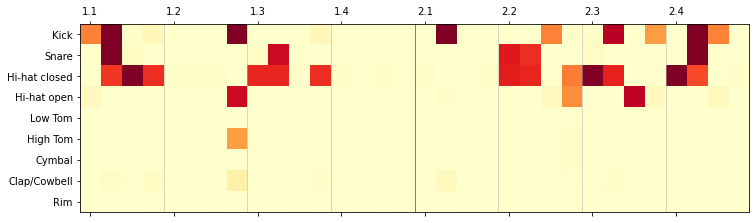

epoch: 632
m_d_loss: 0.3026051547378302     m_g_loss: 3.9608241789268726


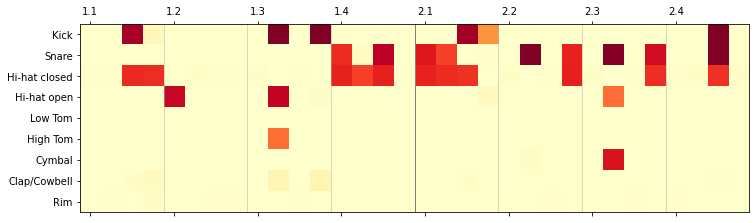

epoch: 633
m_d_loss: 0.29369824616348034     m_g_loss: 3.9343529759031353


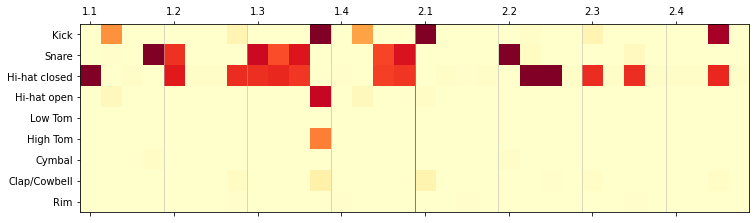

epoch: 634
m_d_loss: 0.29798475671559577     m_g_loss: 3.951422236182473


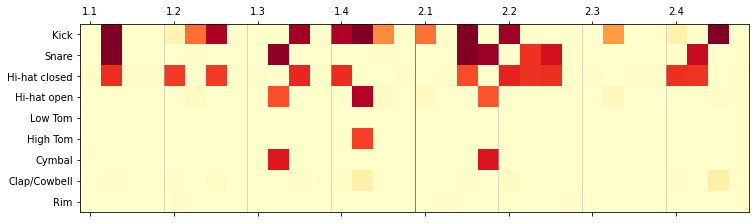

epoch: 635
m_d_loss: 0.28715890067465166     m_g_loss: 3.951385433023626


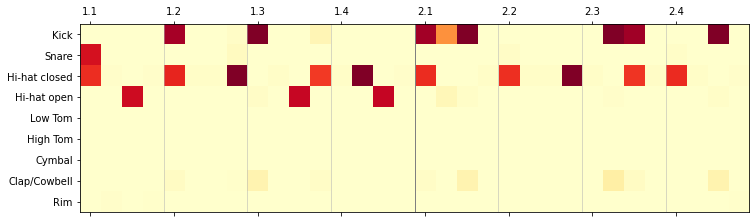

epoch: 636
m_d_loss: 0.29767722897231574     m_g_loss: 3.9435663729002983


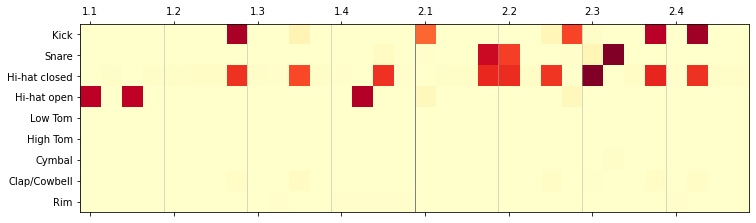

epoch: 637
m_d_loss: 0.2883301754208172     m_g_loss: 3.887732007286765


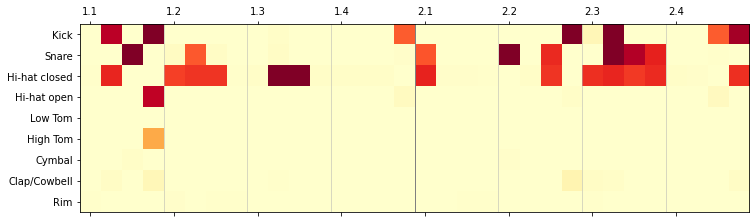

epoch: 638
m_d_loss: 0.2962226698175073     m_g_loss: 3.934282996437766


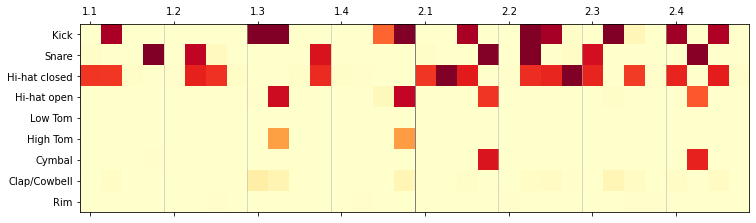

epoch: 639
m_d_loss: 0.29811311013558334     m_g_loss: 3.9650642582864473


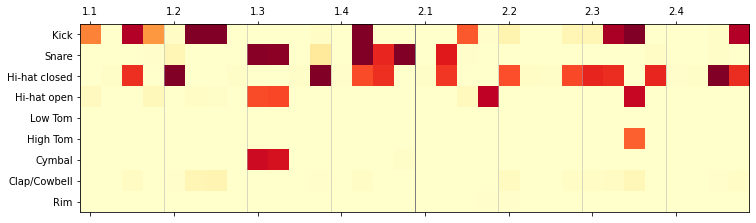

epoch: 640
m_d_loss: 0.3053315348923206     m_g_loss: 4.002489855795195


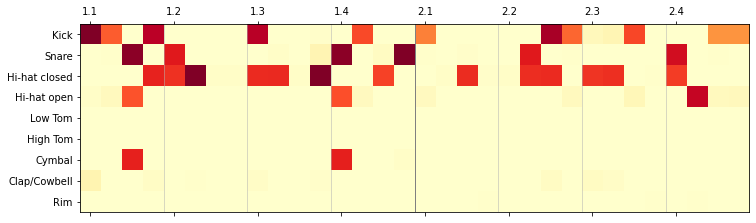

epoch: 641
m_d_loss: 0.29837018619565403     m_g_loss: 3.914493199550744


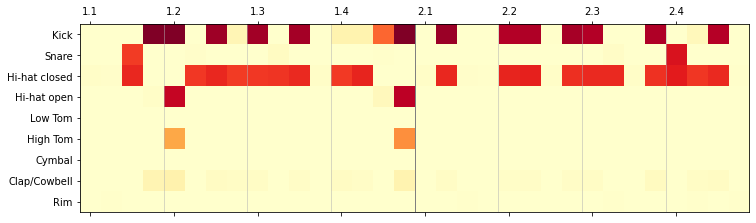

epoch: 642
m_d_loss: 0.3018006943166256     m_g_loss: 3.9323589874036387


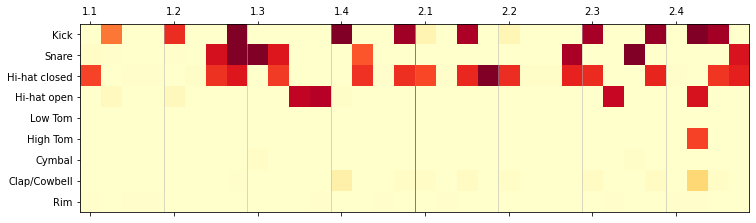

epoch: 643
m_d_loss: 0.30675490235581115     m_g_loss: 3.9217209671482895


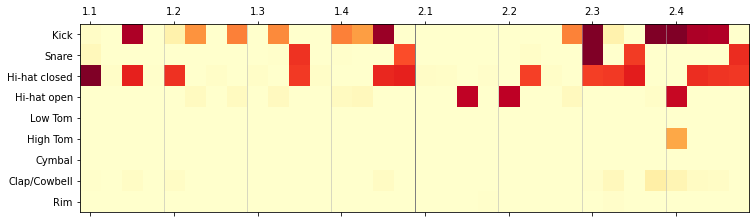

epoch: 644
m_d_loss: 0.29299998302012686     m_g_loss: 3.9349661812637793


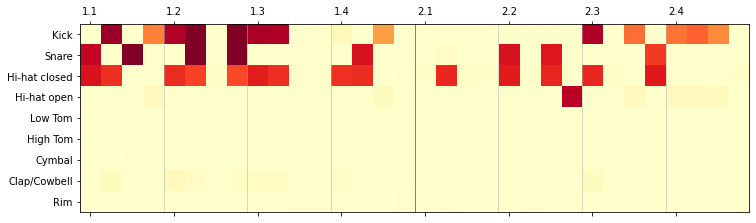

epoch: 645
m_d_loss: 0.29584821094484887     m_g_loss: 3.9621672196821733


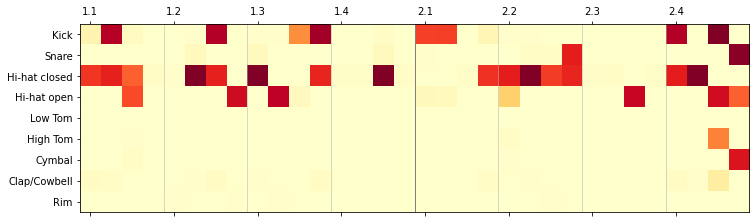

epoch: 646
m_d_loss: 0.2977294627577066     m_g_loss: 3.842055320739746


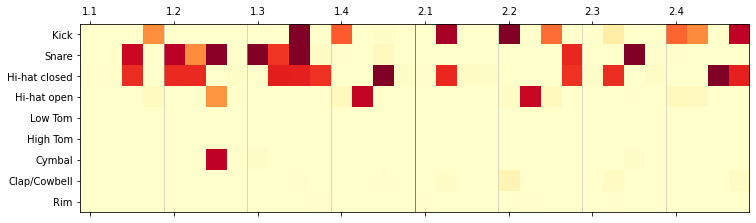

epoch: 647
m_d_loss: 0.2922351053532432     m_g_loss: 3.88997525879831


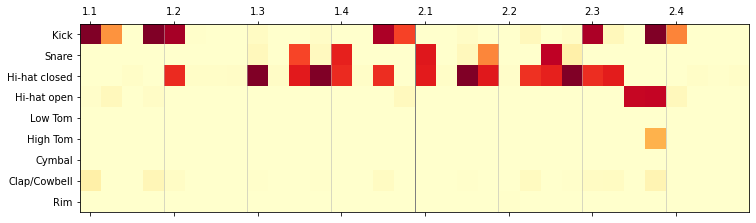

epoch: 648
m_d_loss: 0.2883480217307806     m_g_loss: 3.940444816242565


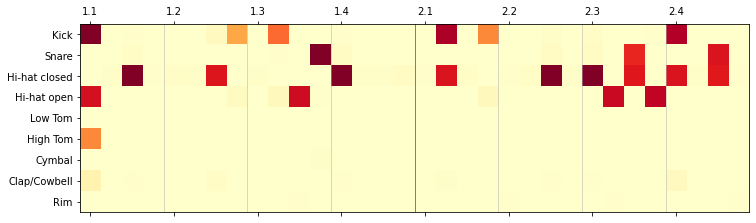

epoch: 649
m_d_loss: 0.2951700375360601     m_g_loss: 3.9648627223390522


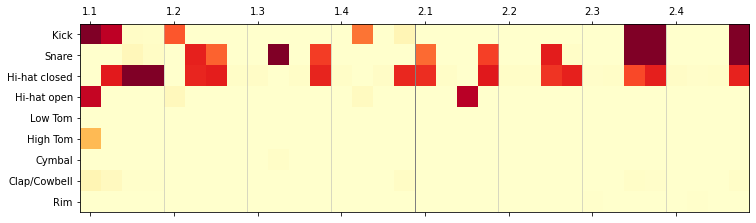

epoch: 650
m_d_loss: 0.2946324687451124     m_g_loss: 3.876855973041419


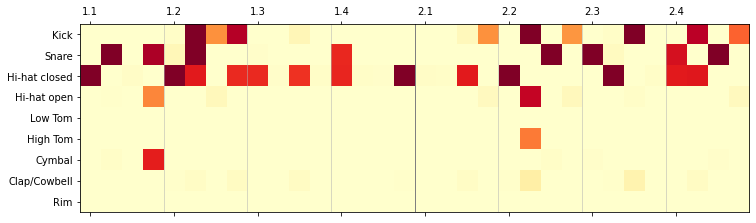

epoch: 651
m_d_loss: 0.29238111709847164     m_g_loss: 4.099601362690781


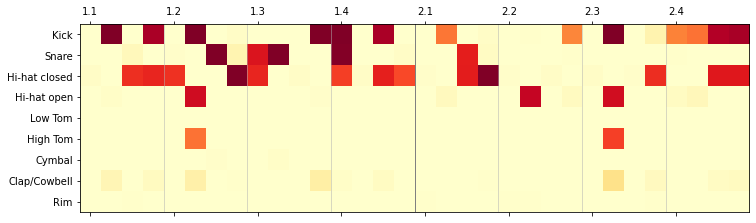

epoch: 652
m_d_loss: 0.2869136989116669     m_g_loss: 3.9604217066909326


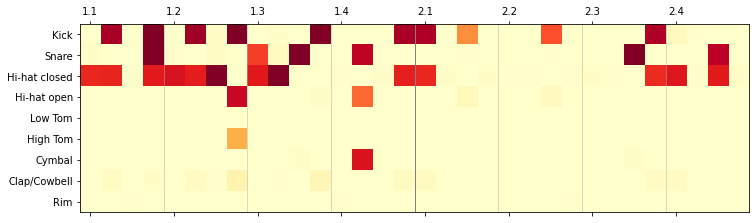

epoch: 653
m_d_loss: 0.30334267826641304     m_g_loss: 3.9808137127847383


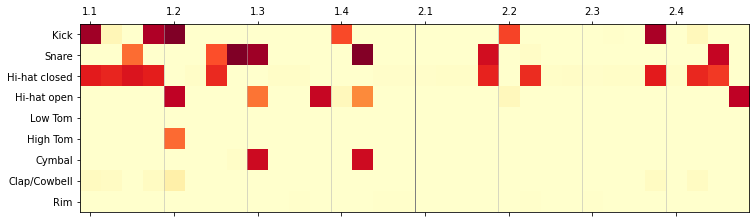

epoch: 654
m_d_loss: 0.2954750737175345     m_g_loss: 3.981036728078669


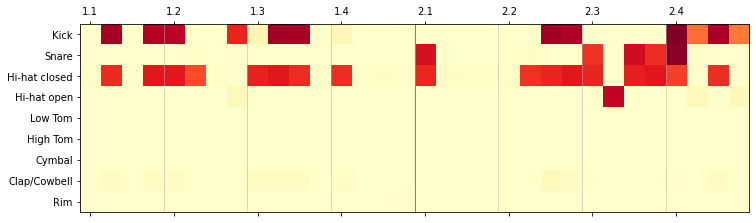

epoch: 655
m_d_loss: 0.2993021028883317     m_g_loss: 3.9514946142832437


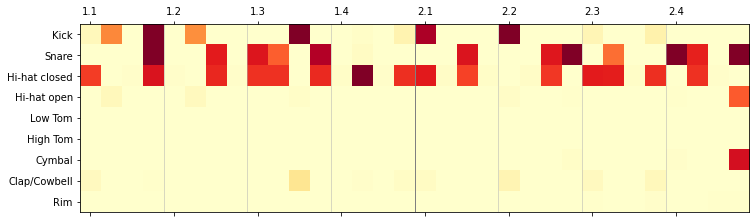

epoch: 656
m_d_loss: 0.29679281935095786     m_g_loss: 3.9863491997574316


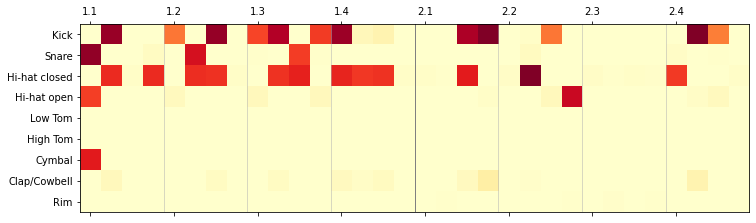

epoch: 657
m_d_loss: 0.29949076421120585     m_g_loss: 3.9991833224441065


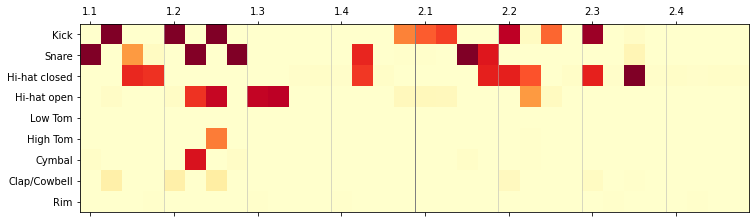

epoch: 658
m_d_loss: 0.29110088367015124     m_g_loss: 3.982985409823331


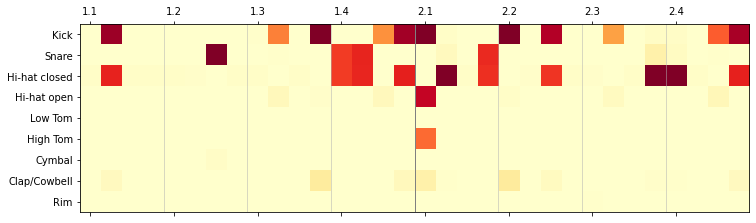

epoch: 659
m_d_loss: 0.2927836582941167     m_g_loss: 3.883715145515673


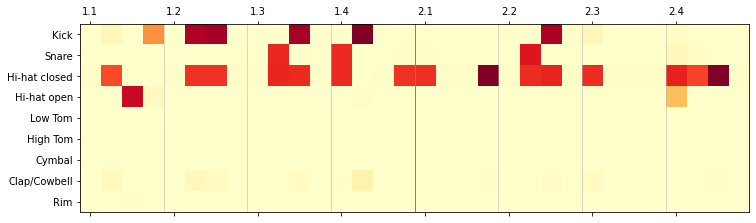

epoch: 660
m_d_loss: 0.2917720401659608     m_g_loss: 3.95954163869222


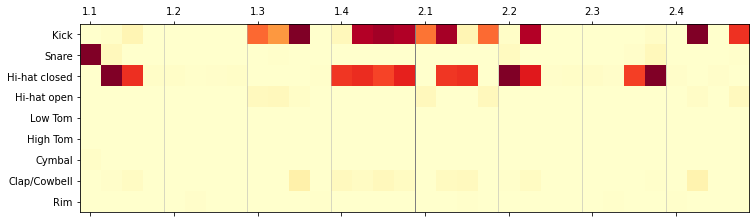

epoch: 661
m_d_loss: 0.2987816442461574     m_g_loss: 3.86396151600462


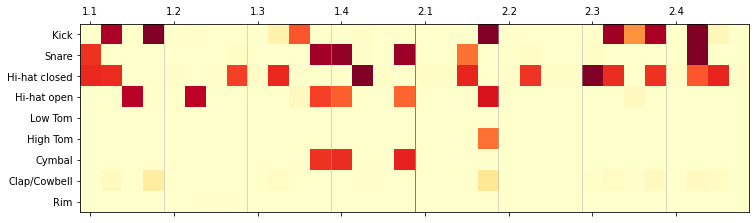

epoch: 662
m_d_loss: 0.2916351601481437     m_g_loss: 3.8576013897404526


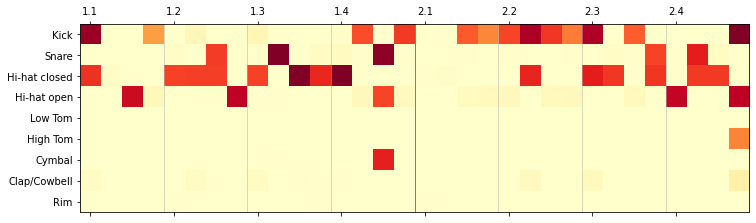

epoch: 663
m_d_loss: 0.30051411022158225     m_g_loss: 4.05487837935939


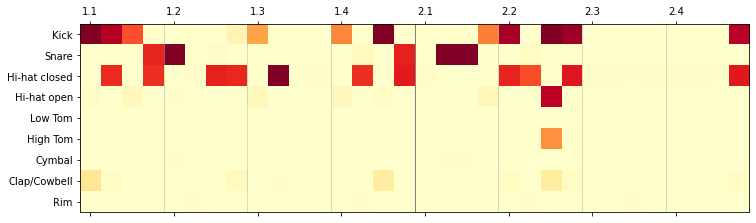

epoch: 664
m_d_loss: 0.3017480157315731     m_g_loss: 3.843421134081754


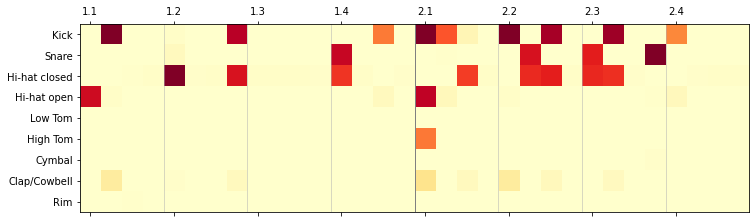

epoch: 665
m_d_loss: 0.29796366042950573     m_g_loss: 3.905894409526478


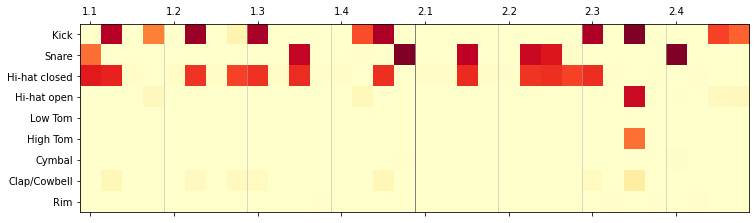

epoch: 666
m_d_loss: 0.29769038800150155     m_g_loss: 3.8930630322658653


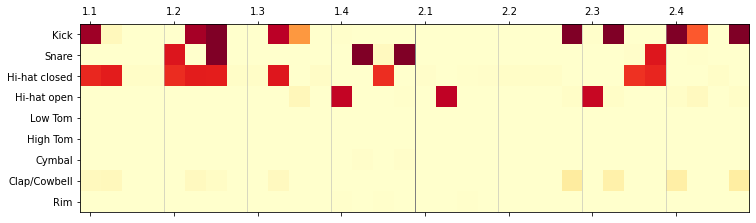

epoch: 667
m_d_loss: 0.2977182605687311     m_g_loss: 3.834452231725057


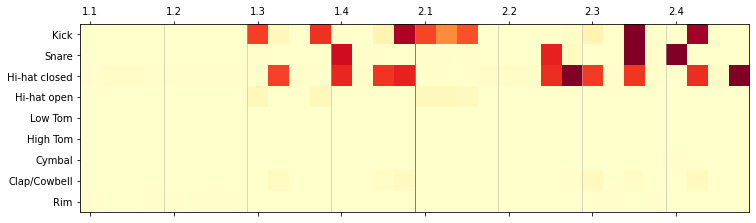

epoch: 668
m_d_loss: 0.2947876781225205     m_g_loss: 3.924761020775997


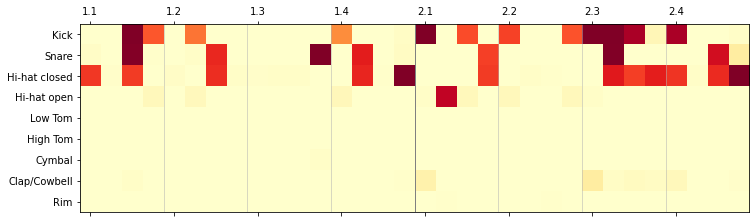

epoch: 669
m_d_loss: 0.2940617841832778     m_g_loss: 4.095994869867961


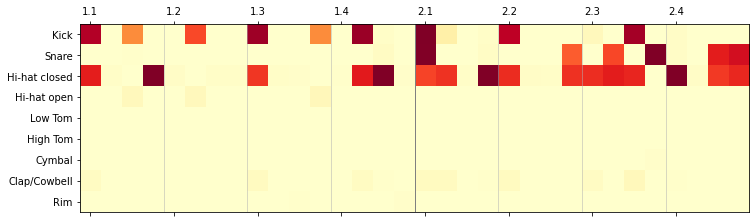

epoch: 670
m_d_loss: 0.2922766180709004     m_g_loss: 4.023691170143358


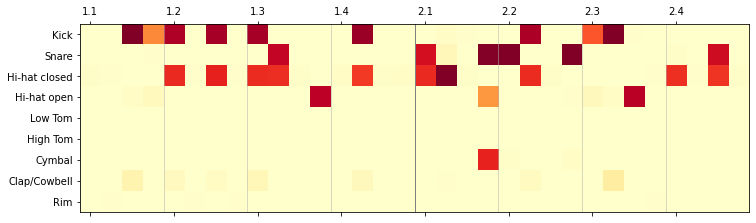

epoch: 671
m_d_loss: 0.29983604129622965     m_g_loss: 3.9099468534643


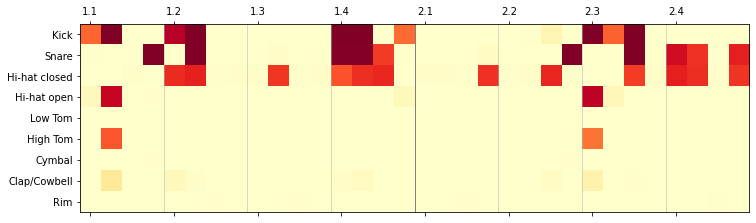

epoch: 672
m_d_loss: 0.29621342588216065     m_g_loss: 4.103503718520656


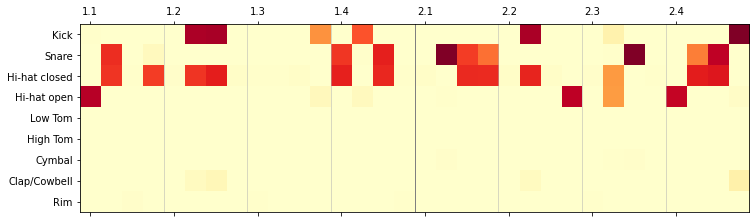

epoch: 673
m_d_loss: 0.29574397206306463     m_g_loss: 3.9535013112154873


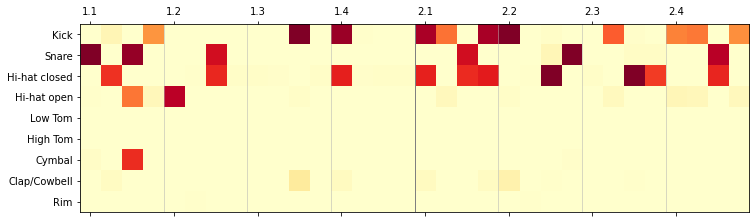

epoch: 674
m_d_loss: 0.2969593651592731     m_g_loss: 3.9995829047578755


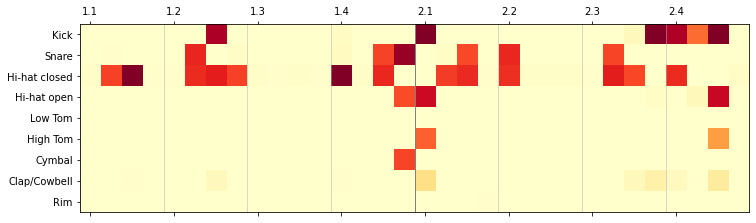

epoch: 675
m_d_loss: 0.2926691525122699     m_g_loss: 4.012240619370432


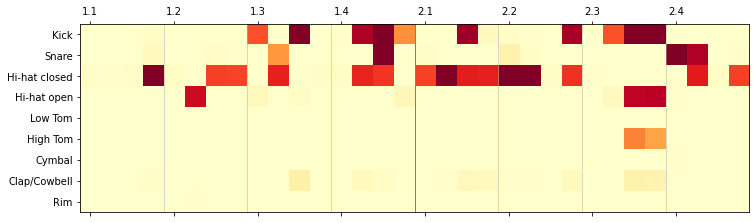

epoch: 676
m_d_loss: 0.2970066700130701     m_g_loss: 3.982189229040435


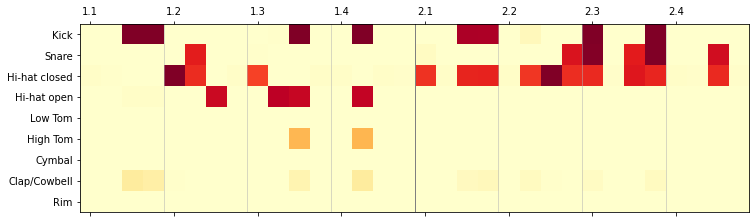

epoch: 677
m_d_loss: 0.29563595144187704     m_g_loss: 3.9943245829957905


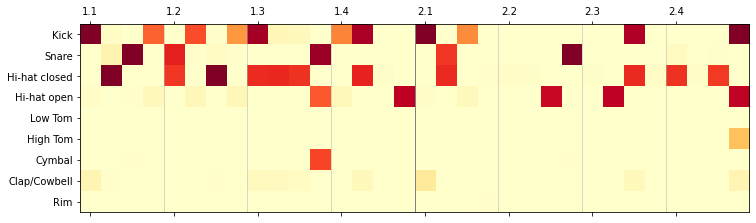

epoch: 678
m_d_loss: 0.2891540033742786     m_g_loss: 3.9403134114814526


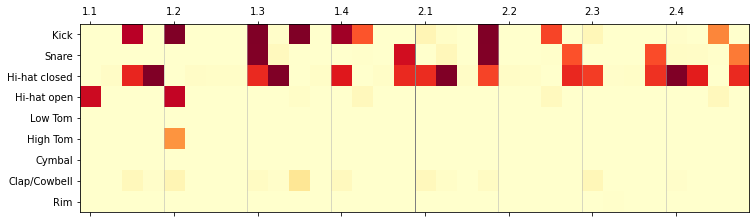

epoch: 679
m_d_loss: 0.2982812723692726     m_g_loss: 3.9956443309783936


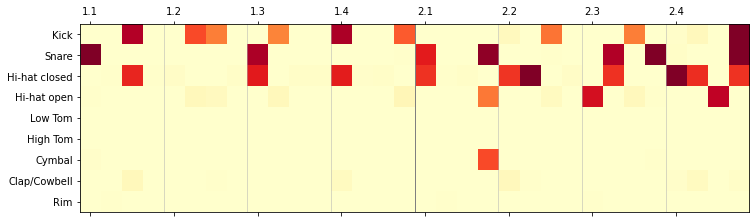

epoch: 680
m_d_loss: 0.2980490731075406     m_g_loss: 3.994098172043309


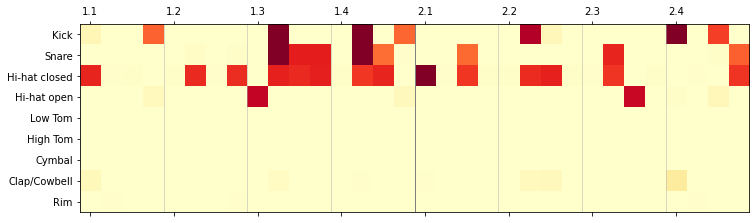

epoch: 681
m_d_loss: 0.2947996555005803     m_g_loss: 3.9467574177366314


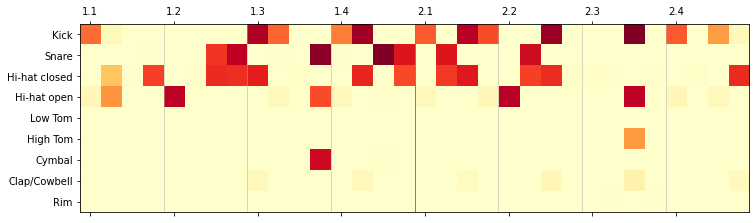

epoch: 682
m_d_loss: 0.2899285566061735     m_g_loss: 3.9613679828065815


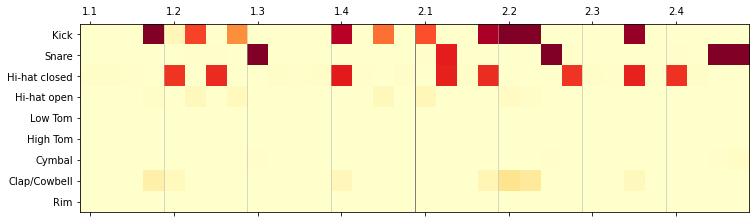

epoch: 683
m_d_loss: 0.2964704192736569     m_g_loss: 3.933762550354004


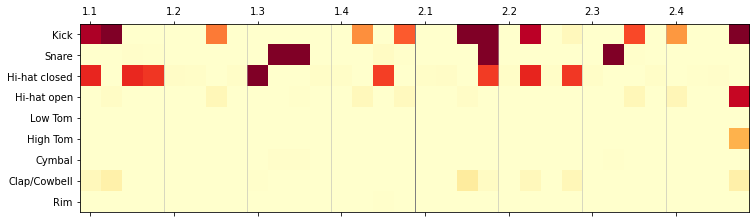

epoch: 684
m_d_loss: 0.2961280034855009     m_g_loss: 3.9272395625258936


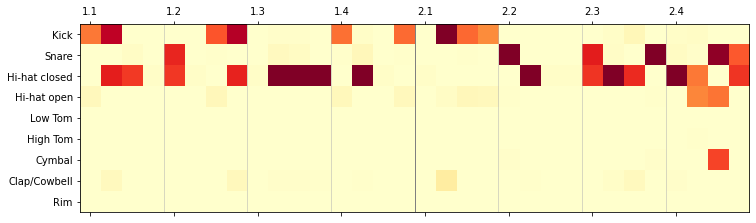

epoch: 685
m_d_loss: 0.292110158941325     m_g_loss: 4.020684119426843


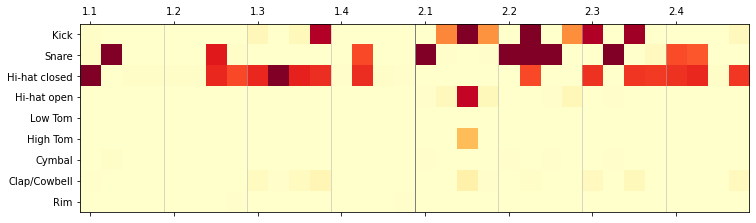

epoch: 686
m_d_loss: 0.3009784806519747     m_g_loss: 4.029208558978456


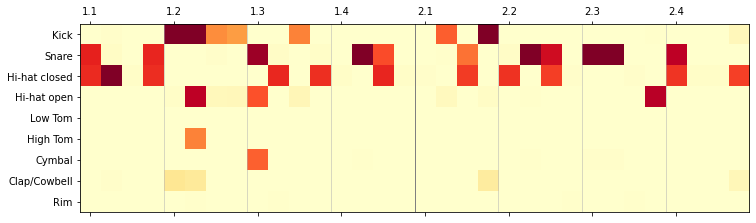

epoch: 687
m_d_loss: 0.2923678685637081     m_g_loss: 3.975829659086285


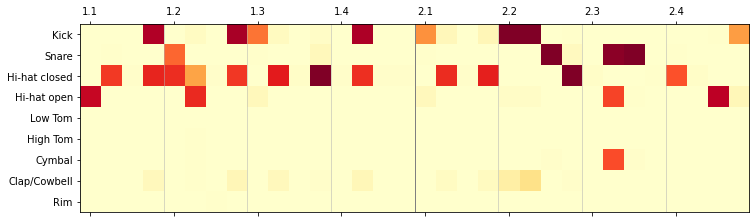

epoch: 688
m_d_loss: 0.30318114776164296     m_g_loss: 4.003130508191658


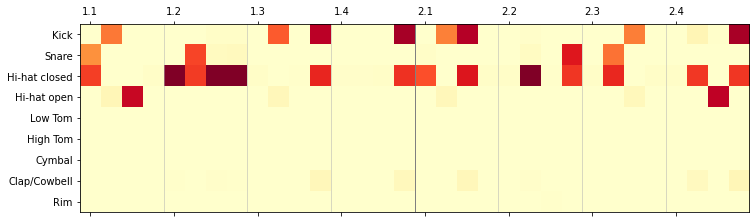

epoch: 689
m_d_loss: 0.29627011172911694     m_g_loss: 3.9790566473296196


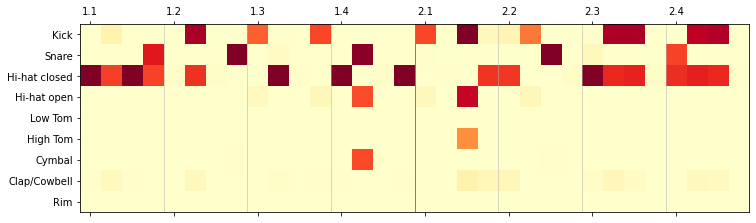

epoch: 690
m_d_loss: 0.29565904233604673     m_g_loss: 3.9378337787859365


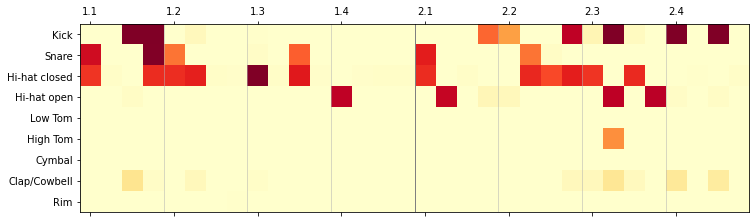

epoch: 691
m_d_loss: 0.2957126019632115     m_g_loss: 3.9252015099380957


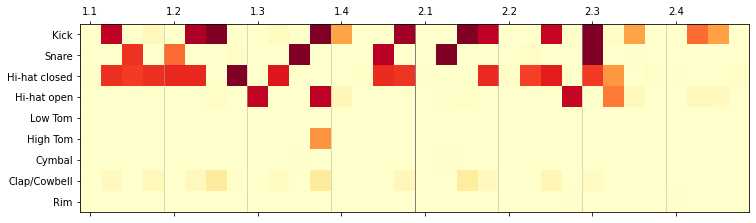

epoch: 692
m_d_loss: 0.2889591973274946     m_g_loss: 4.034058505838567


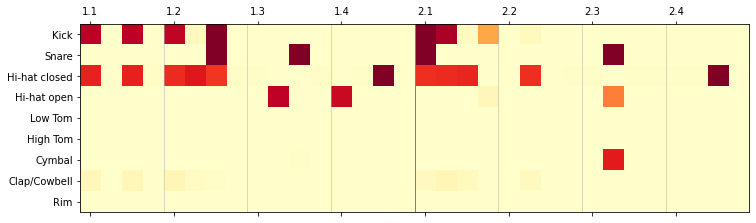

epoch: 693
m_d_loss: 0.28996617618729087     m_g_loss: 4.052901296904593


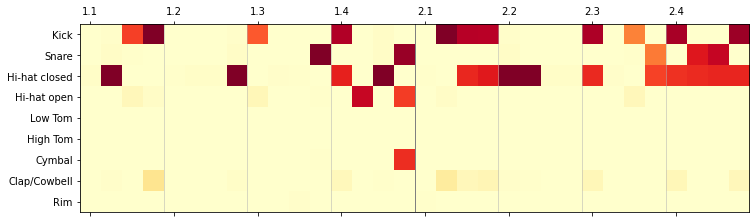

epoch: 694
m_d_loss: 0.2988037234172225     m_g_loss: 4.013168197689635


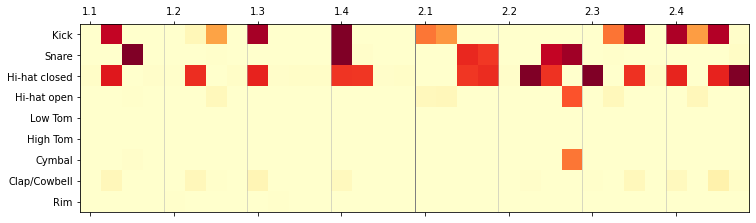

epoch: 695
m_d_loss: 0.2954112030127469     m_g_loss: 4.06225898771575


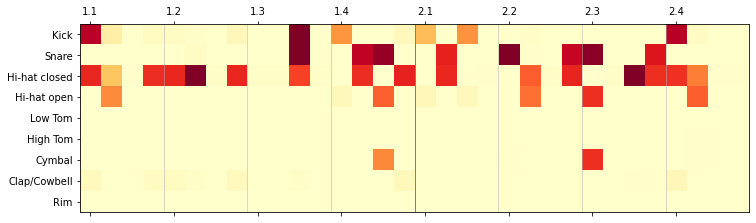

epoch: 696
m_d_loss: 0.29058968480676406     m_g_loss: 4.037652521422415


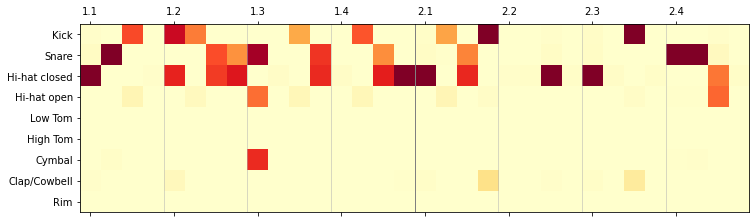

epoch: 697
m_d_loss: 0.295861796596471     m_g_loss: 4.005705219326598


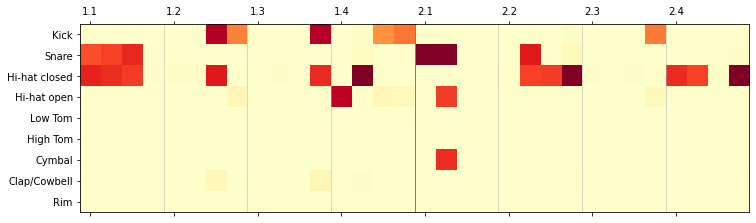

epoch: 698
m_d_loss: 0.2969689209014178     m_g_loss: 3.9438745253013843


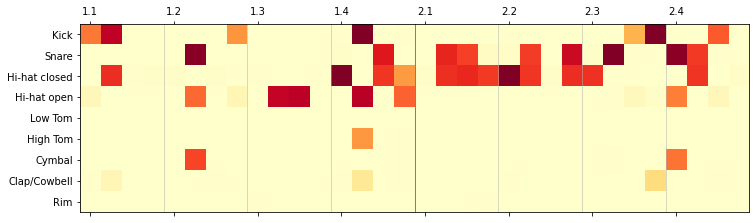

epoch: 699
m_d_loss: 0.29607850839109984     m_g_loss: 3.9523129752188018


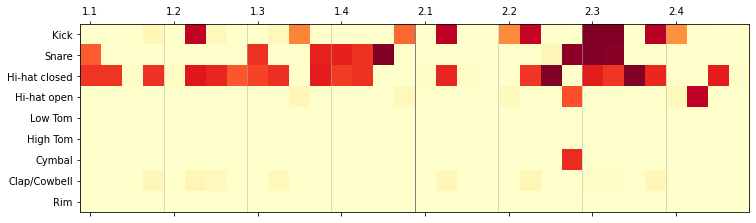

epoch: 700
m_d_loss: 0.29271871615201234     m_g_loss: 4.025954947327122


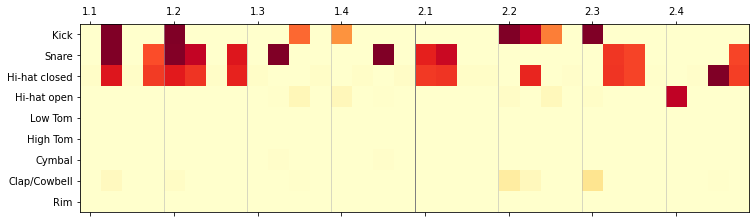

epoch: 701
m_d_loss: 0.2917240530252457     m_g_loss: 4.052071022264885


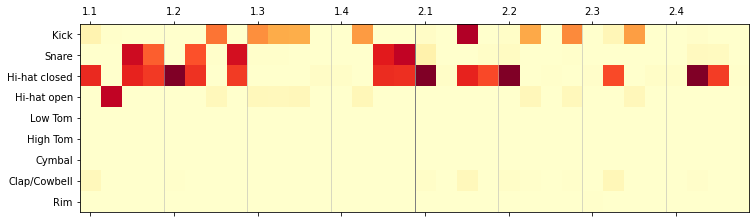

epoch: 702
m_d_loss: 0.289962749555707     m_g_loss: 3.992623618154815


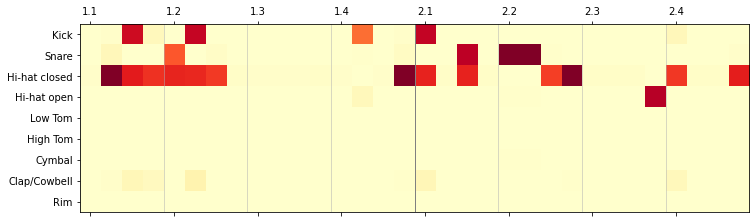

epoch: 703
m_d_loss: 0.29509933362988866     m_g_loss: 3.9897002451347583


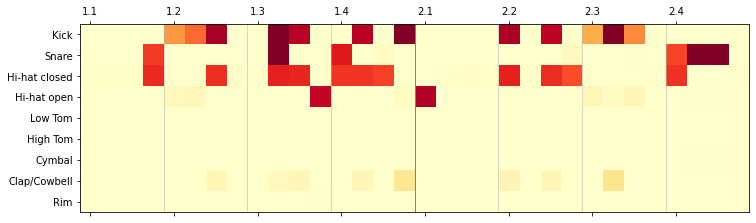

epoch: 704
m_d_loss: 0.29556301813572644     m_g_loss: 4.076825416449345


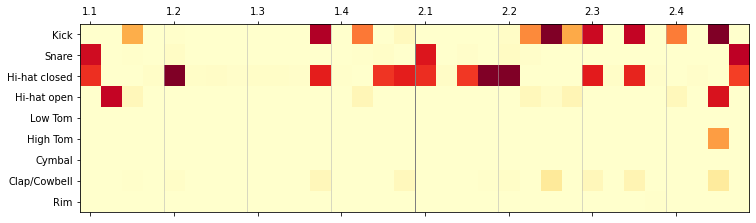

epoch: 705
m_d_loss: 0.29569584692225737     m_g_loss: 3.9855658935778067


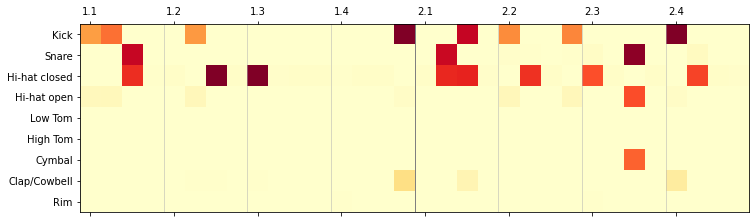

epoch: 706
m_d_loss: 0.29829871319234363     m_g_loss: 3.9882662946527656


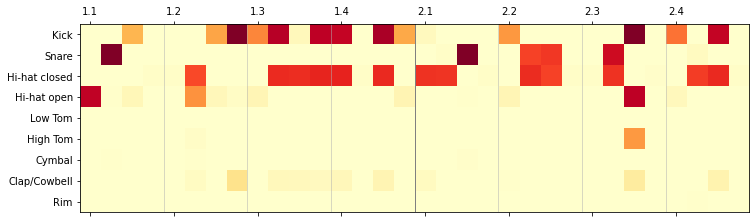

epoch: 707
m_d_loss: 0.29302284735090595     m_g_loss: 4.064734365000869


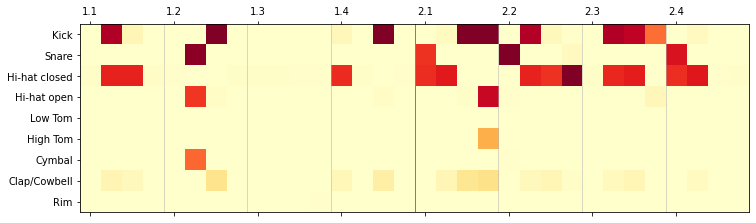

epoch: 708
m_d_loss: 0.2885343678295612     m_g_loss: 4.019119428865837


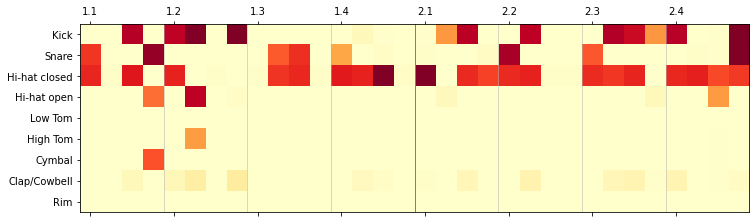

epoch: 709
m_d_loss: 0.29346442555679997     m_g_loss: 4.055283445300478


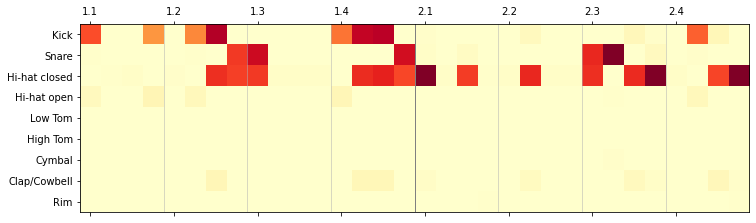

epoch: 710
m_d_loss: 0.2923875631764531     m_g_loss: 4.0002813628225615


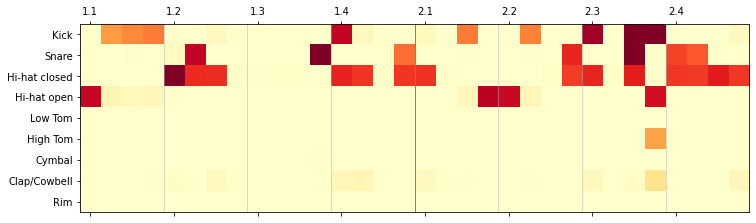

epoch: 711
m_d_loss: 0.291887163940598     m_g_loss: 3.890262712131847


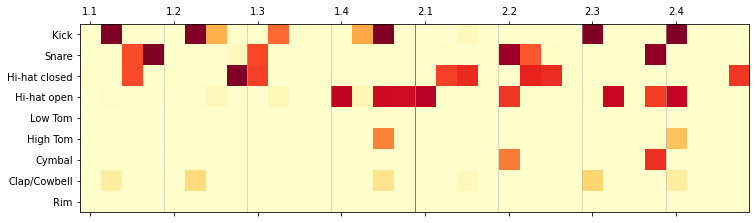

epoch: 712
m_d_loss: 0.29491926748305564     m_g_loss: 4.0263472253626045


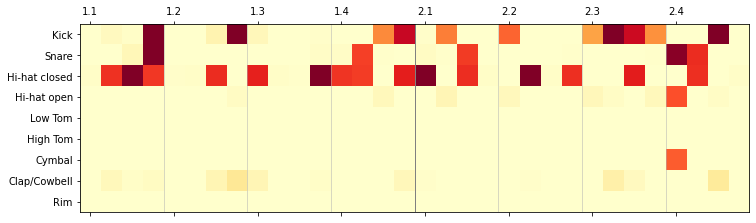

epoch: 713
m_d_loss: 0.30064080234836127     m_g_loss: 4.040651509256074


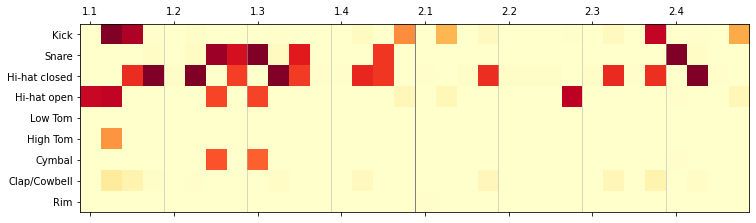

epoch: 714
m_d_loss: 0.2923297967761755     m_g_loss: 4.005338784420129


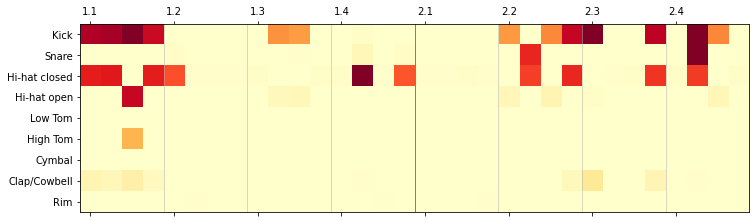

epoch: 715
m_d_loss: 0.2920840284403633     m_g_loss: 4.060044274185643


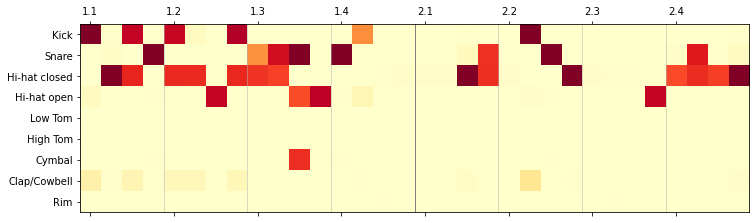

epoch: 716
m_d_loss: 0.29261312745511536     m_g_loss: 3.9109198758096406


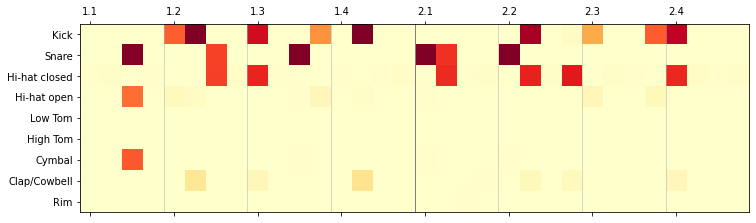

epoch: 717
m_d_loss: 0.29395269874264207     m_g_loss: 4.013752315983628


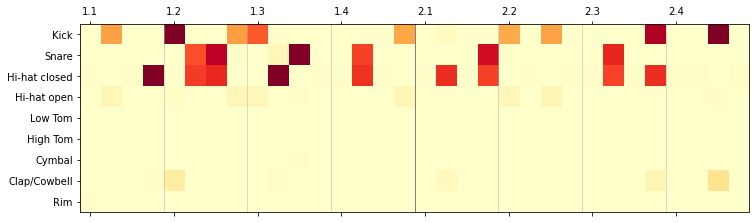

epoch: 718
m_d_loss: 0.2917038343846798     m_g_loss: 4.080931345621745


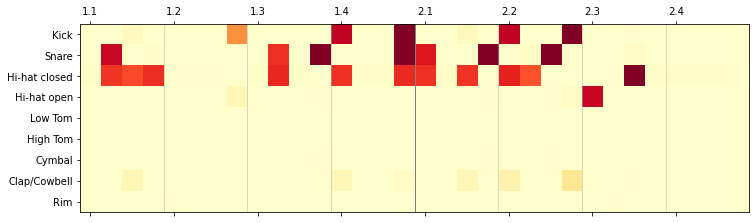

epoch: 719
m_d_loss: 0.3007843468119117     m_g_loss: 3.975519216421879


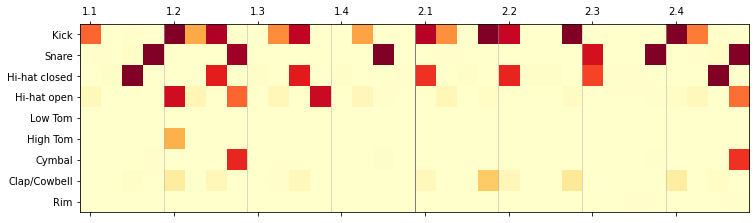

epoch: 720
m_d_loss: 0.2945744274184108     m_g_loss: 4.035277229366881


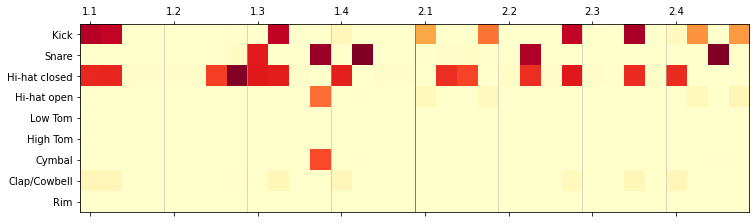

epoch: 721
m_d_loss: 0.3020112719605951     m_g_loss: 3.9752677281697593


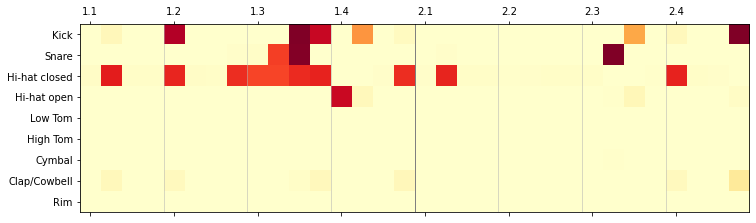

epoch: 722
m_d_loss: 0.29404658153653146     m_g_loss: 4.065758835185658


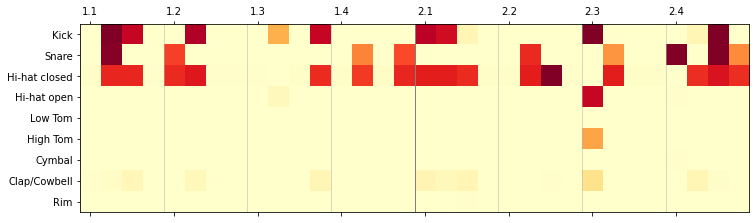

epoch: 723
m_d_loss: 0.2908871277290232     m_g_loss: 4.020392323985244


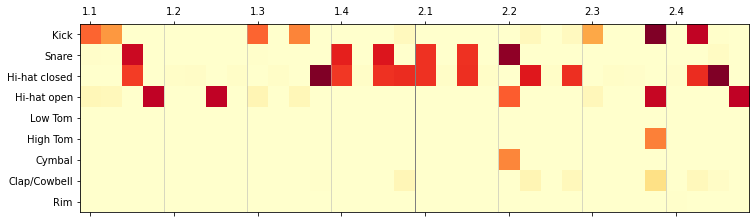

epoch: 724
m_d_loss: 0.29716245252639056     m_g_loss: 4.006579016194199


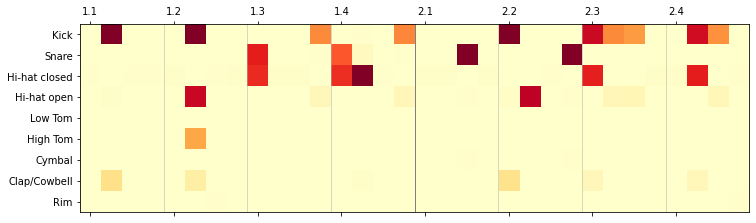

epoch: 725
m_d_loss: 0.28751444360789125     m_g_loss: 4.019210959925796


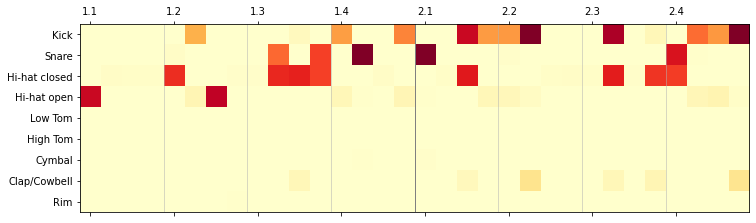

epoch: 726
m_d_loss: 0.29952613767236475     m_g_loss: 4.022597016710224


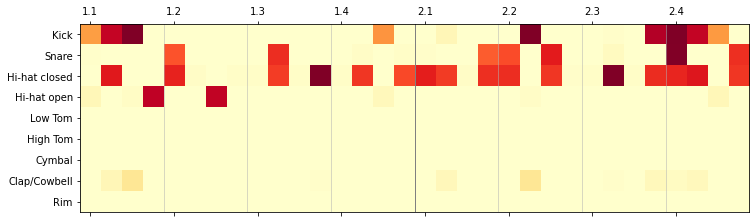

epoch: 727
m_d_loss: 0.3001392054207185     m_g_loss: 4.0364573363101846


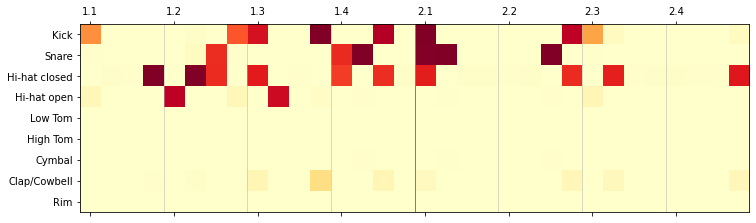

epoch: 728
m_d_loss: 0.2966969180852175     m_g_loss: 4.042430805437492


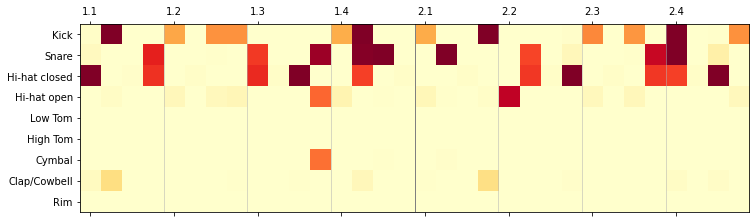

epoch: 729
m_d_loss: 0.2994258971775279     m_g_loss: 4.05870728781729


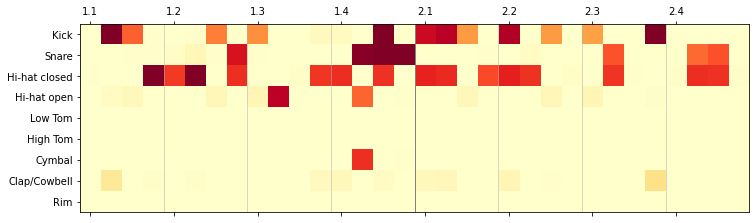

epoch: 730
m_d_loss: 0.30078393742442133     m_g_loss: 3.9553726514180503


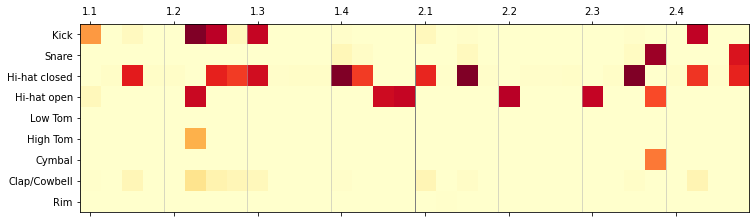

epoch: 731
m_d_loss: 0.29715123264228593     m_g_loss: 3.9667997143485327


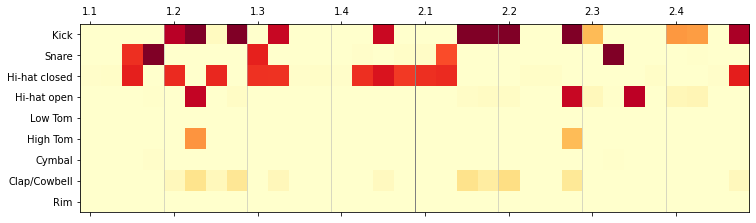

epoch: 732
m_d_loss: 0.3003340542316437     m_g_loss: 3.957102645527233


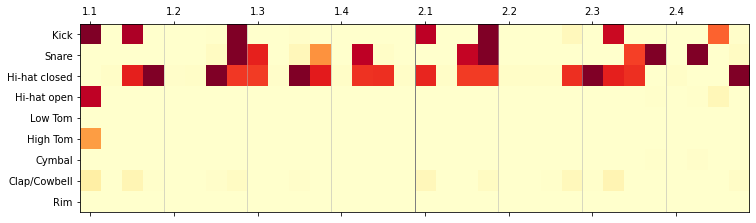

epoch: 733
m_d_loss: 0.2995909422636032     m_g_loss: 3.9756644494605786


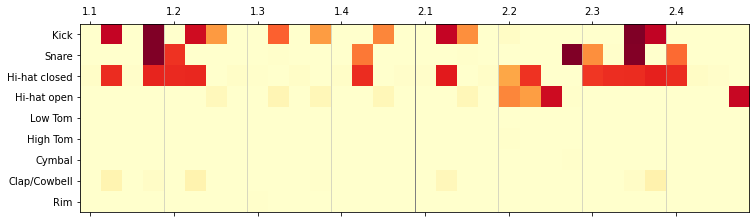

epoch: 734
m_d_loss: 0.2956136388704181     m_g_loss: 3.933007681008541


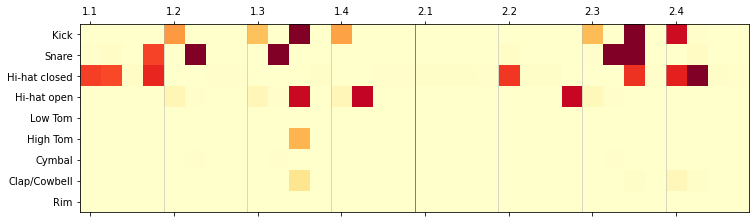

epoch: 735
m_d_loss: 0.30511579443426706     m_g_loss: 3.9258230671738135


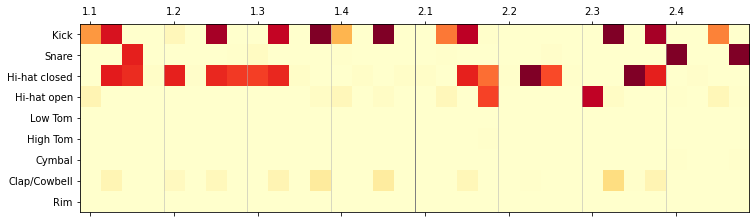

epoch: 736
m_d_loss: 0.30260813292115923     m_g_loss: 3.982689864707716


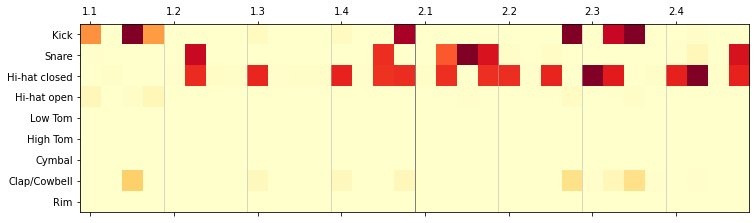

epoch: 737
m_d_loss: 0.2924125094624127     m_g_loss: 3.9699782674962822


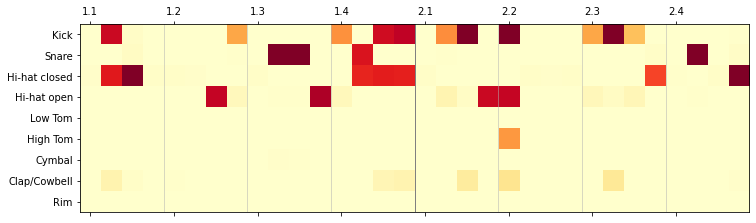

epoch: 738
m_d_loss: 0.2955713352188468     m_g_loss: 3.9711989344972554


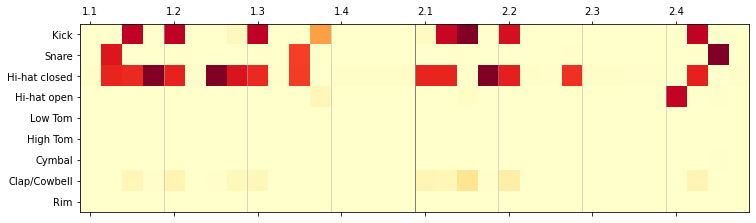

epoch: 739
m_d_loss: 0.2921707847539116     m_g_loss: 3.9744802966262354


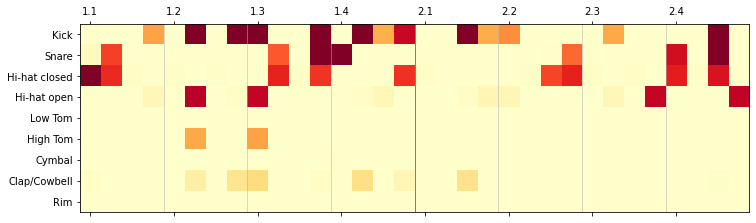

epoch: 740
m_d_loss: 0.29966733381152155     m_g_loss: 3.9969847852533515


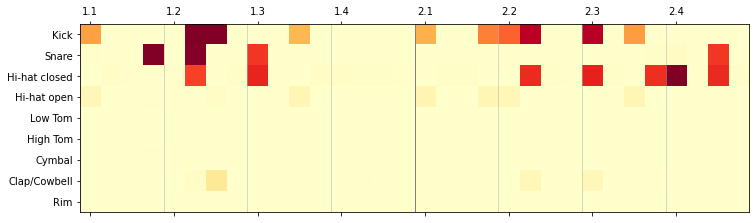

epoch: 741
m_d_loss: 0.28876026605858524     m_g_loss: 3.975905107729363


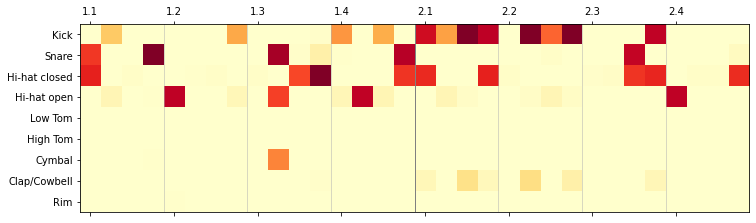

epoch: 742
m_d_loss: 0.2841082781553268     m_g_loss: 3.9886874863595674


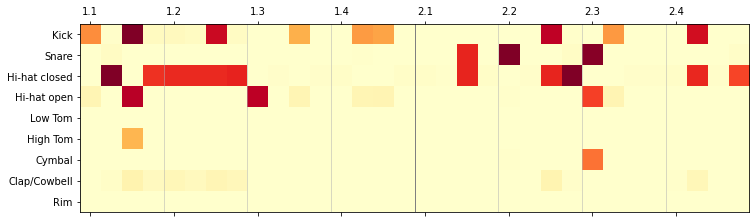

epoch: 743
m_d_loss: 0.29498163689585294     m_g_loss: 3.937735738176288


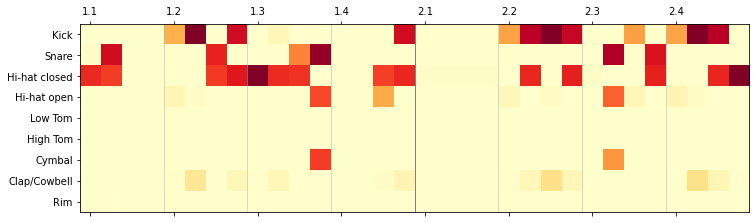

epoch: 744
m_d_loss: 0.2975056840106845     m_g_loss: 3.9823932936697295


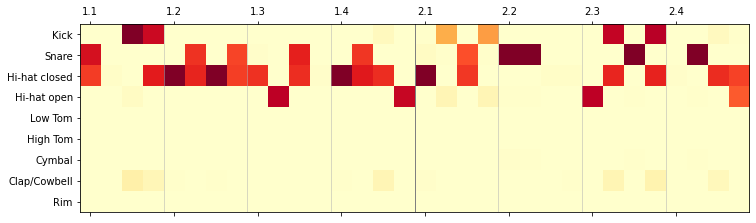

epoch: 745
m_d_loss: 0.29645682327887596     m_g_loss: 3.9515501441377583


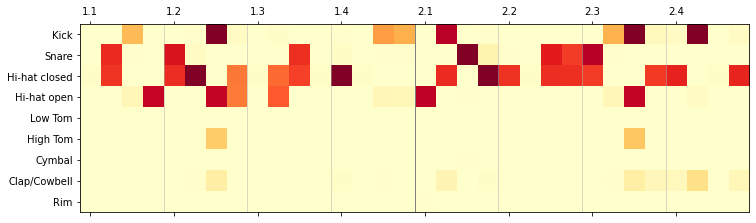

epoch: 746
m_d_loss: 0.29782969541847704     m_g_loss: 3.920934886643381


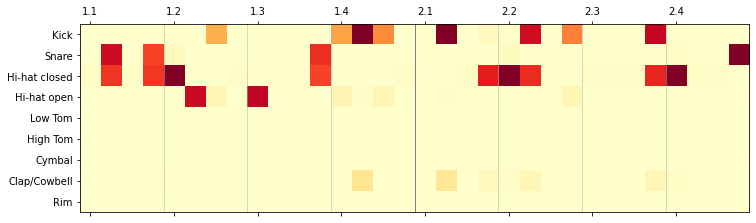

epoch: 747
m_d_loss: 0.29041924985016093     m_g_loss: 4.069610581253514


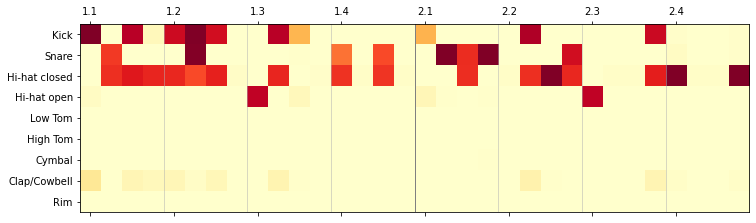

epoch: 748
m_d_loss: 0.2967687657102942     m_g_loss: 3.979504122878566


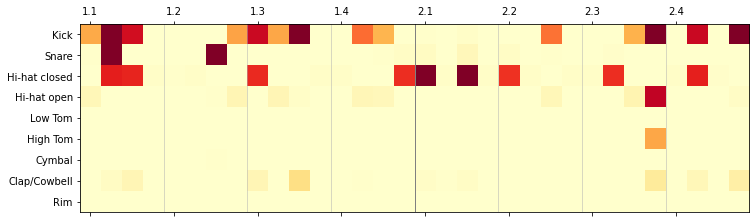

epoch: 749
m_d_loss: 0.2943993242347942     m_g_loss: 3.9383754513480445


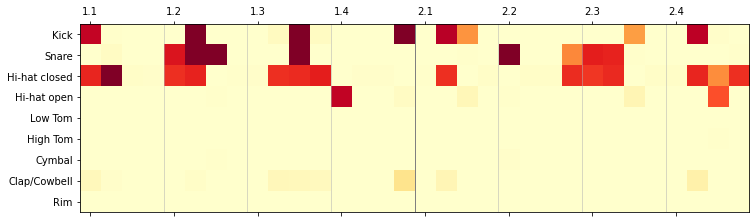

epoch: 750
m_d_loss: 0.29737887345254427     m_g_loss: 4.052992322228172


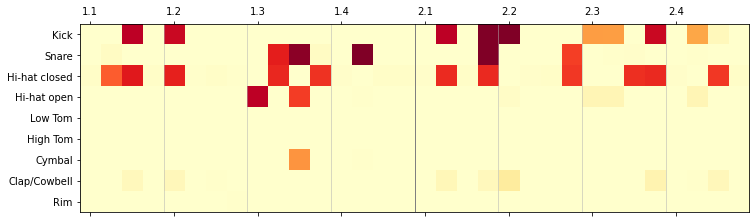

epoch: 751
m_d_loss: 0.2911101036212024     m_g_loss: 3.8928064216266978


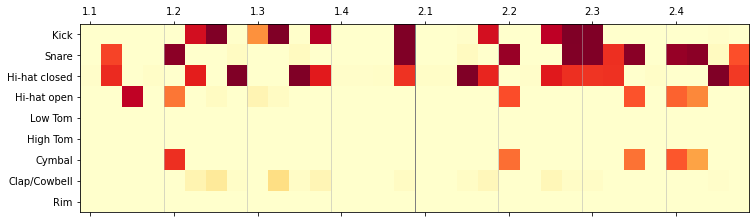

epoch: 752
m_d_loss: 0.29498525783419616     m_g_loss: 3.9968164183876733


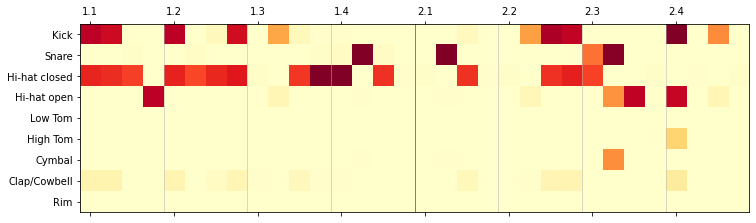

epoch: 753
m_d_loss: 0.295747965223649     m_g_loss: 4.052814418619329


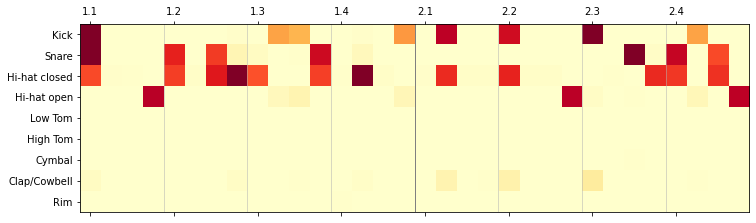

epoch: 754
m_d_loss: 0.28944816198199985     m_g_loss: 3.9869300524393716


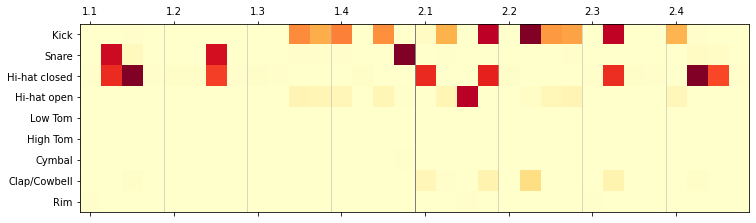

epoch: 755
m_d_loss: 0.2932378318379907     m_g_loss: 3.9118688251032974


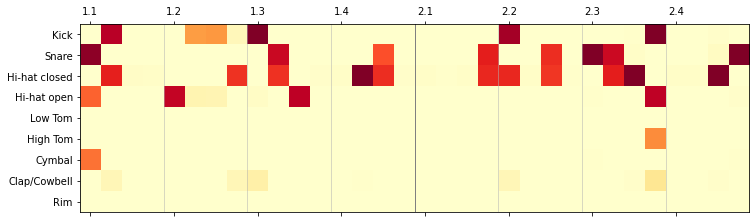

epoch: 756
m_d_loss: 0.29540387168526644     m_g_loss: 3.931318998336792


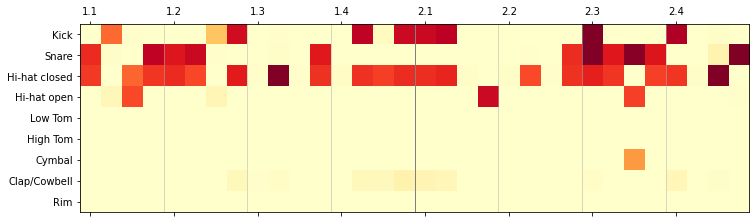

epoch: 757
m_d_loss: 0.2940825541229809     m_g_loss: 4.046694928949529


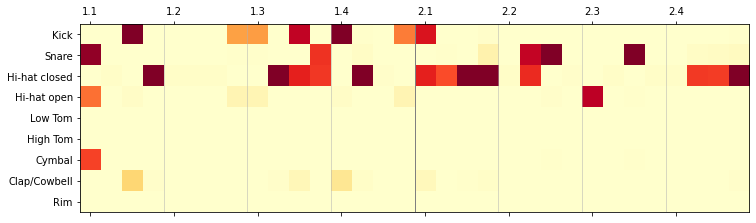

epoch: 758
m_d_loss: 0.2995145929977298     m_g_loss: 3.9765579555973862


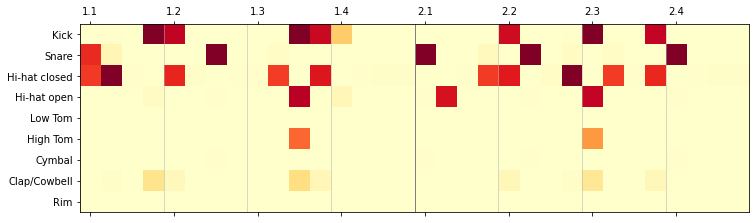

epoch: 759
m_d_loss: 0.29487609740565796     m_g_loss: 4.041226755489003


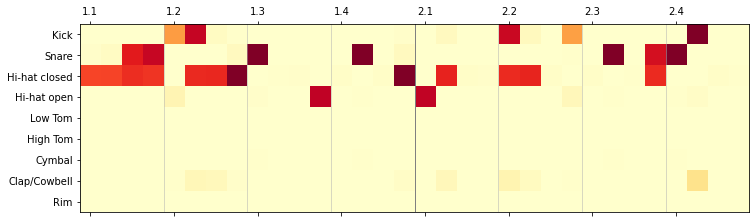

epoch: 760
m_d_loss: 0.2885548884049058     m_g_loss: 3.9682943098472827


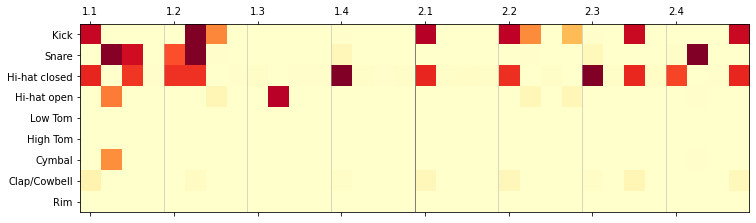

epoch: 761
m_d_loss: 0.29562802402412186     m_g_loss: 4.072285760532726


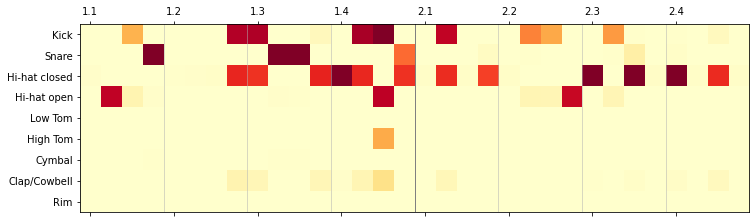

epoch: 762
m_d_loss: 0.29123466517776253     m_g_loss: 3.8851984269691235


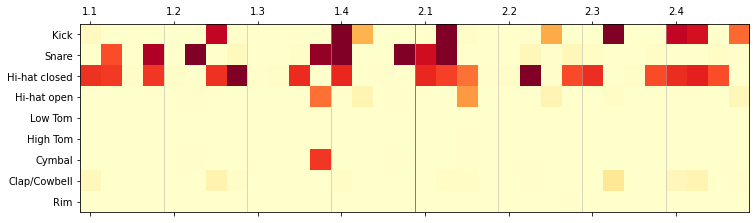

epoch: 763
m_d_loss: 0.30390199194936196     m_g_loss: 3.99366493658586


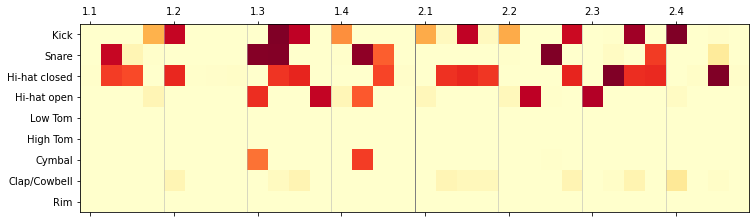

epoch: 764
m_d_loss: 0.2960241811349988     m_g_loss: 3.946395021496397


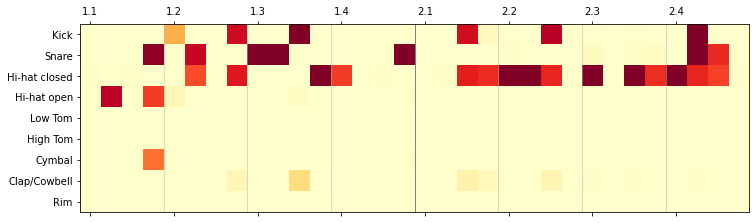

epoch: 765
m_d_loss: 0.29441707923131827     m_g_loss: 3.8930751410397617


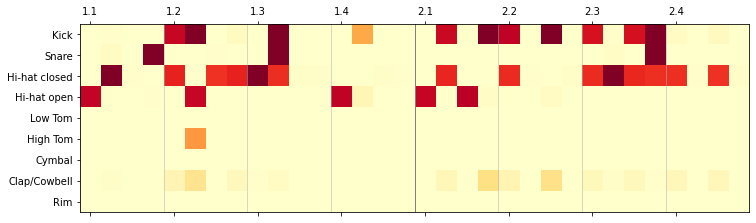

epoch: 766
m_d_loss: 0.3010498384013772     m_g_loss: 3.951793974096125


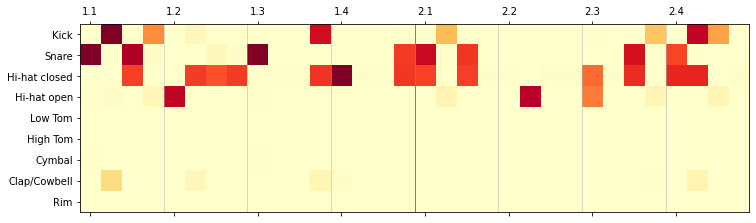

epoch: 767
m_d_loss: 0.3021628176464754     m_g_loss: 3.9713613119992344


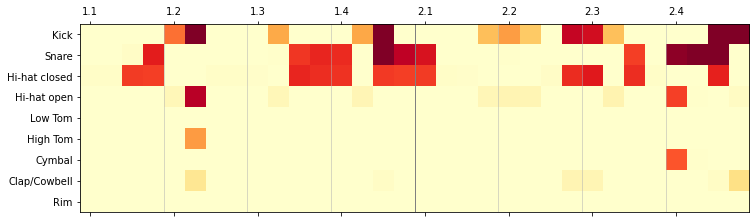

epoch: 768
m_d_loss: 0.2956522913649679     m_g_loss: 3.9586803118387857


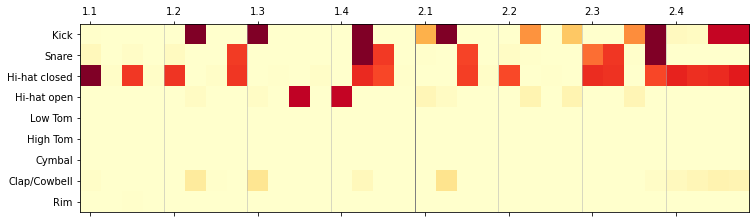

epoch: 769
m_d_loss: 0.283887372472707     m_g_loss: 3.967594276775013


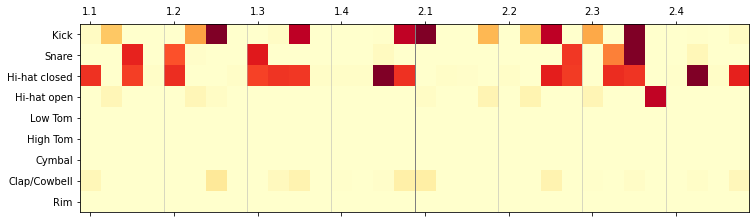

epoch: 770
m_d_loss: 0.2965129539370537     m_g_loss: 4.1062791491999775


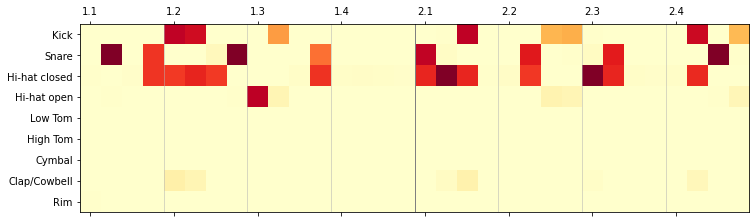

epoch: 771
m_d_loss: 0.29190823751337386     m_g_loss: 4.019741101698442


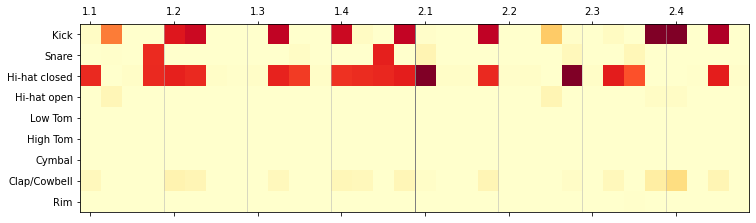

epoch: 772
m_d_loss: 0.3019372146576643     m_g_loss: 3.9897787715449478


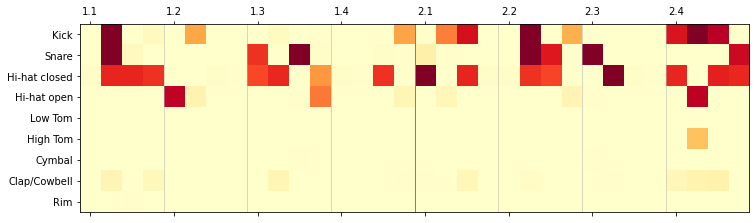

epoch: 773
m_d_loss: 0.30127218611100137     m_g_loss: 4.017116763375022


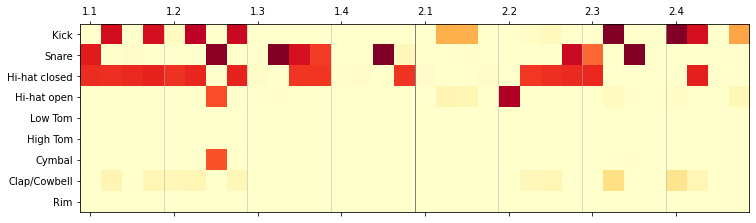

epoch: 774
m_d_loss: 0.30091318804770706     m_g_loss: 3.8381183436422637


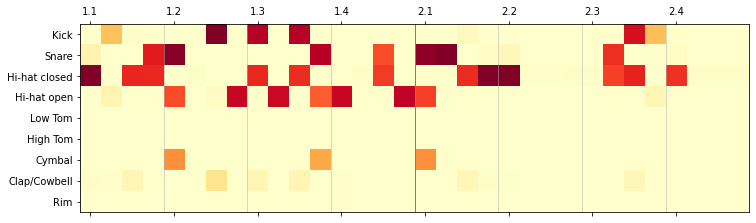

epoch: 775
m_d_loss: 0.2903965848333696     m_g_loss: 3.9755541266817036


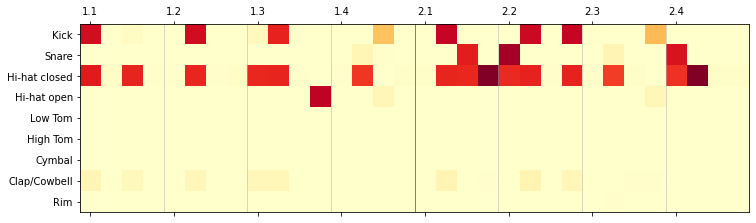

epoch: 776
m_d_loss: 0.3037725683301687     m_g_loss: 3.8959452455694024


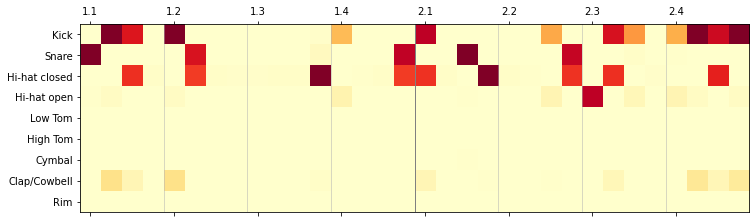

epoch: 777
m_d_loss: 0.297392523113419     m_g_loss: 3.96318954409975


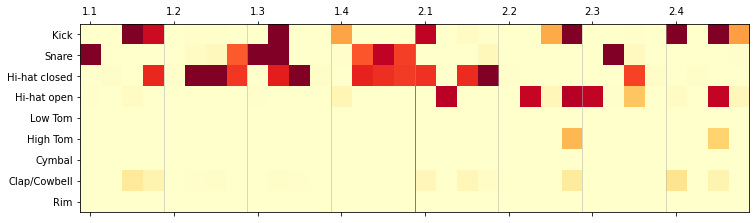

epoch: 778
m_d_loss: 0.29203116837888954     m_g_loss: 3.953111626885154


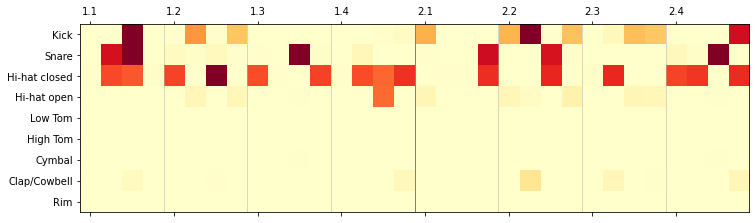

epoch: 779
m_d_loss: 0.2906436136540244     m_g_loss: 3.9886587677579937


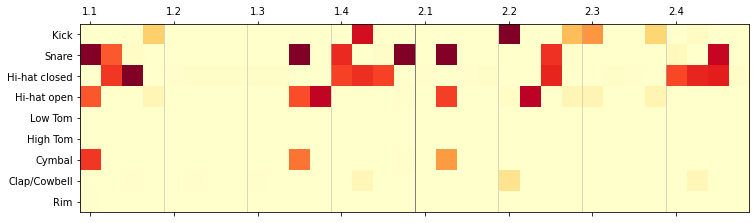

epoch: 780
m_d_loss: 0.2937266886234283     m_g_loss: 4.038880601073757


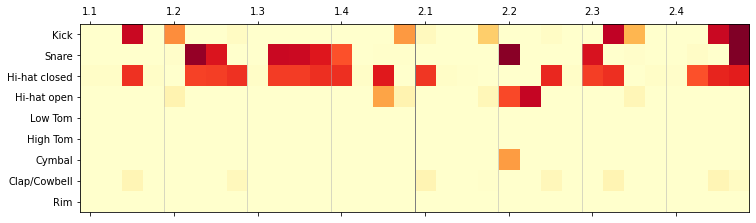

epoch: 781
m_d_loss: 0.29272071193246274     m_g_loss: 3.9280308665651265


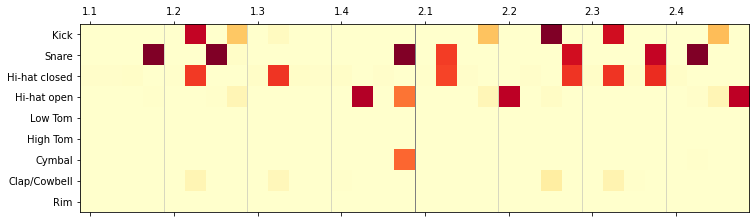

epoch: 782
m_d_loss: 0.2979003388434649     m_g_loss: 3.926576043620254


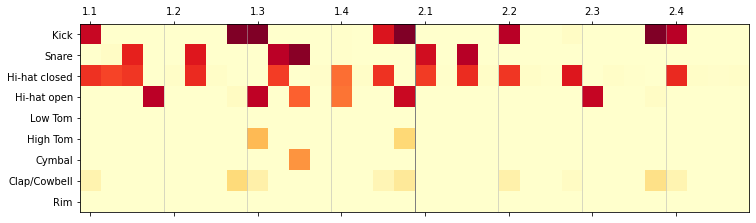

epoch: 783
m_d_loss: 0.30255180334343623     m_g_loss: 4.0255505099441065


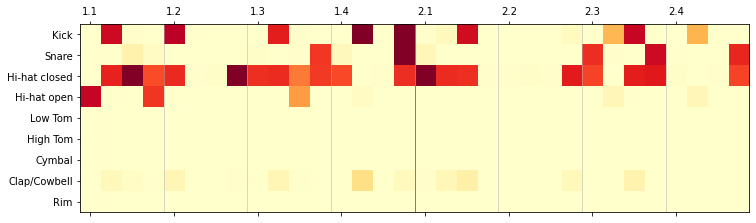

epoch: 784
m_d_loss: 0.29833044949918985     m_g_loss: 3.952299854972146


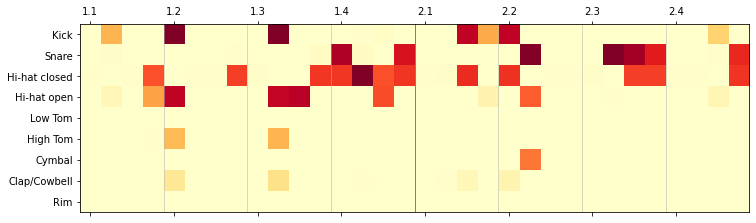

epoch: 785
m_d_loss: 0.2924889962462818     m_g_loss: 3.948049119024566


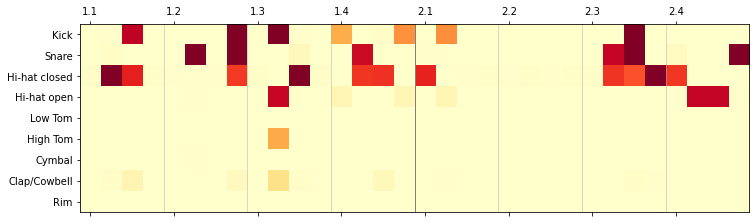

epoch: 786
m_d_loss: 0.29288569930940866     m_g_loss: 3.9990405024904194


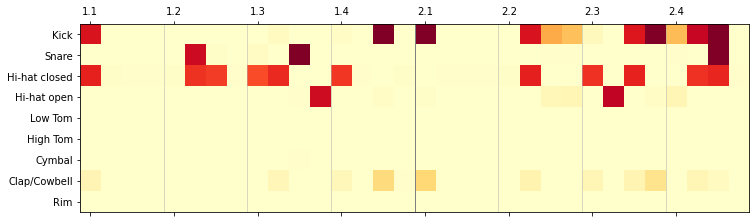

epoch: 787
m_d_loss: 0.3003399880493388     m_g_loss: 4.013366410226533


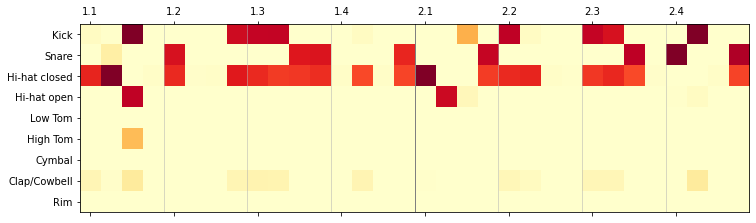

epoch: 788
m_d_loss: 0.2904428828507662     m_g_loss: 3.9245629888592344


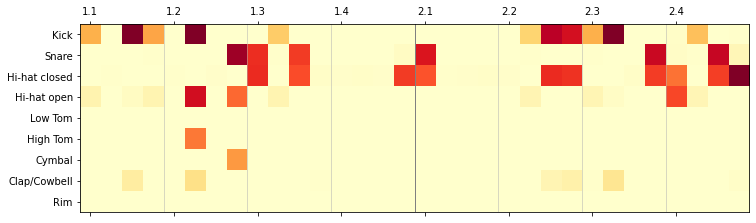

epoch: 789
m_d_loss: 0.2970452494481031     m_g_loss: 4.031861558105007


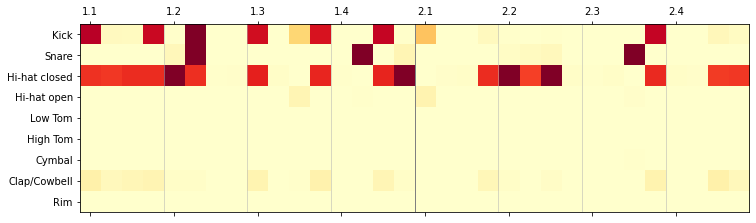

epoch: 790
m_d_loss: 0.2967625828459859     m_g_loss: 3.9642126126722856


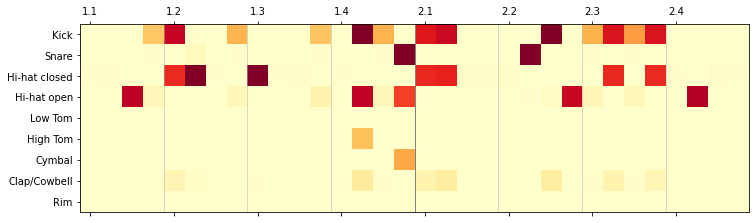

epoch: 791
m_d_loss: 0.2907951681052938     m_g_loss: 3.922639666181622


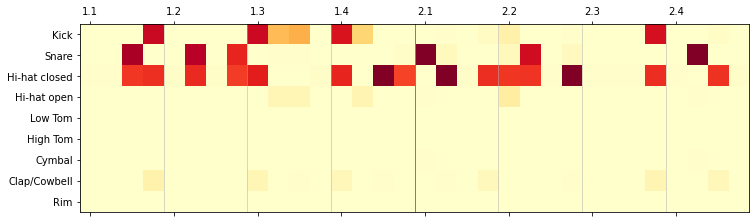

epoch: 792
m_d_loss: 0.28764496780931953     m_g_loss: 3.980238827792081


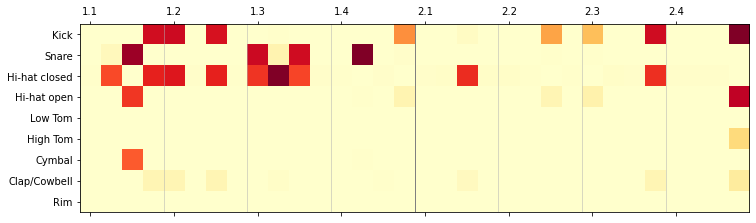

epoch: 793
m_d_loss: 0.30313163557473355     m_g_loss: 3.950640497785626


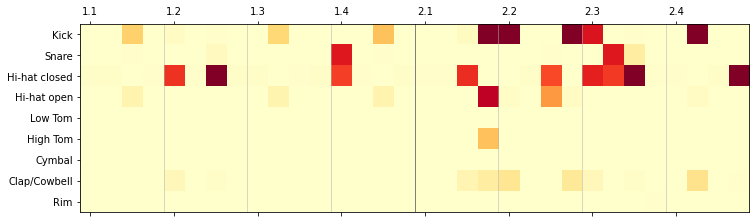

epoch: 794
m_d_loss: 0.2992829320952296     m_g_loss: 3.9361629197091768


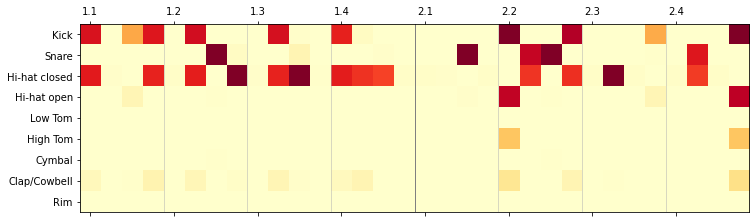

epoch: 795
m_d_loss: 0.2972855790573008     m_g_loss: 3.95169126626217


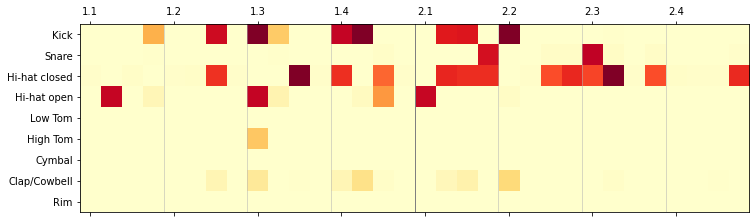

epoch: 796
m_d_loss: 0.2968919236212969     m_g_loss: 3.9966800501852324


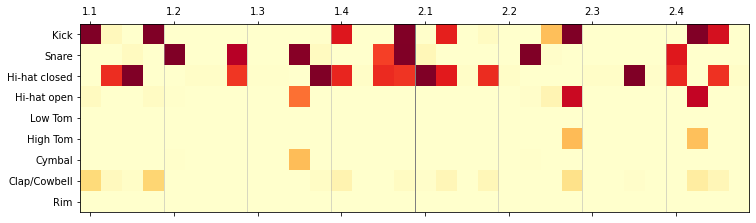

epoch: 797
m_d_loss: 0.2902111418106977     m_g_loss: 4.016791668805209


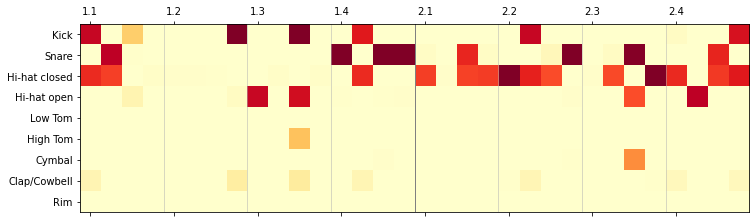

epoch: 798
m_d_loss: 0.29091278668493037     m_g_loss: 3.961420933405558


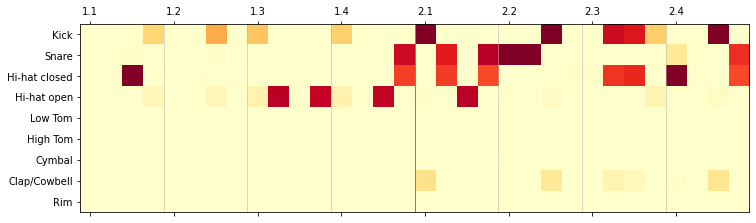

epoch: 799
m_d_loss: 0.2963584545780631     m_g_loss: 3.94726173805468


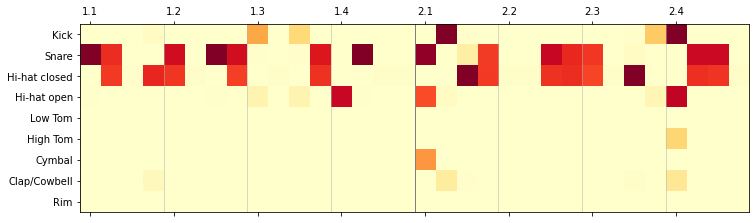

epoch: 800
m_d_loss: 0.3040774237364531     m_g_loss: 3.912450320792921


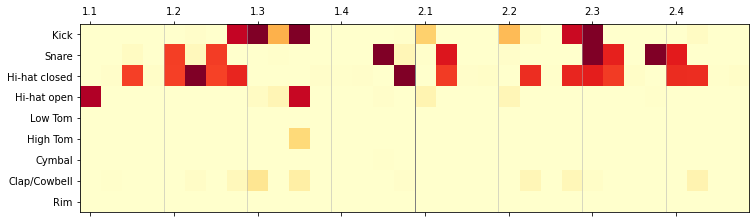

epoch: 801
m_d_loss: 0.29925019372912015     m_g_loss: 3.980122927463416


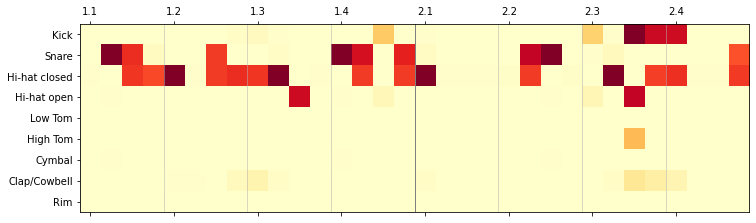

epoch: 802
m_d_loss: 0.2969142843037844     m_g_loss: 3.836471044656002


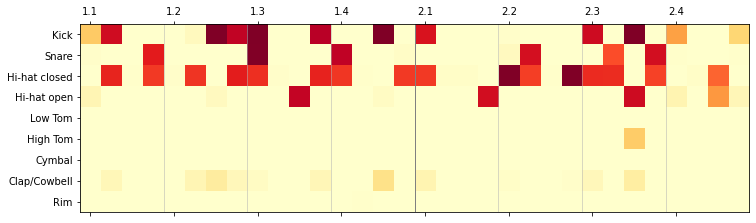

epoch: 803
m_d_loss: 0.2982994053293678     m_g_loss: 3.8504383419499253


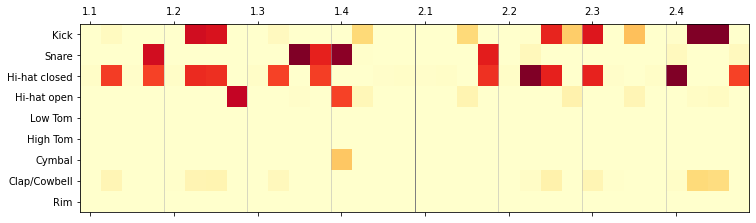

epoch: 804
m_d_loss: 0.2951872829347849     m_g_loss: 4.010830886436231


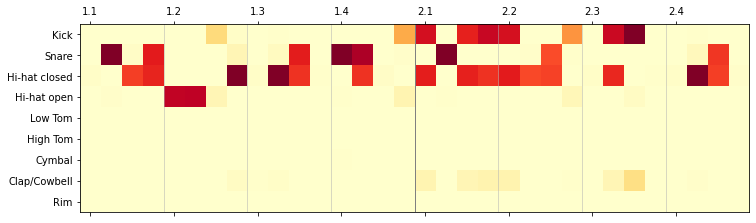

epoch: 805
m_d_loss: 0.2894602698438307     m_g_loss: 3.976927974007346


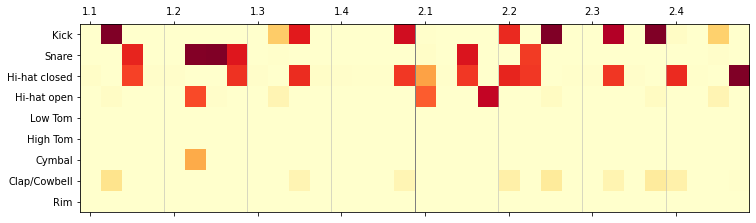

epoch: 806
m_d_loss: 0.2944839956238866     m_g_loss: 4.043299176476219


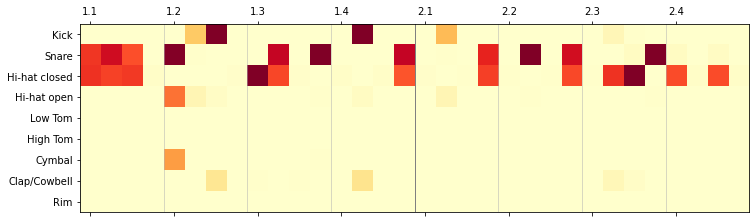

epoch: 807
m_d_loss: 0.29662926968406234     m_g_loss: 3.930005644306992


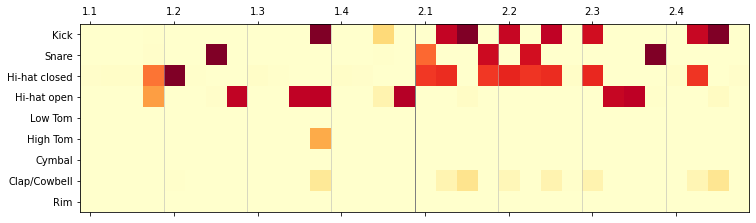

epoch: 808
m_d_loss: 0.301395514421165     m_g_loss: 3.940063714981079


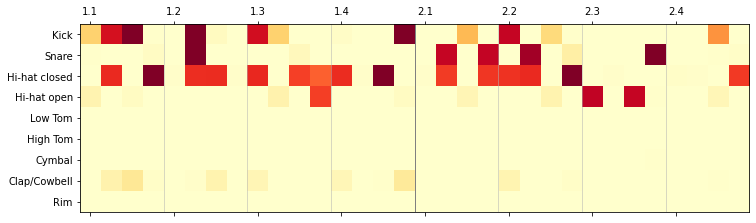

epoch: 809
m_d_loss: 0.28879375282455894     m_g_loss: 3.9509627963557388


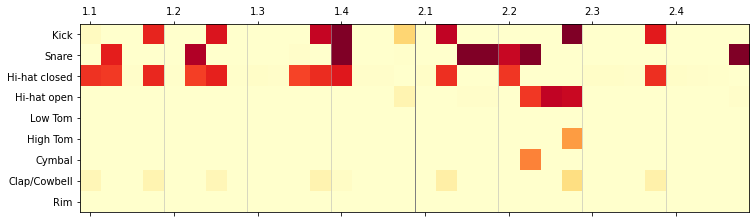

epoch: 810
m_d_loss: 0.29060014486312863     m_g_loss: 3.8966238354191636


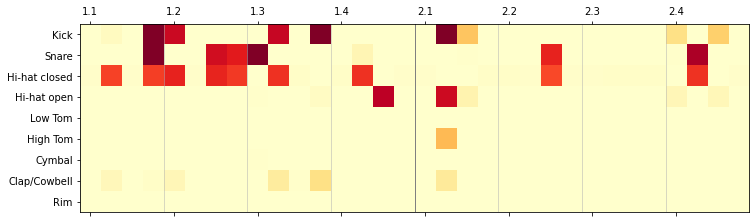

epoch: 811
m_d_loss: 0.28645937232410207     m_g_loss: 3.949386878447099


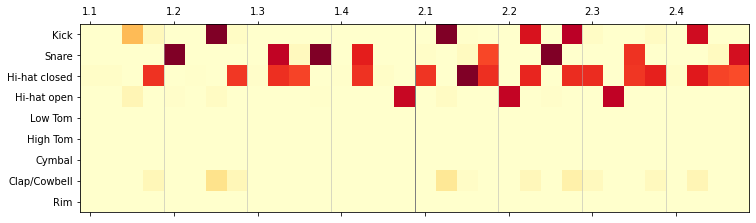

epoch: 812
m_d_loss: 0.30037862379103897     m_g_loss: 3.983333190282186


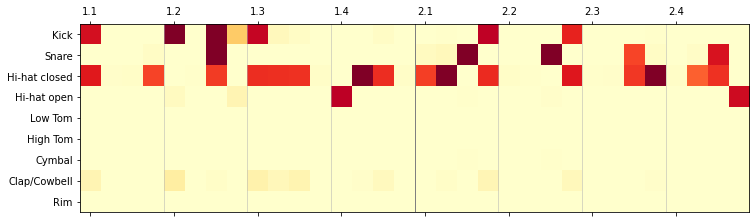

epoch: 813
m_d_loss: 0.2944049044566996     m_g_loss: 3.891822894414266


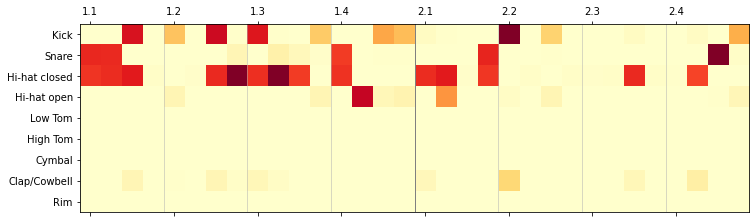

epoch: 814
m_d_loss: 0.29610152430832387     m_g_loss: 3.956502741033381


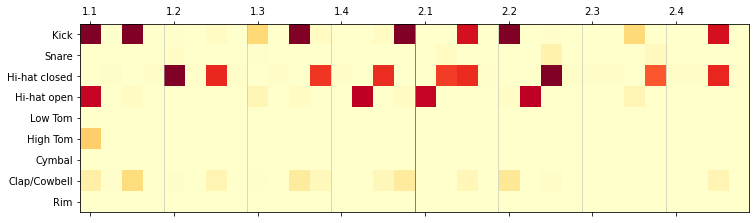

epoch: 815
m_d_loss: 0.2988953791997012     m_g_loss: 3.9094977234349106


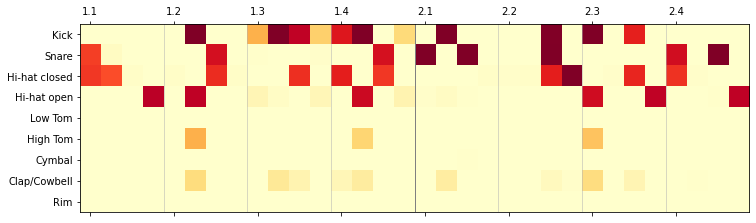

epoch: 816
m_d_loss: 0.29733371883630755     m_g_loss: 3.912607648155906


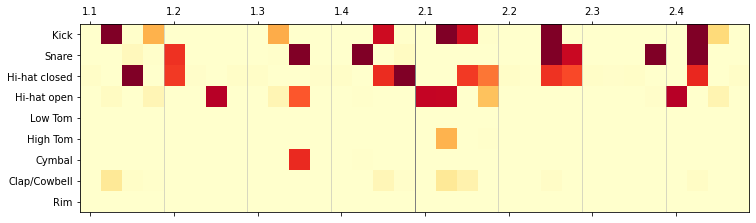

epoch: 817
m_d_loss: 0.2973410665988922     m_g_loss: 3.9545773737358325


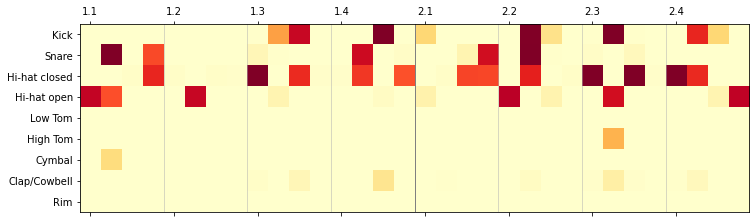

epoch: 818
m_d_loss: 0.2970241215080023     m_g_loss: 3.9930292982043643


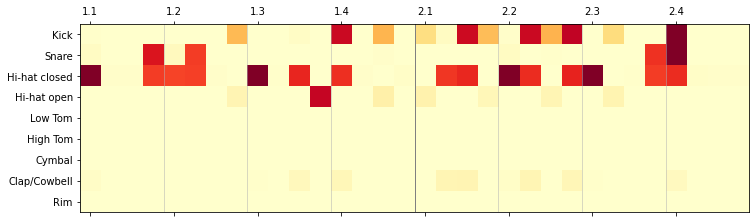

epoch: 819
m_d_loss: 0.2930554109461167     m_g_loss: 4.002036535378658


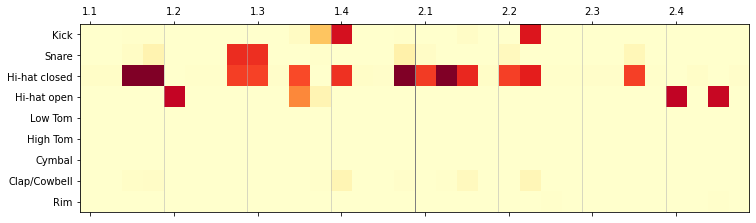

epoch: 820
m_d_loss: 0.2988439885899425     m_g_loss: 4.042888345140399


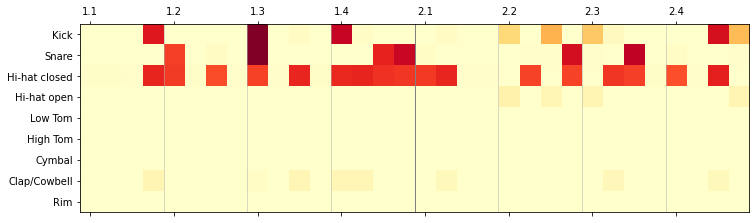

epoch: 821
m_d_loss: 0.2958833901321187     m_g_loss: 3.9365957794767437


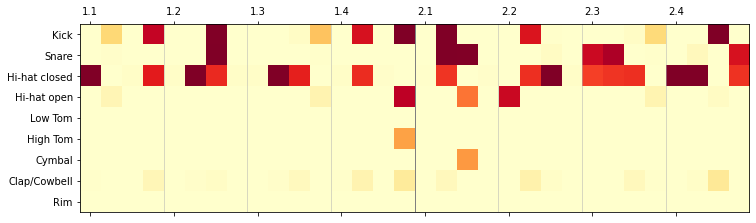

epoch: 822
m_d_loss: 0.2897020105272532     m_g_loss: 3.9690853176694927


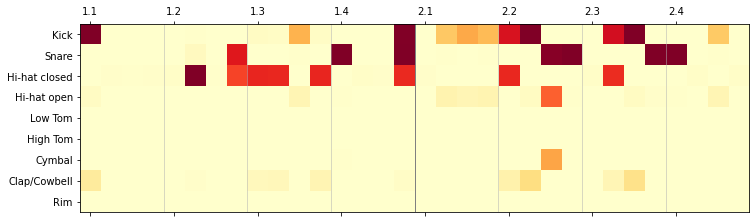

epoch: 823
m_d_loss: 0.28564536063110124     m_g_loss: 4.014029791860869


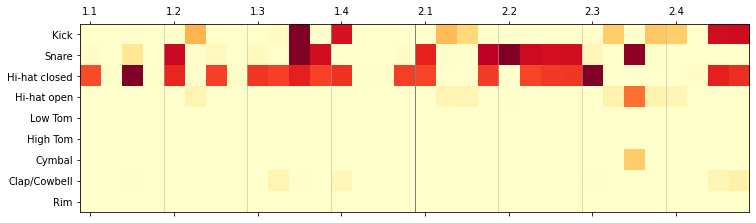

epoch: 824
m_d_loss: 0.301095150783658     m_g_loss: 3.945982383959221


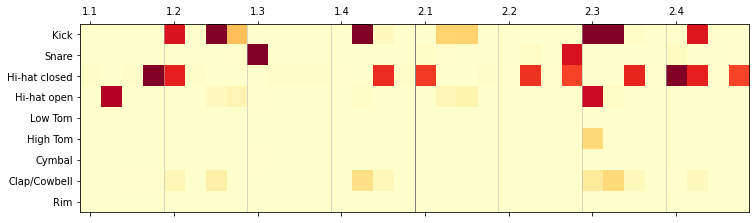

epoch: 825
m_d_loss: 0.2958997114616282     m_g_loss: 3.93179913000627


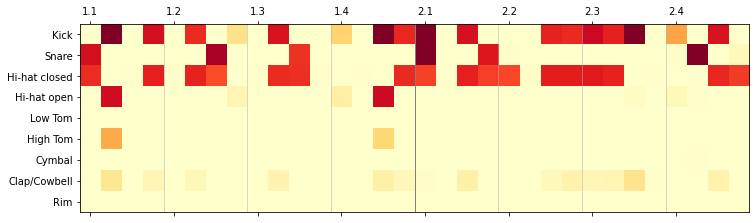

epoch: 826
m_d_loss: 0.29725529197603456     m_g_loss: 4.040468056996663


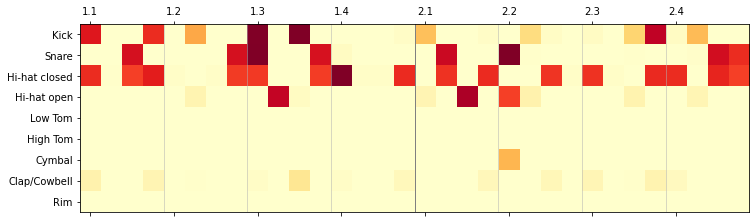

epoch: 827
m_d_loss: 0.29554512080024264     m_g_loss: 3.950928471305154


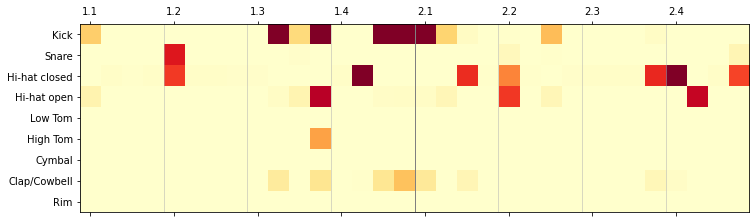

epoch: 828
m_d_loss: 0.2991493940353393     m_g_loss: 3.956580638885498


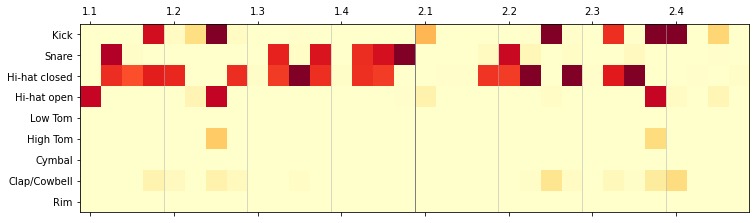

epoch: 829
m_d_loss: 0.30067218366791215     m_g_loss: 3.9727992433490176


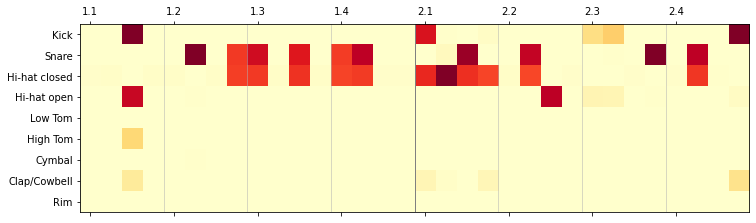

epoch: 830
m_d_loss: 0.29127455726265905     m_g_loss: 3.9853377920208555


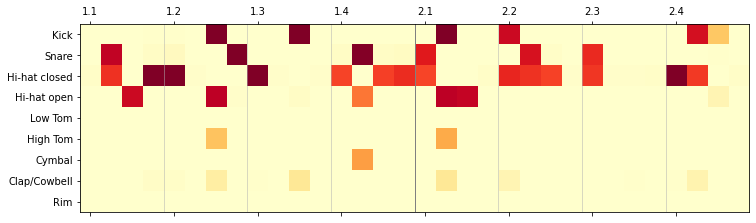

epoch: 831
m_d_loss: 0.29278762761284327     m_g_loss: 4.0198944987672744


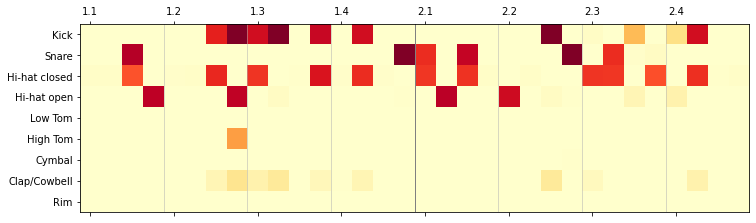

epoch: 832
m_d_loss: 0.28992007020860905     m_g_loss: 3.993639107906457


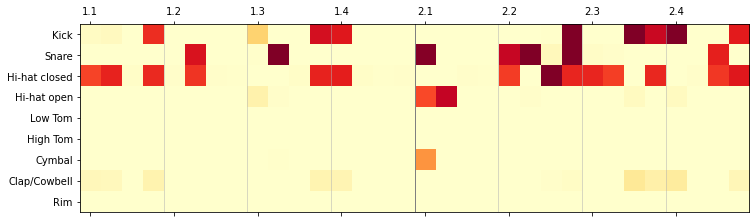

epoch: 833
m_d_loss: 0.29597197543172277     m_g_loss: 3.9983061588171758


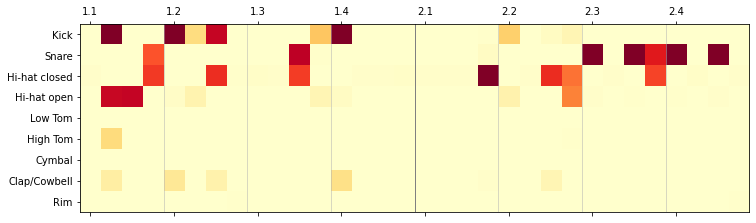

epoch: 834
m_d_loss: 0.28873189464211463     m_g_loss: 3.9579966501756148


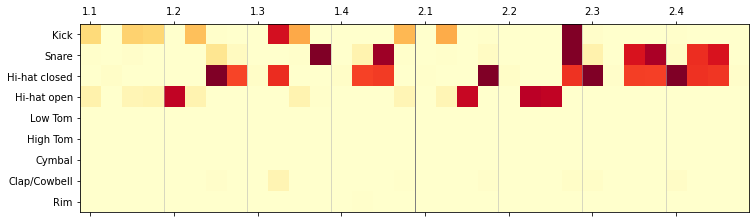

epoch: 835
m_d_loss: 0.28462537509553576     m_g_loss: 4.051891702594179


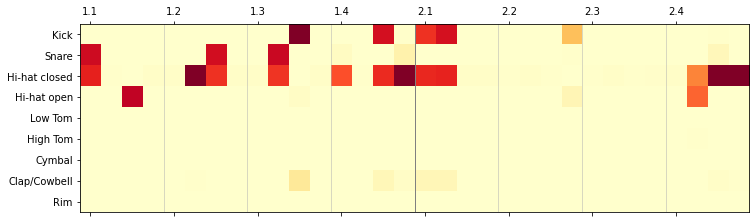

epoch: 836
m_d_loss: 0.2926268490031362     m_g_loss: 3.912530371637055


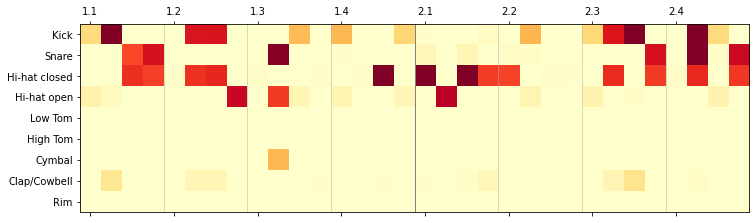

epoch: 837
m_d_loss: 0.2994514619602877     m_g_loss: 4.125243215849905


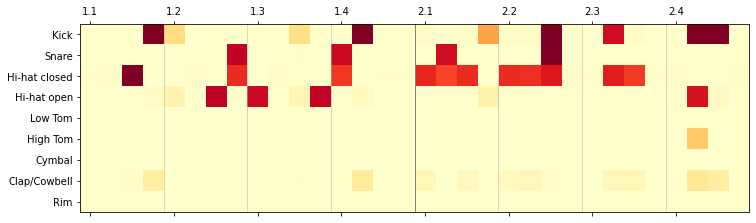

epoch: 838
m_d_loss: 0.2900972578674555     m_g_loss: 3.9640910480961655


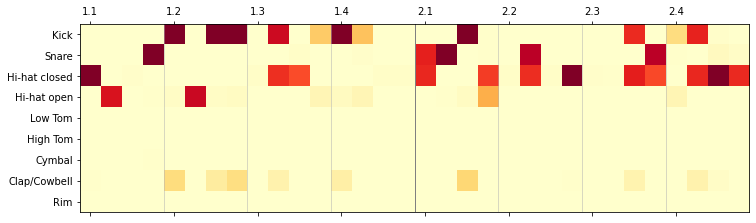

epoch: 839
m_d_loss: 0.3006847667343476     m_g_loss: 4.0017688274383545


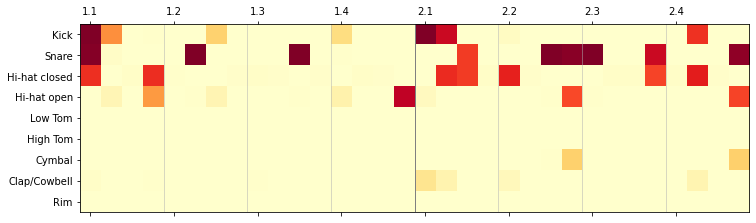

epoch: 840
m_d_loss: 0.29534346945583817     m_g_loss: 4.04014237721761


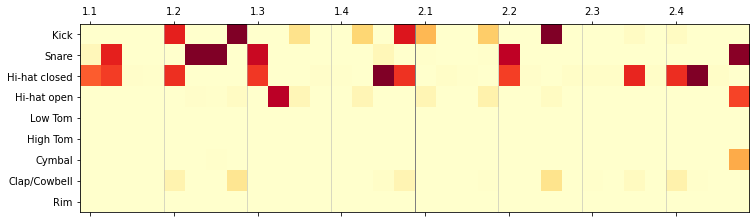

epoch: 841
m_d_loss: 0.29464689808733324     m_g_loss: 3.9486106381271826


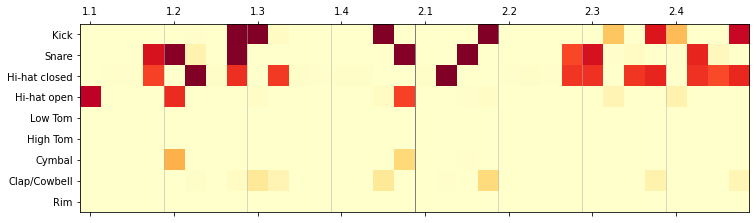

epoch: 842
m_d_loss: 0.29658035784959796     m_g_loss: 3.9509126345316568


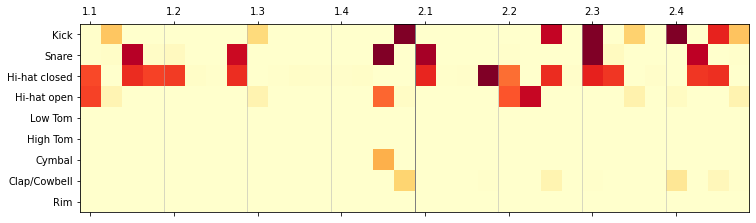

epoch: 843
m_d_loss: 0.2985615637372522     m_g_loss: 4.008255828510631


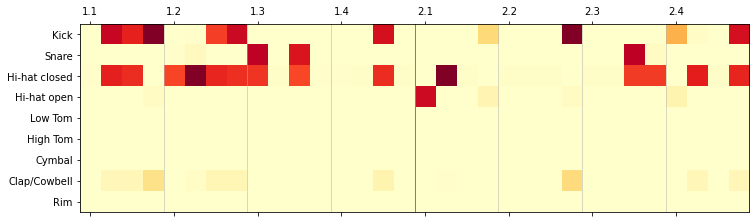

epoch: 844
m_d_loss: 0.291907380335033     m_g_loss: 4.020749959078702


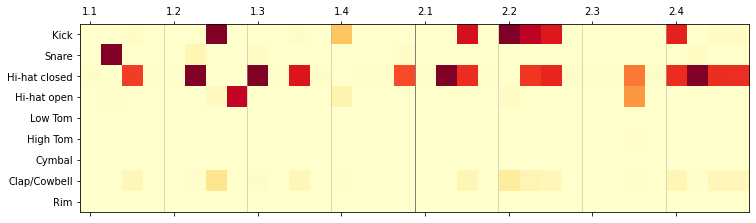

epoch: 845
m_d_loss: 0.29325538119849043     m_g_loss: 3.946045752727624


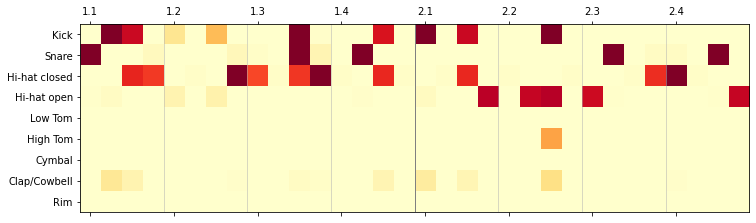

epoch: 846
m_d_loss: 0.2876175848767162     m_g_loss: 4.037068511500503


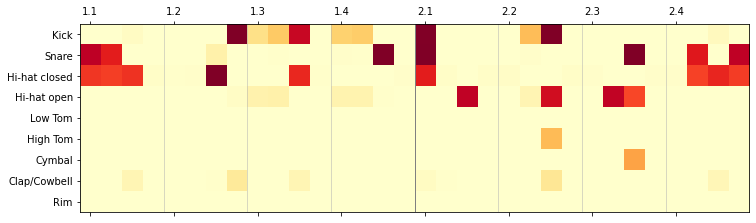

epoch: 847
m_d_loss: 0.2997723113088047     m_g_loss: 3.926862853946108


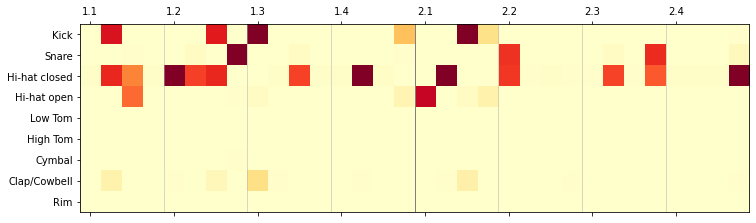

epoch: 848
m_d_loss: 0.29331052154302595     m_g_loss: 3.9867121523076836


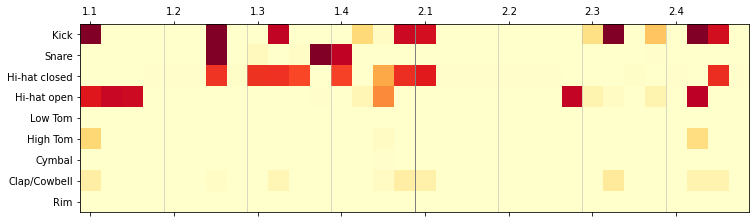

epoch: 849
m_d_loss: 0.29833190353477707     m_g_loss: 3.9461436199419424


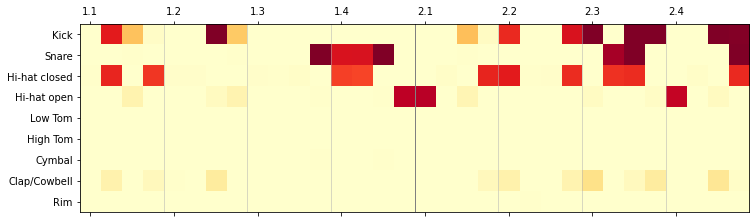

epoch: 850
m_d_loss: 0.29467721600085495     m_g_loss: 4.042134949655244


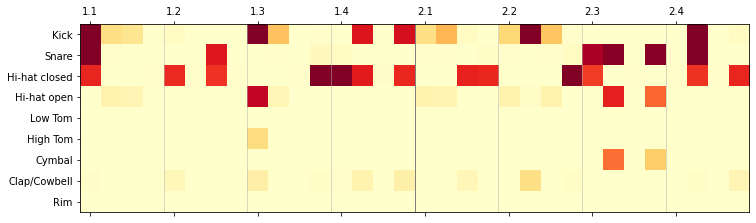

epoch: 851
m_d_loss: 0.2951644250575234     m_g_loss: 3.93836057547367


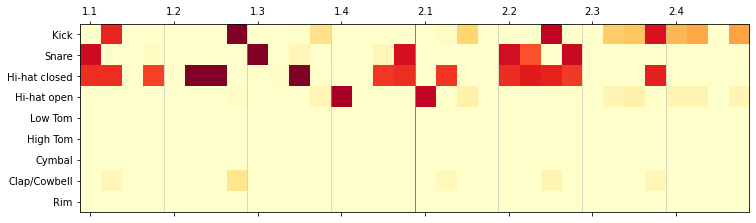

epoch: 852
m_d_loss: 0.29688982982188467     m_g_loss: 3.9405714743065112


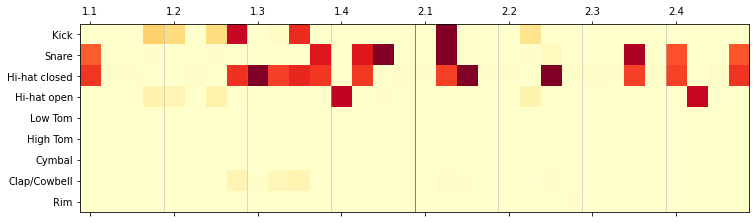

epoch: 853
m_d_loss: 0.30282889236422145     m_g_loss: 4.012653401403716


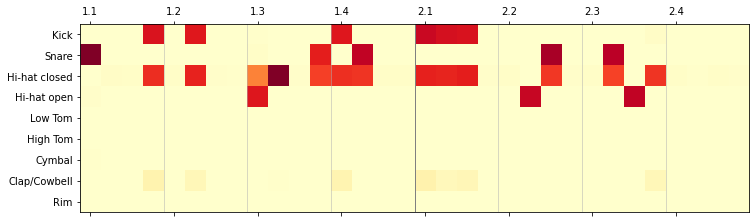

epoch: 854
m_d_loss: 0.29780028909444806     m_g_loss: 3.994011387680516


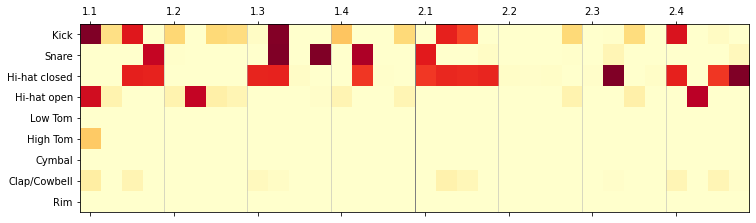

epoch: 855
m_d_loss: 0.2892952273873721     m_g_loss: 3.950927734375


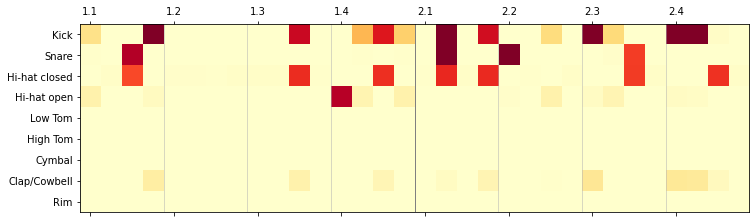

epoch: 856
m_d_loss: 0.29909114837646483     m_g_loss: 3.9745589314085064


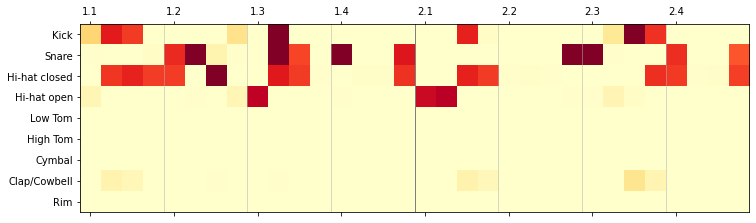

epoch: 857
m_d_loss: 0.2937424747382893     m_g_loss: 3.940184448704575


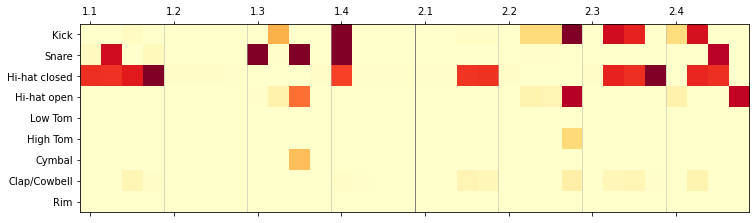

epoch: 858
m_d_loss: 0.2944095440208912     m_g_loss: 4.028380827470259


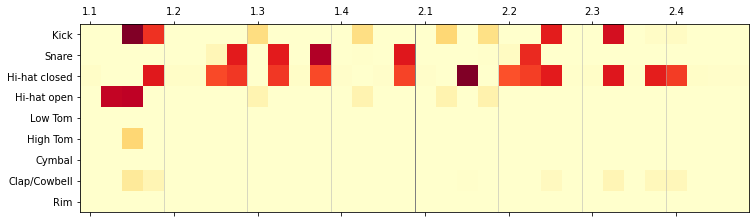

epoch: 859
m_d_loss: 0.2956593818524305     m_g_loss: 4.040001782503995


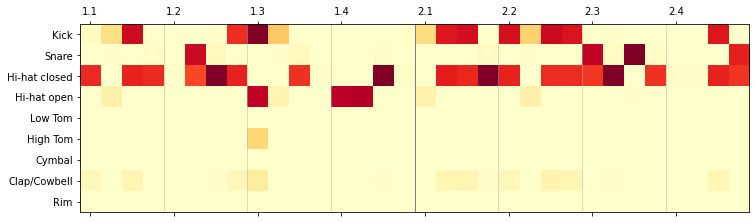

epoch: 860
m_d_loss: 0.28788848482072354     m_g_loss: 4.025779875842008


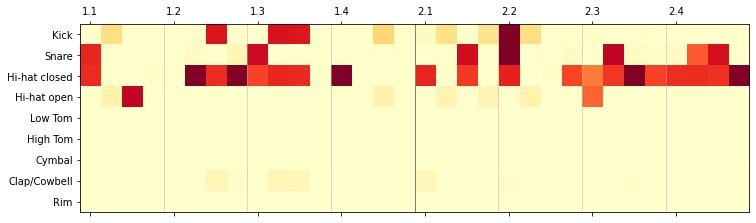

epoch: 861
m_d_loss: 0.29389127107227553     m_g_loss: 3.951981768463597


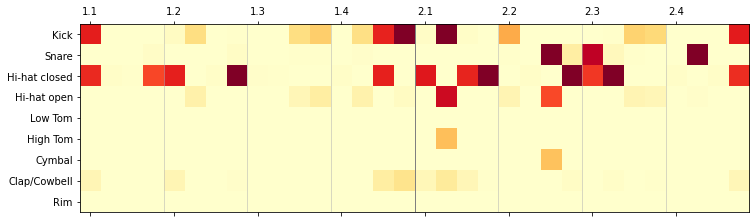

epoch: 862
m_d_loss: 0.2928857829421758     m_g_loss: 4.014033144170588


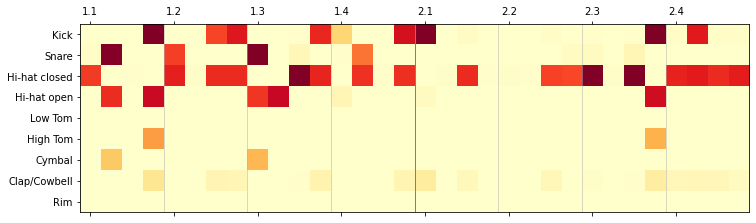

epoch: 863
m_d_loss: 0.2911186123595518     m_g_loss: 3.9323999881744385


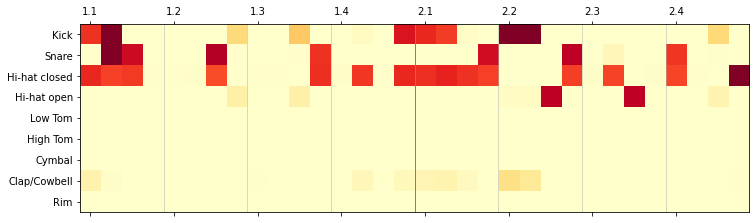

epoch: 864
m_d_loss: 0.29390473514795307     m_g_loss: 3.943822636748805


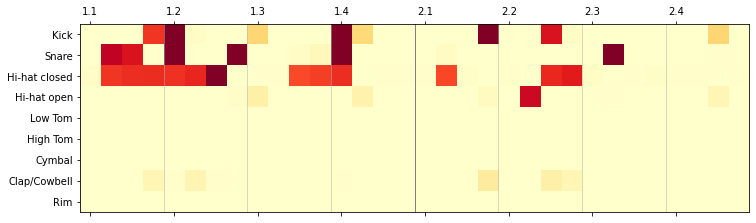

epoch: 865
m_d_loss: 0.2927607294391183     m_g_loss: 3.989206480257439


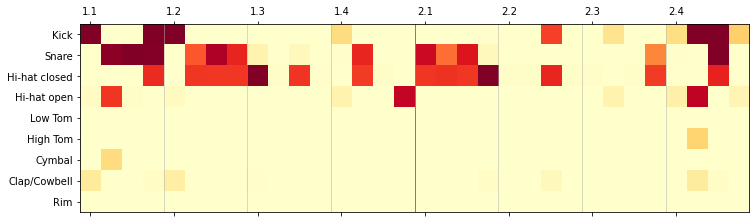

epoch: 866
m_d_loss: 0.29895455520600084     m_g_loss: 4.031552878293124


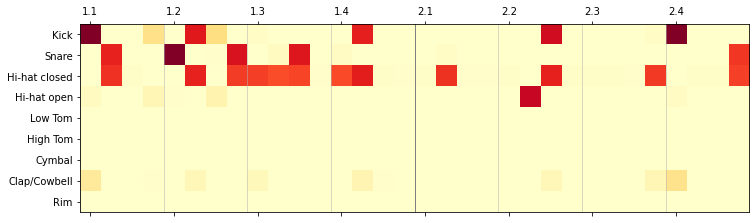

epoch: 867
m_d_loss: 0.29596439494806176     m_g_loss: 4.0634487469991045


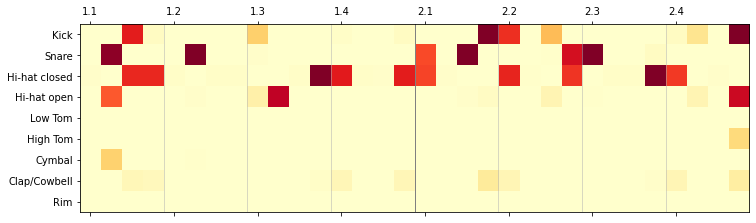

epoch: 868
m_d_loss: 0.29218175541609526     m_g_loss: 4.020195433587739


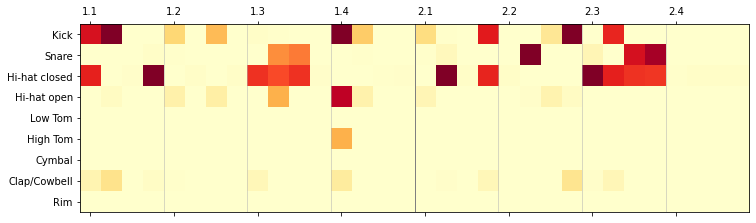

epoch: 869
m_d_loss: 0.29913967462146984     m_g_loss: 4.025132208159476


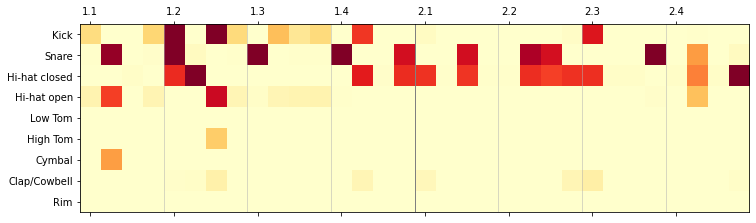

epoch: 870
m_d_loss: 0.2970368281006813     m_g_loss: 3.987566760092071


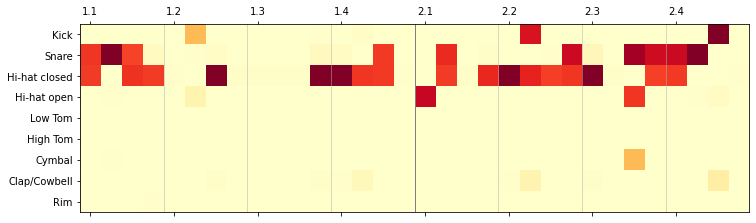

epoch: 871
m_d_loss: 0.2911251616828581     m_g_loss: 3.9612914143186626


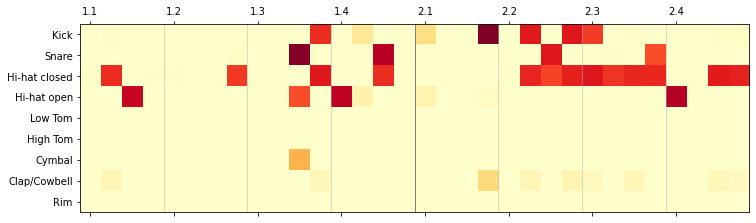

epoch: 872
m_d_loss: 0.2990463111549616     m_g_loss: 3.938095844153202


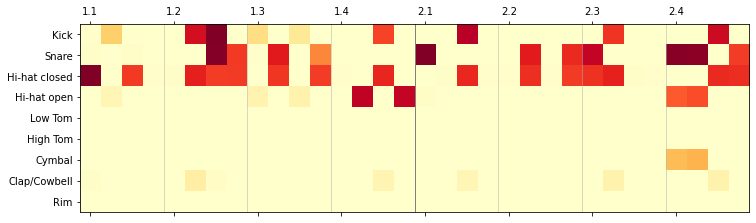

epoch: 873
m_d_loss: 0.29023240769610686     m_g_loss: 4.02859682747812


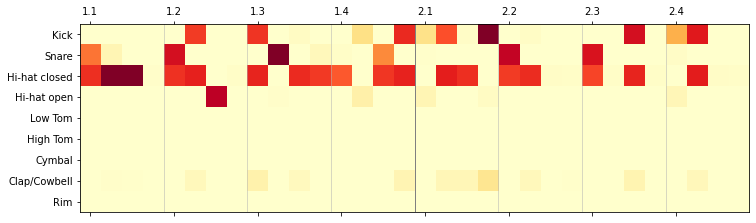

epoch: 874
m_d_loss: 0.2907543633133173     m_g_loss: 4.00211053906065


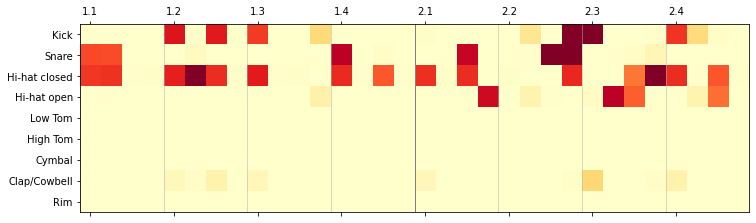

epoch: 875
m_d_loss: 0.29095317440874435     m_g_loss: 3.9944165908929072


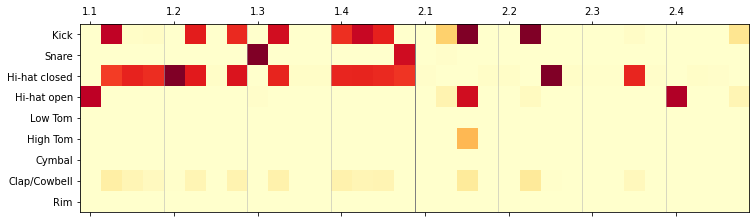

epoch: 876
m_d_loss: 0.30001338776201014     m_g_loss: 4.05956574642297


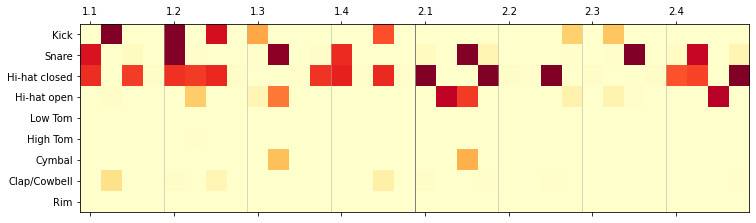

epoch: 877
m_d_loss: 0.2904326870160944     m_g_loss: 4.069447748588793


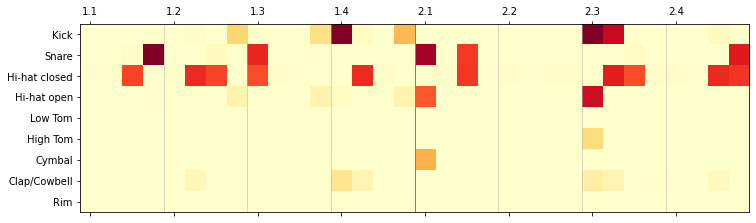

epoch: 878
m_d_loss: 0.3027992181479931     m_g_loss: 3.9810259342193604


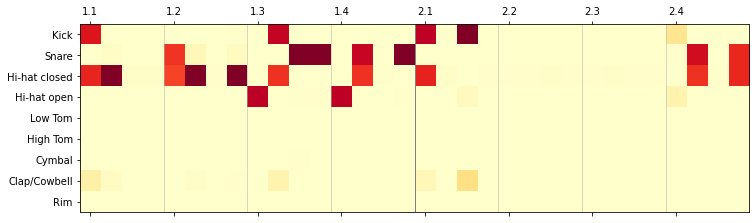

epoch: 879
m_d_loss: 0.29681587604915405     m_g_loss: 3.9330616503050835


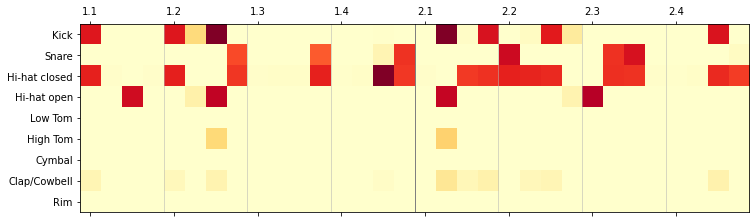

epoch: 880
m_d_loss: 0.2904021197929978     m_g_loss: 4.001416907165989


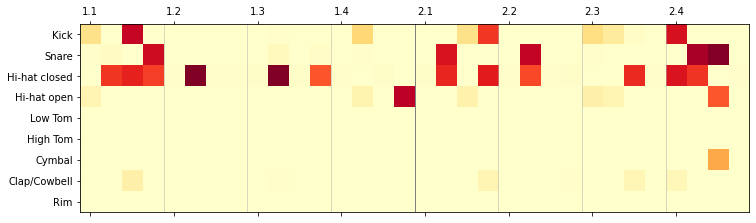

epoch: 881
m_d_loss: 0.2929579301792033     m_g_loss: 4.054720437887943


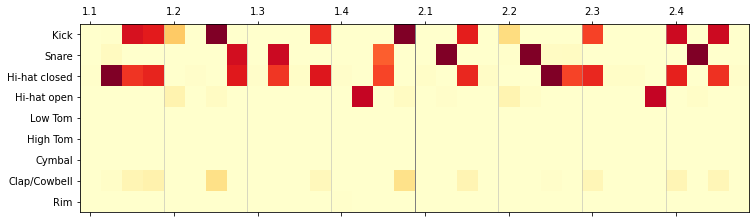

epoch: 882
m_d_loss: 0.2943953968584538     m_g_loss: 4.10994468313275


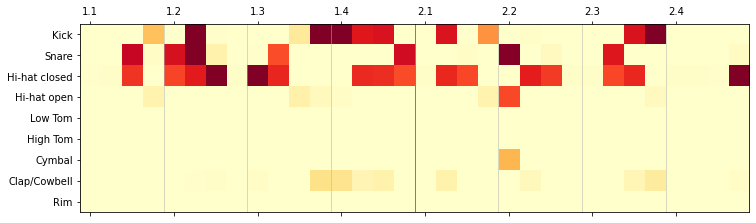

epoch: 883
m_d_loss: 0.2974944633596084     m_g_loss: 3.9781844543688223


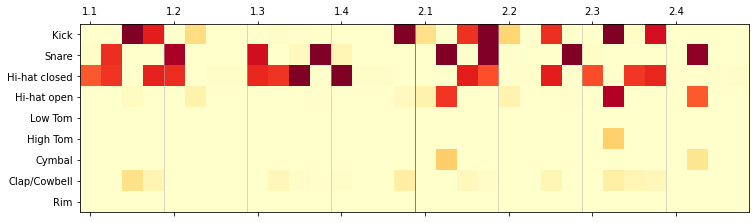

epoch: 884
m_d_loss: 0.29159887041896576     m_g_loss: 4.101104555707989


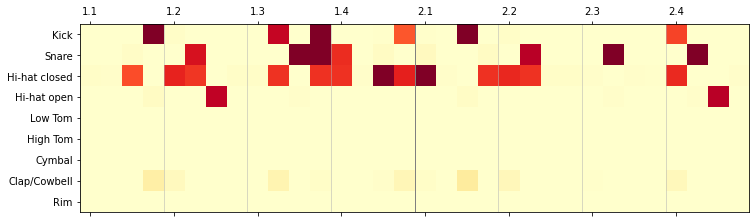

epoch: 885
m_d_loss: 0.2948855321196949     m_g_loss: 3.9928171417929907


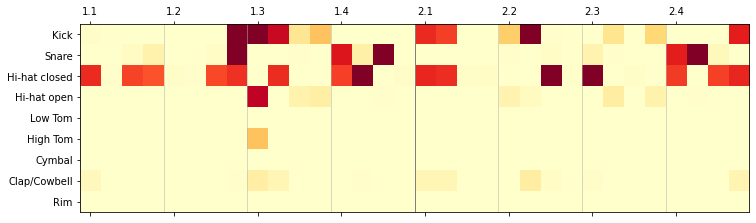

epoch: 886
m_d_loss: 0.2950008856132626     m_g_loss: 4.0195863608158


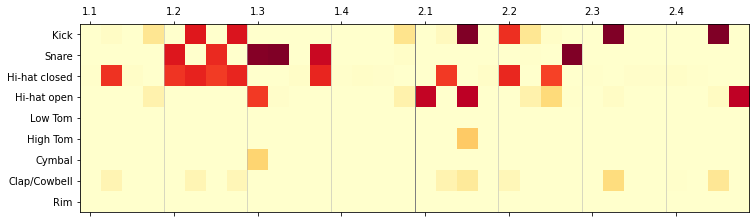

epoch: 887
m_d_loss: 0.29480638398843656     m_g_loss: 4.0985479643850615


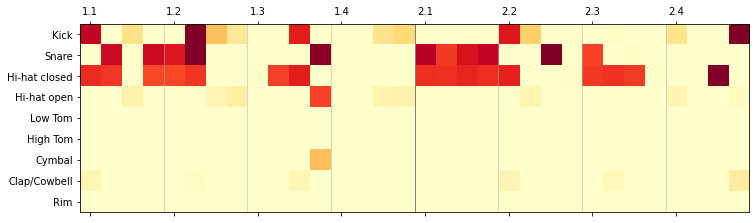

epoch: 888
m_d_loss: 0.2942165864631534     m_g_loss: 4.037131439555775


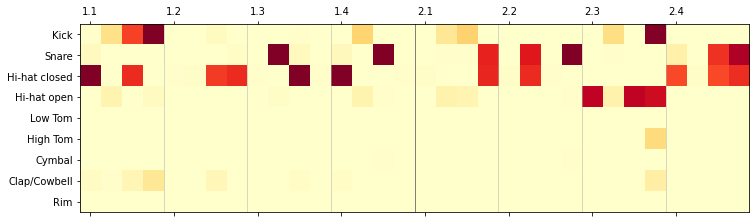

epoch: 889
m_d_loss: 0.29054842889308924     m_g_loss: 3.99949329549616


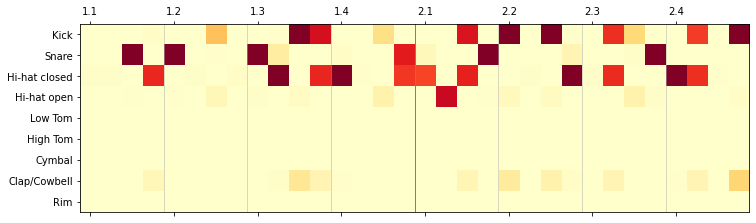

epoch: 890
m_d_loss: 0.28799208253622055     m_g_loss: 4.003199902447787


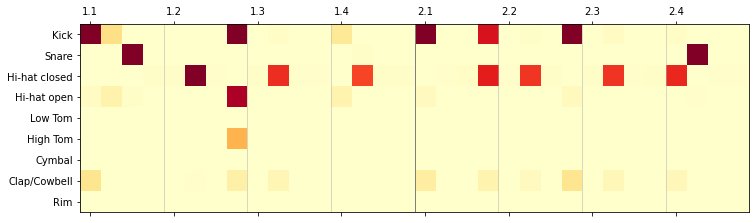

epoch: 891
m_d_loss: 0.292179280870101     m_g_loss: 4.04518909887834


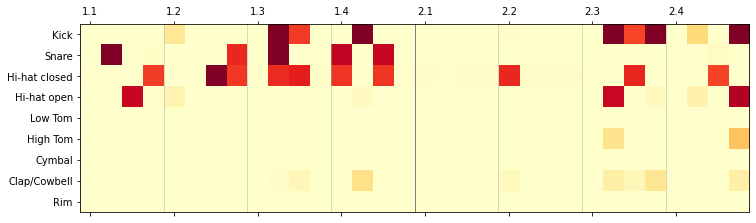

epoch: 892
m_d_loss: 0.2979861522093416     m_g_loss: 4.036782914941961


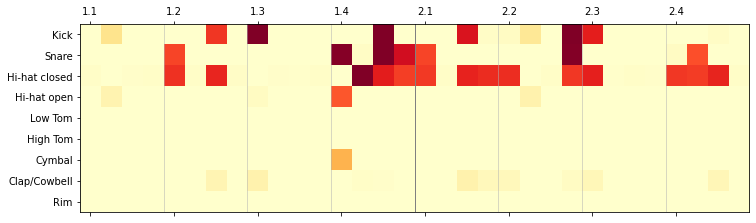

epoch: 893
m_d_loss: 0.28870100063436166     m_g_loss: 4.006807999177412


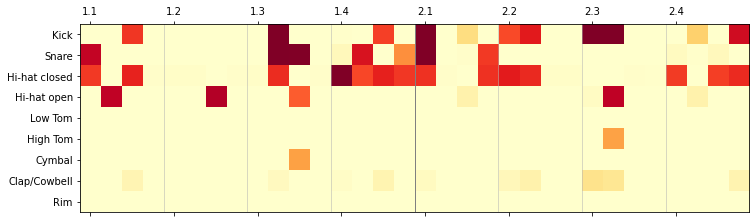

epoch: 894
m_d_loss: 0.30039951391518116     m_g_loss: 4.041071349924261


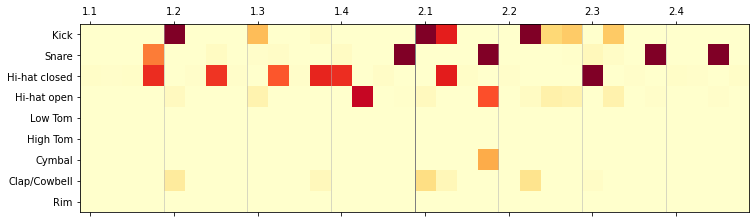

epoch: 895
m_d_loss: 0.2973396900822135     m_g_loss: 4.034515778223674


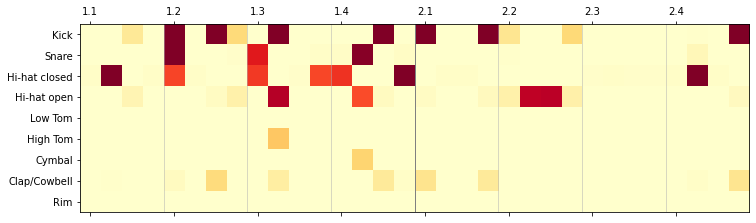

epoch: 896
m_d_loss: 0.2880758486688137     m_g_loss: 4.034482529669097


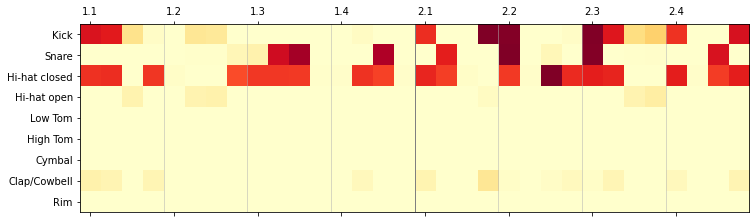

epoch: 897
m_d_loss: 0.29970664925435003     m_g_loss: 4.10305398160761


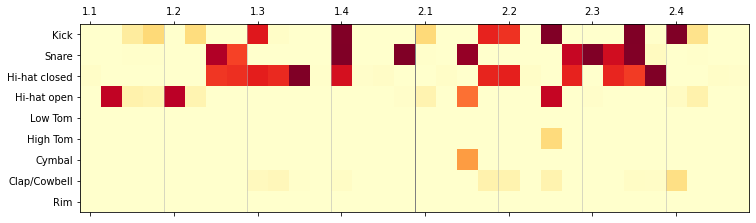

epoch: 898
m_d_loss: 0.2933021178469062     m_g_loss: 4.05811569184968


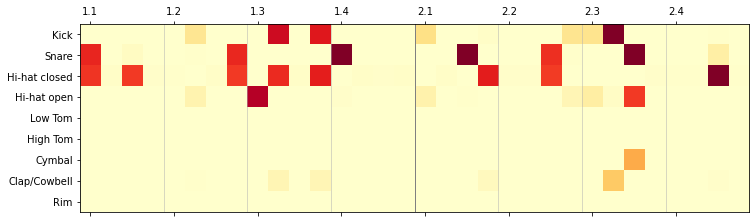

epoch: 899
m_d_loss: 0.29845530583577995     m_g_loss: 4.021093404654301


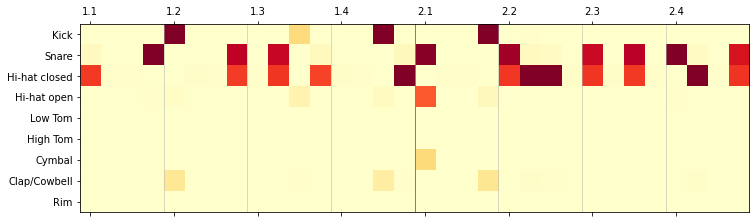

epoch: 900
m_d_loss: 0.29295126982033254     m_g_loss: 3.9057432160233008


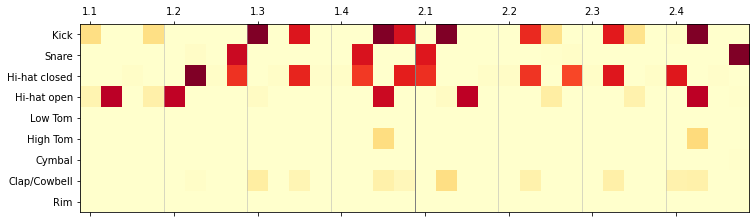

epoch: 901
m_d_loss: 0.2952134987887214     m_g_loss: 4.01213906028054


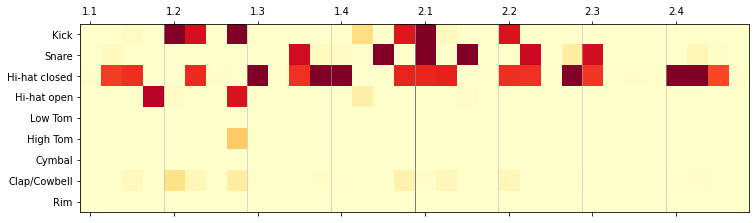

epoch: 902
m_d_loss: 0.28619750794023274     m_g_loss: 4.019093708558516


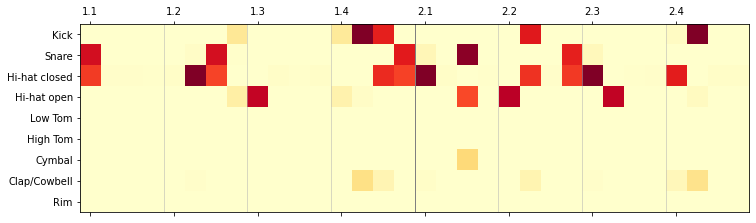

epoch: 903
m_d_loss: 0.2932913114042843     m_g_loss: 4.084450324376424


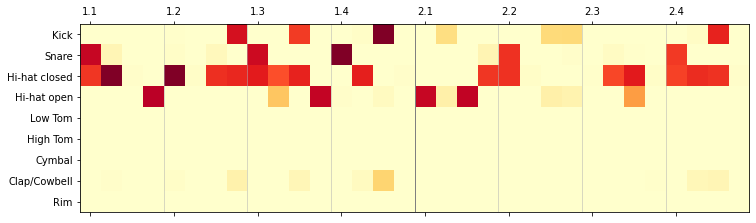

epoch: 904
m_d_loss: 0.29171582944691177     m_g_loss: 4.033121080109567


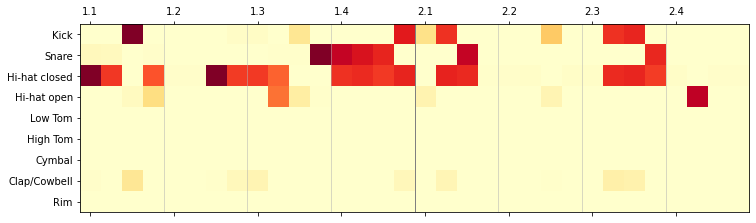

epoch: 905
m_d_loss: 0.2930382886353661     m_g_loss: 3.9620921756281997


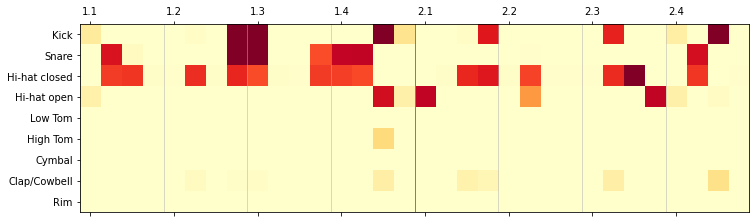

epoch: 906
m_d_loss: 0.29176604095846415     m_g_loss: 3.968266819462632


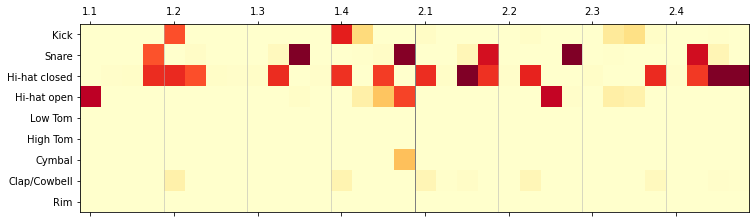

epoch: 907
m_d_loss: 0.2994953062604455     m_g_loss: 3.98194948832194


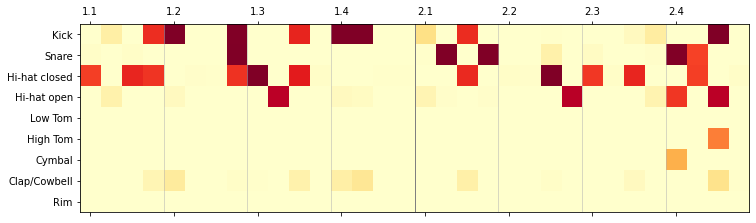

epoch: 908
m_d_loss: 0.29308765288442373     m_g_loss: 3.9285329688679087


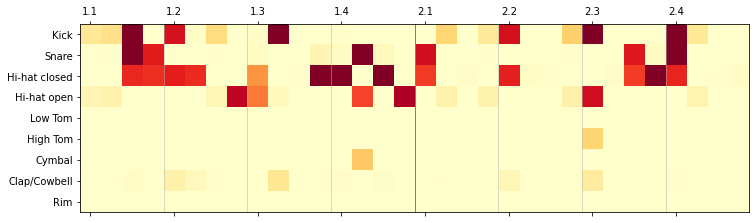

epoch: 909
m_d_loss: 0.28726042053278755     m_g_loss: 3.9627583677118476


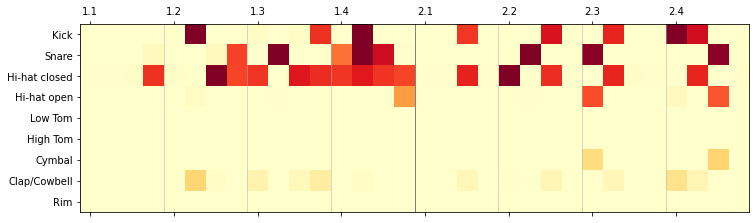

epoch: 910
m_d_loss: 0.29908430520445106     m_g_loss: 4.0620253375082305


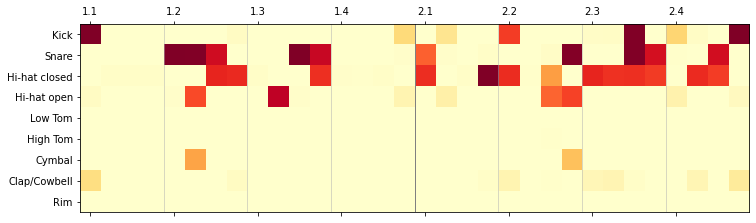

epoch: 911
m_d_loss: 0.2942511195645613     m_g_loss: 4.016869147618611


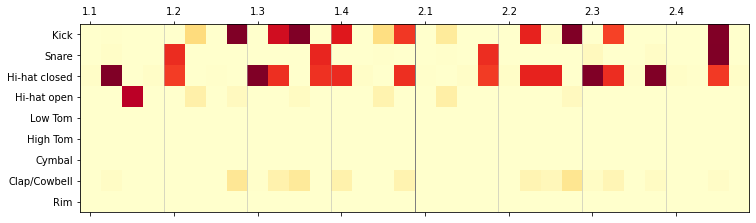

epoch: 912
m_d_loss: 0.29105939455330376     m_g_loss: 4.067634156256011


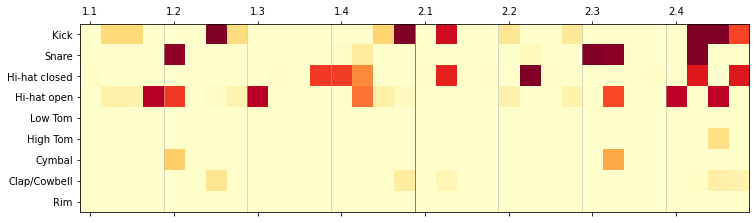

epoch: 913
m_d_loss: 0.2975968488875558     m_g_loss: 3.969438025445649


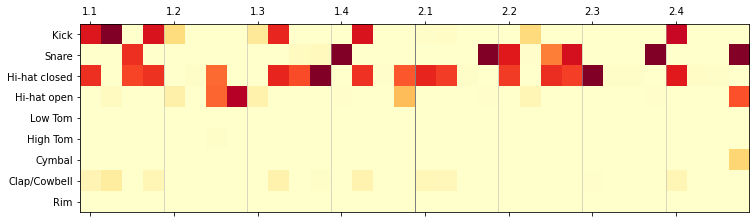

epoch: 914
m_d_loss: 0.30191682707518336     m_g_loss: 4.010464675498731


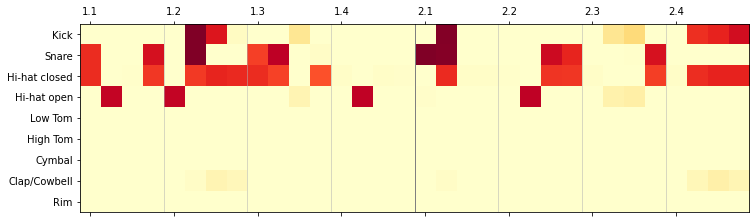

epoch: 915
m_d_loss: 0.29593657167518844     m_g_loss: 3.9825029878905327


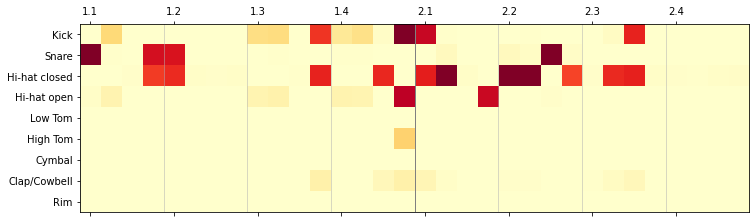

epoch: 916
m_d_loss: 0.2918134035542607     m_g_loss: 4.052577437776508


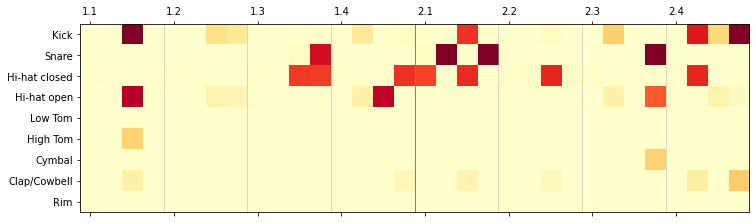

epoch: 917
m_d_loss: 0.2980766320929808     m_g_loss: 3.969822883605957


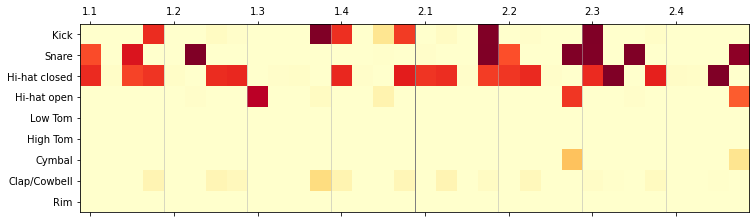

epoch: 918
m_d_loss: 0.2891634501516819     m_g_loss: 4.017220417658488


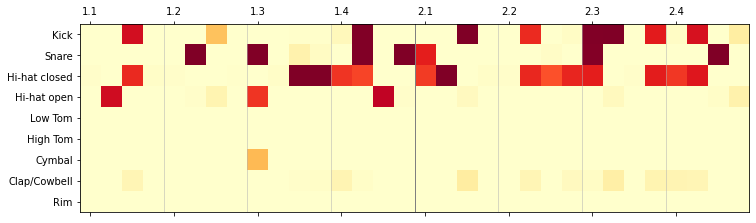

epoch: 919
m_d_loss: 0.292095756355454     m_g_loss: 3.995536601904667


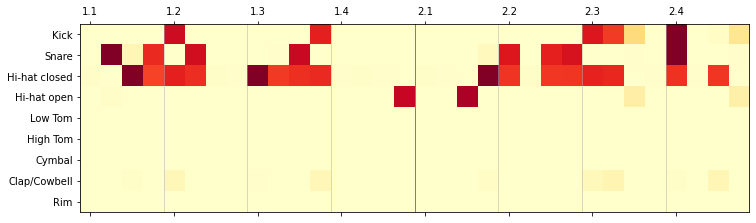

epoch: 920
m_d_loss: 0.29373220186680554     m_g_loss: 4.039549762552435


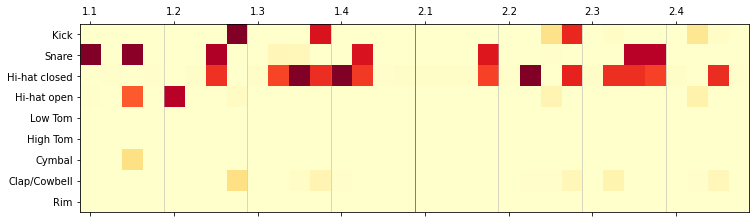

epoch: 921
m_d_loss: 0.2918689426253824     m_g_loss: 4.044383684794108


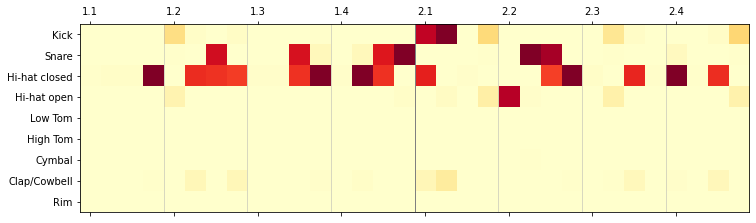

epoch: 922
m_d_loss: 0.2972090745344758     m_g_loss: 3.9975805138096665


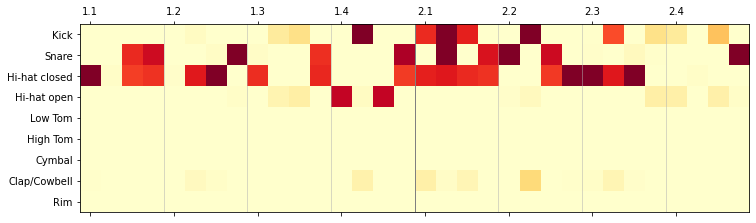

epoch: 923
m_d_loss: 0.29477738404975223     m_g_loss: 4.034429275628292


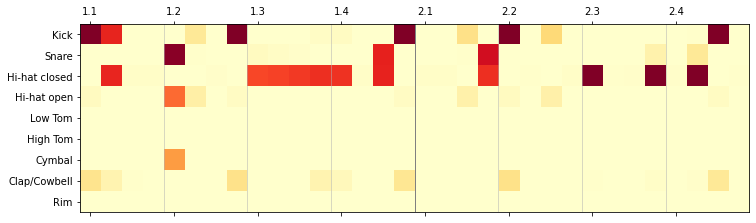

epoch: 924
m_d_loss: 0.2858839277178049     m_g_loss: 4.004516782182636


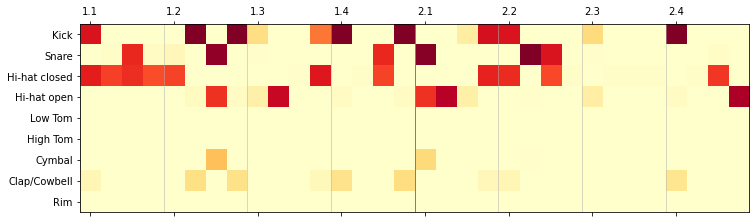

epoch: 925
m_d_loss: 0.29620164492551015     m_g_loss: 4.003674124226426


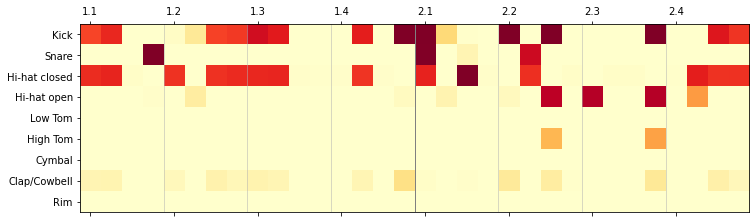

epoch: 926
m_d_loss: 0.2918228704482317     m_g_loss: 4.1196065165779805


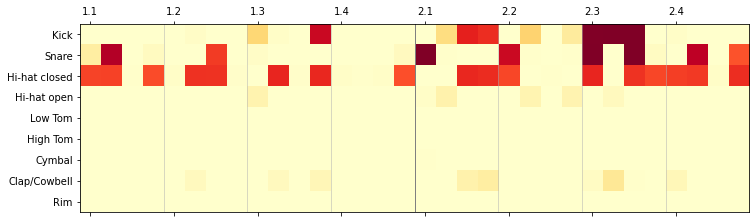

epoch: 927
m_d_loss: 0.2952104237149743     m_g_loss: 4.061413396488536


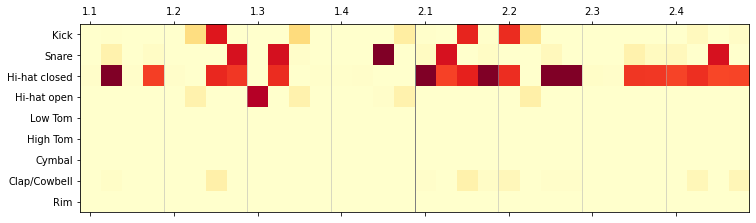

epoch: 928
m_d_loss: 0.29463008940219876     m_g_loss: 4.0045052152691465


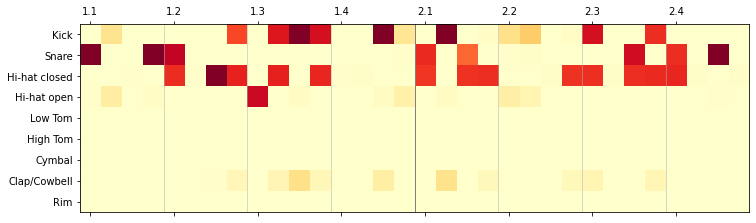

epoch: 929
m_d_loss: 0.2912900233969969     m_g_loss: 4.07487694422404


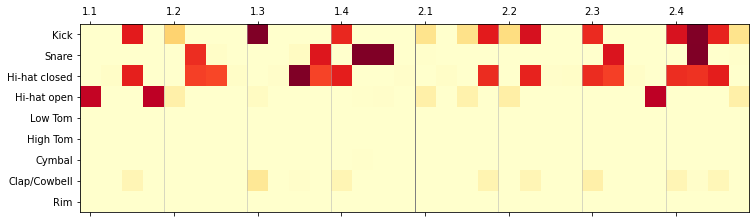

epoch: 930
m_d_loss: 0.2979797830805182     m_g_loss: 3.978306445208463


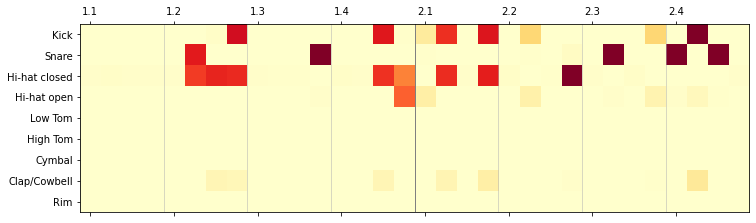

epoch: 931
m_d_loss: 0.3021812353064033     m_g_loss: 3.9844882488250732


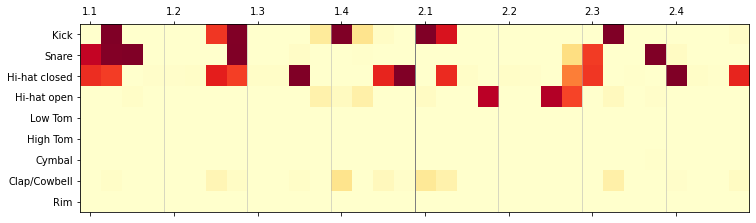

epoch: 932
m_d_loss: 0.29139779619872574     m_g_loss: 4.074621128313469


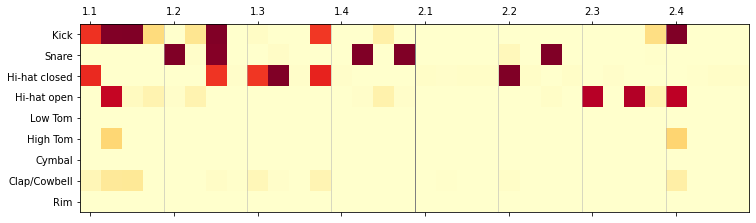

epoch: 933
m_d_loss: 0.29258563676301164     m_g_loss: 4.04586453148813


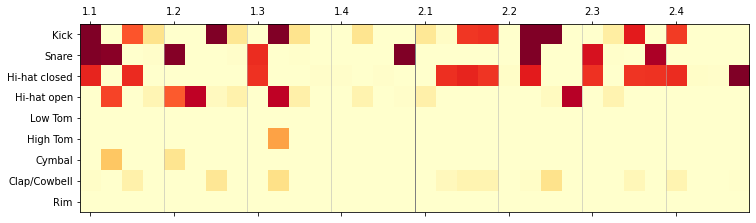

epoch: 934
m_d_loss: 0.2904882438480854     m_g_loss: 4.000302661548961


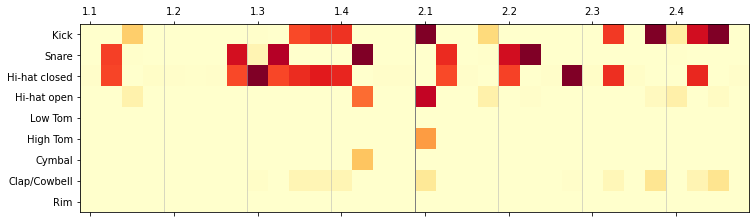

epoch: 935
m_d_loss: 0.2889935006113613     m_g_loss: 4.080512061263576


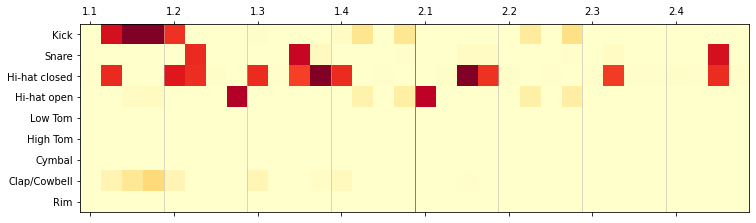

epoch: 936
m_d_loss: 0.29042694307863715     m_g_loss: 4.021601077282067


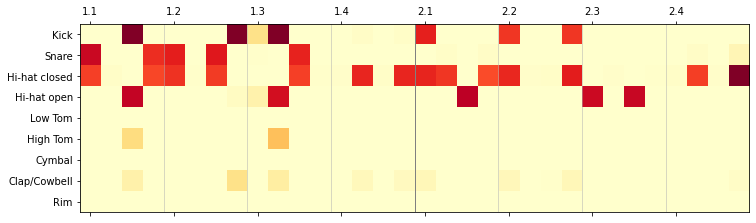

epoch: 937
m_d_loss: 0.2926556382109137     m_g_loss: 4.09067752867034


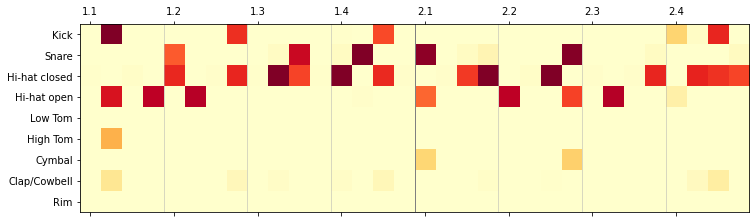

epoch: 938
m_d_loss: 0.29852575864642855     m_g_loss: 4.07839314142863


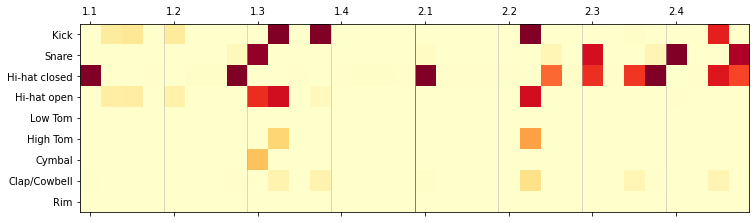

epoch: 939
m_d_loss: 0.2993288816774592     m_g_loss: 4.046221646395597


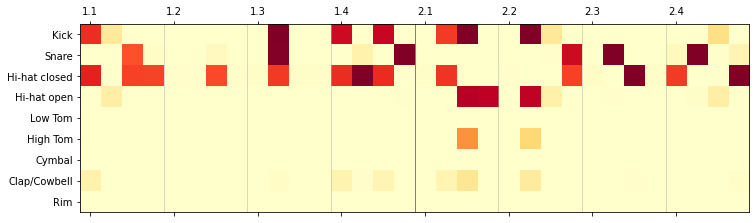

epoch: 940
m_d_loss: 0.2967558609321713     m_g_loss: 4.0235349481756035


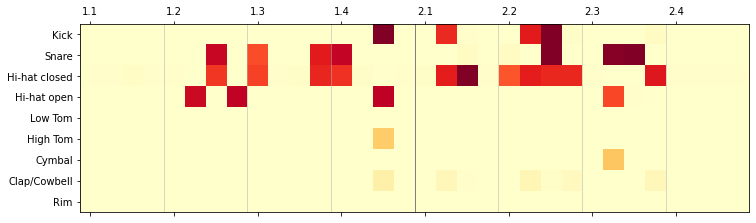

epoch: 941
m_d_loss: 0.30002088318852815     m_g_loss: 4.05352926976753


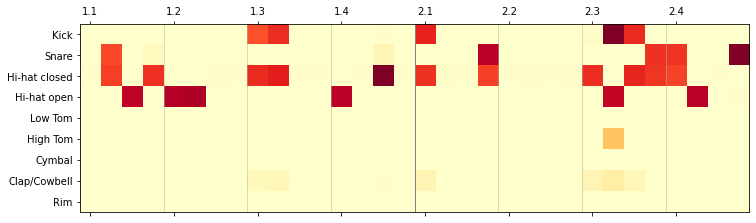

epoch: 942
m_d_loss: 0.2933867786079645     m_g_loss: 3.965686386281794


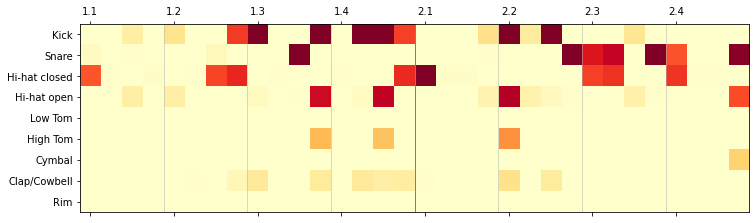

epoch: 943
m_d_loss: 0.2902043284738765     m_g_loss: 4.02613554578839


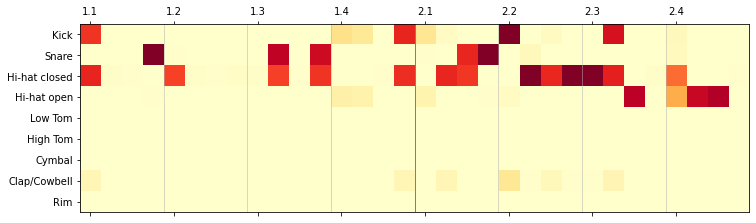

epoch: 944
m_d_loss: 0.29155808389186855     m_g_loss: 4.026903528155702


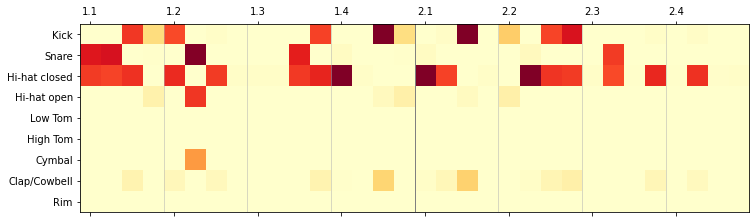

epoch: 945
m_d_loss: 0.29521062584484326     m_g_loss: 3.9012524142409815


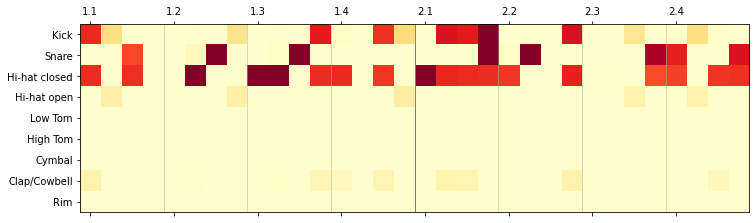

epoch: 946
m_d_loss: 0.2978805851191283     m_g_loss: 4.037396040829745


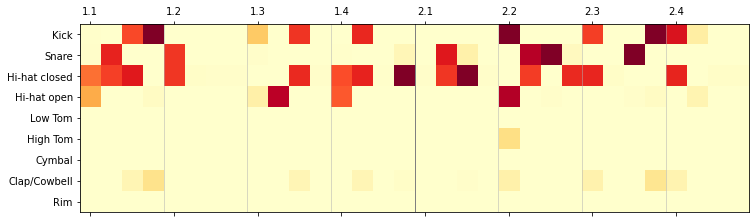

epoch: 947
m_d_loss: 0.293130822392071     m_g_loss: 3.967723665815411


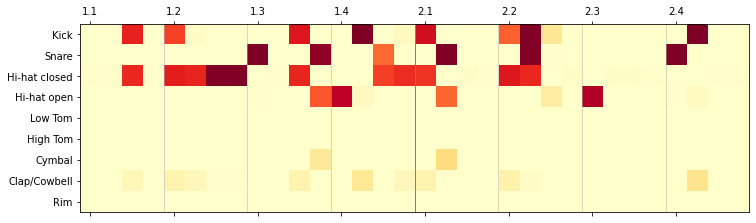

epoch: 948
m_d_loss: 0.29307818952947856     m_g_loss: 4.009714791269014


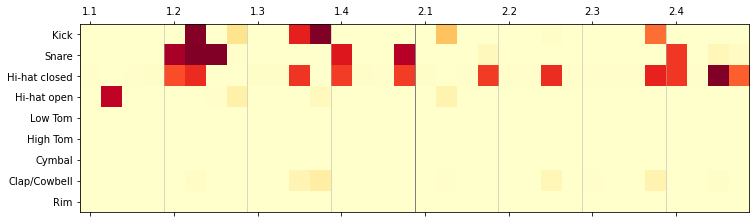

epoch: 949
m_d_loss: 0.2910327490638284     m_g_loss: 4.018676974556663


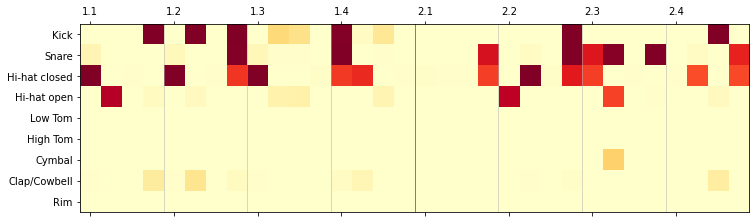

epoch: 950
m_d_loss: 0.29119831286370756     m_g_loss: 3.9627237681186562


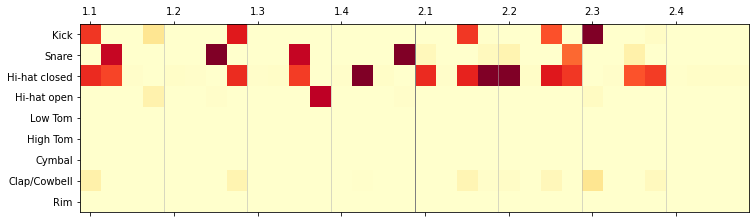

epoch: 951
m_d_loss: 0.29343667047865246     m_g_loss: 3.9397494576194068


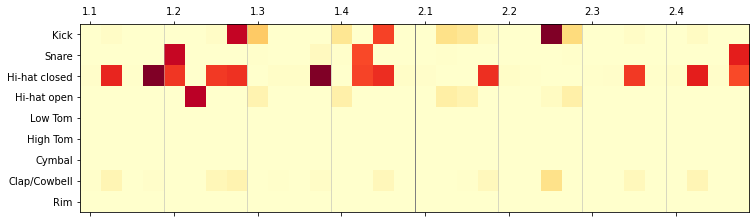

epoch: 952
m_d_loss: 0.2934751871973276     m_g_loss: 3.9735957564729634


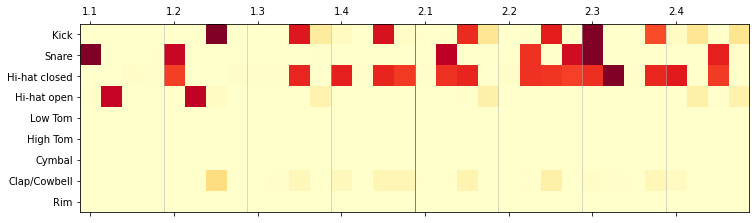

epoch: 953
m_d_loss: 0.3012191844337127     m_g_loss: 4.074738928765962


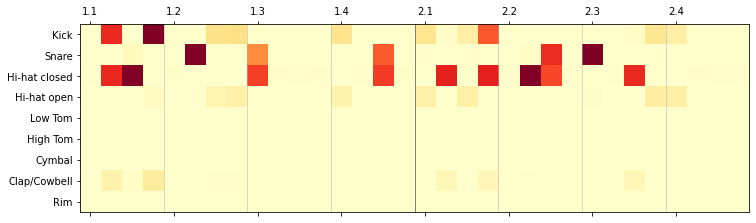

epoch: 954
m_d_loss: 0.2893371438607574     m_g_loss: 4.059556368625525


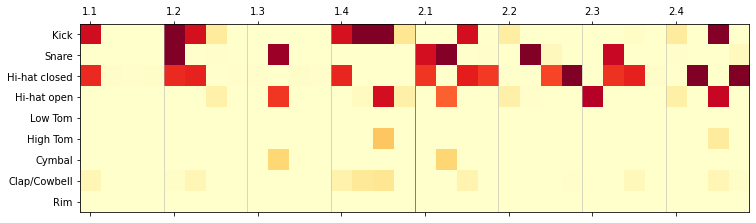

epoch: 955
m_d_loss: 0.29033578792039083     m_g_loss: 3.969812768878359


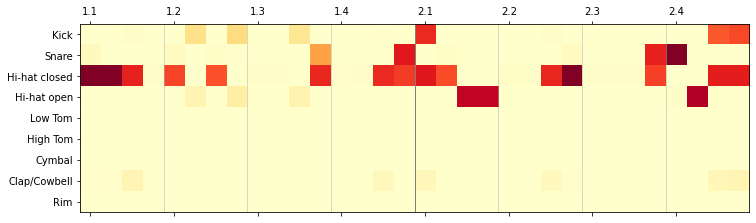

epoch: 956
m_d_loss: 0.2987650604918599     m_g_loss: 4.0477109750111895


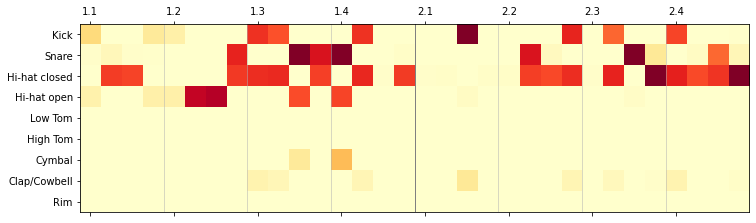

epoch: 957
m_d_loss: 0.2934505211956361     m_g_loss: 4.067336711016568


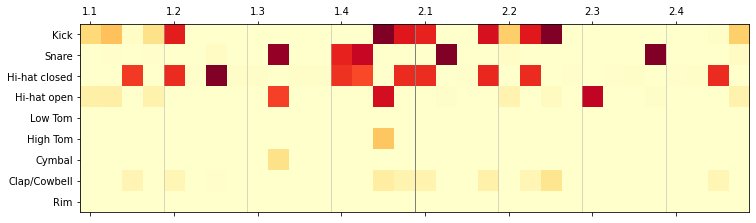

epoch: 958
m_d_loss: 0.2936337266117334     m_g_loss: 4.032048991232207


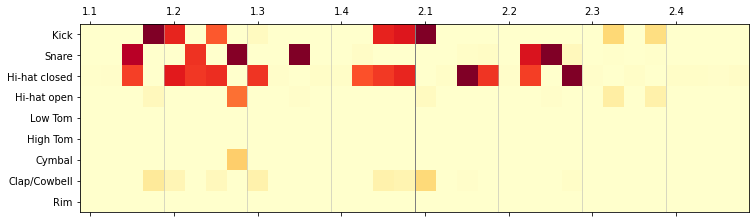

epoch: 959
m_d_loss: 0.29647129230639513     m_g_loss: 4.046985257755626


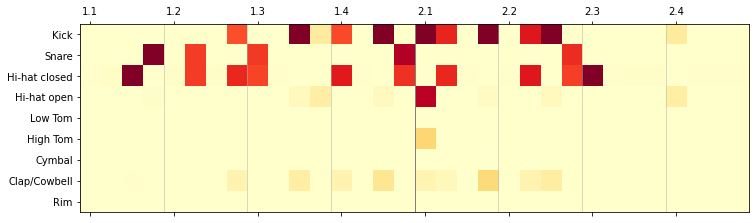

epoch: 960
m_d_loss: 0.28859720788896087     m_g_loss: 4.013077699776852


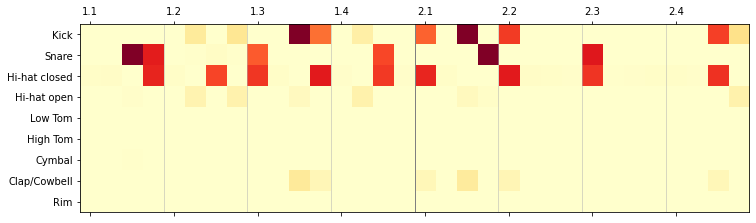

epoch: 961
m_d_loss: 0.29905420278801637     m_g_loss: 4.109620368841923


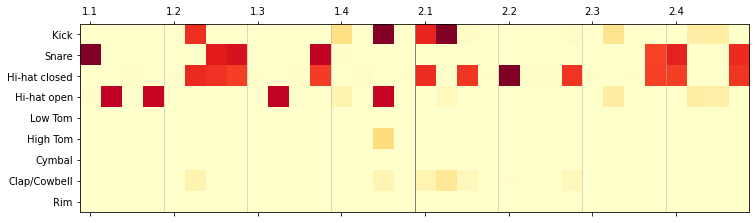

epoch: 962
m_d_loss: 0.29408916011452674     m_g_loss: 3.86442570252852


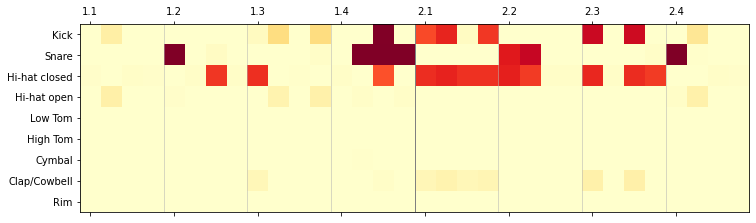

epoch: 963
m_d_loss: 0.30174877257908095     m_g_loss: 4.013890165271181


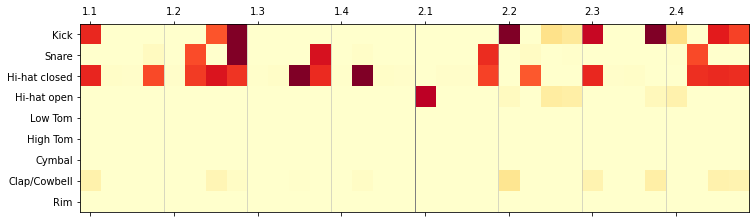

epoch: 964
m_d_loss: 0.30195625815540555     m_g_loss: 3.9635062940192944


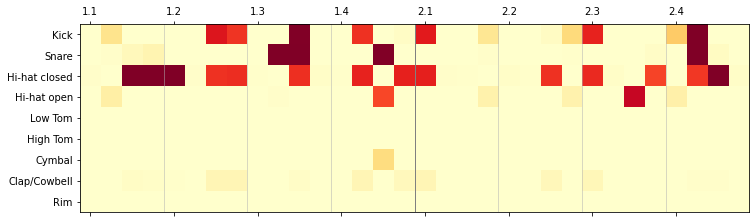

epoch: 965
m_d_loss: 0.29181812896448023     m_g_loss: 3.9802979411500874


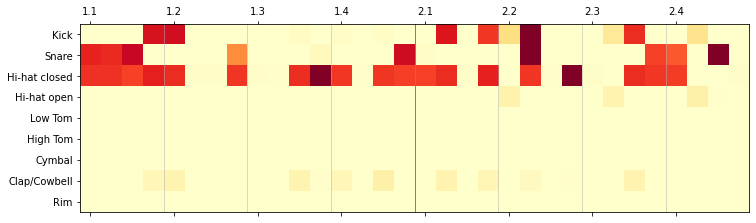

epoch: 966
m_d_loss: 0.2950527437031269     m_g_loss: 3.9369002038782295


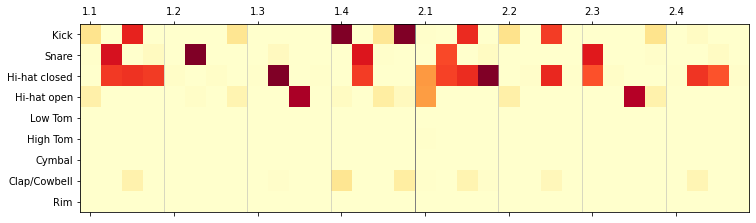

epoch: 967
m_d_loss: 0.30565631091594686     m_g_loss: 3.988158876245672


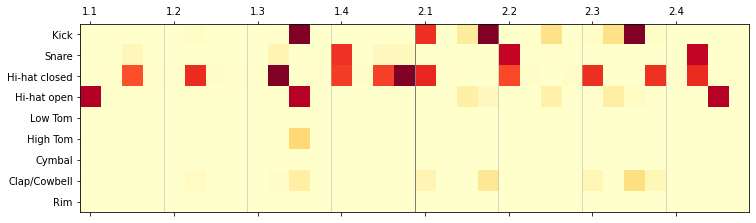

epoch: 968
m_d_loss: 0.29862858094275     m_g_loss: 4.0501899646990225


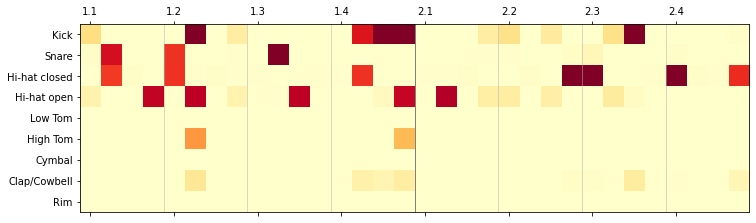

epoch: 969
m_d_loss: 0.2991145631846259     m_g_loss: 4.046583804217252


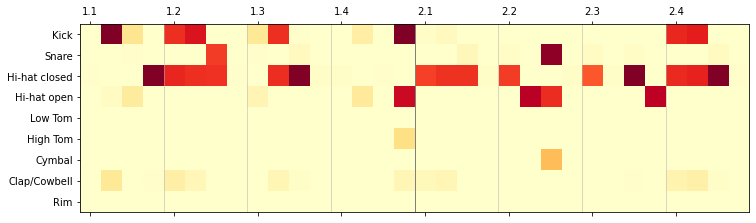

epoch: 970
m_d_loss: 0.29264303985983137     m_g_loss: 4.055055842255101


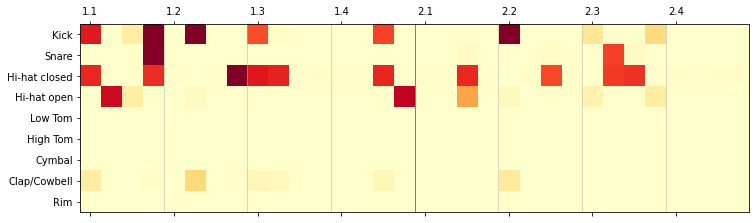

epoch: 971
m_d_loss: 0.2906715985606698     m_g_loss: 4.06367859695897


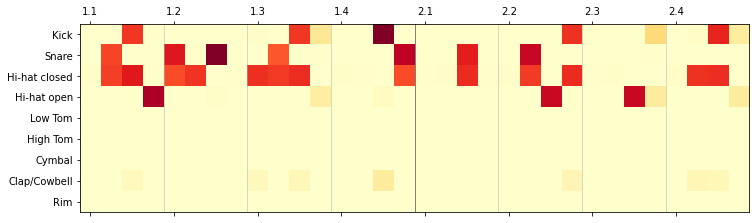

epoch: 972
m_d_loss: 0.2957232035696506     m_g_loss: 4.008381612373121


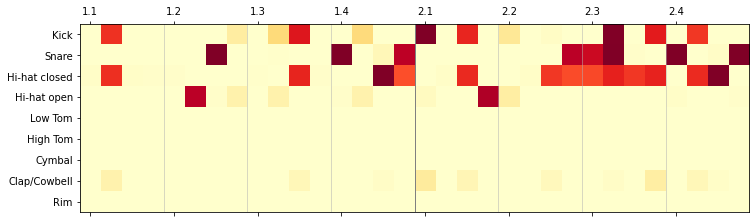

epoch: 973
m_d_loss: 0.2932992123505649     m_g_loss: 3.979559161446311


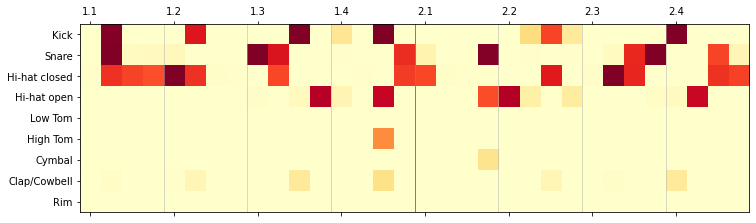

epoch: 974
m_d_loss: 0.2919995972886682     m_g_loss: 3.956028497580326


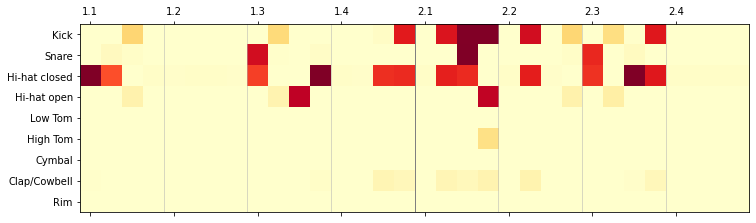

epoch: 975
m_d_loss: 0.30249427451806915     m_g_loss: 4.102877392913356


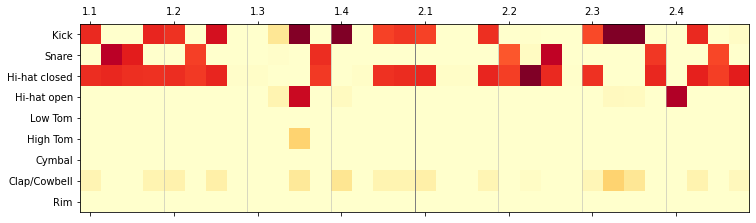

epoch: 976
m_d_loss: 0.29314820766448973     m_g_loss: 3.9756599484067974


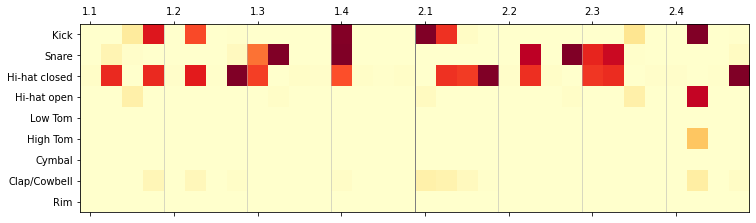

epoch: 977
m_d_loss: 0.2970677707125159     m_g_loss: 4.002353263623787


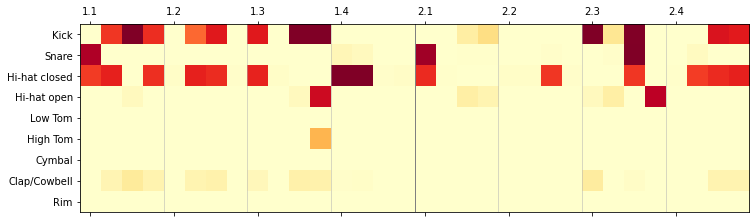

epoch: 978
m_d_loss: 0.29827357847243546     m_g_loss: 4.006639119350549


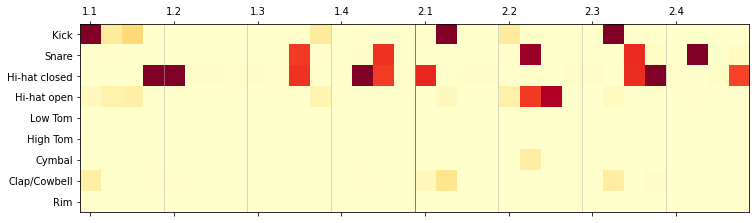

epoch: 979
m_d_loss: 0.3012420480742174     m_g_loss: 3.9575880007310347


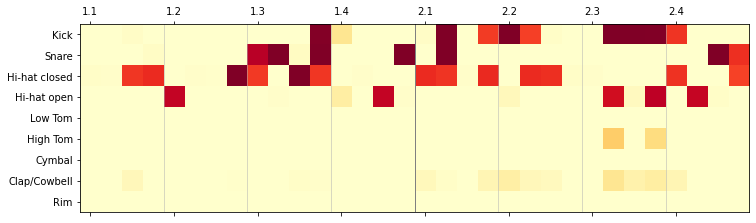

epoch: 980
m_d_loss: 0.2956153921782971     m_g_loss: 3.965822292096687


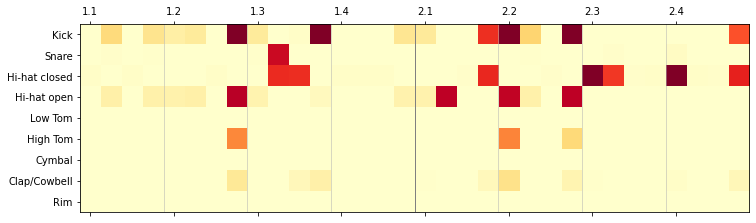

epoch: 981
m_d_loss: 0.29912554306142475     m_g_loss: 4.087132128802213


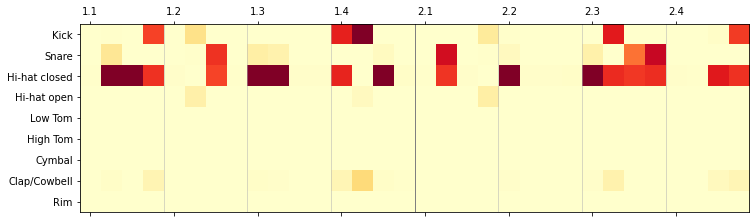

epoch: 982
m_d_loss: 0.28658280707895756     m_g_loss: 4.055205005587953


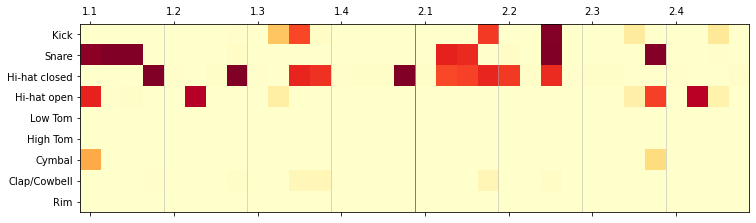

epoch: 983
m_d_loss: 0.2932613441172768     m_g_loss: 4.019607825712725


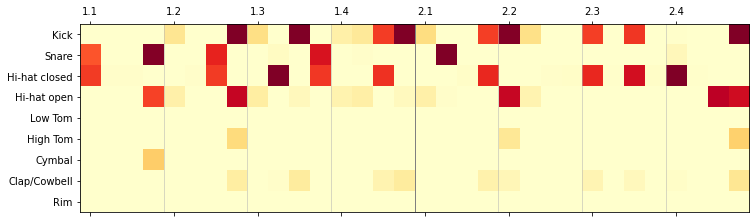

epoch: 984
m_d_loss: 0.2939603943377734     m_g_loss: 3.9263776576880254


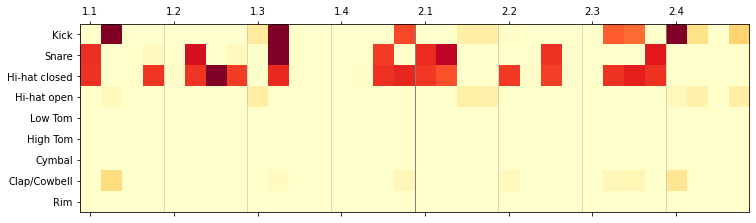

epoch: 985
m_d_loss: 0.2936031753526014     m_g_loss: 3.930485804875692


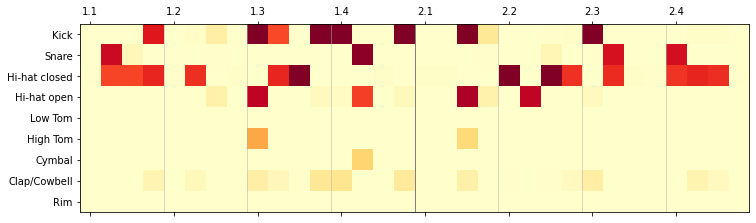

epoch: 986
m_d_loss: 0.29538685195147996     m_g_loss: 3.9688151532953437


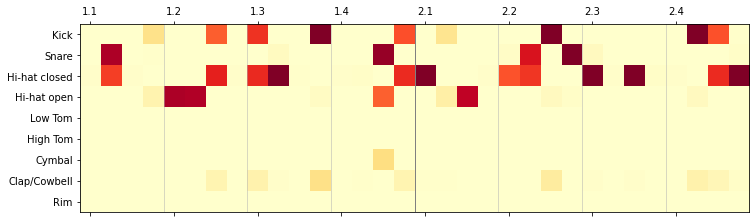

epoch: 987
m_d_loss: 0.2896602053852642     m_g_loss: 4.0520421519423975


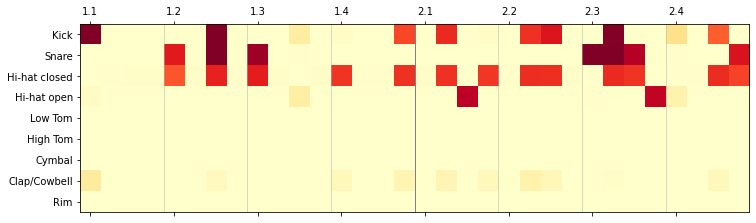

epoch: 988
m_d_loss: 0.2872005470097065     m_g_loss: 4.012061169653228


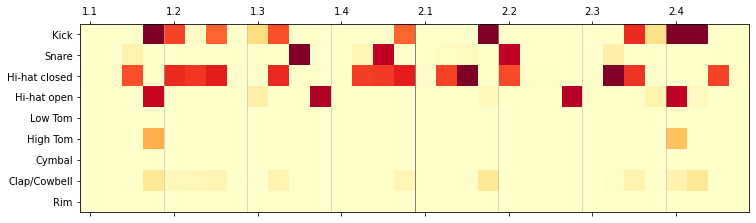

epoch: 989
m_d_loss: 0.29308291217860055     m_g_loss: 3.9975135109641333


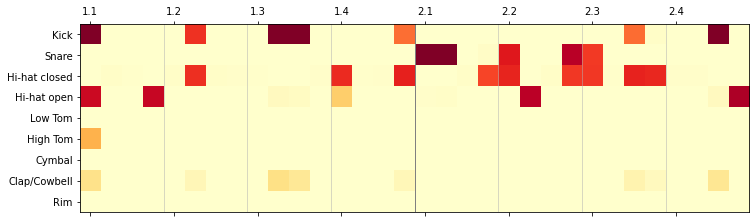

epoch: 990
m_d_loss: 0.2974756330251694     m_g_loss: 4.074561790986494


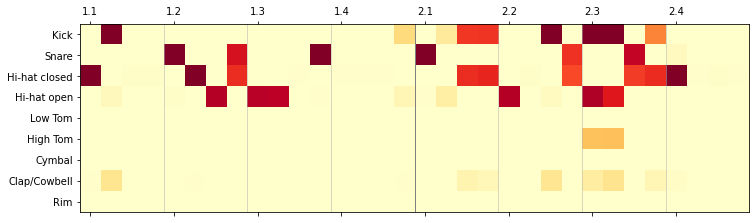

epoch: 991
m_d_loss: 0.30254745500929225     m_g_loss: 4.075412020538792


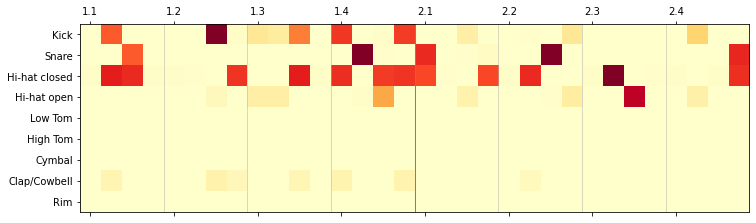

epoch: 992
m_d_loss: 0.2888942126184702     m_g_loss: 3.9746601870565703


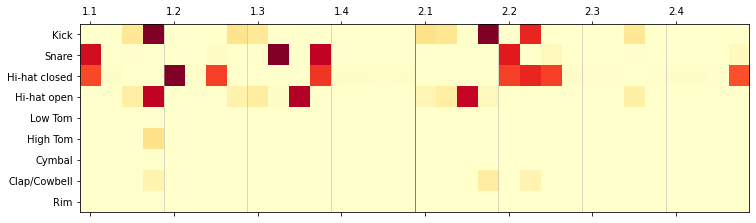

epoch: 993
m_d_loss: 0.29509825513643373     m_g_loss: 3.9893452470952813


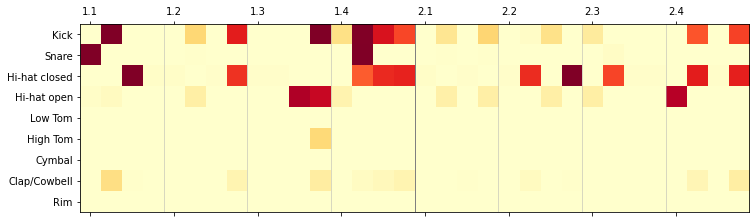

epoch: 994
m_d_loss: 0.2987437959760427     m_g_loss: 4.005242376616507


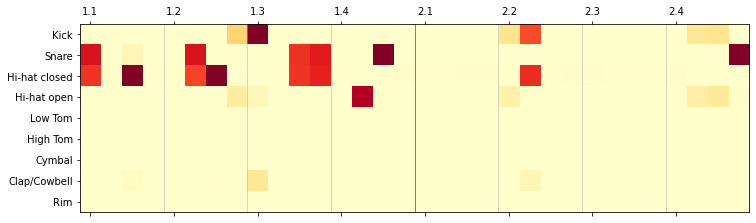

epoch: 995
m_d_loss: 0.29503044924315286     m_g_loss: 3.9157064611261543


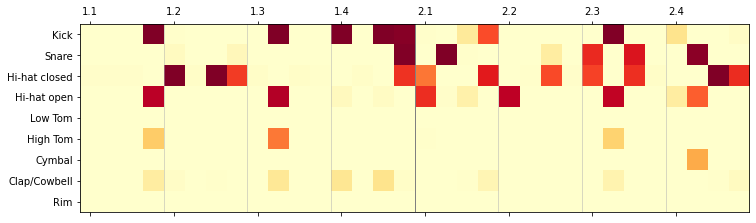

epoch: 996
m_d_loss: 0.29471532218158253     m_g_loss: 4.003251039620602


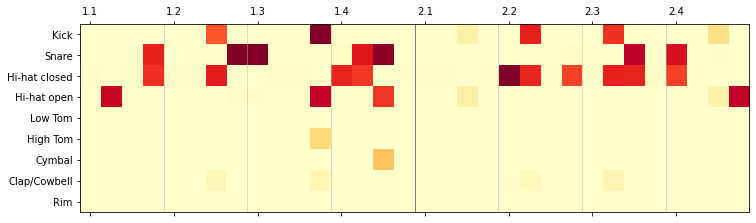

epoch: 997
m_d_loss: 0.28973234926953034     m_g_loss: 3.9598726792769


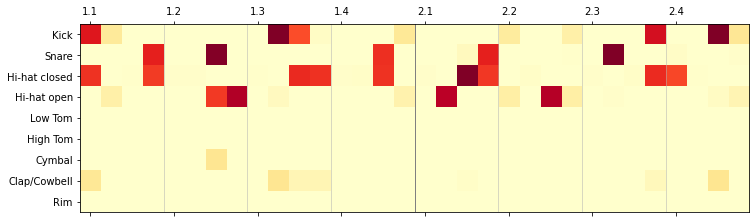

epoch: 998
m_d_loss: 0.2980154573917389     m_g_loss: 4.083734562902739


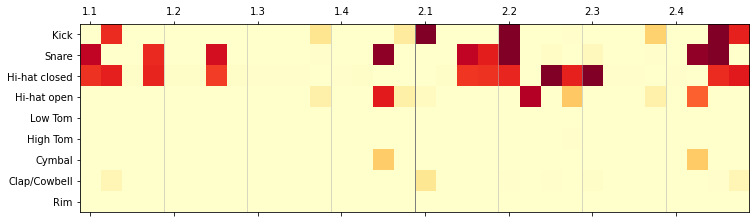

epoch: 999
m_d_loss: 0.29293692585299996     m_g_loss: 3.972334572763154


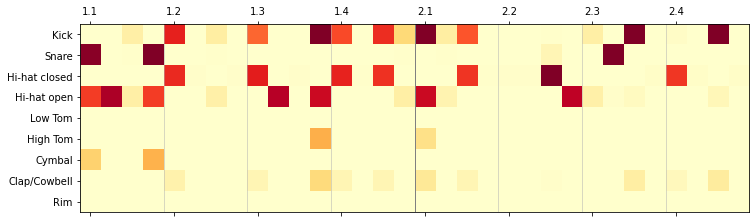

In [66]:
generator_model = generator(batch_size=batch_size).to(device)
discriminator_model = discriminator().to(device)
optimizer_d = optim.Adam(discriminator_model.parameters(), lr=0.0001,betas=(0.9, 0.999),eps=1e-07)
optimizer_g = optim.Adam(generator_model.parameters(), lr=0.001,betas=(0.9, 0.999),eps=1e-07)
scheduler_d = optim.lr_scheduler.StepLR(optimizer_d, step_size=100,gamma = 0.5)
scheduler_g = optim.lr_scheduler.StepLR(optimizer_g, step_size=100,gamma = 0.5)

for epoch in range(0,MAX_EPOCH):
  discriminator_model.train()
  generator_model.train()
  manager_train.reset()
      # for i, (drum,label) in tqdm(enumerate(train_loader), total=len(train_loader), smoothing=0.9):
  nb_steps = int(len(drum_dataset)/batch_size)
  for repeat in range(nb_steps):
    #Train D
    if(train_d):
      m_d_loss = 0.0
      for i in range(K_unrolled_d):
        subset_indices = np.random.randint(low = 0, high= len(drum_dataset), size=batch_size)            

        drum,label = drum_dataset.__getitem__(subset_indices)
        drum,label = drum.to(device),label.to(device)
        valid = Variable(torch.FloatTensor(batch_size, 1).fill_(1.0), requires_grad=False).to(device)* 0.9 # one-sided soft labeling
        fake = Variable(torch.FloatTensor(batch_size, 1).fill_(0.0), requires_grad=False).to(device)

        optimizer_d.zero_grad()
        d_pred_real = discriminator_model(drum,label) 
        d_loss_real = f_loss(d_pred_real, valid)
        d_loss_real.backward()
        optimizer_d.step()

        optimizer_d.zero_grad()
        noise = np.random.normal(0.0, 1, size=(batch_size,100))
        noise = torch.FloatTensor(noise).to(device)
        drum_fake = generator_model(noise,label)  
        d_pred_fake = discriminator_model(drum_fake.detach(),label) # detach to avoid training G on these labels
        d_loss_fake = f_loss(d_pred_fake, fake)
        d_loss_fake.backward()
        optimizer_d.step()
        d_loss = (d_loss_fake + d_loss_real) / 2

        # d_loss = (d_loss_real + d_loss_real) / 2

        m_d_loss += d_loss.item()

      m_d_loss /= float(K_unrolled_d)
      manager_train.update('discriminator_loss',m_d_loss)

    #Train G
    if(train_g):
      m_g_loss = 0.0
      for p in discriminator_model.parameters():
        p.requires_grad = False
      for i in range(K_unrolled_g):
          optimizer_g.zero_grad()
          noise = np.random.normal(0.0, 1, size=(batch_size,100))
          noise = torch.FloatTensor(noise).to(device)

          label_random = torch.LongTensor(np.random.randint(0, NB_GENRES, (batch_size,1))).to(device)
          valid = Variable(torch.FloatTensor(batch_size, 1).fill_(1.0), requires_grad=False).to(device)

          drum_fake = generator_model(noise,label_random)

          d_pred_fake = discriminator_model(drum_fake,label_random)

          g_loss = f_loss(d_pred_fake, valid)
          m_g_loss += g_loss.item()
          g_loss.backward()
          optimizer_g.step()
      for p in discriminator_model.parameters():
        p.requires_grad = True
      m_g_loss /= float(K_unrolled_g)
      manager_train.update('generator_loss',m_g_loss)



    if train_d and train_g:
      if(m_g_loss != 0 and m_d_loss != 0):
        if m_g_loss / m_d_loss > MAX_LOSS_RATIO:
            train_d = False
      #                print ("Pausing D")
        elif m_d_loss / m_g_loss > MAX_LOSS_RATIO:
            train_g = False
      #                print ("Pausing G")
      else:
        if(m_g_loss == 0):
            train_g = False
        if(m_d_loss == 0):
            train_d = False
    else:
        train_d = True
        train_g = True


  scheduler_d.step()
  scheduler_g.step()
  summery_dict = manager_train.summary()    
  print("epoch:",epoch)
  print("m_d_loss:",summery_dict['discriminator_loss'],"    m_g_loss:",summery_dict['generator_loss'])
  manager_train.reset()

  #Sample output
  noise = np.random.normal(0.0, 1, size=(batch_size,100))
  noise = torch.FloatTensor(noise).to(device)
  label_random = torch.LongTensor(np.random.randint(0, NB_GENRES, (batch_size,1))).to(device)
  drum_generated = generator_model(noise,label_random)
  drum_generated = drum_generated[0,:,:]
  drum_generated = drum_generated.cpu().data.numpy()
  plot_drum_matrix(drum_generated)



